In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F 
import torch.autograd
from torch.autograd import Variable
import torch.optim as optim
import numpy as np
import gym
from collections import deque
import random
import sys
import pandas as pd
import matplotlib.pyplot as plt
from numpy import cos, sin
from gym import spaces
from gym.error import DependencyNotInstalled
from typing import Optional
from control.matlab import ss, lsim, linspace, c2d
from functools import partial
from state_estimation import Estimator
import math
import gym
from stable_baselines3 import PPO, SAC, TD3, DDPG, DQN, A2C
from stable_baselines3.common.env_checker import check_env

In [2]:
import os
os.environ["KMP_DUPLICATE_LIB_OK"]="TRUE"

In [3]:
class DCEnv(gym.Env):
    metadata = {
        "render_modes": ["human", "rgb_array"],
        "render_fps": 30,
    }

    def __init__(self, render_mode: Optional[str] = None, g=10.0):
        super(DCEnv, self).__init__()
        self.max_speed = -10
        self.max_torque = 10
        self.dt = 0.05

        self.render_mode = render_mode

        self.screen_dim = 500
        self.screen = None
        self.clock = None
        self.isopen = True
        self.center = np.array([math.pi / 2.0, 0, 0])
        count = 0
        J = 0.01
        b = 0.1
        K = 0.01
        R = 1
        L = 0.5
        self.A = np.array([[0, 1, 0],
         [0, -b / J, K / J],
         [0, -K / L, -R / L]])
        self.A_dim = len(self.A)
        self.B = np.array([[0], [0], [1 / L]])
        self.xmeasure = 0
        self.attacked_element_idx = 0
        self.C = np.array([[1, 0, 0]])
        self.D = np.array([[0]])
        self.Q = np.eye(self.A_dim)
        self.R = np.array([[1]])
        self.dt = 0.2
        self.x_ref = np.array([[0], [0], [0]]) # 4th dim is remaining steps
        # store current trace
        self.cache1 = []
        self.cache2 = []
        self.cache3 = []
        self.x0 = np.copy(self.x_ref)
        self.u_upbound_tuned = np.array([[10]])
        # ball radius
        self.target_norm_radius = 0.5 # norm ball radius of target, tune this
        self.safe_norm_radius = 1 # norm ball radius of safe, tune this
        self.total_time = 120
        # step number
        self.steps = 0
        self.u_lowbound = None
        # store training traces
        self.state_array_1 = []
        self.state_array_2 = []
        self.state_array_3 = []
        self.caches = []
        self.reward_cache = [] # cache distances to target norm ball center
        self.final_reward_cache = [] # cache final reward
        # How long should this trace be, i.e. deadline
        self.step_const = random.randint(10, 50)
        # Maximum reward from each trace
        self.max_reward_list = []
        self.quality_list = []
        self.total_steps = 0
        self.step_history = []
        self.sysc = ss(self.A, self.B, self.C, self.D)
        self.sysd = c2d(self.sysc, self.dt)
        
        high = np.array(self.x_ref.flatten(), dtype=np.float32)
        self.action_space = spaces.Box(
            low=-self.max_torque, high=self.max_torque, shape=(1,), dtype=np.float32
        )
        self.observation_space = spaces.Box(low=-high, high=high, dtype=np.float32)
        self.reached = False
        self.k = 20
    def step(self, u):
        
        # simulate next step and get measurement
        self.steps += 1
        self.total_steps += 1
        terminated = False
        dt = self.dt
        u = np.clip(u, -self.max_torque, self.max_torque)[0]
        self.last_u = u 
        costs = 1
        yout, T, xout = lsim(self.sysc, self.last_u, [0, self.dt], self.xmeasure)
        self.xmeasure = xout[-1]
        
        # calculate euclidean distance and update reward cache
        dist = np.linalg.norm(self.xmeasure - self.center)
        reward = self.target_norm_radius - dist
        self.reward_cache.append(reward)
        
        # quantitative semantics
        # reach reward, encourage reaching target
        if self.steps < 10:
            reach_reward = max(self.reward_cache)
        else:
            reach_reward = max(self.reward_cache[-10:])
            
        # approach reward, encourage approaching towards target
        if self.steps == 1:
            approach_reward = 0
        else:
            approach_reward = min([self.reward_cache[-(i+1)] - self.reward_cache[-i] for i in range(1, self.steps)])
            
        # avoid reward, encourage avoiding unsafe
        avoid_reward = min([self.reward_cache[i] - self.target_norm_radius + self.safe_norm_radius for i in range(0, self.steps)])
        
#         # very strict reward, always within target
#         strict_avoid_reward = avoid_reward - 0.5 * self.safe_norm_radius # half safe norm radius
#         strict_reach_reward = reach_reward - 0.5 * self.target_norm_radius # half target norm radius
        
        # overall reward, pick one of the final_reward
#         final_reward = reach_reward
#         final_reward = approach_reward
#         final_reward = min(reach_reward, avoid_reward) # reach and avoid
#         final_reward = min(approach_reward, avoid_reward) # approach and avoid
#         final_reward = min(reach_reward, approach_reward) # reach and approach
#         deadline_reward = (self.last_dist-dist)/(self.step_const - self.steps+1) 
        final_reward = reach_reward # reach and approach and avoid

        # split cases: if already inside target, give very large constant reward for maintaining
        if dist <= self.target_norm_radius:
            final_reward = 10 # this gives 39/50 sucess with reach+approach+avoid
        
        self.final_reward_cache.append(final_reward)
        
        # update cached memory
        self.state = self.xmeasure
        self.state_array_1.append(self.state[0])
        self.state_array_2.append(self.state[1])
        self.state_array_3.append(self.state[2])
        self.cache1.append(self.state[0])
        self.cache2.append(self.state[1])
        self.cache3.append(self.state[2])
        self.last_dist = dist
        # If this is the last step, reset the state
        if self.steps == self.step_const:
            self.max_reward_list.append(max(self.final_reward_cache)) # use max final reward to measure episodes
            self.step_history.append(self.total_steps)
            self.quality_list.append(sum(self.final_reward_cache))
            terminated = True
            self.reset()
            
#         # If within target norm ball, early terminate
#         if dist <= self.target_norm_radius:
#             terminated = True
#             self.reset()
        
        # Return next state, reward, done, info
        return self._get_obs(), final_reward, terminated, {}
        
    def reset(self):
        self.state = np.array([random.random()*math.pi, random.random()*2-1, random.random()*20-10])
        self.reward_cache = []
        self.final_reward_cache = []
        self.steps=0
        self.caches.append(self.cache1)
        self.caches.append(self.cache2)
        self.caches.append(self.cache3)
        self.cache1 = []
        self.cache2 = []
        self.cache3 = []
        self.xmeasure = self.state
        # random # of steps for this trace
        self.step_const = self.k # deadline range
        self.reached = False
        return np.array(self.state) # return something matching shape
    
    def _get_obs(self):
        current_state = list(self.state)
        return np.array(current_state)
    
    def render(self):
        return
    
    def close(self):
        if self.screen is not None:
            import pygame
            pygame.display.quit()
            pygame.quit()
            self.isopen = False

In [5]:
# Training
reached = []
for k in [10,20,40,80,160]:
    env = DCEnv()
    env.k = k
    # learning_rate = 1e-3, n_steps = 1024, tune these
    model = SAC("MlpPolicy", env, verbose=1)
    model.learn(total_timesteps=300000, progress_bar=False)
    vec_env = model.get_env()
    obs = vec_env.reset()
    # Test 50 traces
    env = DCEnv()
    env.k = 160
    state = env.reset()
    dims0 = []
    dims1 = []
    dims2 = []
    euclids = []
    center = np.array([math.pi / 2.0, 0, 0])
    num_reached = 0
    for j in range(1000):
        dim0 = []
        dim1 = []
        dim2 = []
        euclid = []
        state = env.reset()
        # Print initial state
        for i in range(30):
            action, _states = model.predict(state, deterministic=True)
            new_state, reward, done, _ = env.step(action)
            dim0.append(state[0])
            dim1.append(state[1])
            dim2.append(state[2])
            dist = np.linalg.norm(state[:3]-center)
            euclid.append(dist)
            state = new_state
            if dist <= 0.5: # stop
                num_reached += 1
                break
        dims0.append(dim0)
        dims1.append(dim1)
        dims2.append(dim2)
        euclids.append(euclid)
    ref= [math.pi/2]*30
    reached.append(num_reached)
print(reached)

Using cpu device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | -5.06    |
| time/              |          |
|    episodes        | 4        |
|    fps             | 1068     |
|    time_elapsed    | 0        |
|    total_timesteps | 40       |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | -6.22    |
| time/              |          |
|    episodes        | 8        |
|    fps             | 1075     |
|    time_elapsed    | 0        |
|    total_timesteps | 80       |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | -10.5    |
| time/              |          |
|    episodes        | 12       |
|    fps             |

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | -4.15    |
| time/              |          |
|    episodes        | 64       |
|    fps             | 72       |
|    time_elapsed    | 8        |
|    total_timesteps | 640      |
| train/             |          |
|    actor_loss      | -1       |
|    critic_loss     | 2.75     |
|    ent_coef        | 0.862    |
|    ent_coef_loss   | -0.179   |
|    learning_rate   | 0.0003   |
|    n_updates       | 539      |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | -3.96    |
| time/              |          |
|    episodes        | 68       |
|    fps             | 71       |
|    time_elapsed    | 9        |
|    total_timesteps | 680      |
| train/             |          |
|    actor_loss      | -1.03    |
|    critic_loss     | 3.27     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 3.75     |
| time/              |          |
|    episodes        | 124      |
|    fps             | 66       |
|    time_elapsed    | 18       |
|    total_timesteps | 1240     |
| train/             |          |
|    actor_loss      | -2.52    |
|    critic_loss     | 4.12     |
|    ent_coef        | 0.738    |
|    ent_coef_loss   | -0.299   |
|    learning_rate   | 0.0003   |
|    n_updates       | 1139     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 4.48     |
| time/              |          |
|    episodes        | 128      |
|    fps             | 66       |
|    time_elapsed    | 19       |
|    total_timesteps | 1280     |
| train/             |          |
|    actor_loss      | -3.02    |
|    critic_loss     | 6.86     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 11.2     |
| time/              |          |
|    episodes        | 184      |
|    fps             | 64       |
|    time_elapsed    | 28       |
|    total_timesteps | 1840     |
| train/             |          |
|    actor_loss      | -4.28    |
|    critic_loss     | 9.34     |
|    ent_coef        | 0.654    |
|    ent_coef_loss   | -0.25    |
|    learning_rate   | 0.0003   |
|    n_updates       | 1739     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 10.1     |
| time/              |          |
|    episodes        | 188      |
|    fps             | 64       |
|    time_elapsed    | 29       |
|    total_timesteps | 1880     |
| train/             |          |
|    actor_loss      | -5.28    |
|    critic_loss     | 8.05     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 18.5     |
| time/              |          |
|    episodes        | 244      |
|    fps             | 63       |
|    time_elapsed    | 38       |
|    total_timesteps | 2440     |
| train/             |          |
|    actor_loss      | -9.71    |
|    critic_loss     | 22.7     |
|    ent_coef        | 0.588    |
|    ent_coef_loss   | -0.135   |
|    learning_rate   | 0.0003   |
|    n_updates       | 2339     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 17.9     |
| time/              |          |
|    episodes        | 248      |
|    fps             | 63       |
|    time_elapsed    | 38       |
|    total_timesteps | 2480     |
| train/             |          |
|    actor_loss      | -9.28    |
|    critic_loss     | 21.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 24.3     |
| time/              |          |
|    episodes        | 304      |
|    fps             | 63       |
|    time_elapsed    | 48       |
|    total_timesteps | 3040     |
| train/             |          |
|    actor_loss      | -11.3    |
|    critic_loss     | 33.3     |
|    ent_coef        | 0.538    |
|    ent_coef_loss   | -0.213   |
|    learning_rate   | 0.0003   |
|    n_updates       | 2939     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 22.7     |
| time/              |          |
|    episodes        | 308      |
|    fps             | 63       |
|    time_elapsed    | 48       |
|    total_timesteps | 3080     |
| train/             |          |
|    actor_loss      | -12.4    |
|    critic_loss     | 29.1     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 23.5     |
| time/              |          |
|    episodes        | 364      |
|    fps             | 62       |
|    time_elapsed    | 58       |
|    total_timesteps | 3640     |
| train/             |          |
|    actor_loss      | -17.8    |
|    critic_loss     | 66.1     |
|    ent_coef        | 0.515    |
|    ent_coef_loss   | 0.0293   |
|    learning_rate   | 0.0003   |
|    n_updates       | 3539     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 23       |
| time/              |          |
|    episodes        | 368      |
|    fps             | 62       |
|    time_elapsed    | 58       |
|    total_timesteps | 3680     |
| train/             |          |
|    actor_loss      | -14.6    |
|    critic_loss     | 76.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 20.6     |
| time/              |          |
|    episodes        | 424      |
|    fps             | 62       |
|    time_elapsed    | 68       |
|    total_timesteps | 4240     |
| train/             |          |
|    actor_loss      | -18.5    |
|    critic_loss     | 57.5     |
|    ent_coef        | 0.525    |
|    ent_coef_loss   | -0.0194  |
|    learning_rate   | 0.0003   |
|    n_updates       | 4139     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 20.5     |
| time/              |          |
|    episodes        | 428      |
|    fps             | 62       |
|    time_elapsed    | 68       |
|    total_timesteps | 4280     |
| train/             |          |
|    actor_loss      | -16.9    |
|    critic_loss     | 104      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 24.6     |
| time/              |          |
|    episodes        | 484      |
|    fps             | 62       |
|    time_elapsed    | 77       |
|    total_timesteps | 4840     |
| train/             |          |
|    actor_loss      | -19.8    |
|    critic_loss     | 104      |
|    ent_coef        | 0.532    |
|    ent_coef_loss   | -0.0184  |
|    learning_rate   | 0.0003   |
|    n_updates       | 4739     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 26.7     |
| time/              |          |
|    episodes        | 488      |
|    fps             | 62       |
|    time_elapsed    | 78       |
|    total_timesteps | 4880     |
| train/             |          |
|    actor_loss      | -19.5    |
|    critic_loss     | 135      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 27.7     |
| time/              |          |
|    episodes        | 544      |
|    fps             | 61       |
|    time_elapsed    | 87       |
|    total_timesteps | 5440     |
| train/             |          |
|    actor_loss      | -21.5    |
|    critic_loss     | 45.6     |
|    ent_coef        | 0.542    |
|    ent_coef_loss   | 0.0517   |
|    learning_rate   | 0.0003   |
|    n_updates       | 5339     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 27.4     |
| time/              |          |
|    episodes        | 548      |
|    fps             | 61       |
|    time_elapsed    | 88       |
|    total_timesteps | 5480     |
| train/             |          |
|    actor_loss      | -24.5    |
|    critic_loss     | 121      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 31       |
| time/              |          |
|    episodes        | 604      |
|    fps             | 62       |
|    time_elapsed    | 97       |
|    total_timesteps | 6040     |
| train/             |          |
|    actor_loss      | -25.6    |
|    critic_loss     | 173      |
|    ent_coef        | 0.604    |
|    ent_coef_loss   | -0.0153  |
|    learning_rate   | 0.0003   |
|    n_updates       | 5939     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 31.8     |
| time/              |          |
|    episodes        | 608      |
|    fps             | 62       |
|    time_elapsed    | 98       |
|    total_timesteps | 6080     |
| train/             |          |
|    actor_loss      | -27.3    |
|    critic_loss     | 171      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 19.9     |
| time/              |          |
|    episodes        | 664      |
|    fps             | 61       |
|    time_elapsed    | 107      |
|    total_timesteps | 6640     |
| train/             |          |
|    actor_loss      | -28.9    |
|    critic_loss     | 81.5     |
|    ent_coef        | 0.678    |
|    ent_coef_loss   | -0.0315  |
|    learning_rate   | 0.0003   |
|    n_updates       | 6539     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 19.9     |
| time/              |          |
|    episodes        | 668      |
|    fps             | 61       |
|    time_elapsed    | 107      |
|    total_timesteps | 6680     |
| train/             |          |
|    actor_loss      | -28.8    |
|    critic_loss     | 106      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 18.4     |
| time/              |          |
|    episodes        | 724      |
|    fps             | 61       |
|    time_elapsed    | 116      |
|    total_timesteps | 7240     |
| train/             |          |
|    actor_loss      | -28.8    |
|    critic_loss     | 121      |
|    ent_coef        | 0.712    |
|    ent_coef_loss   | -0.0139  |
|    learning_rate   | 0.0003   |
|    n_updates       | 7139     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 21.5     |
| time/              |          |
|    episodes        | 728      |
|    fps             | 61       |
|    time_elapsed    | 117      |
|    total_timesteps | 7280     |
| train/             |          |
|    actor_loss      | -28.8    |
|    critic_loss     | 165      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 28       |
| time/              |          |
|    episodes        | 784      |
|    fps             | 62       |
|    time_elapsed    | 126      |
|    total_timesteps | 7840     |
| train/             |          |
|    actor_loss      | -29.3    |
|    critic_loss     | 145      |
|    ent_coef        | 0.708    |
|    ent_coef_loss   | -0.0657  |
|    learning_rate   | 0.0003   |
|    n_updates       | 7739     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 27.6     |
| time/              |          |
|    episodes        | 788      |
|    fps             | 61       |
|    time_elapsed    | 127      |
|    total_timesteps | 7880     |
| train/             |          |
|    actor_loss      | -26.7    |
|    critic_loss     | 130      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 25.8     |
| time/              |          |
|    episodes        | 844      |
|    fps             | 62       |
|    time_elapsed    | 136      |
|    total_timesteps | 8440     |
| train/             |          |
|    actor_loss      | -30.6    |
|    critic_loss     | 201      |
|    ent_coef        | 0.652    |
|    ent_coef_loss   | -0.0349  |
|    learning_rate   | 0.0003   |
|    n_updates       | 8339     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 26.2     |
| time/              |          |
|    episodes        | 848      |
|    fps             | 62       |
|    time_elapsed    | 136      |
|    total_timesteps | 8480     |
| train/             |          |
|    actor_loss      | -27.1    |
|    critic_loss     | 135      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 33.4     |
| time/              |          |
|    episodes        | 904      |
|    fps             | 62       |
|    time_elapsed    | 145      |
|    total_timesteps | 9040     |
| train/             |          |
|    actor_loss      | -27.2    |
|    critic_loss     | 137      |
|    ent_coef        | 0.647    |
|    ent_coef_loss   | 0.0589   |
|    learning_rate   | 0.0003   |
|    n_updates       | 8939     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 32.7     |
| time/              |          |
|    episodes        | 908      |
|    fps             | 62       |
|    time_elapsed    | 146      |
|    total_timesteps | 9080     |
| train/             |          |
|    actor_loss      | -30      |
|    critic_loss     | 122      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 28.8     |
| time/              |          |
|    episodes        | 964      |
|    fps             | 62       |
|    time_elapsed    | 155      |
|    total_timesteps | 9640     |
| train/             |          |
|    actor_loss      | -29.9    |
|    critic_loss     | 192      |
|    ent_coef        | 0.652    |
|    ent_coef_loss   | 0.0488   |
|    learning_rate   | 0.0003   |
|    n_updates       | 9539     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 29.5     |
| time/              |          |
|    episodes        | 968      |
|    fps             | 62       |
|    time_elapsed    | 155      |
|    total_timesteps | 9680     |
| train/             |          |
|    actor_loss      | -29.2    |
|    critic_loss     | 138      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 32.6     |
| time/              |          |
|    episodes        | 1024     |
|    fps             | 62       |
|    time_elapsed    | 164      |
|    total_timesteps | 10240    |
| train/             |          |
|    actor_loss      | -27.6    |
|    critic_loss     | 152      |
|    ent_coef        | 0.671    |
|    ent_coef_loss   | 0.138    |
|    learning_rate   | 0.0003   |
|    n_updates       | 10139    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 31.4     |
| time/              |          |
|    episodes        | 1028     |
|    fps             | 62       |
|    time_elapsed    | 165      |
|    total_timesteps | 10280    |
| train/             |          |
|    actor_loss      | -29.1    |
|    critic_loss     | 132      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 36.6     |
| time/              |          |
|    episodes        | 1084     |
|    fps             | 62       |
|    time_elapsed    | 174      |
|    total_timesteps | 10840    |
| train/             |          |
|    actor_loss      | -29.4    |
|    critic_loss     | 111      |
|    ent_coef        | 0.677    |
|    ent_coef_loss   | -0.00978 |
|    learning_rate   | 0.0003   |
|    n_updates       | 10739    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 37.1     |
| time/              |          |
|    episodes        | 1088     |
|    fps             | 62       |
|    time_elapsed    | 174      |
|    total_timesteps | 10880    |
| train/             |          |
|    actor_loss      | -26.9    |
|    critic_loss     | 118      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 29.6     |
| time/              |          |
|    episodes        | 1144     |
|    fps             | 62       |
|    time_elapsed    | 183      |
|    total_timesteps | 11440    |
| train/             |          |
|    actor_loss      | -27.7    |
|    critic_loss     | 110      |
|    ent_coef        | 0.692    |
|    ent_coef_loss   | 0.0614   |
|    learning_rate   | 0.0003   |
|    n_updates       | 11339    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 30.8     |
| time/              |          |
|    episodes        | 1148     |
|    fps             | 62       |
|    time_elapsed    | 184      |
|    total_timesteps | 11480    |
| train/             |          |
|    actor_loss      | -30.1    |
|    critic_loss     | 114      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 30.9     |
| time/              |          |
|    episodes        | 1204     |
|    fps             | 62       |
|    time_elapsed    | 193      |
|    total_timesteps | 12040    |
| train/             |          |
|    actor_loss      | -28.8    |
|    critic_loss     | 110      |
|    ent_coef        | 0.69     |
|    ent_coef_loss   | -0.0304  |
|    learning_rate   | 0.0003   |
|    n_updates       | 11939    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 32       |
| time/              |          |
|    episodes        | 1208     |
|    fps             | 62       |
|    time_elapsed    | 193      |
|    total_timesteps | 12080    |
| train/             |          |
|    actor_loss      | -28.7    |
|    critic_loss     | 148      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 29.7     |
| time/              |          |
|    episodes        | 1264     |
|    fps             | 62       |
|    time_elapsed    | 202      |
|    total_timesteps | 12640    |
| train/             |          |
|    actor_loss      | -29.4    |
|    critic_loss     | 154      |
|    ent_coef        | 0.697    |
|    ent_coef_loss   | 0.114    |
|    learning_rate   | 0.0003   |
|    n_updates       | 12539    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 29.5     |
| time/              |          |
|    episodes        | 1268     |
|    fps             | 62       |
|    time_elapsed    | 203      |
|    total_timesteps | 12680    |
| train/             |          |
|    actor_loss      | -28.6    |
|    critic_loss     | 96.6     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 28.4     |
| time/              |          |
|    episodes        | 1324     |
|    fps             | 61       |
|    time_elapsed    | 214      |
|    total_timesteps | 13240    |
| train/             |          |
|    actor_loss      | -28.3    |
|    critic_loss     | 161      |
|    ent_coef        | 0.697    |
|    ent_coef_loss   | -0.00546 |
|    learning_rate   | 0.0003   |
|    n_updates       | 13139    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 28.4     |
| time/              |          |
|    episodes        | 1328     |
|    fps             | 61       |
|    time_elapsed    | 215      |
|    total_timesteps | 13280    |
| train/             |          |
|    actor_loss      | -28.2    |
|    critic_loss     | 115      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 28.6     |
| time/              |          |
|    episodes        | 1384     |
|    fps             | 61       |
|    time_elapsed    | 226      |
|    total_timesteps | 13840    |
| train/             |          |
|    actor_loss      | -30.5    |
|    critic_loss     | 103      |
|    ent_coef        | 0.692    |
|    ent_coef_loss   | 0.0398   |
|    learning_rate   | 0.0003   |
|    n_updates       | 13739    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 29.1     |
| time/              |          |
|    episodes        | 1388     |
|    fps             | 60       |
|    time_elapsed    | 227      |
|    total_timesteps | 13880    |
| train/             |          |
|    actor_loss      | -30.7    |
|    critic_loss     | 120      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34.4     |
| time/              |          |
|    episodes        | 1444     |
|    fps             | 60       |
|    time_elapsed    | 238      |
|    total_timesteps | 14440    |
| train/             |          |
|    actor_loss      | -29.6    |
|    critic_loss     | 163      |
|    ent_coef        | 0.686    |
|    ent_coef_loss   | 0.0153   |
|    learning_rate   | 0.0003   |
|    n_updates       | 14339    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34.5     |
| time/              |          |
|    episodes        | 1448     |
|    fps             | 60       |
|    time_elapsed    | 239      |
|    total_timesteps | 14480    |
| train/             |          |
|    actor_loss      | -28.3    |
|    critic_loss     | 166      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 36.3     |
| time/              |          |
|    episodes        | 1504     |
|    fps             | 60       |
|    time_elapsed    | 250      |
|    total_timesteps | 15040    |
| train/             |          |
|    actor_loss      | -29.1    |
|    critic_loss     | 170      |
|    ent_coef        | 0.679    |
|    ent_coef_loss   | -0.0352  |
|    learning_rate   | 0.0003   |
|    n_updates       | 14939    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 35.5     |
| time/              |          |
|    episodes        | 1508     |
|    fps             | 60       |
|    time_elapsed    | 251      |
|    total_timesteps | 15080    |
| train/             |          |
|    actor_loss      | -30.5    |
|    critic_loss     | 121      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 26.9     |
| time/              |          |
|    episodes        | 1564     |
|    fps             | 59       |
|    time_elapsed    | 261      |
|    total_timesteps | 15640    |
| train/             |          |
|    actor_loss      | -28.8    |
|    critic_loss     | 116      |
|    ent_coef        | 0.686    |
|    ent_coef_loss   | 0.00132  |
|    learning_rate   | 0.0003   |
|    n_updates       | 15539    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 26.9     |
| time/              |          |
|    episodes        | 1568     |
|    fps             | 59       |
|    time_elapsed    | 262      |
|    total_timesteps | 15680    |
| train/             |          |
|    actor_loss      | -28.7    |
|    critic_loss     | 140      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 22.1     |
| time/              |          |
|    episodes        | 1624     |
|    fps             | 59       |
|    time_elapsed    | 273      |
|    total_timesteps | 16240    |
| train/             |          |
|    actor_loss      | -28.3    |
|    critic_loss     | 97.6     |
|    ent_coef        | 0.664    |
|    ent_coef_loss   | 0.0236   |
|    learning_rate   | 0.0003   |
|    n_updates       | 16139    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 21.5     |
| time/              |          |
|    episodes        | 1628     |
|    fps             | 59       |
|    time_elapsed    | 274      |
|    total_timesteps | 16280    |
| train/             |          |
|    actor_loss      | -27.7    |
|    critic_loss     | 148      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 17.6     |
| time/              |          |
|    episodes        | 1684     |
|    fps             | 59       |
|    time_elapsed    | 285      |
|    total_timesteps | 16840    |
| train/             |          |
|    actor_loss      | -27      |
|    critic_loss     | 95.1     |
|    ent_coef        | 0.643    |
|    ent_coef_loss   | -0.00206 |
|    learning_rate   | 0.0003   |
|    n_updates       | 16739    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 17.1     |
| time/              |          |
|    episodes        | 1688     |
|    fps             | 59       |
|    time_elapsed    | 285      |
|    total_timesteps | 16880    |
| train/             |          |
|    actor_loss      | -29.3    |
|    critic_loss     | 124      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 23.5     |
| time/              |          |
|    episodes        | 1744     |
|    fps             | 58       |
|    time_elapsed    | 296      |
|    total_timesteps | 17440    |
| train/             |          |
|    actor_loss      | -29.1    |
|    critic_loss     | 103      |
|    ent_coef        | 0.628    |
|    ent_coef_loss   | 0.0317   |
|    learning_rate   | 0.0003   |
|    n_updates       | 17339    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 23.6     |
| time/              |          |
|    episodes        | 1748     |
|    fps             | 58       |
|    time_elapsed    | 297      |
|    total_timesteps | 17480    |
| train/             |          |
|    actor_loss      | -29      |
|    critic_loss     | 129      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 29.4     |
| time/              |          |
|    episodes        | 1804     |
|    fps             | 58       |
|    time_elapsed    | 308      |
|    total_timesteps | 18040    |
| train/             |          |
|    actor_loss      | -28      |
|    critic_loss     | 130      |
|    ent_coef        | 0.605    |
|    ent_coef_loss   | -0.103   |
|    learning_rate   | 0.0003   |
|    n_updates       | 17939    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 26.9     |
| time/              |          |
|    episodes        | 1808     |
|    fps             | 58       |
|    time_elapsed    | 309      |
|    total_timesteps | 18080    |
| train/             |          |
|    actor_loss      | -27.2    |
|    critic_loss     | 119      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 28.5     |
| time/              |          |
|    episodes        | 1864     |
|    fps             | 58       |
|    time_elapsed    | 320      |
|    total_timesteps | 18640    |
| train/             |          |
|    actor_loss      | -26.8    |
|    critic_loss     | 125      |
|    ent_coef        | 0.59     |
|    ent_coef_loss   | -0.127   |
|    learning_rate   | 0.0003   |
|    n_updates       | 18539    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 27.7     |
| time/              |          |
|    episodes        | 1868     |
|    fps             | 58       |
|    time_elapsed    | 320      |
|    total_timesteps | 18680    |
| train/             |          |
|    actor_loss      | -28.1    |
|    critic_loss     | 140      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 35.7     |
| time/              |          |
|    episodes        | 1924     |
|    fps             | 58       |
|    time_elapsed    | 331      |
|    total_timesteps | 19240    |
| train/             |          |
|    actor_loss      | -28.6    |
|    critic_loss     | 116      |
|    ent_coef        | 0.575    |
|    ent_coef_loss   | -0.0203  |
|    learning_rate   | 0.0003   |
|    n_updates       | 19139    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34.3     |
| time/              |          |
|    episodes        | 1928     |
|    fps             | 57       |
|    time_elapsed    | 332      |
|    total_timesteps | 19280    |
| train/             |          |
|    actor_loss      | -29.9    |
|    critic_loss     | 159      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 31.5     |
| time/              |          |
|    episodes        | 1984     |
|    fps             | 57       |
|    time_elapsed    | 343      |
|    total_timesteps | 19840    |
| train/             |          |
|    actor_loss      | -28.1    |
|    critic_loss     | 151      |
|    ent_coef        | 0.563    |
|    ent_coef_loss   | -0.0207  |
|    learning_rate   | 0.0003   |
|    n_updates       | 19739    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 32.5     |
| time/              |          |
|    episodes        | 1988     |
|    fps             | 57       |
|    time_elapsed    | 344      |
|    total_timesteps | 19880    |
| train/             |          |
|    actor_loss      | -30.1    |
|    critic_loss     | 122      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 26.8     |
| time/              |          |
|    episodes        | 2044     |
|    fps             | 57       |
|    time_elapsed    | 355      |
|    total_timesteps | 20440    |
| train/             |          |
|    actor_loss      | -27.7    |
|    critic_loss     | 175      |
|    ent_coef        | 0.567    |
|    ent_coef_loss   | 0.0246   |
|    learning_rate   | 0.0003   |
|    n_updates       | 20339    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 29.1     |
| time/              |          |
|    episodes        | 2048     |
|    fps             | 57       |
|    time_elapsed    | 355      |
|    total_timesteps | 20480    |
| train/             |          |
|    actor_loss      | -30.4    |
|    critic_loss     | 128      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 31.8     |
| time/              |          |
|    episodes        | 2104     |
|    fps             | 57       |
|    time_elapsed    | 366      |
|    total_timesteps | 21040    |
| train/             |          |
|    actor_loss      | -30.3    |
|    critic_loss     | 148      |
|    ent_coef        | 0.563    |
|    ent_coef_loss   | 0.046    |
|    learning_rate   | 0.0003   |
|    n_updates       | 20939    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 33.5     |
| time/              |          |
|    episodes        | 2108     |
|    fps             | 57       |
|    time_elapsed    | 367      |
|    total_timesteps | 21080    |
| train/             |          |
|    actor_loss      | -29.6    |
|    critic_loss     | 122      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 27.6     |
| time/              |          |
|    episodes        | 2164     |
|    fps             | 57       |
|    time_elapsed    | 378      |
|    total_timesteps | 21640    |
| train/             |          |
|    actor_loss      | -28.6    |
|    critic_loss     | 166      |
|    ent_coef        | 0.563    |
|    ent_coef_loss   | -0.0542  |
|    learning_rate   | 0.0003   |
|    n_updates       | 21539    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 28.3     |
| time/              |          |
|    episodes        | 2168     |
|    fps             | 57       |
|    time_elapsed    | 379      |
|    total_timesteps | 21680    |
| train/             |          |
|    actor_loss      | -30.2    |
|    critic_loss     | 179      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 38.5     |
| time/              |          |
|    episodes        | 2224     |
|    fps             | 56       |
|    time_elapsed    | 390      |
|    total_timesteps | 22240    |
| train/             |          |
|    actor_loss      | -29.9    |
|    critic_loss     | 107      |
|    ent_coef        | 0.558    |
|    ent_coef_loss   | -0.0701  |
|    learning_rate   | 0.0003   |
|    n_updates       | 22139    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 39.3     |
| time/              |          |
|    episodes        | 2228     |
|    fps             | 56       |
|    time_elapsed    | 391      |
|    total_timesteps | 22280    |
| train/             |          |
|    actor_loss      | -27.8    |
|    critic_loss     | 80.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 36.5     |
| time/              |          |
|    episodes        | 2284     |
|    fps             | 56       |
|    time_elapsed    | 402      |
|    total_timesteps | 22840    |
| train/             |          |
|    actor_loss      | -28      |
|    critic_loss     | 133      |
|    ent_coef        | 0.579    |
|    ent_coef_loss   | -0.00753 |
|    learning_rate   | 0.0003   |
|    n_updates       | 22739    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 37.5     |
| time/              |          |
|    episodes        | 2288     |
|    fps             | 56       |
|    time_elapsed    | 402      |
|    total_timesteps | 22880    |
| train/             |          |
|    actor_loss      | -30.7    |
|    critic_loss     | 116      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 38.6     |
| time/              |          |
|    episodes        | 2344     |
|    fps             | 56       |
|    time_elapsed    | 413      |
|    total_timesteps | 23440    |
| train/             |          |
|    actor_loss      | -28.8    |
|    critic_loss     | 161      |
|    ent_coef        | 0.584    |
|    ent_coef_loss   | 0.0528   |
|    learning_rate   | 0.0003   |
|    n_updates       | 23339    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 40.5     |
| time/              |          |
|    episodes        | 2348     |
|    fps             | 56       |
|    time_elapsed    | 414      |
|    total_timesteps | 23480    |
| train/             |          |
|    actor_loss      | -30.2    |
|    critic_loss     | 121      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 30.3     |
| time/              |          |
|    episodes        | 2404     |
|    fps             | 56       |
|    time_elapsed    | 425      |
|    total_timesteps | 24040    |
| train/             |          |
|    actor_loss      | -30.8    |
|    critic_loss     | 113      |
|    ent_coef        | 0.576    |
|    ent_coef_loss   | 0.00281  |
|    learning_rate   | 0.0003   |
|    n_updates       | 23939    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 31       |
| time/              |          |
|    episodes        | 2408     |
|    fps             | 56       |
|    time_elapsed    | 426      |
|    total_timesteps | 24080    |
| train/             |          |
|    actor_loss      | -29      |
|    critic_loss     | 142      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 29.7     |
| time/              |          |
|    episodes        | 2464     |
|    fps             | 56       |
|    time_elapsed    | 436      |
|    total_timesteps | 24640    |
| train/             |          |
|    actor_loss      | -29.6    |
|    critic_loss     | 129      |
|    ent_coef        | 0.573    |
|    ent_coef_loss   | 0.0151   |
|    learning_rate   | 0.0003   |
|    n_updates       | 24539    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 30.8     |
| time/              |          |
|    episodes        | 2468     |
|    fps             | 56       |
|    time_elapsed    | 437      |
|    total_timesteps | 24680    |
| train/             |          |
|    actor_loss      | -29.9    |
|    critic_loss     | 101      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34.2     |
| time/              |          |
|    episodes        | 2524     |
|    fps             | 56       |
|    time_elapsed    | 448      |
|    total_timesteps | 25240    |
| train/             |          |
|    actor_loss      | -29.7    |
|    critic_loss     | 156      |
|    ent_coef        | 0.599    |
|    ent_coef_loss   | 0.098    |
|    learning_rate   | 0.0003   |
|    n_updates       | 25139    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34.6     |
| time/              |          |
|    episodes        | 2528     |
|    fps             | 56       |
|    time_elapsed    | 449      |
|    total_timesteps | 25280    |
| train/             |          |
|    actor_loss      | -31.3    |
|    critic_loss     | 132      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 32.4     |
| time/              |          |
|    episodes        | 2584     |
|    fps             | 56       |
|    time_elapsed    | 459      |
|    total_timesteps | 25840    |
| train/             |          |
|    actor_loss      | -28.3    |
|    critic_loss     | 109      |
|    ent_coef        | 0.607    |
|    ent_coef_loss   | 0.0443   |
|    learning_rate   | 0.0003   |
|    n_updates       | 25739    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 31.3     |
| time/              |          |
|    episodes        | 2588     |
|    fps             | 56       |
|    time_elapsed    | 460      |
|    total_timesteps | 25880    |
| train/             |          |
|    actor_loss      | -30.2    |
|    critic_loss     | 150      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 36.4     |
| time/              |          |
|    episodes        | 2644     |
|    fps             | 56       |
|    time_elapsed    | 471      |
|    total_timesteps | 26440    |
| train/             |          |
|    actor_loss      | -28.3    |
|    critic_loss     | 116      |
|    ent_coef        | 0.602    |
|    ent_coef_loss   | 0.0297   |
|    learning_rate   | 0.0003   |
|    n_updates       | 26339    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 35.6     |
| time/              |          |
|    episodes        | 2648     |
|    fps             | 56       |
|    time_elapsed    | 472      |
|    total_timesteps | 26480    |
| train/             |          |
|    actor_loss      | -28.3    |
|    critic_loss     | 119      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 36.6     |
| time/              |          |
|    episodes        | 2704     |
|    fps             | 56       |
|    time_elapsed    | 482      |
|    total_timesteps | 27040    |
| train/             |          |
|    actor_loss      | -30.3    |
|    critic_loss     | 155      |
|    ent_coef        | 0.596    |
|    ent_coef_loss   | 0.0306   |
|    learning_rate   | 0.0003   |
|    n_updates       | 26939    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 33.6     |
| time/              |          |
|    episodes        | 2708     |
|    fps             | 56       |
|    time_elapsed    | 483      |
|    total_timesteps | 27080    |
| train/             |          |
|    actor_loss      | -27.2    |
|    critic_loss     | 104      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 31.3     |
| time/              |          |
|    episodes        | 2764     |
|    fps             | 55       |
|    time_elapsed    | 494      |
|    total_timesteps | 27640    |
| train/             |          |
|    actor_loss      | -29.9    |
|    critic_loss     | 135      |
|    ent_coef        | 0.597    |
|    ent_coef_loss   | -0.132   |
|    learning_rate   | 0.0003   |
|    n_updates       | 27539    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 30.1     |
| time/              |          |
|    episodes        | 2768     |
|    fps             | 55       |
|    time_elapsed    | 494      |
|    total_timesteps | 27680    |
| train/             |          |
|    actor_loss      | -28.4    |
|    critic_loss     | 144      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 31       |
| time/              |          |
|    episodes        | 2824     |
|    fps             | 55       |
|    time_elapsed    | 508      |
|    total_timesteps | 28240    |
| train/             |          |
|    actor_loss      | -28.1    |
|    critic_loss     | 113      |
|    ent_coef        | 0.597    |
|    ent_coef_loss   | 0.0228   |
|    learning_rate   | 0.0003   |
|    n_updates       | 28139    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 31.7     |
| time/              |          |
|    episodes        | 2828     |
|    fps             | 55       |
|    time_elapsed    | 509      |
|    total_timesteps | 28280    |
| train/             |          |
|    actor_loss      | -28.8    |
|    critic_loss     | 150      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 33.1     |
| time/              |          |
|    episodes        | 2884     |
|    fps             | 55       |
|    time_elapsed    | 521      |
|    total_timesteps | 28840    |
| train/             |          |
|    actor_loss      | -28.3    |
|    critic_loss     | 103      |
|    ent_coef        | 0.617    |
|    ent_coef_loss   | 0.0688   |
|    learning_rate   | 0.0003   |
|    n_updates       | 28739    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 32.9     |
| time/              |          |
|    episodes        | 2888     |
|    fps             | 55       |
|    time_elapsed    | 522      |
|    total_timesteps | 28880    |
| train/             |          |
|    actor_loss      | -29.3    |
|    critic_loss     | 122      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 30.4     |
| time/              |          |
|    episodes        | 2944     |
|    fps             | 55       |
|    time_elapsed    | 533      |
|    total_timesteps | 29440    |
| train/             |          |
|    actor_loss      | -29.3    |
|    critic_loss     | 156      |
|    ent_coef        | 0.628    |
|    ent_coef_loss   | -0.0346  |
|    learning_rate   | 0.0003   |
|    n_updates       | 29339    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 28.1     |
| time/              |          |
|    episodes        | 2948     |
|    fps             | 55       |
|    time_elapsed    | 534      |
|    total_timesteps | 29480    |
| train/             |          |
|    actor_loss      | -28.4    |
|    critic_loss     | 129      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 30.3     |
| time/              |          |
|    episodes        | 3004     |
|    fps             | 55       |
|    time_elapsed    | 544      |
|    total_timesteps | 30040    |
| train/             |          |
|    actor_loss      | -27.8    |
|    critic_loss     | 127      |
|    ent_coef        | 0.614    |
|    ent_coef_loss   | 0.0492   |
|    learning_rate   | 0.0003   |
|    n_updates       | 29939    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 30.8     |
| time/              |          |
|    episodes        | 3008     |
|    fps             | 55       |
|    time_elapsed    | 545      |
|    total_timesteps | 30080    |
| train/             |          |
|    actor_loss      | -30      |
|    critic_loss     | 153      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 29.1     |
| time/              |          |
|    episodes        | 3064     |
|    fps             | 55       |
|    time_elapsed    | 556      |
|    total_timesteps | 30640    |
| train/             |          |
|    actor_loss      | -27.6    |
|    critic_loss     | 145      |
|    ent_coef        | 0.612    |
|    ent_coef_loss   | -0.0601  |
|    learning_rate   | 0.0003   |
|    n_updates       | 30539    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 28.4     |
| time/              |          |
|    episodes        | 3068     |
|    fps             | 55       |
|    time_elapsed    | 557      |
|    total_timesteps | 30680    |
| train/             |          |
|    actor_loss      | -28.4    |
|    critic_loss     | 94.9     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 33.1     |
| time/              |          |
|    episodes        | 3124     |
|    fps             | 54       |
|    time_elapsed    | 568      |
|    total_timesteps | 31240    |
| train/             |          |
|    actor_loss      | -28.6    |
|    critic_loss     | 121      |
|    ent_coef        | 0.619    |
|    ent_coef_loss   | -0.0646  |
|    learning_rate   | 0.0003   |
|    n_updates       | 31139    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34.8     |
| time/              |          |
|    episodes        | 3128     |
|    fps             | 54       |
|    time_elapsed    | 568      |
|    total_timesteps | 31280    |
| train/             |          |
|    actor_loss      | -28.4    |
|    critic_loss     | 122      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 29       |
| time/              |          |
|    episodes        | 3184     |
|    fps             | 54       |
|    time_elapsed    | 579      |
|    total_timesteps | 31840    |
| train/             |          |
|    actor_loss      | -27.1    |
|    critic_loss     | 116      |
|    ent_coef        | 0.607    |
|    ent_coef_loss   | 0.0363   |
|    learning_rate   | 0.0003   |
|    n_updates       | 31739    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 29       |
| time/              |          |
|    episodes        | 3188     |
|    fps             | 54       |
|    time_elapsed    | 580      |
|    total_timesteps | 31880    |
| train/             |          |
|    actor_loss      | -28.6    |
|    critic_loss     | 167      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34.9     |
| time/              |          |
|    episodes        | 3244     |
|    fps             | 54       |
|    time_elapsed    | 591      |
|    total_timesteps | 32440    |
| train/             |          |
|    actor_loss      | -30.9    |
|    critic_loss     | 134      |
|    ent_coef        | 0.602    |
|    ent_coef_loss   | 0.0367   |
|    learning_rate   | 0.0003   |
|    n_updates       | 32339    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 36.2     |
| time/              |          |
|    episodes        | 3248     |
|    fps             | 54       |
|    time_elapsed    | 592      |
|    total_timesteps | 32480    |
| train/             |          |
|    actor_loss      | -29.5    |
|    critic_loss     | 107      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 39.3     |
| time/              |          |
|    episodes        | 3304     |
|    fps             | 54       |
|    time_elapsed    | 603      |
|    total_timesteps | 33040    |
| train/             |          |
|    actor_loss      | -28.6    |
|    critic_loss     | 171      |
|    ent_coef        | 0.579    |
|    ent_coef_loss   | -0.0752  |
|    learning_rate   | 0.0003   |
|    n_updates       | 32939    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 40.2     |
| time/              |          |
|    episodes        | 3308     |
|    fps             | 54       |
|    time_elapsed    | 604      |
|    total_timesteps | 33080    |
| train/             |          |
|    actor_loss      | -28.6    |
|    critic_loss     | 144      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 36.8     |
| time/              |          |
|    episodes        | 3364     |
|    fps             | 54       |
|    time_elapsed    | 615      |
|    total_timesteps | 33640    |
| train/             |          |
|    actor_loss      | -29.9    |
|    critic_loss     | 169      |
|    ent_coef        | 0.567    |
|    ent_coef_loss   | 0.141    |
|    learning_rate   | 0.0003   |
|    n_updates       | 33539    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 36.9     |
| time/              |          |
|    episodes        | 3368     |
|    fps             | 54       |
|    time_elapsed    | 616      |
|    total_timesteps | 33680    |
| train/             |          |
|    actor_loss      | -29.2    |
|    critic_loss     | 187      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 29.6     |
| time/              |          |
|    episodes        | 3424     |
|    fps             | 54       |
|    time_elapsed    | 627      |
|    total_timesteps | 34240    |
| train/             |          |
|    actor_loss      | -28.8    |
|    critic_loss     | 99.6     |
|    ent_coef        | 0.557    |
|    ent_coef_loss   | 0.0357   |
|    learning_rate   | 0.0003   |
|    n_updates       | 34139    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 26.5     |
| time/              |          |
|    episodes        | 3428     |
|    fps             | 54       |
|    time_elapsed    | 628      |
|    total_timesteps | 34280    |
| train/             |          |
|    actor_loss      | -30.1    |
|    critic_loss     | 125      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 30.1     |
| time/              |          |
|    episodes        | 3484     |
|    fps             | 54       |
|    time_elapsed    | 639      |
|    total_timesteps | 34840    |
| train/             |          |
|    actor_loss      | -29.4    |
|    critic_loss     | 119      |
|    ent_coef        | 0.551    |
|    ent_coef_loss   | -0.0562  |
|    learning_rate   | 0.0003   |
|    n_updates       | 34739    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 32.3     |
| time/              |          |
|    episodes        | 3488     |
|    fps             | 54       |
|    time_elapsed    | 640      |
|    total_timesteps | 34880    |
| train/             |          |
|    actor_loss      | -26.7    |
|    critic_loss     | 169      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 35.8     |
| time/              |          |
|    episodes        | 3544     |
|    fps             | 54       |
|    time_elapsed    | 651      |
|    total_timesteps | 35440    |
| train/             |          |
|    actor_loss      | -29.4    |
|    critic_loss     | 142      |
|    ent_coef        | 0.582    |
|    ent_coef_loss   | 0.0493   |
|    learning_rate   | 0.0003   |
|    n_updates       | 35339    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34.9     |
| time/              |          |
|    episodes        | 3548     |
|    fps             | 54       |
|    time_elapsed    | 652      |
|    total_timesteps | 35480    |
| train/             |          |
|    actor_loss      | -30.7    |
|    critic_loss     | 125      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 27.7     |
| time/              |          |
|    episodes        | 3604     |
|    fps             | 54       |
|    time_elapsed    | 664      |
|    total_timesteps | 36040    |
| train/             |          |
|    actor_loss      | -29.3    |
|    critic_loss     | 124      |
|    ent_coef        | 0.598    |
|    ent_coef_loss   | -0.0603  |
|    learning_rate   | 0.0003   |
|    n_updates       | 35939    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 28.9     |
| time/              |          |
|    episodes        | 3608     |
|    fps             | 54       |
|    time_elapsed    | 665      |
|    total_timesteps | 36080    |
| train/             |          |
|    actor_loss      | -28.3    |
|    critic_loss     | 122      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34.2     |
| time/              |          |
|    episodes        | 3664     |
|    fps             | 53       |
|    time_elapsed    | 680      |
|    total_timesteps | 36640    |
| train/             |          |
|    actor_loss      | -28.9    |
|    critic_loss     | 109      |
|    ent_coef        | 0.606    |
|    ent_coef_loss   | -0.0546  |
|    learning_rate   | 0.0003   |
|    n_updates       | 36539    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34.5     |
| time/              |          |
|    episodes        | 3668     |
|    fps             | 53       |
|    time_elapsed    | 681      |
|    total_timesteps | 36680    |
| train/             |          |
|    actor_loss      | -29.2    |
|    critic_loss     | 137      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 29.6     |
| time/              |          |
|    episodes        | 3724     |
|    fps             | 53       |
|    time_elapsed    | 694      |
|    total_timesteps | 37240    |
| train/             |          |
|    actor_loss      | -30.1    |
|    critic_loss     | 199      |
|    ent_coef        | 0.611    |
|    ent_coef_loss   | 0.0544   |
|    learning_rate   | 0.0003   |
|    n_updates       | 37139    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 31.2     |
| time/              |          |
|    episodes        | 3728     |
|    fps             | 53       |
|    time_elapsed    | 695      |
|    total_timesteps | 37280    |
| train/             |          |
|    actor_loss      | -28.8    |
|    critic_loss     | 100      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 23.5     |
| time/              |          |
|    episodes        | 3784     |
|    fps             | 53       |
|    time_elapsed    | 708      |
|    total_timesteps | 37840    |
| train/             |          |
|    actor_loss      | -29.5    |
|    critic_loss     | 129      |
|    ent_coef        | 0.624    |
|    ent_coef_loss   | -0.0339  |
|    learning_rate   | 0.0003   |
|    n_updates       | 37739    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 24.2     |
| time/              |          |
|    episodes        | 3788     |
|    fps             | 53       |
|    time_elapsed    | 709      |
|    total_timesteps | 37880    |
| train/             |          |
|    actor_loss      | -31.2    |
|    critic_loss     | 138      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 25.6     |
| time/              |          |
|    episodes        | 3844     |
|    fps             | 53       |
|    time_elapsed    | 722      |
|    total_timesteps | 38440    |
| train/             |          |
|    actor_loss      | -29.6    |
|    critic_loss     | 125      |
|    ent_coef        | 0.61     |
|    ent_coef_loss   | 0.0635   |
|    learning_rate   | 0.0003   |
|    n_updates       | 38339    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 27.1     |
| time/              |          |
|    episodes        | 3848     |
|    fps             | 53       |
|    time_elapsed    | 724      |
|    total_timesteps | 38480    |
| train/             |          |
|    actor_loss      | -29.1    |
|    critic_loss     | 107      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 29       |
| time/              |          |
|    episodes        | 3904     |
|    fps             | 52       |
|    time_elapsed    | 737      |
|    total_timesteps | 39040    |
| train/             |          |
|    actor_loss      | -28.3    |
|    critic_loss     | 173      |
|    ent_coef        | 0.594    |
|    ent_coef_loss   | -0.0301  |
|    learning_rate   | 0.0003   |
|    n_updates       | 38939    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 30.9     |
| time/              |          |
|    episodes        | 3908     |
|    fps             | 52       |
|    time_elapsed    | 738      |
|    total_timesteps | 39080    |
| train/             |          |
|    actor_loss      | -26.7    |
|    critic_loss     | 98.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 28.5     |
| time/              |          |
|    episodes        | 3964     |
|    fps             | 52       |
|    time_elapsed    | 754      |
|    total_timesteps | 39640    |
| train/             |          |
|    actor_loss      | -28.2    |
|    critic_loss     | 117      |
|    ent_coef        | 0.56     |
|    ent_coef_loss   | -0.00935 |
|    learning_rate   | 0.0003   |
|    n_updates       | 39539    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 30.9     |
| time/              |          |
|    episodes        | 3968     |
|    fps             | 52       |
|    time_elapsed    | 756      |
|    total_timesteps | 39680    |
| train/             |          |
|    actor_loss      | -29      |
|    critic_loss     | 124      |
|    ent_coef 

----------------------------------
| rollout/           |           |
|    ep_len_mean     | 10        |
|    ep_rew_mean     | 35.3      |
| time/              |           |
|    episodes        | 4024      |
|    fps             | 52        |
|    time_elapsed    | 769       |
|    total_timesteps | 40240     |
| train/             |           |
|    actor_loss      | -29.9     |
|    critic_loss     | 138       |
|    ent_coef        | 0.599     |
|    ent_coef_loss   | -0.000771 |
|    learning_rate   | 0.0003    |
|    n_updates       | 40139     |
----------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 33.7     |
| time/              |          |
|    episodes        | 4028     |
|    fps             | 52       |
|    time_elapsed    | 770      |
|    total_timesteps | 40280    |
| train/             |          |
|    actor_loss      | -31.4    |
|    critic_loss     | 105     

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 31.5     |
| time/              |          |
|    episodes        | 4084     |
|    fps             | 52       |
|    time_elapsed    | 783      |
|    total_timesteps | 40840    |
| train/             |          |
|    actor_loss      | -31.6    |
|    critic_loss     | 120      |
|    ent_coef        | 0.62     |
|    ent_coef_loss   | -0.0277  |
|    learning_rate   | 0.0003   |
|    n_updates       | 40739    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 32.1     |
| time/              |          |
|    episodes        | 4088     |
|    fps             | 52       |
|    time_elapsed    | 784      |
|    total_timesteps | 40880    |
| train/             |          |
|    actor_loss      | -28.1    |
|    critic_loss     | 109      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34.2     |
| time/              |          |
|    episodes        | 4144     |
|    fps             | 51       |
|    time_elapsed    | 797      |
|    total_timesteps | 41440    |
| train/             |          |
|    actor_loss      | -29.5    |
|    critic_loss     | 133      |
|    ent_coef        | 0.65     |
|    ent_coef_loss   | -0.0107  |
|    learning_rate   | 0.0003   |
|    n_updates       | 41339    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34.3     |
| time/              |          |
|    episodes        | 4148     |
|    fps             | 51       |
|    time_elapsed    | 799      |
|    total_timesteps | 41480    |
| train/             |          |
|    actor_loss      | -28.6    |
|    critic_loss     | 83.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 27.8     |
| time/              |          |
|    episodes        | 4204     |
|    fps             | 51       |
|    time_elapsed    | 816      |
|    total_timesteps | 42040    |
| train/             |          |
|    actor_loss      | -29.6    |
|    critic_loss     | 164      |
|    ent_coef        | 0.624    |
|    ent_coef_loss   | 0.0328   |
|    learning_rate   | 0.0003   |
|    n_updates       | 41939    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 27       |
| time/              |          |
|    episodes        | 4208     |
|    fps             | 51       |
|    time_elapsed    | 818      |
|    total_timesteps | 42080    |
| train/             |          |
|    actor_loss      | -30.7    |
|    critic_loss     | 171      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 37.6     |
| time/              |          |
|    episodes        | 4264     |
|    fps             | 51       |
|    time_elapsed    | 834      |
|    total_timesteps | 42640    |
| train/             |          |
|    actor_loss      | -29.3    |
|    critic_loss     | 105      |
|    ent_coef        | 0.592    |
|    ent_coef_loss   | -0.0659  |
|    learning_rate   | 0.0003   |
|    n_updates       | 42539    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 37.5     |
| time/              |          |
|    episodes        | 4268     |
|    fps             | 51       |
|    time_elapsed    | 835      |
|    total_timesteps | 42680    |
| train/             |          |
|    actor_loss      | -30.7    |
|    critic_loss     | 149      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 42       |
| time/              |          |
|    episodes        | 4324     |
|    fps             | 50       |
|    time_elapsed    | 848      |
|    total_timesteps | 43240    |
| train/             |          |
|    actor_loss      | -30.8    |
|    critic_loss     | 145      |
|    ent_coef        | 0.612    |
|    ent_coef_loss   | 0.0951   |
|    learning_rate   | 0.0003   |
|    n_updates       | 43139    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 41.3     |
| time/              |          |
|    episodes        | 4328     |
|    fps             | 50       |
|    time_elapsed    | 849      |
|    total_timesteps | 43280    |
| train/             |          |
|    actor_loss      | -29.9    |
|    critic_loss     | 129      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 30.5     |
| time/              |          |
|    episodes        | 4384     |
|    fps             | 50       |
|    time_elapsed    | 863      |
|    total_timesteps | 43840    |
| train/             |          |
|    actor_loss      | -28      |
|    critic_loss     | 144      |
|    ent_coef        | 0.624    |
|    ent_coef_loss   | 0.00805  |
|    learning_rate   | 0.0003   |
|    n_updates       | 43739    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 27.5     |
| time/              |          |
|    episodes        | 4388     |
|    fps             | 50       |
|    time_elapsed    | 864      |
|    total_timesteps | 43880    |
| train/             |          |
|    actor_loss      | -27.3    |
|    critic_loss     | 141      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 24.4     |
| time/              |          |
|    episodes        | 4444     |
|    fps             | 50       |
|    time_elapsed    | 876      |
|    total_timesteps | 44440    |
| train/             |          |
|    actor_loss      | -28.7    |
|    critic_loss     | 129      |
|    ent_coef        | 0.627    |
|    ent_coef_loss   | -0.0533  |
|    learning_rate   | 0.0003   |
|    n_updates       | 44339    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 24.2     |
| time/              |          |
|    episodes        | 4448     |
|    fps             | 50       |
|    time_elapsed    | 877      |
|    total_timesteps | 44480    |
| train/             |          |
|    actor_loss      | -28.8    |
|    critic_loss     | 141      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 26.9     |
| time/              |          |
|    episodes        | 4504     |
|    fps             | 50       |
|    time_elapsed    | 891      |
|    total_timesteps | 45040    |
| train/             |          |
|    actor_loss      | -29.1    |
|    critic_loss     | 106      |
|    ent_coef        | 0.621    |
|    ent_coef_loss   | -0.0305  |
|    learning_rate   | 0.0003   |
|    n_updates       | 44939    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 28.8     |
| time/              |          |
|    episodes        | 4508     |
|    fps             | 50       |
|    time_elapsed    | 892      |
|    total_timesteps | 45080    |
| train/             |          |
|    actor_loss      | -29.7    |
|    critic_loss     | 145      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 28.1     |
| time/              |          |
|    episodes        | 4564     |
|    fps             | 50       |
|    time_elapsed    | 904      |
|    total_timesteps | 45640    |
| train/             |          |
|    actor_loss      | -28      |
|    critic_loss     | 103      |
|    ent_coef        | 0.612    |
|    ent_coef_loss   | -0.0322  |
|    learning_rate   | 0.0003   |
|    n_updates       | 45539    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 29.5     |
| time/              |          |
|    episodes        | 4568     |
|    fps             | 50       |
|    time_elapsed    | 905      |
|    total_timesteps | 45680    |
| train/             |          |
|    actor_loss      | -30      |
|    critic_loss     | 123      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 40.3     |
| time/              |          |
|    episodes        | 4624     |
|    fps             | 50       |
|    time_elapsed    | 923      |
|    total_timesteps | 46240    |
| train/             |          |
|    actor_loss      | -31.3    |
|    critic_loss     | 157      |
|    ent_coef        | 0.589    |
|    ent_coef_loss   | -0.0404  |
|    learning_rate   | 0.0003   |
|    n_updates       | 46139    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 40.8     |
| time/              |          |
|    episodes        | 4628     |
|    fps             | 50       |
|    time_elapsed    | 924      |
|    total_timesteps | 46280    |
| train/             |          |
|    actor_loss      | -29.3    |
|    critic_loss     | 165      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 36.5     |
| time/              |          |
|    episodes        | 4684     |
|    fps             | 49       |
|    time_elapsed    | 937      |
|    total_timesteps | 46840    |
| train/             |          |
|    actor_loss      | -29.2    |
|    critic_loss     | 114      |
|    ent_coef        | 0.599    |
|    ent_coef_loss   | -0.0261  |
|    learning_rate   | 0.0003   |
|    n_updates       | 46739    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 36       |
| time/              |          |
|    episodes        | 4688     |
|    fps             | 49       |
|    time_elapsed    | 938      |
|    total_timesteps | 46880    |
| train/             |          |
|    actor_loss      | -28.1    |
|    critic_loss     | 129      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 31       |
| time/              |          |
|    episodes        | 4744     |
|    fps             | 49       |
|    time_elapsed    | 953      |
|    total_timesteps | 47440    |
| train/             |          |
|    actor_loss      | -27.8    |
|    critic_loss     | 91.6     |
|    ent_coef        | 0.592    |
|    ent_coef_loss   | -0.0451  |
|    learning_rate   | 0.0003   |
|    n_updates       | 47339    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 33.3     |
| time/              |          |
|    episodes        | 4748     |
|    fps             | 49       |
|    time_elapsed    | 955      |
|    total_timesteps | 47480    |
| train/             |          |
|    actor_loss      | -30.3    |
|    critic_loss     | 173      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 28.4     |
| time/              |          |
|    episodes        | 4804     |
|    fps             | 49       |
|    time_elapsed    | 975      |
|    total_timesteps | 48040    |
| train/             |          |
|    actor_loss      | -29.2    |
|    critic_loss     | 132      |
|    ent_coef        | 0.602    |
|    ent_coef_loss   | -0.0451  |
|    learning_rate   | 0.0003   |
|    n_updates       | 47939    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 27.8     |
| time/              |          |
|    episodes        | 4808     |
|    fps             | 49       |
|    time_elapsed    | 976      |
|    total_timesteps | 48080    |
| train/             |          |
|    actor_loss      | -30.3    |
|    critic_loss     | 159      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 24.2     |
| time/              |          |
|    episodes        | 4864     |
|    fps             | 48       |
|    time_elapsed    | 993      |
|    total_timesteps | 48640    |
| train/             |          |
|    actor_loss      | -29.5    |
|    critic_loss     | 119      |
|    ent_coef        | 0.611    |
|    ent_coef_loss   | 0.0129   |
|    learning_rate   | 0.0003   |
|    n_updates       | 48539    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 23.7     |
| time/              |          |
|    episodes        | 4868     |
|    fps             | 48       |
|    time_elapsed    | 995      |
|    total_timesteps | 48680    |
| train/             |          |
|    actor_loss      | -28.7    |
|    critic_loss     | 120      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 30.4     |
| time/              |          |
|    episodes        | 4924     |
|    fps             | 48       |
|    time_elapsed    | 1011     |
|    total_timesteps | 49240    |
| train/             |          |
|    actor_loss      | -31.9    |
|    critic_loss     | 130      |
|    ent_coef        | 0.607    |
|    ent_coef_loss   | 0.0633   |
|    learning_rate   | 0.0003   |
|    n_updates       | 49139    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 30.9     |
| time/              |          |
|    episodes        | 4928     |
|    fps             | 48       |
|    time_elapsed    | 1012     |
|    total_timesteps | 49280    |
| train/             |          |
|    actor_loss      | -29.3    |
|    critic_loss     | 122      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 29.6     |
| time/              |          |
|    episodes        | 4984     |
|    fps             | 48       |
|    time_elapsed    | 1027     |
|    total_timesteps | 49840    |
| train/             |          |
|    actor_loss      | -29.6    |
|    critic_loss     | 167      |
|    ent_coef        | 0.597    |
|    ent_coef_loss   | -0.0547  |
|    learning_rate   | 0.0003   |
|    n_updates       | 49739    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 29.6     |
| time/              |          |
|    episodes        | 4988     |
|    fps             | 48       |
|    time_elapsed    | 1029     |
|    total_timesteps | 49880    |
| train/             |          |
|    actor_loss      | -29.8    |
|    critic_loss     | 135      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 33.4     |
| time/              |          |
|    episodes        | 5044     |
|    fps             | 48       |
|    time_elapsed    | 1048     |
|    total_timesteps | 50440    |
| train/             |          |
|    actor_loss      | -30.5    |
|    critic_loss     | 186      |
|    ent_coef        | 0.588    |
|    ent_coef_loss   | 0.106    |
|    learning_rate   | 0.0003   |
|    n_updates       | 50339    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 33       |
| time/              |          |
|    episodes        | 5048     |
|    fps             | 48       |
|    time_elapsed    | 1049     |
|    total_timesteps | 50480    |
| train/             |          |
|    actor_loss      | -29.5    |
|    critic_loss     | 168      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 31.5     |
| time/              |          |
|    episodes        | 5104     |
|    fps             | 48       |
|    time_elapsed    | 1062     |
|    total_timesteps | 51040    |
| train/             |          |
|    actor_loss      | -27.2    |
|    critic_loss     | 92.3     |
|    ent_coef        | 0.557    |
|    ent_coef_loss   | -0.0914  |
|    learning_rate   | 0.0003   |
|    n_updates       | 50939    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 31.7     |
| time/              |          |
|    episodes        | 5108     |
|    fps             | 48       |
|    time_elapsed    | 1062     |
|    total_timesteps | 51080    |
| train/             |          |
|    actor_loss      | -30.2    |
|    critic_loss     | 172      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34.2     |
| time/              |          |
|    episodes        | 5164     |
|    fps             | 48       |
|    time_elapsed    | 1075     |
|    total_timesteps | 51640    |
| train/             |          |
|    actor_loss      | -30.6    |
|    critic_loss     | 148      |
|    ent_coef        | 0.579    |
|    ent_coef_loss   | -0.0422  |
|    learning_rate   | 0.0003   |
|    n_updates       | 51539    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34       |
| time/              |          |
|    episodes        | 5168     |
|    fps             | 48       |
|    time_elapsed    | 1076     |
|    total_timesteps | 51680    |
| train/             |          |
|    actor_loss      | -29.9    |
|    critic_loss     | 156      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 26.1     |
| time/              |          |
|    episodes        | 5224     |
|    fps             | 47       |
|    time_elapsed    | 1088     |
|    total_timesteps | 52240    |
| train/             |          |
|    actor_loss      | -30.3    |
|    critic_loss     | 186      |
|    ent_coef        | 0.587    |
|    ent_coef_loss   | 0.0879   |
|    learning_rate   | 0.0003   |
|    n_updates       | 52139    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 25.9     |
| time/              |          |
|    episodes        | 5228     |
|    fps             | 47       |
|    time_elapsed    | 1089     |
|    total_timesteps | 52280    |
| train/             |          |
|    actor_loss      | -30.7    |
|    critic_loss     | 174      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 23.7     |
| time/              |          |
|    episodes        | 5284     |
|    fps             | 47       |
|    time_elapsed    | 1101     |
|    total_timesteps | 52840    |
| train/             |          |
|    actor_loss      | -32.1    |
|    critic_loss     | 191      |
|    ent_coef        | 0.56     |
|    ent_coef_loss   | 0.019    |
|    learning_rate   | 0.0003   |
|    n_updates       | 52739    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 22.9     |
| time/              |          |
|    episodes        | 5288     |
|    fps             | 47       |
|    time_elapsed    | 1102     |
|    total_timesteps | 52880    |
| train/             |          |
|    actor_loss      | -30.1    |
|    critic_loss     | 145      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 22.7     |
| time/              |          |
|    episodes        | 5344     |
|    fps             | 47       |
|    time_elapsed    | 1117     |
|    total_timesteps | 53440    |
| train/             |          |
|    actor_loss      | -30.2    |
|    critic_loss     | 129      |
|    ent_coef        | 0.567    |
|    ent_coef_loss   | -0.0824  |
|    learning_rate   | 0.0003   |
|    n_updates       | 53339    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 21.3     |
| time/              |          |
|    episodes        | 5348     |
|    fps             | 47       |
|    time_elapsed    | 1117     |
|    total_timesteps | 53480    |
| train/             |          |
|    actor_loss      | -29.3    |
|    critic_loss     | 128      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 18.2     |
| time/              |          |
|    episodes        | 5404     |
|    fps             | 47       |
|    time_elapsed    | 1131     |
|    total_timesteps | 54040    |
| train/             |          |
|    actor_loss      | -32.2    |
|    critic_loss     | 145      |
|    ent_coef        | 0.548    |
|    ent_coef_loss   | -0.0122  |
|    learning_rate   | 0.0003   |
|    n_updates       | 53939    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 17.6     |
| time/              |          |
|    episodes        | 5408     |
|    fps             | 47       |
|    time_elapsed    | 1132     |
|    total_timesteps | 54080    |
| train/             |          |
|    actor_loss      | -28.8    |
|    critic_loss     | 177      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 29.4     |
| time/              |          |
|    episodes        | 5464     |
|    fps             | 47       |
|    time_elapsed    | 1145     |
|    total_timesteps | 54640    |
| train/             |          |
|    actor_loss      | -28.3    |
|    critic_loss     | 135      |
|    ent_coef        | 0.544    |
|    ent_coef_loss   | -0.0112  |
|    learning_rate   | 0.0003   |
|    n_updates       | 54539    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 29.6     |
| time/              |          |
|    episodes        | 5468     |
|    fps             | 47       |
|    time_elapsed    | 1146     |
|    total_timesteps | 54680    |
| train/             |          |
|    actor_loss      | -29.1    |
|    critic_loss     | 147      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 26.6     |
| time/              |          |
|    episodes        | 5524     |
|    fps             | 47       |
|    time_elapsed    | 1159     |
|    total_timesteps | 55240    |
| train/             |          |
|    actor_loss      | -30.2    |
|    critic_loss     | 128      |
|    ent_coef        | 0.547    |
|    ent_coef_loss   | 0.0121   |
|    learning_rate   | 0.0003   |
|    n_updates       | 55139    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 25.3     |
| time/              |          |
|    episodes        | 5528     |
|    fps             | 47       |
|    time_elapsed    | 1160     |
|    total_timesteps | 55280    |
| train/             |          |
|    actor_loss      | -29.7    |
|    critic_loss     | 130      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 22.9     |
| time/              |          |
|    episodes        | 5584     |
|    fps             | 47       |
|    time_elapsed    | 1173     |
|    total_timesteps | 55840    |
| train/             |          |
|    actor_loss      | -30.9    |
|    critic_loss     | 189      |
|    ent_coef        | 0.531    |
|    ent_coef_loss   | 0.144    |
|    learning_rate   | 0.0003   |
|    n_updates       | 55739    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 24       |
| time/              |          |
|    episodes        | 5588     |
|    fps             | 47       |
|    time_elapsed    | 1174     |
|    total_timesteps | 55880    |
| train/             |          |
|    actor_loss      | -30.5    |
|    critic_loss     | 109      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34.5     |
| time/              |          |
|    episodes        | 5644     |
|    fps             | 47       |
|    time_elapsed    | 1187     |
|    total_timesteps | 56440    |
| train/             |          |
|    actor_loss      | -30.3    |
|    critic_loss     | 177      |
|    ent_coef        | 0.536    |
|    ent_coef_loss   | 0.216    |
|    learning_rate   | 0.0003   |
|    n_updates       | 56339    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 35.5     |
| time/              |          |
|    episodes        | 5648     |
|    fps             | 47       |
|    time_elapsed    | 1188     |
|    total_timesteps | 56480    |
| train/             |          |
|    actor_loss      | -29.2    |
|    critic_loss     | 137      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 39       |
| time/              |          |
|    episodes        | 5704     |
|    fps             | 47       |
|    time_elapsed    | 1200     |
|    total_timesteps | 57040    |
| train/             |          |
|    actor_loss      | -29.5    |
|    critic_loss     | 138      |
|    ent_coef        | 0.548    |
|    ent_coef_loss   | -0.0377  |
|    learning_rate   | 0.0003   |
|    n_updates       | 56939    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 37.8     |
| time/              |          |
|    episodes        | 5708     |
|    fps             | 47       |
|    time_elapsed    | 1201     |
|    total_timesteps | 57080    |
| train/             |          |
|    actor_loss      | -29.9    |
|    critic_loss     | 125      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 24.3     |
| time/              |          |
|    episodes        | 5764     |
|    fps             | 47       |
|    time_elapsed    | 1213     |
|    total_timesteps | 57640    |
| train/             |          |
|    actor_loss      | -28.2    |
|    critic_loss     | 164      |
|    ent_coef        | 0.535    |
|    ent_coef_loss   | 0.0303   |
|    learning_rate   | 0.0003   |
|    n_updates       | 57539    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 24.1     |
| time/              |          |
|    episodes        | 5768     |
|    fps             | 47       |
|    time_elapsed    | 1214     |
|    total_timesteps | 57680    |
| train/             |          |
|    actor_loss      | -28      |
|    critic_loss     | 123      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 23.6     |
| time/              |          |
|    episodes        | 5824     |
|    fps             | 47       |
|    time_elapsed    | 1227     |
|    total_timesteps | 58240    |
| train/             |          |
|    actor_loss      | -27.2    |
|    critic_loss     | 138      |
|    ent_coef        | 0.515    |
|    ent_coef_loss   | 0.0691   |
|    learning_rate   | 0.0003   |
|    n_updates       | 58139    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 22.6     |
| time/              |          |
|    episodes        | 5828     |
|    fps             | 47       |
|    time_elapsed    | 1228     |
|    total_timesteps | 58280    |
| train/             |          |
|    actor_loss      | -28.2    |
|    critic_loss     | 145      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 26.2     |
| time/              |          |
|    episodes        | 5884     |
|    fps             | 47       |
|    time_elapsed    | 1240     |
|    total_timesteps | 58840    |
| train/             |          |
|    actor_loss      | -29.7    |
|    critic_loss     | 171      |
|    ent_coef        | 0.521    |
|    ent_coef_loss   | -0.0884  |
|    learning_rate   | 0.0003   |
|    n_updates       | 58739    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 28       |
| time/              |          |
|    episodes        | 5888     |
|    fps             | 47       |
|    time_elapsed    | 1241     |
|    total_timesteps | 58880    |
| train/             |          |
|    actor_loss      | -28.3    |
|    critic_loss     | 129      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 27.4     |
| time/              |          |
|    episodes        | 5944     |
|    fps             | 47       |
|    time_elapsed    | 1253     |
|    total_timesteps | 59440    |
| train/             |          |
|    actor_loss      | -26.7    |
|    critic_loss     | 113      |
|    ent_coef        | 0.524    |
|    ent_coef_loss   | -0.0891  |
|    learning_rate   | 0.0003   |
|    n_updates       | 59339    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 30       |
| time/              |          |
|    episodes        | 5948     |
|    fps             | 47       |
|    time_elapsed    | 1254     |
|    total_timesteps | 59480    |
| train/             |          |
|    actor_loss      | -28.1    |
|    critic_loss     | 173      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 26       |
| time/              |          |
|    episodes        | 6004     |
|    fps             | 47       |
|    time_elapsed    | 1267     |
|    total_timesteps | 60040    |
| train/             |          |
|    actor_loss      | -30.8    |
|    critic_loss     | 149      |
|    ent_coef        | 0.498    |
|    ent_coef_loss   | -0.0252  |
|    learning_rate   | 0.0003   |
|    n_updates       | 59939    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 23.8     |
| time/              |          |
|    episodes        | 6008     |
|    fps             | 47       |
|    time_elapsed    | 1268     |
|    total_timesteps | 60080    |
| train/             |          |
|    actor_loss      | -29.7    |
|    critic_loss     | 208      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 25.2     |
| time/              |          |
|    episodes        | 6064     |
|    fps             | 47       |
|    time_elapsed    | 1280     |
|    total_timesteps | 60640    |
| train/             |          |
|    actor_loss      | -28.7    |
|    critic_loss     | 132      |
|    ent_coef        | 0.525    |
|    ent_coef_loss   | 0.00467  |
|    learning_rate   | 0.0003   |
|    n_updates       | 60539    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 24.8     |
| time/              |          |
|    episodes        | 6068     |
|    fps             | 47       |
|    time_elapsed    | 1281     |
|    total_timesteps | 60680    |
| train/             |          |
|    actor_loss      | -28      |
|    critic_loss     | 151      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 29.4     |
| time/              |          |
|    episodes        | 6124     |
|    fps             | 47       |
|    time_elapsed    | 1293     |
|    total_timesteps | 61240    |
| train/             |          |
|    actor_loss      | -28.8    |
|    critic_loss     | 135      |
|    ent_coef        | 0.529    |
|    ent_coef_loss   | -0.11    |
|    learning_rate   | 0.0003   |
|    n_updates       | 61139    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 29.8     |
| time/              |          |
|    episodes        | 6128     |
|    fps             | 47       |
|    time_elapsed    | 1294     |
|    total_timesteps | 61280    |
| train/             |          |
|    actor_loss      | -29      |
|    critic_loss     | 151      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 24       |
| time/              |          |
|    episodes        | 6184     |
|    fps             | 47       |
|    time_elapsed    | 1307     |
|    total_timesteps | 61840    |
| train/             |          |
|    actor_loss      | -28.7    |
|    critic_loss     | 149      |
|    ent_coef        | 0.539    |
|    ent_coef_loss   | 0.0567   |
|    learning_rate   | 0.0003   |
|    n_updates       | 61739    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 23.3     |
| time/              |          |
|    episodes        | 6188     |
|    fps             | 47       |
|    time_elapsed    | 1308     |
|    total_timesteps | 61880    |
| train/             |          |
|    actor_loss      | -29.8    |
|    critic_loss     | 126      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 27.3     |
| time/              |          |
|    episodes        | 6244     |
|    fps             | 47       |
|    time_elapsed    | 1320     |
|    total_timesteps | 62440    |
| train/             |          |
|    actor_loss      | -29.9    |
|    critic_loss     | 137      |
|    ent_coef        | 0.542    |
|    ent_coef_loss   | 0.111    |
|    learning_rate   | 0.0003   |
|    n_updates       | 62339    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 28.3     |
| time/              |          |
|    episodes        | 6248     |
|    fps             | 47       |
|    time_elapsed    | 1321     |
|    total_timesteps | 62480    |
| train/             |          |
|    actor_loss      | -29      |
|    critic_loss     | 131      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 29.4     |
| time/              |          |
|    episodes        | 6304     |
|    fps             | 46       |
|    time_elapsed    | 1341     |
|    total_timesteps | 63040    |
| train/             |          |
|    actor_loss      | -27.8    |
|    critic_loss     | 160      |
|    ent_coef        | 0.528    |
|    ent_coef_loss   | -0.00459 |
|    learning_rate   | 0.0003   |
|    n_updates       | 62939    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 29.8     |
| time/              |          |
|    episodes        | 6308     |
|    fps             | 46       |
|    time_elapsed    | 1343     |
|    total_timesteps | 63080    |
| train/             |          |
|    actor_loss      | -29.2    |
|    critic_loss     | 121      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 37.1     |
| time/              |          |
|    episodes        | 6364     |
|    fps             | 46       |
|    time_elapsed    | 1364     |
|    total_timesteps | 63640    |
| train/             |          |
|    actor_loss      | -28.5    |
|    critic_loss     | 134      |
|    ent_coef        | 0.518    |
|    ent_coef_loss   | -0.0251  |
|    learning_rate   | 0.0003   |
|    n_updates       | 63539    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 36.1     |
| time/              |          |
|    episodes        | 6368     |
|    fps             | 46       |
|    time_elapsed    | 1366     |
|    total_timesteps | 63680    |
| train/             |          |
|    actor_loss      | -30      |
|    critic_loss     | 134      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 36.9     |
| time/              |          |
|    episodes        | 6424     |
|    fps             | 46       |
|    time_elapsed    | 1387     |
|    total_timesteps | 64240    |
| train/             |          |
|    actor_loss      | -31.7    |
|    critic_loss     | 171      |
|    ent_coef        | 0.525    |
|    ent_coef_loss   | -0.0306  |
|    learning_rate   | 0.0003   |
|    n_updates       | 64139    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 35.5     |
| time/              |          |
|    episodes        | 6428     |
|    fps             | 46       |
|    time_elapsed    | 1389     |
|    total_timesteps | 64280    |
| train/             |          |
|    actor_loss      | -31      |
|    critic_loss     | 161      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34.6     |
| time/              |          |
|    episodes        | 6484     |
|    fps             | 45       |
|    time_elapsed    | 1419     |
|    total_timesteps | 64840    |
| train/             |          |
|    actor_loss      | -28.7    |
|    critic_loss     | 128      |
|    ent_coef        | 0.528    |
|    ent_coef_loss   | -0.0684  |
|    learning_rate   | 0.0003   |
|    n_updates       | 64739    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34.3     |
| time/              |          |
|    episodes        | 6488     |
|    fps             | 45       |
|    time_elapsed    | 1421     |
|    total_timesteps | 64880    |
| train/             |          |
|    actor_loss      | -27.9    |
|    critic_loss     | 101      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 32       |
| time/              |          |
|    episodes        | 6544     |
|    fps             | 45       |
|    time_elapsed    | 1445     |
|    total_timesteps | 65440    |
| train/             |          |
|    actor_loss      | -30.1    |
|    critic_loss     | 143      |
|    ent_coef        | 0.531    |
|    ent_coef_loss   | 0.0488   |
|    learning_rate   | 0.0003   |
|    n_updates       | 65339    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 31       |
| time/              |          |
|    episodes        | 6548     |
|    fps             | 45       |
|    time_elapsed    | 1447     |
|    total_timesteps | 65480    |
| train/             |          |
|    actor_loss      | -29.9    |
|    critic_loss     | 141      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 31.5     |
| time/              |          |
|    episodes        | 6604     |
|    fps             | 44       |
|    time_elapsed    | 1475     |
|    total_timesteps | 66040    |
| train/             |          |
|    actor_loss      | -29.2    |
|    critic_loss     | 143      |
|    ent_coef        | 0.563    |
|    ent_coef_loss   | -0.0431  |
|    learning_rate   | 0.0003   |
|    n_updates       | 65939    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 30.2     |
| time/              |          |
|    episodes        | 6608     |
|    fps             | 44       |
|    time_elapsed    | 1476     |
|    total_timesteps | 66080    |
| train/             |          |
|    actor_loss      | -30.1    |
|    critic_loss     | 189      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 28.4     |
| time/              |          |
|    episodes        | 6664     |
|    fps             | 44       |
|    time_elapsed    | 1505     |
|    total_timesteps | 66640    |
| train/             |          |
|    actor_loss      | -29.2    |
|    critic_loss     | 110      |
|    ent_coef        | 0.591    |
|    ent_coef_loss   | 0.104    |
|    learning_rate   | 0.0003   |
|    n_updates       | 66539    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 28.4     |
| time/              |          |
|    episodes        | 6668     |
|    fps             | 44       |
|    time_elapsed    | 1506     |
|    total_timesteps | 66680    |
| train/             |          |
|    actor_loss      | -29.3    |
|    critic_loss     | 144      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34.6     |
| time/              |          |
|    episodes        | 6724     |
|    fps             | 43       |
|    time_elapsed    | 1531     |
|    total_timesteps | 67240    |
| train/             |          |
|    actor_loss      | -31.1    |
|    critic_loss     | 104      |
|    ent_coef        | 0.615    |
|    ent_coef_loss   | 0.00313  |
|    learning_rate   | 0.0003   |
|    n_updates       | 67139    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 36.4     |
| time/              |          |
|    episodes        | 6728     |
|    fps             | 43       |
|    time_elapsed    | 1533     |
|    total_timesteps | 67280    |
| train/             |          |
|    actor_loss      | -30.1    |
|    critic_loss     | 142      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 32.4     |
| time/              |          |
|    episodes        | 6784     |
|    fps             | 43       |
|    time_elapsed    | 1558     |
|    total_timesteps | 67840    |
| train/             |          |
|    actor_loss      | -29.9    |
|    critic_loss     | 147      |
|    ent_coef        | 0.627    |
|    ent_coef_loss   | -0.0172  |
|    learning_rate   | 0.0003   |
|    n_updates       | 67739    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 32.9     |
| time/              |          |
|    episodes        | 6788     |
|    fps             | 43       |
|    time_elapsed    | 1559     |
|    total_timesteps | 67880    |
| train/             |          |
|    actor_loss      | -28.3    |
|    critic_loss     | 118      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 30.3     |
| time/              |          |
|    episodes        | 6844     |
|    fps             | 43       |
|    time_elapsed    | 1579     |
|    total_timesteps | 68440    |
| train/             |          |
|    actor_loss      | -31.5    |
|    critic_loss     | 114      |
|    ent_coef        | 0.608    |
|    ent_coef_loss   | 0.0166   |
|    learning_rate   | 0.0003   |
|    n_updates       | 68339    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 31.4     |
| time/              |          |
|    episodes        | 6848     |
|    fps             | 43       |
|    time_elapsed    | 1581     |
|    total_timesteps | 68480    |
| train/             |          |
|    actor_loss      | -29.1    |
|    critic_loss     | 136      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 29.8     |
| time/              |          |
|    episodes        | 6904     |
|    fps             | 43       |
|    time_elapsed    | 1603     |
|    total_timesteps | 69040    |
| train/             |          |
|    actor_loss      | -28.6    |
|    critic_loss     | 134      |
|    ent_coef        | 0.604    |
|    ent_coef_loss   | 0.129    |
|    learning_rate   | 0.0003   |
|    n_updates       | 68939    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 29.7     |
| time/              |          |
|    episodes        | 6908     |
|    fps             | 43       |
|    time_elapsed    | 1605     |
|    total_timesteps | 69080    |
| train/             |          |
|    actor_loss      | -30.4    |
|    critic_loss     | 112      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 26.9     |
| time/              |          |
|    episodes        | 6964     |
|    fps             | 42       |
|    time_elapsed    | 1626     |
|    total_timesteps | 69640    |
| train/             |          |
|    actor_loss      | -28.6    |
|    critic_loss     | 152      |
|    ent_coef        | 0.625    |
|    ent_coef_loss   | -0.00713 |
|    learning_rate   | 0.0003   |
|    n_updates       | 69539    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 28.6     |
| time/              |          |
|    episodes        | 6968     |
|    fps             | 42       |
|    time_elapsed    | 1628     |
|    total_timesteps | 69680    |
| train/             |          |
|    actor_loss      | -29.6    |
|    critic_loss     | 107      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 32.3     |
| time/              |          |
|    episodes        | 7024     |
|    fps             | 42       |
|    time_elapsed    | 1650     |
|    total_timesteps | 70240    |
| train/             |          |
|    actor_loss      | -29.4    |
|    critic_loss     | 132      |
|    ent_coef        | 0.59     |
|    ent_coef_loss   | -0.0351  |
|    learning_rate   | 0.0003   |
|    n_updates       | 70139    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 30.9     |
| time/              |          |
|    episodes        | 7028     |
|    fps             | 42       |
|    time_elapsed    | 1651     |
|    total_timesteps | 70280    |
| train/             |          |
|    actor_loss      | -29.8    |
|    critic_loss     | 137      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 37.2     |
| time/              |          |
|    episodes        | 7084     |
|    fps             | 42       |
|    time_elapsed    | 1674     |
|    total_timesteps | 70840    |
| train/             |          |
|    actor_loss      | -28.6    |
|    critic_loss     | 143      |
|    ent_coef        | 0.608    |
|    ent_coef_loss   | 0.017    |
|    learning_rate   | 0.0003   |
|    n_updates       | 70739    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 36.4     |
| time/              |          |
|    episodes        | 7088     |
|    fps             | 42       |
|    time_elapsed    | 1675     |
|    total_timesteps | 70880    |
| train/             |          |
|    actor_loss      | -29.3    |
|    critic_loss     | 111      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34.5     |
| time/              |          |
|    episodes        | 7144     |
|    fps             | 42       |
|    time_elapsed    | 1697     |
|    total_timesteps | 71440    |
| train/             |          |
|    actor_loss      | -29.7    |
|    critic_loss     | 146      |
|    ent_coef        | 0.595    |
|    ent_coef_loss   | 0.0808   |
|    learning_rate   | 0.0003   |
|    n_updates       | 71339    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 36.1     |
| time/              |          |
|    episodes        | 7148     |
|    fps             | 42       |
|    time_elapsed    | 1699     |
|    total_timesteps | 71480    |
| train/             |          |
|    actor_loss      | -31.4    |
|    critic_loss     | 148      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34.1     |
| time/              |          |
|    episodes        | 7204     |
|    fps             | 41       |
|    time_elapsed    | 1728     |
|    total_timesteps | 72040    |
| train/             |          |
|    actor_loss      | -31.7    |
|    critic_loss     | 114      |
|    ent_coef        | 0.608    |
|    ent_coef_loss   | 0.0657   |
|    learning_rate   | 0.0003   |
|    n_updates       | 71939    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 33.7     |
| time/              |          |
|    episodes        | 7208     |
|    fps             | 41       |
|    time_elapsed    | 1730     |
|    total_timesteps | 72080    |
| train/             |          |
|    actor_loss      | -29.1    |
|    critic_loss     | 106      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 30.9     |
| time/              |          |
|    episodes        | 7264     |
|    fps             | 41       |
|    time_elapsed    | 1756     |
|    total_timesteps | 72640    |
| train/             |          |
|    actor_loss      | -29      |
|    critic_loss     | 133      |
|    ent_coef        | 0.621    |
|    ent_coef_loss   | -0.0441  |
|    learning_rate   | 0.0003   |
|    n_updates       | 72539    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 31.2     |
| time/              |          |
|    episodes        | 7268     |
|    fps             | 41       |
|    time_elapsed    | 1757     |
|    total_timesteps | 72680    |
| train/             |          |
|    actor_loss      | -30.5    |
|    critic_loss     | 150      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 26.6     |
| time/              |          |
|    episodes        | 7324     |
|    fps             | 41       |
|    time_elapsed    | 1777     |
|    total_timesteps | 73240    |
| train/             |          |
|    actor_loss      | -27.6    |
|    critic_loss     | 124      |
|    ent_coef        | 0.61     |
|    ent_coef_loss   | 0.00164  |
|    learning_rate   | 0.0003   |
|    n_updates       | 73139    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 29.1     |
| time/              |          |
|    episodes        | 7328     |
|    fps             | 41       |
|    time_elapsed    | 1778     |
|    total_timesteps | 73280    |
| train/             |          |
|    actor_loss      | -30.8    |
|    critic_loss     | 169      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 38.6     |
| time/              |          |
|    episodes        | 7384     |
|    fps             | 41       |
|    time_elapsed    | 1795     |
|    total_timesteps | 73840    |
| train/             |          |
|    actor_loss      | -28.8    |
|    critic_loss     | 103      |
|    ent_coef        | 0.616    |
|    ent_coef_loss   | -0.0262  |
|    learning_rate   | 0.0003   |
|    n_updates       | 73739    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 39.1     |
| time/              |          |
|    episodes        | 7388     |
|    fps             | 41       |
|    time_elapsed    | 1796     |
|    total_timesteps | 73880    |
| train/             |          |
|    actor_loss      | -28.7    |
|    critic_loss     | 135      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 32.9     |
| time/              |          |
|    episodes        | 7444     |
|    fps             | 41       |
|    time_elapsed    | 1815     |
|    total_timesteps | 74440    |
| train/             |          |
|    actor_loss      | -29.8    |
|    critic_loss     | 138      |
|    ent_coef        | 0.63     |
|    ent_coef_loss   | -0.0217  |
|    learning_rate   | 0.0003   |
|    n_updates       | 74339    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34       |
| time/              |          |
|    episodes        | 7448     |
|    fps             | 40       |
|    time_elapsed    | 1816     |
|    total_timesteps | 74480    |
| train/             |          |
|    actor_loss      | -28      |
|    critic_loss     | 123      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 38.3     |
| time/              |          |
|    episodes        | 7504     |
|    fps             | 40       |
|    time_elapsed    | 1833     |
|    total_timesteps | 75040    |
| train/             |          |
|    actor_loss      | -31.4    |
|    critic_loss     | 126      |
|    ent_coef        | 0.594    |
|    ent_coef_loss   | -0.0434  |
|    learning_rate   | 0.0003   |
|    n_updates       | 74939    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 38.5     |
| time/              |          |
|    episodes        | 7508     |
|    fps             | 40       |
|    time_elapsed    | 1834     |
|    total_timesteps | 75080    |
| train/             |          |
|    actor_loss      | -29.6    |
|    critic_loss     | 95.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 39.4     |
| time/              |          |
|    episodes        | 7564     |
|    fps             | 40       |
|    time_elapsed    | 1848     |
|    total_timesteps | 75640    |
| train/             |          |
|    actor_loss      | -28.9    |
|    critic_loss     | 93.6     |
|    ent_coef        | 0.627    |
|    ent_coef_loss   | -0.0452  |
|    learning_rate   | 0.0003   |
|    n_updates       | 75539    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 38.7     |
| time/              |          |
|    episodes        | 7568     |
|    fps             | 40       |
|    time_elapsed    | 1849     |
|    total_timesteps | 75680    |
| train/             |          |
|    actor_loss      | -30.9    |
|    critic_loss     | 128      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 43.1     |
| time/              |          |
|    episodes        | 7624     |
|    fps             | 40       |
|    time_elapsed    | 1865     |
|    total_timesteps | 76240    |
| train/             |          |
|    actor_loss      | -29.9    |
|    critic_loss     | 155      |
|    ent_coef        | 0.633    |
|    ent_coef_loss   | -0.00753 |
|    learning_rate   | 0.0003   |
|    n_updates       | 76139    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 42       |
| time/              |          |
|    episodes        | 7628     |
|    fps             | 40       |
|    time_elapsed    | 1866     |
|    total_timesteps | 76280    |
| train/             |          |
|    actor_loss      | -32      |
|    critic_loss     | 145      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 45.1     |
| time/              |          |
|    episodes        | 7684     |
|    fps             | 40       |
|    time_elapsed    | 1883     |
|    total_timesteps | 76840    |
| train/             |          |
|    actor_loss      | -30.5    |
|    critic_loss     | 128      |
|    ent_coef        | 0.64     |
|    ent_coef_loss   | 0.000817 |
|    learning_rate   | 0.0003   |
|    n_updates       | 76739    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 43.2     |
| time/              |          |
|    episodes        | 7688     |
|    fps             | 40       |
|    time_elapsed    | 1885     |
|    total_timesteps | 76880    |
| train/             |          |
|    actor_loss      | -29.1    |
|    critic_loss     | 151      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 42.3     |
| time/              |          |
|    episodes        | 7744     |
|    fps             | 40       |
|    time_elapsed    | 1903     |
|    total_timesteps | 77440    |
| train/             |          |
|    actor_loss      | -30.6    |
|    critic_loss     | 153      |
|    ent_coef        | 0.612    |
|    ent_coef_loss   | -0.00111 |
|    learning_rate   | 0.0003   |
|    n_updates       | 77339    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 43.3     |
| time/              |          |
|    episodes        | 7748     |
|    fps             | 40       |
|    time_elapsed    | 1905     |
|    total_timesteps | 77480    |
| train/             |          |
|    actor_loss      | -27.8    |
|    critic_loss     | 102      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 35.6     |
| time/              |          |
|    episodes        | 7804     |
|    fps             | 40       |
|    time_elapsed    | 1923     |
|    total_timesteps | 78040    |
| train/             |          |
|    actor_loss      | -28.6    |
|    critic_loss     | 75.6     |
|    ent_coef        | 0.61     |
|    ent_coef_loss   | 0.0176   |
|    learning_rate   | 0.0003   |
|    n_updates       | 77939    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 36       |
| time/              |          |
|    episodes        | 7808     |
|    fps             | 40       |
|    time_elapsed    | 1924     |
|    total_timesteps | 78080    |
| train/             |          |
|    actor_loss      | -30.8    |
|    critic_loss     | 114      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 25.2     |
| time/              |          |
|    episodes        | 7864     |
|    fps             | 40       |
|    time_elapsed    | 1941     |
|    total_timesteps | 78640    |
| train/             |          |
|    actor_loss      | -28.1    |
|    critic_loss     | 118      |
|    ent_coef        | 0.616    |
|    ent_coef_loss   | -0.0276  |
|    learning_rate   | 0.0003   |
|    n_updates       | 78539    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 27.5     |
| time/              |          |
|    episodes        | 7868     |
|    fps             | 40       |
|    time_elapsed    | 1943     |
|    total_timesteps | 78680    |
| train/             |          |
|    actor_loss      | -30.2    |
|    critic_loss     | 89.8     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 35.9     |
| time/              |          |
|    episodes        | 7924     |
|    fps             | 40       |
|    time_elapsed    | 1965     |
|    total_timesteps | 79240    |
| train/             |          |
|    actor_loss      | -30      |
|    critic_loss     | 135      |
|    ent_coef        | 0.632    |
|    ent_coef_loss   | -0.031   |
|    learning_rate   | 0.0003   |
|    n_updates       | 79139    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 35.6     |
| time/              |          |
|    episodes        | 7928     |
|    fps             | 40       |
|    time_elapsed    | 1967     |
|    total_timesteps | 79280    |
| train/             |          |
|    actor_loss      | -29.4    |
|    critic_loss     | 105      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 40.4     |
| time/              |          |
|    episodes        | 7984     |
|    fps             | 40       |
|    time_elapsed    | 1985     |
|    total_timesteps | 79840    |
| train/             |          |
|    actor_loss      | -31.3    |
|    critic_loss     | 129      |
|    ent_coef        | 0.656    |
|    ent_coef_loss   | 0.0572   |
|    learning_rate   | 0.0003   |
|    n_updates       | 79739    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 41.7     |
| time/              |          |
|    episodes        | 7988     |
|    fps             | 40       |
|    time_elapsed    | 1986     |
|    total_timesteps | 79880    |
| train/             |          |
|    actor_loss      | -30.4    |
|    critic_loss     | 116      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 37.5     |
| time/              |          |
|    episodes        | 8044     |
|    fps             | 40       |
|    time_elapsed    | 2006     |
|    total_timesteps | 80440    |
| train/             |          |
|    actor_loss      | -29.5    |
|    critic_loss     | 153      |
|    ent_coef        | 0.644    |
|    ent_coef_loss   | -0.0839  |
|    learning_rate   | 0.0003   |
|    n_updates       | 80339    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 38.1     |
| time/              |          |
|    episodes        | 8048     |
|    fps             | 40       |
|    time_elapsed    | 2007     |
|    total_timesteps | 80480    |
| train/             |          |
|    actor_loss      | -31      |
|    critic_loss     | 99.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 36.6     |
| time/              |          |
|    episodes        | 8104     |
|    fps             | 39       |
|    time_elapsed    | 2028     |
|    total_timesteps | 81040    |
| train/             |          |
|    actor_loss      | -30.9    |
|    critic_loss     | 156      |
|    ent_coef        | 0.642    |
|    ent_coef_loss   | 0.049    |
|    learning_rate   | 0.0003   |
|    n_updates       | 80939    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 37.6     |
| time/              |          |
|    episodes        | 8108     |
|    fps             | 39       |
|    time_elapsed    | 2029     |
|    total_timesteps | 81080    |
| train/             |          |
|    actor_loss      | -28.3    |
|    critic_loss     | 156      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 35.9     |
| time/              |          |
|    episodes        | 8164     |
|    fps             | 39       |
|    time_elapsed    | 2046     |
|    total_timesteps | 81640    |
| train/             |          |
|    actor_loss      | -29.7    |
|    critic_loss     | 112      |
|    ent_coef        | 0.62     |
|    ent_coef_loss   | 0.0329   |
|    learning_rate   | 0.0003   |
|    n_updates       | 81539    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 35.5     |
| time/              |          |
|    episodes        | 8168     |
|    fps             | 39       |
|    time_elapsed    | 2047     |
|    total_timesteps | 81680    |
| train/             |          |
|    actor_loss      | -31      |
|    critic_loss     | 115      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 37.2     |
| time/              |          |
|    episodes        | 8224     |
|    fps             | 39       |
|    time_elapsed    | 2070     |
|    total_timesteps | 82240    |
| train/             |          |
|    actor_loss      | -29.3    |
|    critic_loss     | 141      |
|    ent_coef        | 0.63     |
|    ent_coef_loss   | -0.0716  |
|    learning_rate   | 0.0003   |
|    n_updates       | 82139    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 37.9     |
| time/              |          |
|    episodes        | 8228     |
|    fps             | 39       |
|    time_elapsed    | 2071     |
|    total_timesteps | 82280    |
| train/             |          |
|    actor_loss      | -28.7    |
|    critic_loss     | 149      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 39.8     |
| time/              |          |
|    episodes        | 8284     |
|    fps             | 39       |
|    time_elapsed    | 2087     |
|    total_timesteps | 82840    |
| train/             |          |
|    actor_loss      | -30.2    |
|    critic_loss     | 101      |
|    ent_coef        | 0.625    |
|    ent_coef_loss   | -0.00482 |
|    learning_rate   | 0.0003   |
|    n_updates       | 82739    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 40.7     |
| time/              |          |
|    episodes        | 8288     |
|    fps             | 39       |
|    time_elapsed    | 2088     |
|    total_timesteps | 82880    |
| train/             |          |
|    actor_loss      | -31      |
|    critic_loss     | 182      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 35.5     |
| time/              |          |
|    episodes        | 8344     |
|    fps             | 39       |
|    time_elapsed    | 2106     |
|    total_timesteps | 83440    |
| train/             |          |
|    actor_loss      | -29.1    |
|    critic_loss     | 103      |
|    ent_coef        | 0.666    |
|    ent_coef_loss   | -0.0466  |
|    learning_rate   | 0.0003   |
|    n_updates       | 83339    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34.2     |
| time/              |          |
|    episodes        | 8348     |
|    fps             | 39       |
|    time_elapsed    | 2108     |
|    total_timesteps | 83480    |
| train/             |          |
|    actor_loss      | -28.5    |
|    critic_loss     | 184      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 29.2     |
| time/              |          |
|    episodes        | 8404     |
|    fps             | 39       |
|    time_elapsed    | 2130     |
|    total_timesteps | 84040    |
| train/             |          |
|    actor_loss      | -30.2    |
|    critic_loss     | 142      |
|    ent_coef        | 0.644    |
|    ent_coef_loss   | 0.0585   |
|    learning_rate   | 0.0003   |
|    n_updates       | 83939    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 30.7     |
| time/              |          |
|    episodes        | 8408     |
|    fps             | 39       |
|    time_elapsed    | 2132     |
|    total_timesteps | 84080    |
| train/             |          |
|    actor_loss      | -28.8    |
|    critic_loss     | 132      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 27.1     |
| time/              |          |
|    episodes        | 8464     |
|    fps             | 39       |
|    time_elapsed    | 2156     |
|    total_timesteps | 84640    |
| train/             |          |
|    actor_loss      | -27.8    |
|    critic_loss     | 108      |
|    ent_coef        | 0.633    |
|    ent_coef_loss   | -0.0563  |
|    learning_rate   | 0.0003   |
|    n_updates       | 84539    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 27.5     |
| time/              |          |
|    episodes        | 8468     |
|    fps             | 39       |
|    time_elapsed    | 2158     |
|    total_timesteps | 84680    |
| train/             |          |
|    actor_loss      | -29.8    |
|    critic_loss     | 123      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 29.4     |
| time/              |          |
|    episodes        | 8524     |
|    fps             | 39       |
|    time_elapsed    | 2181     |
|    total_timesteps | 85240    |
| train/             |          |
|    actor_loss      | -30.4    |
|    critic_loss     | 151      |
|    ent_coef        | 0.629    |
|    ent_coef_loss   | 0.0288   |
|    learning_rate   | 0.0003   |
|    n_updates       | 85139    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 28.1     |
| time/              |          |
|    episodes        | 8528     |
|    fps             | 39       |
|    time_elapsed    | 2183     |
|    total_timesteps | 85280    |
| train/             |          |
|    actor_loss      | -30      |
|    critic_loss     | 117      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 29.7     |
| time/              |          |
|    episodes        | 8584     |
|    fps             | 38       |
|    time_elapsed    | 2210     |
|    total_timesteps | 85840    |
| train/             |          |
|    actor_loss      | -29.4    |
|    critic_loss     | 134      |
|    ent_coef        | 0.626    |
|    ent_coef_loss   | -0.0728  |
|    learning_rate   | 0.0003   |
|    n_updates       | 85739    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 30.3     |
| time/              |          |
|    episodes        | 8588     |
|    fps             | 38       |
|    time_elapsed    | 2212     |
|    total_timesteps | 85880    |
| train/             |          |
|    actor_loss      | -30.4    |
|    critic_loss     | 141      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 38.2     |
| time/              |          |
|    episodes        | 8644     |
|    fps             | 38       |
|    time_elapsed    | 2240     |
|    total_timesteps | 86440    |
| train/             |          |
|    actor_loss      | -28.2    |
|    critic_loss     | 94       |
|    ent_coef        | 0.636    |
|    ent_coef_loss   | -0.0568  |
|    learning_rate   | 0.0003   |
|    n_updates       | 86339    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 38.2     |
| time/              |          |
|    episodes        | 8648     |
|    fps             | 38       |
|    time_elapsed    | 2241     |
|    total_timesteps | 86480    |
| train/             |          |
|    actor_loss      | -29.8    |
|    critic_loss     | 137      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 40.9     |
| time/              |          |
|    episodes        | 8704     |
|    fps             | 38       |
|    time_elapsed    | 2270     |
|    total_timesteps | 87040    |
| train/             |          |
|    actor_loss      | -27.3    |
|    critic_loss     | 107      |
|    ent_coef        | 0.612    |
|    ent_coef_loss   | -0.0201  |
|    learning_rate   | 0.0003   |
|    n_updates       | 86939    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 40.8     |
| time/              |          |
|    episodes        | 8708     |
|    fps             | 38       |
|    time_elapsed    | 2272     |
|    total_timesteps | 87080    |
| train/             |          |
|    actor_loss      | -29.8    |
|    critic_loss     | 156      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 40.1     |
| time/              |          |
|    episodes        | 8764     |
|    fps             | 37       |
|    time_elapsed    | 2312     |
|    total_timesteps | 87640    |
| train/             |          |
|    actor_loss      | -30.8    |
|    critic_loss     | 86.2     |
|    ent_coef        | 0.64     |
|    ent_coef_loss   | 0.00138  |
|    learning_rate   | 0.0003   |
|    n_updates       | 87539    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 40.1     |
| time/              |          |
|    episodes        | 8768     |
|    fps             | 37       |
|    time_elapsed    | 2314     |
|    total_timesteps | 87680    |
| train/             |          |
|    actor_loss      | -30.8    |
|    critic_loss     | 127      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 32       |
| time/              |          |
|    episodes        | 8824     |
|    fps             | 37       |
|    time_elapsed    | 2340     |
|    total_timesteps | 88240    |
| train/             |          |
|    actor_loss      | -29.2    |
|    critic_loss     | 135      |
|    ent_coef        | 0.629    |
|    ent_coef_loss   | -0.0412  |
|    learning_rate   | 0.0003   |
|    n_updates       | 88139    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 31.2     |
| time/              |          |
|    episodes        | 8828     |
|    fps             | 37       |
|    time_elapsed    | 2343     |
|    total_timesteps | 88280    |
| train/             |          |
|    actor_loss      | -30.9    |
|    critic_loss     | 111      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 32.6     |
| time/              |          |
|    episodes        | 8884     |
|    fps             | 37       |
|    time_elapsed    | 2370     |
|    total_timesteps | 88840    |
| train/             |          |
|    actor_loss      | -31.5    |
|    critic_loss     | 129      |
|    ent_coef        | 0.654    |
|    ent_coef_loss   | 0.0075   |
|    learning_rate   | 0.0003   |
|    n_updates       | 88739    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 31.6     |
| time/              |          |
|    episodes        | 8888     |
|    fps             | 37       |
|    time_elapsed    | 2371     |
|    total_timesteps | 88880    |
| train/             |          |
|    actor_loss      | -26.3    |
|    critic_loss     | 116      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 28.1     |
| time/              |          |
|    episodes        | 8944     |
|    fps             | 37       |
|    time_elapsed    | 2391     |
|    total_timesteps | 89440    |
| train/             |          |
|    actor_loss      | -29      |
|    critic_loss     | 85       |
|    ent_coef        | 0.636    |
|    ent_coef_loss   | -0.0045  |
|    learning_rate   | 0.0003   |
|    n_updates       | 89339    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 29.3     |
| time/              |          |
|    episodes        | 8948     |
|    fps             | 37       |
|    time_elapsed    | 2392     |
|    total_timesteps | 89480    |
| train/             |          |
|    actor_loss      | -30.3    |
|    critic_loss     | 103      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 28.9     |
| time/              |          |
|    episodes        | 9004     |
|    fps             | 37       |
|    time_elapsed    | 2410     |
|    total_timesteps | 90040    |
| train/             |          |
|    actor_loss      | -29.4    |
|    critic_loss     | 132      |
|    ent_coef        | 0.631    |
|    ent_coef_loss   | -0.0535  |
|    learning_rate   | 0.0003   |
|    n_updates       | 89939    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 30.1     |
| time/              |          |
|    episodes        | 9008     |
|    fps             | 37       |
|    time_elapsed    | 2411     |
|    total_timesteps | 90080    |
| train/             |          |
|    actor_loss      | -29.7    |
|    critic_loss     | 107      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 30.6     |
| time/              |          |
|    episodes        | 9064     |
|    fps             | 37       |
|    time_elapsed    | 2427     |
|    total_timesteps | 90640    |
| train/             |          |
|    actor_loss      | -28.7    |
|    critic_loss     | 127      |
|    ent_coef        | 0.628    |
|    ent_coef_loss   | 0.0518   |
|    learning_rate   | 0.0003   |
|    n_updates       | 90539    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 32       |
| time/              |          |
|    episodes        | 9068     |
|    fps             | 37       |
|    time_elapsed    | 2430     |
|    total_timesteps | 90680    |
| train/             |          |
|    actor_loss      | -31      |
|    critic_loss     | 176      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 35.2     |
| time/              |          |
|    episodes        | 9124     |
|    fps             | 37       |
|    time_elapsed    | 2446     |
|    total_timesteps | 91240    |
| train/             |          |
|    actor_loss      | -30      |
|    critic_loss     | 101      |
|    ent_coef        | 0.637    |
|    ent_coef_loss   | 0.0219   |
|    learning_rate   | 0.0003   |
|    n_updates       | 91139    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 37       |
| time/              |          |
|    episodes        | 9128     |
|    fps             | 37       |
|    time_elapsed    | 2447     |
|    total_timesteps | 91280    |
| train/             |          |
|    actor_loss      | -31.4    |
|    critic_loss     | 171      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 39.5     |
| time/              |          |
|    episodes        | 9184     |
|    fps             | 37       |
|    time_elapsed    | 2463     |
|    total_timesteps | 91840    |
| train/             |          |
|    actor_loss      | -30.5    |
|    critic_loss     | 146      |
|    ent_coef        | 0.642    |
|    ent_coef_loss   | -0.0457  |
|    learning_rate   | 0.0003   |
|    n_updates       | 91739    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 39.2     |
| time/              |          |
|    episodes        | 9188     |
|    fps             | 37       |
|    time_elapsed    | 2465     |
|    total_timesteps | 91880    |
| train/             |          |
|    actor_loss      | -29.8    |
|    critic_loss     | 113      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 37.3     |
| time/              |          |
|    episodes        | 9244     |
|    fps             | 37       |
|    time_elapsed    | 2483     |
|    total_timesteps | 92440    |
| train/             |          |
|    actor_loss      | -31.5    |
|    critic_loss     | 133      |
|    ent_coef        | 0.599    |
|    ent_coef_loss   | -0.0573  |
|    learning_rate   | 0.0003   |
|    n_updates       | 92339    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 36.8     |
| time/              |          |
|    episodes        | 9248     |
|    fps             | 37       |
|    time_elapsed    | 2484     |
|    total_timesteps | 92480    |
| train/             |          |
|    actor_loss      | -29.2    |
|    critic_loss     | 136      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 33.1     |
| time/              |          |
|    episodes        | 9304     |
|    fps             | 37       |
|    time_elapsed    | 2501     |
|    total_timesteps | 93040    |
| train/             |          |
|    actor_loss      | -29.8    |
|    critic_loss     | 134      |
|    ent_coef        | 0.601    |
|    ent_coef_loss   | 0.00691  |
|    learning_rate   | 0.0003   |
|    n_updates       | 92939    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 32.6     |
| time/              |          |
|    episodes        | 9308     |
|    fps             | 37       |
|    time_elapsed    | 2502     |
|    total_timesteps | 93080    |
| train/             |          |
|    actor_loss      | -30.4    |
|    critic_loss     | 121      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 36.5     |
| time/              |          |
|    episodes        | 9364     |
|    fps             | 37       |
|    time_elapsed    | 2520     |
|    total_timesteps | 93640    |
| train/             |          |
|    actor_loss      | -30.6    |
|    critic_loss     | 128      |
|    ent_coef        | 0.587    |
|    ent_coef_loss   | 0.0127   |
|    learning_rate   | 0.0003   |
|    n_updates       | 93539    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 36.7     |
| time/              |          |
|    episodes        | 9368     |
|    fps             | 37       |
|    time_elapsed    | 2521     |
|    total_timesteps | 93680    |
| train/             |          |
|    actor_loss      | -30      |
|    critic_loss     | 131      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 35.5     |
| time/              |          |
|    episodes        | 9424     |
|    fps             | 37       |
|    time_elapsed    | 2536     |
|    total_timesteps | 94240    |
| train/             |          |
|    actor_loss      | -30.9    |
|    critic_loss     | 141      |
|    ent_coef        | 0.601    |
|    ent_coef_loss   | 0.0364   |
|    learning_rate   | 0.0003   |
|    n_updates       | 94139    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34.9     |
| time/              |          |
|    episodes        | 9428     |
|    fps             | 37       |
|    time_elapsed    | 2537     |
|    total_timesteps | 94280    |
| train/             |          |
|    actor_loss      | -27.4    |
|    critic_loss     | 141      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34.4     |
| time/              |          |
|    episodes        | 9484     |
|    fps             | 37       |
|    time_elapsed    | 2554     |
|    total_timesteps | 94840    |
| train/             |          |
|    actor_loss      | -28.1    |
|    critic_loss     | 163      |
|    ent_coef        | 0.596    |
|    ent_coef_loss   | -0.00324 |
|    learning_rate   | 0.0003   |
|    n_updates       | 94739    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34.1     |
| time/              |          |
|    episodes        | 9488     |
|    fps             | 37       |
|    time_elapsed    | 2555     |
|    total_timesteps | 94880    |
| train/             |          |
|    actor_loss      | -30.4    |
|    critic_loss     | 134      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 32.8     |
| time/              |          |
|    episodes        | 9544     |
|    fps             | 37       |
|    time_elapsed    | 2569     |
|    total_timesteps | 95440    |
| train/             |          |
|    actor_loss      | -28.7    |
|    critic_loss     | 107      |
|    ent_coef        | 0.627    |
|    ent_coef_loss   | -0.0218  |
|    learning_rate   | 0.0003   |
|    n_updates       | 95339    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 32.4     |
| time/              |          |
|    episodes        | 9548     |
|    fps             | 37       |
|    time_elapsed    | 2570     |
|    total_timesteps | 95480    |
| train/             |          |
|    actor_loss      | -32.2    |
|    critic_loss     | 139      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 40.4     |
| time/              |          |
|    episodes        | 9604     |
|    fps             | 37       |
|    time_elapsed    | 2586     |
|    total_timesteps | 96040    |
| train/             |          |
|    actor_loss      | -27.6    |
|    critic_loss     | 102      |
|    ent_coef        | 0.631    |
|    ent_coef_loss   | -0.0805  |
|    learning_rate   | 0.0003   |
|    n_updates       | 95939    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 38.8     |
| time/              |          |
|    episodes        | 9608     |
|    fps             | 37       |
|    time_elapsed    | 2587     |
|    total_timesteps | 96080    |
| train/             |          |
|    actor_loss      | -31.1    |
|    critic_loss     | 147      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 30.2     |
| time/              |          |
|    episodes        | 9664     |
|    fps             | 37       |
|    time_elapsed    | 2603     |
|    total_timesteps | 96640    |
| train/             |          |
|    actor_loss      | -28.3    |
|    critic_loss     | 149      |
|    ent_coef        | 0.597    |
|    ent_coef_loss   | 0.0807   |
|    learning_rate   | 0.0003   |
|    n_updates       | 96539    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 27.1     |
| time/              |          |
|    episodes        | 9668     |
|    fps             | 37       |
|    time_elapsed    | 2604     |
|    total_timesteps | 96680    |
| train/             |          |
|    actor_loss      | -29.2    |
|    critic_loss     | 126      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 30.4     |
| time/              |          |
|    episodes        | 9724     |
|    fps             | 37       |
|    time_elapsed    | 2617     |
|    total_timesteps | 97240    |
| train/             |          |
|    actor_loss      | -31.3    |
|    critic_loss     | 132      |
|    ent_coef        | 0.602    |
|    ent_coef_loss   | -0.0279  |
|    learning_rate   | 0.0003   |
|    n_updates       | 97139    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 32.5     |
| time/              |          |
|    episodes        | 9728     |
|    fps             | 37       |
|    time_elapsed    | 2618     |
|    total_timesteps | 97280    |
| train/             |          |
|    actor_loss      | -30.1    |
|    critic_loss     | 170      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 36.2     |
| time/              |          |
|    episodes        | 9784     |
|    fps             | 37       |
|    time_elapsed    | 2633     |
|    total_timesteps | 97840    |
| train/             |          |
|    actor_loss      | -29.8    |
|    critic_loss     | 148      |
|    ent_coef        | 0.587    |
|    ent_coef_loss   | -0.0826  |
|    learning_rate   | 0.0003   |
|    n_updates       | 97739    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 36.2     |
| time/              |          |
|    episodes        | 9788     |
|    fps             | 37       |
|    time_elapsed    | 2634     |
|    total_timesteps | 97880    |
| train/             |          |
|    actor_loss      | -29.3    |
|    critic_loss     | 135      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34       |
| time/              |          |
|    episodes        | 9844     |
|    fps             | 37       |
|    time_elapsed    | 2647     |
|    total_timesteps | 98440    |
| train/             |          |
|    actor_loss      | -30.1    |
|    critic_loss     | 141      |
|    ent_coef        | 0.61     |
|    ent_coef_loss   | 0.0286   |
|    learning_rate   | 0.0003   |
|    n_updates       | 98339    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 31.7     |
| time/              |          |
|    episodes        | 9848     |
|    fps             | 37       |
|    time_elapsed    | 2647     |
|    total_timesteps | 98480    |
| train/             |          |
|    actor_loss      | -28.5    |
|    critic_loss     | 133      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 35.5     |
| time/              |          |
|    episodes        | 9904     |
|    fps             | 37       |
|    time_elapsed    | 2661     |
|    total_timesteps | 99040    |
| train/             |          |
|    actor_loss      | -29.2    |
|    critic_loss     | 130      |
|    ent_coef        | 0.596    |
|    ent_coef_loss   | 0.0858   |
|    learning_rate   | 0.0003   |
|    n_updates       | 98939    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 33.8     |
| time/              |          |
|    episodes        | 9908     |
|    fps             | 37       |
|    time_elapsed    | 2662     |
|    total_timesteps | 99080    |
| train/             |          |
|    actor_loss      | -29.7    |
|    critic_loss     | 108      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 27       |
| time/              |          |
|    episodes        | 9964     |
|    fps             | 37       |
|    time_elapsed    | 2676     |
|    total_timesteps | 99640    |
| train/             |          |
|    actor_loss      | -28.8    |
|    critic_loss     | 120      |
|    ent_coef        | 0.593    |
|    ent_coef_loss   | 0.0111   |
|    learning_rate   | 0.0003   |
|    n_updates       | 99539    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 26.8     |
| time/              |          |
|    episodes        | 9968     |
|    fps             | 37       |
|    time_elapsed    | 2677     |
|    total_timesteps | 99680    |
| train/             |          |
|    actor_loss      | -28.4    |
|    critic_loss     | 166      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 23.6     |
| time/              |          |
|    episodes        | 10024    |
|    fps             | 37       |
|    time_elapsed    | 2690     |
|    total_timesteps | 100240   |
| train/             |          |
|    actor_loss      | -29.9    |
|    critic_loss     | 133      |
|    ent_coef        | 0.583    |
|    ent_coef_loss   | -0.0593  |
|    learning_rate   | 0.0003   |
|    n_updates       | 100139   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 24.7     |
| time/              |          |
|    episodes        | 10028    |
|    fps             | 37       |
|    time_elapsed    | 2690     |
|    total_timesteps | 100280   |
| train/             |          |
|    actor_loss      | -30.9    |
|    critic_loss     | 153      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 23.9     |
| time/              |          |
|    episodes        | 10084    |
|    fps             | 37       |
|    time_elapsed    | 2707     |
|    total_timesteps | 100840   |
| train/             |          |
|    actor_loss      | -28.5    |
|    critic_loss     | 141      |
|    ent_coef        | 0.572    |
|    ent_coef_loss   | -0.0873  |
|    learning_rate   | 0.0003   |
|    n_updates       | 100739   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 23.5     |
| time/              |          |
|    episodes        | 10088    |
|    fps             | 37       |
|    time_elapsed    | 2708     |
|    total_timesteps | 100880   |
| train/             |          |
|    actor_loss      | -29.7    |
|    critic_loss     | 103      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 25.3     |
| time/              |          |
|    episodes        | 10144    |
|    fps             | 37       |
|    time_elapsed    | 2724     |
|    total_timesteps | 101440   |
| train/             |          |
|    actor_loss      | -28.6    |
|    critic_loss     | 131      |
|    ent_coef        | 0.559    |
|    ent_coef_loss   | 0.0324   |
|    learning_rate   | 0.0003   |
|    n_updates       | 101339   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 24.2     |
| time/              |          |
|    episodes        | 10148    |
|    fps             | 37       |
|    time_elapsed    | 2726     |
|    total_timesteps | 101480   |
| train/             |          |
|    actor_loss      | -29.9    |
|    critic_loss     | 158      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 31.4     |
| time/              |          |
|    episodes        | 10204    |
|    fps             | 37       |
|    time_elapsed    | 2742     |
|    total_timesteps | 102040   |
| train/             |          |
|    actor_loss      | -31.1    |
|    critic_loss     | 134      |
|    ent_coef        | 0.536    |
|    ent_coef_loss   | 0.0102   |
|    learning_rate   | 0.0003   |
|    n_updates       | 101939   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 31.3     |
| time/              |          |
|    episodes        | 10208    |
|    fps             | 37       |
|    time_elapsed    | 2743     |
|    total_timesteps | 102080   |
| train/             |          |
|    actor_loss      | -28.5    |
|    critic_loss     | 144      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 26.8     |
| time/              |          |
|    episodes        | 10264    |
|    fps             | 37       |
|    time_elapsed    | 2757     |
|    total_timesteps | 102640   |
| train/             |          |
|    actor_loss      | -31.8    |
|    critic_loss     | 120      |
|    ent_coef        | 0.569    |
|    ent_coef_loss   | 0.066    |
|    learning_rate   | 0.0003   |
|    n_updates       | 102539   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 26.7     |
| time/              |          |
|    episodes        | 10268    |
|    fps             | 37       |
|    time_elapsed    | 2759     |
|    total_timesteps | 102680   |
| train/             |          |
|    actor_loss      | -32      |
|    critic_loss     | 162      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 27.7     |
| time/              |          |
|    episodes        | 10324    |
|    fps             | 37       |
|    time_elapsed    | 2774     |
|    total_timesteps | 103240   |
| train/             |          |
|    actor_loss      | -28.5    |
|    critic_loss     | 130      |
|    ent_coef        | 0.595    |
|    ent_coef_loss   | 0.116    |
|    learning_rate   | 0.0003   |
|    n_updates       | 103139   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 28       |
| time/              |          |
|    episodes        | 10328    |
|    fps             | 37       |
|    time_elapsed    | 2775     |
|    total_timesteps | 103280   |
| train/             |          |
|    actor_loss      | -32      |
|    critic_loss     | 199      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 35.5     |
| time/              |          |
|    episodes        | 10384    |
|    fps             | 37       |
|    time_elapsed    | 2788     |
|    total_timesteps | 103840   |
| train/             |          |
|    actor_loss      | -30.7    |
|    critic_loss     | 160      |
|    ent_coef        | 0.583    |
|    ent_coef_loss   | 0.103    |
|    learning_rate   | 0.0003   |
|    n_updates       | 103739   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34.4     |
| time/              |          |
|    episodes        | 10388    |
|    fps             | 37       |
|    time_elapsed    | 2789     |
|    total_timesteps | 103880   |
| train/             |          |
|    actor_loss      | -29.6    |
|    critic_loss     | 153      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 33.4     |
| time/              |          |
|    episodes        | 10444    |
|    fps             | 37       |
|    time_elapsed    | 2803     |
|    total_timesteps | 104440   |
| train/             |          |
|    actor_loss      | -31.1    |
|    critic_loss     | 131      |
|    ent_coef        | 0.567    |
|    ent_coef_loss   | -0.0229  |
|    learning_rate   | 0.0003   |
|    n_updates       | 104339   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 32.9     |
| time/              |          |
|    episodes        | 10448    |
|    fps             | 37       |
|    time_elapsed    | 2804     |
|    total_timesteps | 104480   |
| train/             |          |
|    actor_loss      | -29.5    |
|    critic_loss     | 120      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 26.9     |
| time/              |          |
|    episodes        | 10504    |
|    fps             | 37       |
|    time_elapsed    | 2819     |
|    total_timesteps | 105040   |
| train/             |          |
|    actor_loss      | -28.7    |
|    critic_loss     | 151      |
|    ent_coef        | 0.581    |
|    ent_coef_loss   | 0.0288   |
|    learning_rate   | 0.0003   |
|    n_updates       | 104939   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 26.5     |
| time/              |          |
|    episodes        | 10508    |
|    fps             | 37       |
|    time_elapsed    | 2820     |
|    total_timesteps | 105080   |
| train/             |          |
|    actor_loss      | -30.7    |
|    critic_loss     | 147      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 32.9     |
| time/              |          |
|    episodes        | 10564    |
|    fps             | 37       |
|    time_elapsed    | 2832     |
|    total_timesteps | 105640   |
| train/             |          |
|    actor_loss      | -29.1    |
|    critic_loss     | 129      |
|    ent_coef        | 0.595    |
|    ent_coef_loss   | -0.0717  |
|    learning_rate   | 0.0003   |
|    n_updates       | 105539   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 32.8     |
| time/              |          |
|    episodes        | 10568    |
|    fps             | 37       |
|    time_elapsed    | 2833     |
|    total_timesteps | 105680   |
| train/             |          |
|    actor_loss      | -30.6    |
|    critic_loss     | 164      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 29.9     |
| time/              |          |
|    episodes        | 10624    |
|    fps             | 37       |
|    time_elapsed    | 2846     |
|    total_timesteps | 106240   |
| train/             |          |
|    actor_loss      | -30.6    |
|    critic_loss     | 153      |
|    ent_coef        | 0.595    |
|    ent_coef_loss   | 0.0284   |
|    learning_rate   | 0.0003   |
|    n_updates       | 106139   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 29.4     |
| time/              |          |
|    episodes        | 10628    |
|    fps             | 37       |
|    time_elapsed    | 2848     |
|    total_timesteps | 106280   |
| train/             |          |
|    actor_loss      | -29.3    |
|    critic_loss     | 107      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 30.7     |
| time/              |          |
|    episodes        | 10684    |
|    fps             | 37       |
|    time_elapsed    | 2862     |
|    total_timesteps | 106840   |
| train/             |          |
|    actor_loss      | -28.3    |
|    critic_loss     | 192      |
|    ent_coef        | 0.578    |
|    ent_coef_loss   | -0.0514  |
|    learning_rate   | 0.0003   |
|    n_updates       | 106739   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 30.3     |
| time/              |          |
|    episodes        | 10688    |
|    fps             | 37       |
|    time_elapsed    | 2863     |
|    total_timesteps | 106880   |
| train/             |          |
|    actor_loss      | -26.8    |
|    critic_loss     | 87.1     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 40.3     |
| time/              |          |
|    episodes        | 10744    |
|    fps             | 37       |
|    time_elapsed    | 2881     |
|    total_timesteps | 107440   |
| train/             |          |
|    actor_loss      | -31.2    |
|    critic_loss     | 107      |
|    ent_coef        | 0.58     |
|    ent_coef_loss   | 0.0423   |
|    learning_rate   | 0.0003   |
|    n_updates       | 107339   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 39.3     |
| time/              |          |
|    episodes        | 10748    |
|    fps             | 37       |
|    time_elapsed    | 2882     |
|    total_timesteps | 107480   |
| train/             |          |
|    actor_loss      | -28.9    |
|    critic_loss     | 98.9     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 35.4     |
| time/              |          |
|    episodes        | 10804    |
|    fps             | 37       |
|    time_elapsed    | 2898     |
|    total_timesteps | 108040   |
| train/             |          |
|    actor_loss      | -27.7    |
|    critic_loss     | 125      |
|    ent_coef        | 0.582    |
|    ent_coef_loss   | -0.0637  |
|    learning_rate   | 0.0003   |
|    n_updates       | 107939   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34       |
| time/              |          |
|    episodes        | 10808    |
|    fps             | 37       |
|    time_elapsed    | 2899     |
|    total_timesteps | 108080   |
| train/             |          |
|    actor_loss      | -26.7    |
|    critic_loss     | 72.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 35.9     |
| time/              |          |
|    episodes        | 10864    |
|    fps             | 37       |
|    time_elapsed    | 2913     |
|    total_timesteps | 108640   |
| train/             |          |
|    actor_loss      | -30.2    |
|    critic_loss     | 120      |
|    ent_coef        | 0.604    |
|    ent_coef_loss   | 0.075    |
|    learning_rate   | 0.0003   |
|    n_updates       | 108539   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 37.6     |
| time/              |          |
|    episodes        | 10868    |
|    fps             | 37       |
|    time_elapsed    | 2913     |
|    total_timesteps | 108680   |
| train/             |          |
|    actor_loss      | -31      |
|    critic_loss     | 144      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 36.4     |
| time/              |          |
|    episodes        | 10924    |
|    fps             | 37       |
|    time_elapsed    | 2927     |
|    total_timesteps | 109240   |
| train/             |          |
|    actor_loss      | -27.5    |
|    critic_loss     | 144      |
|    ent_coef        | 0.615    |
|    ent_coef_loss   | 0.00384  |
|    learning_rate   | 0.0003   |
|    n_updates       | 109139   |
---------------------------------
----------------------------------
| rollout/           |           |
|    ep_len_mean     | 10        |
|    ep_rew_mean     | 36.8      |
| time/              |           |
|    episodes        | 10928     |
|    fps             | 37        |
|    time_elapsed    | 2928      |
|    total_timesteps | 109280    |
| train/             |           |
|    actor_loss      | -29.6     |
|    critic_loss     | 156       |
| 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 39.6     |
| time/              |          |
|    episodes        | 10984    |
|    fps             | 37       |
|    time_elapsed    | 2941     |
|    total_timesteps | 109840   |
| train/             |          |
|    actor_loss      | -29.9    |
|    critic_loss     | 143      |
|    ent_coef        | 0.618    |
|    ent_coef_loss   | 0.00025  |
|    learning_rate   | 0.0003   |
|    n_updates       | 109739   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 39.2     |
| time/              |          |
|    episodes        | 10988    |
|    fps             | 37       |
|    time_elapsed    | 2942     |
|    total_timesteps | 109880   |
| train/             |          |
|    actor_loss      | -28.2    |
|    critic_loss     | 124      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 31.5     |
| time/              |          |
|    episodes        | 11044    |
|    fps             | 37       |
|    time_elapsed    | 2955     |
|    total_timesteps | 110440   |
| train/             |          |
|    actor_loss      | -28.6    |
|    critic_loss     | 84.8     |
|    ent_coef        | 0.597    |
|    ent_coef_loss   | 0.0321   |
|    learning_rate   | 0.0003   |
|    n_updates       | 110339   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 31.1     |
| time/              |          |
|    episodes        | 11048    |
|    fps             | 37       |
|    time_elapsed    | 2956     |
|    total_timesteps | 110480   |
| train/             |          |
|    actor_loss      | -29.5    |
|    critic_loss     | 175      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 27       |
| time/              |          |
|    episodes        | 11104    |
|    fps             | 37       |
|    time_elapsed    | 2971     |
|    total_timesteps | 111040   |
| train/             |          |
|    actor_loss      | -29.3    |
|    critic_loss     | 117      |
|    ent_coef        | 0.576    |
|    ent_coef_loss   | -0.047   |
|    learning_rate   | 0.0003   |
|    n_updates       | 110939   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 28.1     |
| time/              |          |
|    episodes        | 11108    |
|    fps             | 37       |
|    time_elapsed    | 2972     |
|    total_timesteps | 111080   |
| train/             |          |
|    actor_loss      | -29.8    |
|    critic_loss     | 160      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 30.5     |
| time/              |          |
|    episodes        | 11164    |
|    fps             | 37       |
|    time_elapsed    | 2985     |
|    total_timesteps | 111640   |
| train/             |          |
|    actor_loss      | -30.7    |
|    critic_loss     | 136      |
|    ent_coef        | 0.584    |
|    ent_coef_loss   | 0.115    |
|    learning_rate   | 0.0003   |
|    n_updates       | 111539   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 32.1     |
| time/              |          |
|    episodes        | 11168    |
|    fps             | 37       |
|    time_elapsed    | 2986     |
|    total_timesteps | 111680   |
| train/             |          |
|    actor_loss      | -29.3    |
|    critic_loss     | 153      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 37.2     |
| time/              |          |
|    episodes        | 11224    |
|    fps             | 37       |
|    time_elapsed    | 3000     |
|    total_timesteps | 112240   |
| train/             |          |
|    actor_loss      | -28.3    |
|    critic_loss     | 150      |
|    ent_coef        | 0.611    |
|    ent_coef_loss   | -0.0614  |
|    learning_rate   | 0.0003   |
|    n_updates       | 112139   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 37.3     |
| time/              |          |
|    episodes        | 11228    |
|    fps             | 37       |
|    time_elapsed    | 3001     |
|    total_timesteps | 112280   |
| train/             |          |
|    actor_loss      | -28.3    |
|    critic_loss     | 88.9     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 38.4     |
| time/              |          |
|    episodes        | 11284    |
|    fps             | 37       |
|    time_elapsed    | 3015     |
|    total_timesteps | 112840   |
| train/             |          |
|    actor_loss      | -30.1    |
|    critic_loss     | 106      |
|    ent_coef        | 0.591    |
|    ent_coef_loss   | -0.0271  |
|    learning_rate   | 0.0003   |
|    n_updates       | 112739   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 38.7     |
| time/              |          |
|    episodes        | 11288    |
|    fps             | 37       |
|    time_elapsed    | 3016     |
|    total_timesteps | 112880   |
| train/             |          |
|    actor_loss      | -31.8    |
|    critic_loss     | 145      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 31.4     |
| time/              |          |
|    episodes        | 11344    |
|    fps             | 37       |
|    time_elapsed    | 3030     |
|    total_timesteps | 113440   |
| train/             |          |
|    actor_loss      | -28.5    |
|    critic_loss     | 131      |
|    ent_coef        | 0.616    |
|    ent_coef_loss   | 0.0355   |
|    learning_rate   | 0.0003   |
|    n_updates       | 113339   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 31.6     |
| time/              |          |
|    episodes        | 11348    |
|    fps             | 37       |
|    time_elapsed    | 3031     |
|    total_timesteps | 113480   |
| train/             |          |
|    actor_loss      | -29.7    |
|    critic_loss     | 151      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 24.5     |
| time/              |          |
|    episodes        | 11404    |
|    fps             | 37       |
|    time_elapsed    | 3044     |
|    total_timesteps | 114040   |
| train/             |          |
|    actor_loss      | -30.6    |
|    critic_loss     | 129      |
|    ent_coef        | 0.6      |
|    ent_coef_loss   | 0.0795   |
|    learning_rate   | 0.0003   |
|    n_updates       | 113939   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 24.8     |
| time/              |          |
|    episodes        | 11408    |
|    fps             | 37       |
|    time_elapsed    | 3046     |
|    total_timesteps | 114080   |
| train/             |          |
|    actor_loss      | -29.1    |
|    critic_loss     | 109      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 31.9     |
| time/              |          |
|    episodes        | 11464    |
|    fps             | 37       |
|    time_elapsed    | 3061     |
|    total_timesteps | 114640   |
| train/             |          |
|    actor_loss      | -28.5    |
|    critic_loss     | 128      |
|    ent_coef        | 0.579    |
|    ent_coef_loss   | -0.0595  |
|    learning_rate   | 0.0003   |
|    n_updates       | 114539   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 32.8     |
| time/              |          |
|    episodes        | 11468    |
|    fps             | 37       |
|    time_elapsed    | 3062     |
|    total_timesteps | 114680   |
| train/             |          |
|    actor_loss      | -30.6    |
|    critic_loss     | 111      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34       |
| time/              |          |
|    episodes        | 11524    |
|    fps             | 37       |
|    time_elapsed    | 3077     |
|    total_timesteps | 115240   |
| train/             |          |
|    actor_loss      | -29      |
|    critic_loss     | 125      |
|    ent_coef        | 0.576    |
|    ent_coef_loss   | 0.0385   |
|    learning_rate   | 0.0003   |
|    n_updates       | 115139   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34.2     |
| time/              |          |
|    episodes        | 11528    |
|    fps             | 37       |
|    time_elapsed    | 3077     |
|    total_timesteps | 115280   |
| train/             |          |
|    actor_loss      | -28.4    |
|    critic_loss     | 126      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 35.6     |
| time/              |          |
|    episodes        | 11584    |
|    fps             | 37       |
|    time_elapsed    | 3092     |
|    total_timesteps | 115840   |
| train/             |          |
|    actor_loss      | -29.1    |
|    critic_loss     | 148      |
|    ent_coef        | 0.585    |
|    ent_coef_loss   | 0.00195  |
|    learning_rate   | 0.0003   |
|    n_updates       | 115739   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 35.5     |
| time/              |          |
|    episodes        | 11588    |
|    fps             | 37       |
|    time_elapsed    | 3093     |
|    total_timesteps | 115880   |
| train/             |          |
|    actor_loss      | -30      |
|    critic_loss     | 135      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 37.4     |
| time/              |          |
|    episodes        | 11644    |
|    fps             | 37       |
|    time_elapsed    | 3107     |
|    total_timesteps | 116440   |
| train/             |          |
|    actor_loss      | -30.5    |
|    critic_loss     | 135      |
|    ent_coef        | 0.6      |
|    ent_coef_loss   | -0.0308  |
|    learning_rate   | 0.0003   |
|    n_updates       | 116339   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 38.1     |
| time/              |          |
|    episodes        | 11648    |
|    fps             | 37       |
|    time_elapsed    | 3108     |
|    total_timesteps | 116480   |
| train/             |          |
|    actor_loss      | -31.4    |
|    critic_loss     | 156      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 35.3     |
| time/              |          |
|    episodes        | 11704    |
|    fps             | 37       |
|    time_elapsed    | 3125     |
|    total_timesteps | 117040   |
| train/             |          |
|    actor_loss      | -29.8    |
|    critic_loss     | 127      |
|    ent_coef        | 0.58     |
|    ent_coef_loss   | 0.0928   |
|    learning_rate   | 0.0003   |
|    n_updates       | 116939   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 35.7     |
| time/              |          |
|    episodes        | 11708    |
|    fps             | 37       |
|    time_elapsed    | 3126     |
|    total_timesteps | 117080   |
| train/             |          |
|    actor_loss      | -29.3    |
|    critic_loss     | 110      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 41.4     |
| time/              |          |
|    episodes        | 11764    |
|    fps             | 37       |
|    time_elapsed    | 3139     |
|    total_timesteps | 117640   |
| train/             |          |
|    actor_loss      | -30.9    |
|    critic_loss     | 106      |
|    ent_coef        | 0.565    |
|    ent_coef_loss   | -0.0505  |
|    learning_rate   | 0.0003   |
|    n_updates       | 117539   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 41.7     |
| time/              |          |
|    episodes        | 11768    |
|    fps             | 37       |
|    time_elapsed    | 3139     |
|    total_timesteps | 117680   |
| train/             |          |
|    actor_loss      | -29.5    |
|    critic_loss     | 160      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 32       |
| time/              |          |
|    episodes        | 11824    |
|    fps             | 37       |
|    time_elapsed    | 3156     |
|    total_timesteps | 118240   |
| train/             |          |
|    actor_loss      | -26.4    |
|    critic_loss     | 90.8     |
|    ent_coef        | 0.566    |
|    ent_coef_loss   | -0.105   |
|    learning_rate   | 0.0003   |
|    n_updates       | 118139   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 32.7     |
| time/              |          |
|    episodes        | 11828    |
|    fps             | 37       |
|    time_elapsed    | 3157     |
|    total_timesteps | 118280   |
| train/             |          |
|    actor_loss      | -27.8    |
|    critic_loss     | 136      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 36.4     |
| time/              |          |
|    episodes        | 11884    |
|    fps             | 37       |
|    time_elapsed    | 3171     |
|    total_timesteps | 118840   |
| train/             |          |
|    actor_loss      | -29.6    |
|    critic_loss     | 110      |
|    ent_coef        | 0.576    |
|    ent_coef_loss   | 0.0197   |
|    learning_rate   | 0.0003   |
|    n_updates       | 118739   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 35.3     |
| time/              |          |
|    episodes        | 11888    |
|    fps             | 37       |
|    time_elapsed    | 3172     |
|    total_timesteps | 118880   |
| train/             |          |
|    actor_loss      | -29.2    |
|    critic_loss     | 97.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34.9     |
| time/              |          |
|    episodes        | 11944    |
|    fps             | 37       |
|    time_elapsed    | 3186     |
|    total_timesteps | 119440   |
| train/             |          |
|    actor_loss      | -30.5    |
|    critic_loss     | 105      |
|    ent_coef        | 0.546    |
|    ent_coef_loss   | 0.104    |
|    learning_rate   | 0.0003   |
|    n_updates       | 119339   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34.2     |
| time/              |          |
|    episodes        | 11948    |
|    fps             | 37       |
|    time_elapsed    | 3187     |
|    total_timesteps | 119480   |
| train/             |          |
|    actor_loss      | -28.6    |
|    critic_loss     | 106      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 32.1     |
| time/              |          |
|    episodes        | 12004    |
|    fps             | 37       |
|    time_elapsed    | 3203     |
|    total_timesteps | 120040   |
| train/             |          |
|    actor_loss      | -30.6    |
|    critic_loss     | 124      |
|    ent_coef        | 0.541    |
|    ent_coef_loss   | -0.172   |
|    learning_rate   | 0.0003   |
|    n_updates       | 119939   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 33       |
| time/              |          |
|    episodes        | 12008    |
|    fps             | 37       |
|    time_elapsed    | 3204     |
|    total_timesteps | 120080   |
| train/             |          |
|    actor_loss      | -30.9    |
|    critic_loss     | 172      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 32.9     |
| time/              |          |
|    episodes        | 12064    |
|    fps             | 37       |
|    time_elapsed    | 3217     |
|    total_timesteps | 120640   |
| train/             |          |
|    actor_loss      | -30.5    |
|    critic_loss     | 155      |
|    ent_coef        | 0.541    |
|    ent_coef_loss   | 0.0523   |
|    learning_rate   | 0.0003   |
|    n_updates       | 120539   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 32.4     |
| time/              |          |
|    episodes        | 12068    |
|    fps             | 37       |
|    time_elapsed    | 3218     |
|    total_timesteps | 120680   |
| train/             |          |
|    actor_loss      | -31.1    |
|    critic_loss     | 147      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 30       |
| time/              |          |
|    episodes        | 12124    |
|    fps             | 37       |
|    time_elapsed    | 3233     |
|    total_timesteps | 121240   |
| train/             |          |
|    actor_loss      | -32.1    |
|    critic_loss     | 141      |
|    ent_coef        | 0.539    |
|    ent_coef_loss   | 0.00344  |
|    learning_rate   | 0.0003   |
|    n_updates       | 121139   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 31.3     |
| time/              |          |
|    episodes        | 12128    |
|    fps             | 37       |
|    time_elapsed    | 3234     |
|    total_timesteps | 121280   |
| train/             |          |
|    actor_loss      | -32.6    |
|    critic_loss     | 136      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 31.6     |
| time/              |          |
|    episodes        | 12184    |
|    fps             | 37       |
|    time_elapsed    | 3247     |
|    total_timesteps | 121840   |
| train/             |          |
|    actor_loss      | -27.5    |
|    critic_loss     | 111      |
|    ent_coef        | 0.548    |
|    ent_coef_loss   | -0.112   |
|    learning_rate   | 0.0003   |
|    n_updates       | 121739   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 32.1     |
| time/              |          |
|    episodes        | 12188    |
|    fps             | 37       |
|    time_elapsed    | 3248     |
|    total_timesteps | 121880   |
| train/             |          |
|    actor_loss      | -28.2    |
|    critic_loss     | 87.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 32       |
| time/              |          |
|    episodes        | 12244    |
|    fps             | 37       |
|    time_elapsed    | 3262     |
|    total_timesteps | 122440   |
| train/             |          |
|    actor_loss      | -29.7    |
|    critic_loss     | 179      |
|    ent_coef        | 0.569    |
|    ent_coef_loss   | -0.0494  |
|    learning_rate   | 0.0003   |
|    n_updates       | 122339   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 30.2     |
| time/              |          |
|    episodes        | 12248    |
|    fps             | 37       |
|    time_elapsed    | 3263     |
|    total_timesteps | 122480   |
| train/             |          |
|    actor_loss      | -32.6    |
|    critic_loss     | 176      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 26.7     |
| time/              |          |
|    episodes        | 12304    |
|    fps             | 37       |
|    time_elapsed    | 3276     |
|    total_timesteps | 123040   |
| train/             |          |
|    actor_loss      | -28.3    |
|    critic_loss     | 124      |
|    ent_coef        | 0.569    |
|    ent_coef_loss   | 0.0035   |
|    learning_rate   | 0.0003   |
|    n_updates       | 122939   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 27.6     |
| time/              |          |
|    episodes        | 12308    |
|    fps             | 37       |
|    time_elapsed    | 3277     |
|    total_timesteps | 123080   |
| train/             |          |
|    actor_loss      | -32.3    |
|    critic_loss     | 133      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 24.9     |
| time/              |          |
|    episodes        | 12364    |
|    fps             | 37       |
|    time_elapsed    | 3292     |
|    total_timesteps | 123640   |
| train/             |          |
|    actor_loss      | -29.3    |
|    critic_loss     | 129      |
|    ent_coef        | 0.57     |
|    ent_coef_loss   | 0.0304   |
|    learning_rate   | 0.0003   |
|    n_updates       | 123539   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 25.5     |
| time/              |          |
|    episodes        | 12368    |
|    fps             | 37       |
|    time_elapsed    | 3293     |
|    total_timesteps | 123680   |
| train/             |          |
|    actor_loss      | -30.1    |
|    critic_loss     | 139      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 31.6     |
| time/              |          |
|    episodes        | 12424    |
|    fps             | 37       |
|    time_elapsed    | 3307     |
|    total_timesteps | 124240   |
| train/             |          |
|    actor_loss      | -30      |
|    critic_loss     | 171      |
|    ent_coef        | 0.589    |
|    ent_coef_loss   | -0.0422  |
|    learning_rate   | 0.0003   |
|    n_updates       | 124139   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34.3     |
| time/              |          |
|    episodes        | 12428    |
|    fps             | 37       |
|    time_elapsed    | 3309     |
|    total_timesteps | 124280   |
| train/             |          |
|    actor_loss      | -29.7    |
|    critic_loss     | 104      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 31.3     |
| time/              |          |
|    episodes        | 12484    |
|    fps             | 37       |
|    time_elapsed    | 3323     |
|    total_timesteps | 124840   |
| train/             |          |
|    actor_loss      | -31.2    |
|    critic_loss     | 156      |
|    ent_coef        | 0.583    |
|    ent_coef_loss   | 0.0374   |
|    learning_rate   | 0.0003   |
|    n_updates       | 124739   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 29.8     |
| time/              |          |
|    episodes        | 12488    |
|    fps             | 37       |
|    time_elapsed    | 3324     |
|    total_timesteps | 124880   |
| train/             |          |
|    actor_loss      | -30.9    |
|    critic_loss     | 114      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34       |
| time/              |          |
|    episodes        | 12544    |
|    fps             | 37       |
|    time_elapsed    | 3338     |
|    total_timesteps | 125440   |
| train/             |          |
|    actor_loss      | -30.3    |
|    critic_loss     | 115      |
|    ent_coef        | 0.618    |
|    ent_coef_loss   | 0.0511   |
|    learning_rate   | 0.0003   |
|    n_updates       | 125339   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 37       |
| time/              |          |
|    episodes        | 12548    |
|    fps             | 37       |
|    time_elapsed    | 3339     |
|    total_timesteps | 125480   |
| train/             |          |
|    actor_loss      | -28.2    |
|    critic_loss     | 124      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 38.1     |
| time/              |          |
|    episodes        | 12604    |
|    fps             | 37       |
|    time_elapsed    | 3354     |
|    total_timesteps | 126040   |
| train/             |          |
|    actor_loss      | -31.2    |
|    critic_loss     | 128      |
|    ent_coef        | 0.617    |
|    ent_coef_loss   | 0.092    |
|    learning_rate   | 0.0003   |
|    n_updates       | 125939   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 35.8     |
| time/              |          |
|    episodes        | 12608    |
|    fps             | 37       |
|    time_elapsed    | 3355     |
|    total_timesteps | 126080   |
| train/             |          |
|    actor_loss      | -28.5    |
|    critic_loss     | 116      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 29.1     |
| time/              |          |
|    episodes        | 12664    |
|    fps             | 37       |
|    time_elapsed    | 3368     |
|    total_timesteps | 126640   |
| train/             |          |
|    actor_loss      | -27.8    |
|    critic_loss     | 107      |
|    ent_coef        | 0.551    |
|    ent_coef_loss   | 0.0063   |
|    learning_rate   | 0.0003   |
|    n_updates       | 126539   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 27.6     |
| time/              |          |
|    episodes        | 12668    |
|    fps             | 37       |
|    time_elapsed    | 3369     |
|    total_timesteps | 126680   |
| train/             |          |
|    actor_loss      | -29.2    |
|    critic_loss     | 114      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 28.1     |
| time/              |          |
|    episodes        | 12724    |
|    fps             | 37       |
|    time_elapsed    | 3381     |
|    total_timesteps | 127240   |
| train/             |          |
|    actor_loss      | -28.7    |
|    critic_loss     | 116      |
|    ent_coef        | 0.548    |
|    ent_coef_loss   | -0.0328  |
|    learning_rate   | 0.0003   |
|    n_updates       | 127139   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 28.7     |
| time/              |          |
|    episodes        | 12728    |
|    fps             | 37       |
|    time_elapsed    | 3382     |
|    total_timesteps | 127280   |
| train/             |          |
|    actor_loss      | -30.9    |
|    critic_loss     | 155      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 26.8     |
| time/              |          |
|    episodes        | 12784    |
|    fps             | 37       |
|    time_elapsed    | 3395     |
|    total_timesteps | 127840   |
| train/             |          |
|    actor_loss      | -29.5    |
|    critic_loss     | 166      |
|    ent_coef        | 0.567    |
|    ent_coef_loss   | 0.0444   |
|    learning_rate   | 0.0003   |
|    n_updates       | 127739   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 27.7     |
| time/              |          |
|    episodes        | 12788    |
|    fps             | 37       |
|    time_elapsed    | 3396     |
|    total_timesteps | 127880   |
| train/             |          |
|    actor_loss      | -28.5    |
|    critic_loss     | 125      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 36.1     |
| time/              |          |
|    episodes        | 12844    |
|    fps             | 37       |
|    time_elapsed    | 3409     |
|    total_timesteps | 128440   |
| train/             |          |
|    actor_loss      | -29.6    |
|    critic_loss     | 103      |
|    ent_coef        | 0.581    |
|    ent_coef_loss   | 0.0509   |
|    learning_rate   | 0.0003   |
|    n_updates       | 128339   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 36.4     |
| time/              |          |
|    episodes        | 12848    |
|    fps             | 37       |
|    time_elapsed    | 3410     |
|    total_timesteps | 128480   |
| train/             |          |
|    actor_loss      | -30      |
|    critic_loss     | 127      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 33       |
| time/              |          |
|    episodes        | 12904    |
|    fps             | 37       |
|    time_elapsed    | 3423     |
|    total_timesteps | 129040   |
| train/             |          |
|    actor_loss      | -29.2    |
|    critic_loss     | 122      |
|    ent_coef        | 0.56     |
|    ent_coef_loss   | -0.0285  |
|    learning_rate   | 0.0003   |
|    n_updates       | 128939   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 31.9     |
| time/              |          |
|    episodes        | 12908    |
|    fps             | 37       |
|    time_elapsed    | 3424     |
|    total_timesteps | 129080   |
| train/             |          |
|    actor_loss      | -29.5    |
|    critic_loss     | 162      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 32.5     |
| time/              |          |
|    episodes        | 12964    |
|    fps             | 37       |
|    time_elapsed    | 3436     |
|    total_timesteps | 129640   |
| train/             |          |
|    actor_loss      | -29.9    |
|    critic_loss     | 147      |
|    ent_coef        | 0.555    |
|    ent_coef_loss   | 0.0217   |
|    learning_rate   | 0.0003   |
|    n_updates       | 129539   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 33.1     |
| time/              |          |
|    episodes        | 12968    |
|    fps             | 37       |
|    time_elapsed    | 3437     |
|    total_timesteps | 129680   |
| train/             |          |
|    actor_loss      | -32.3    |
|    critic_loss     | 93.1     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 32       |
| time/              |          |
|    episodes        | 13024    |
|    fps             | 37       |
|    time_elapsed    | 3450     |
|    total_timesteps | 130240   |
| train/             |          |
|    actor_loss      | -29.9    |
|    critic_loss     | 101      |
|    ent_coef        | 0.555    |
|    ent_coef_loss   | 0.137    |
|    learning_rate   | 0.0003   |
|    n_updates       | 130139   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 32.2     |
| time/              |          |
|    episodes        | 13028    |
|    fps             | 37       |
|    time_elapsed    | 3451     |
|    total_timesteps | 130280   |
| train/             |          |
|    actor_loss      | -30.6    |
|    critic_loss     | 122      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 28.1     |
| time/              |          |
|    episodes        | 13084    |
|    fps             | 37       |
|    time_elapsed    | 3463     |
|    total_timesteps | 130840   |
| train/             |          |
|    actor_loss      | -30.2    |
|    critic_loss     | 120      |
|    ent_coef        | 0.563    |
|    ent_coef_loss   | -0.075   |
|    learning_rate   | 0.0003   |
|    n_updates       | 130739   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 27.5     |
| time/              |          |
|    episodes        | 13088    |
|    fps             | 37       |
|    time_elapsed    | 3464     |
|    total_timesteps | 130880   |
| train/             |          |
|    actor_loss      | -30.8    |
|    critic_loss     | 142      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 28.1     |
| time/              |          |
|    episodes        | 13144    |
|    fps             | 37       |
|    time_elapsed    | 3477     |
|    total_timesteps | 131440   |
| train/             |          |
|    actor_loss      | -31.7    |
|    critic_loss     | 142      |
|    ent_coef        | 0.538    |
|    ent_coef_loss   | -0.0301  |
|    learning_rate   | 0.0003   |
|    n_updates       | 131339   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 29       |
| time/              |          |
|    episodes        | 13148    |
|    fps             | 37       |
|    time_elapsed    | 3478     |
|    total_timesteps | 131480   |
| train/             |          |
|    actor_loss      | -29.5    |
|    critic_loss     | 144      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 33.7     |
| time/              |          |
|    episodes        | 13204    |
|    fps             | 37       |
|    time_elapsed    | 3491     |
|    total_timesteps | 132040   |
| train/             |          |
|    actor_loss      | -30.7    |
|    critic_loss     | 92.7     |
|    ent_coef        | 0.536    |
|    ent_coef_loss   | -0.0829  |
|    learning_rate   | 0.0003   |
|    n_updates       | 131939   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34.8     |
| time/              |          |
|    episodes        | 13208    |
|    fps             | 37       |
|    time_elapsed    | 3492     |
|    total_timesteps | 132080   |
| train/             |          |
|    actor_loss      | -28.9    |
|    critic_loss     | 148      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 40       |
| time/              |          |
|    episodes        | 13264    |
|    fps             | 37       |
|    time_elapsed    | 3504     |
|    total_timesteps | 132640   |
| train/             |          |
|    actor_loss      | -31.4    |
|    critic_loss     | 143      |
|    ent_coef        | 0.528    |
|    ent_coef_loss   | 0.0545   |
|    learning_rate   | 0.0003   |
|    n_updates       | 132539   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 41.2     |
| time/              |          |
|    episodes        | 13268    |
|    fps             | 37       |
|    time_elapsed    | 3505     |
|    total_timesteps | 132680   |
| train/             |          |
|    actor_loss      | -29.5    |
|    critic_loss     | 150      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 40.3     |
| time/              |          |
|    episodes        | 13324    |
|    fps             | 37       |
|    time_elapsed    | 3519     |
|    total_timesteps | 133240   |
| train/             |          |
|    actor_loss      | -31.1    |
|    critic_loss     | 143      |
|    ent_coef        | 0.541    |
|    ent_coef_loss   | 0.0727   |
|    learning_rate   | 0.0003   |
|    n_updates       | 133139   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 41.1     |
| time/              |          |
|    episodes        | 13328    |
|    fps             | 37       |
|    time_elapsed    | 3520     |
|    total_timesteps | 133280   |
| train/             |          |
|    actor_loss      | -30.7    |
|    critic_loss     | 134      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 40.2     |
| time/              |          |
|    episodes        | 13384    |
|    fps             | 37       |
|    time_elapsed    | 3543     |
|    total_timesteps | 133840   |
| train/             |          |
|    actor_loss      | -31.5    |
|    critic_loss     | 115      |
|    ent_coef        | 0.541    |
|    ent_coef_loss   | -0.034   |
|    learning_rate   | 0.0003   |
|    n_updates       | 133739   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 40.2     |
| time/              |          |
|    episodes        | 13388    |
|    fps             | 37       |
|    time_elapsed    | 3545     |
|    total_timesteps | 133880   |
| train/             |          |
|    actor_loss      | -31.8    |
|    critic_loss     | 110      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 31.2     |
| time/              |          |
|    episodes        | 13444    |
|    fps             | 37       |
|    time_elapsed    | 3565     |
|    total_timesteps | 134440   |
| train/             |          |
|    actor_loss      | -29.3    |
|    critic_loss     | 131      |
|    ent_coef        | 0.512    |
|    ent_coef_loss   | -0.0236  |
|    learning_rate   | 0.0003   |
|    n_updates       | 134339   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 30.1     |
| time/              |          |
|    episodes        | 13448    |
|    fps             | 37       |
|    time_elapsed    | 3566     |
|    total_timesteps | 134480   |
| train/             |          |
|    actor_loss      | -29.8    |
|    critic_loss     | 124      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 30.8     |
| time/              |          |
|    episodes        | 13504    |
|    fps             | 37       |
|    time_elapsed    | 3580     |
|    total_timesteps | 135040   |
| train/             |          |
|    actor_loss      | -28.6    |
|    critic_loss     | 143      |
|    ent_coef        | 0.526    |
|    ent_coef_loss   | -0.05    |
|    learning_rate   | 0.0003   |
|    n_updates       | 134939   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 33.4     |
| time/              |          |
|    episodes        | 13508    |
|    fps             | 37       |
|    time_elapsed    | 3580     |
|    total_timesteps | 135080   |
| train/             |          |
|    actor_loss      | -30.1    |
|    critic_loss     | 118      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 28.1     |
| time/              |          |
|    episodes        | 13564    |
|    fps             | 37       |
|    time_elapsed    | 3592     |
|    total_timesteps | 135640   |
| train/             |          |
|    actor_loss      | -31.2    |
|    critic_loss     | 147      |
|    ent_coef        | 0.543    |
|    ent_coef_loss   | 0.113    |
|    learning_rate   | 0.0003   |
|    n_updates       | 135539   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 30       |
| time/              |          |
|    episodes        | 13568    |
|    fps             | 37       |
|    time_elapsed    | 3593     |
|    total_timesteps | 135680   |
| train/             |          |
|    actor_loss      | -31.1    |
|    critic_loss     | 109      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 22.7     |
| time/              |          |
|    episodes        | 13624    |
|    fps             | 37       |
|    time_elapsed    | 3605     |
|    total_timesteps | 136240   |
| train/             |          |
|    actor_loss      | -31.8    |
|    critic_loss     | 111      |
|    ent_coef        | 0.53     |
|    ent_coef_loss   | 0.0339   |
|    learning_rate   | 0.0003   |
|    n_updates       | 136139   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 21.9     |
| time/              |          |
|    episodes        | 13628    |
|    fps             | 37       |
|    time_elapsed    | 3606     |
|    total_timesteps | 136280   |
| train/             |          |
|    actor_loss      | -29.6    |
|    critic_loss     | 133      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 27.1     |
| time/              |          |
|    episodes        | 13684    |
|    fps             | 37       |
|    time_elapsed    | 3619     |
|    total_timesteps | 136840   |
| train/             |          |
|    actor_loss      | -28.5    |
|    critic_loss     | 148      |
|    ent_coef        | 0.56     |
|    ent_coef_loss   | 0.141    |
|    learning_rate   | 0.0003   |
|    n_updates       | 136739   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 27.9     |
| time/              |          |
|    episodes        | 13688    |
|    fps             | 37       |
|    time_elapsed    | 3619     |
|    total_timesteps | 136880   |
| train/             |          |
|    actor_loss      | -29.9    |
|    critic_loss     | 130      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 26.8     |
| time/              |          |
|    episodes        | 13744    |
|    fps             | 37       |
|    time_elapsed    | 3632     |
|    total_timesteps | 137440   |
| train/             |          |
|    actor_loss      | -29.1    |
|    critic_loss     | 87.5     |
|    ent_coef        | 0.576    |
|    ent_coef_loss   | -0.0135  |
|    learning_rate   | 0.0003   |
|    n_updates       | 137339   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 27.1     |
| time/              |          |
|    episodes        | 13748    |
|    fps             | 37       |
|    time_elapsed    | 3633     |
|    total_timesteps | 137480   |
| train/             |          |
|    actor_loss      | -26.7    |
|    critic_loss     | 77       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 28.6     |
| time/              |          |
|    episodes        | 13804    |
|    fps             | 37       |
|    time_elapsed    | 3645     |
|    total_timesteps | 138040   |
| train/             |          |
|    actor_loss      | -29.3    |
|    critic_loss     | 124      |
|    ent_coef        | 0.529    |
|    ent_coef_loss   | -0.0612  |
|    learning_rate   | 0.0003   |
|    n_updates       | 137939   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 27.2     |
| time/              |          |
|    episodes        | 13808    |
|    fps             | 37       |
|    time_elapsed    | 3645     |
|    total_timesteps | 138080   |
| train/             |          |
|    actor_loss      | -31.1    |
|    critic_loss     | 154      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 23.2     |
| time/              |          |
|    episodes        | 13864    |
|    fps             | 37       |
|    time_elapsed    | 3658     |
|    total_timesteps | 138640   |
| train/             |          |
|    actor_loss      | -30.5    |
|    critic_loss     | 161      |
|    ent_coef        | 0.52     |
|    ent_coef_loss   | -0.0936  |
|    learning_rate   | 0.0003   |
|    n_updates       | 138539   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 23.9     |
| time/              |          |
|    episodes        | 13868    |
|    fps             | 37       |
|    time_elapsed    | 3658     |
|    total_timesteps | 138680   |
| train/             |          |
|    actor_loss      | -31      |
|    critic_loss     | 168      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 30.9     |
| time/              |          |
|    episodes        | 13924    |
|    fps             | 37       |
|    time_elapsed    | 3670     |
|    total_timesteps | 139240   |
| train/             |          |
|    actor_loss      | -28.6    |
|    critic_loss     | 166      |
|    ent_coef        | 0.488    |
|    ent_coef_loss   | 0.04     |
|    learning_rate   | 0.0003   |
|    n_updates       | 139139   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 32.6     |
| time/              |          |
|    episodes        | 13928    |
|    fps             | 37       |
|    time_elapsed    | 3671     |
|    total_timesteps | 139280   |
| train/             |          |
|    actor_loss      | -28.9    |
|    critic_loss     | 108      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 31.5     |
| time/              |          |
|    episodes        | 13984    |
|    fps             | 37       |
|    time_elapsed    | 3683     |
|    total_timesteps | 139840   |
| train/             |          |
|    actor_loss      | -28.4    |
|    critic_loss     | 125      |
|    ent_coef        | 0.506    |
|    ent_coef_loss   | -0.0169  |
|    learning_rate   | 0.0003   |
|    n_updates       | 139739   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 32.3     |
| time/              |          |
|    episodes        | 13988    |
|    fps             | 37       |
|    time_elapsed    | 3684     |
|    total_timesteps | 139880   |
| train/             |          |
|    actor_loss      | -30.7    |
|    critic_loss     | 96.8     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 39       |
| time/              |          |
|    episodes        | 14044    |
|    fps             | 37       |
|    time_elapsed    | 3696     |
|    total_timesteps | 140440   |
| train/             |          |
|    actor_loss      | -29.3    |
|    critic_loss     | 141      |
|    ent_coef        | 0.509    |
|    ent_coef_loss   | -0.0109  |
|    learning_rate   | 0.0003   |
|    n_updates       | 140339   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 39.9     |
| time/              |          |
|    episodes        | 14048    |
|    fps             | 37       |
|    time_elapsed    | 3697     |
|    total_timesteps | 140480   |
| train/             |          |
|    actor_loss      | -29      |
|    critic_loss     | 133      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 38.3     |
| time/              |          |
|    episodes        | 14104    |
|    fps             | 38       |
|    time_elapsed    | 3709     |
|    total_timesteps | 141040   |
| train/             |          |
|    actor_loss      | -30.9    |
|    critic_loss     | 130      |
|    ent_coef        | 0.507    |
|    ent_coef_loss   | 0.106    |
|    learning_rate   | 0.0003   |
|    n_updates       | 140939   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 38.5     |
| time/              |          |
|    episodes        | 14108    |
|    fps             | 38       |
|    time_elapsed    | 3710     |
|    total_timesteps | 141080   |
| train/             |          |
|    actor_loss      | -31.2    |
|    critic_loss     | 130      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34       |
| time/              |          |
|    episodes        | 14164    |
|    fps             | 38       |
|    time_elapsed    | 3722     |
|    total_timesteps | 141640   |
| train/             |          |
|    actor_loss      | -32      |
|    critic_loss     | 136      |
|    ent_coef        | 0.52     |
|    ent_coef_loss   | 0.162    |
|    learning_rate   | 0.0003   |
|    n_updates       | 141539   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34.2     |
| time/              |          |
|    episodes        | 14168    |
|    fps             | 38       |
|    time_elapsed    | 3723     |
|    total_timesteps | 141680   |
| train/             |          |
|    actor_loss      | -29.5    |
|    critic_loss     | 138      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 42.4     |
| time/              |          |
|    episodes        | 14224    |
|    fps             | 38       |
|    time_elapsed    | 3735     |
|    total_timesteps | 142240   |
| train/             |          |
|    actor_loss      | -28.6    |
|    critic_loss     | 144      |
|    ent_coef        | 0.543    |
|    ent_coef_loss   | 0.0219   |
|    learning_rate   | 0.0003   |
|    n_updates       | 142139   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 41.2     |
| time/              |          |
|    episodes        | 14228    |
|    fps             | 38       |
|    time_elapsed    | 3736     |
|    total_timesteps | 142280   |
| train/             |          |
|    actor_loss      | -28.4    |
|    critic_loss     | 119      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 35.9     |
| time/              |          |
|    episodes        | 14284    |
|    fps             | 38       |
|    time_elapsed    | 3748     |
|    total_timesteps | 142840   |
| train/             |          |
|    actor_loss      | -31.1    |
|    critic_loss     | 124      |
|    ent_coef        | 0.54     |
|    ent_coef_loss   | 0.177    |
|    learning_rate   | 0.0003   |
|    n_updates       | 142739   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34.7     |
| time/              |          |
|    episodes        | 14288    |
|    fps             | 38       |
|    time_elapsed    | 3749     |
|    total_timesteps | 142880   |
| train/             |          |
|    actor_loss      | -27.1    |
|    critic_loss     | 121      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 28.2     |
| time/              |          |
|    episodes        | 14344    |
|    fps             | 38       |
|    time_elapsed    | 3761     |
|    total_timesteps | 143440   |
| train/             |          |
|    actor_loss      | -31.2    |
|    critic_loss     | 116      |
|    ent_coef        | 0.546    |
|    ent_coef_loss   | 0.103    |
|    learning_rate   | 0.0003   |
|    n_updates       | 143339   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 28.7     |
| time/              |          |
|    episodes        | 14348    |
|    fps             | 38       |
|    time_elapsed    | 3762     |
|    total_timesteps | 143480   |
| train/             |          |
|    actor_loss      | -28.5    |
|    critic_loss     | 126      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 29.7     |
| time/              |          |
|    episodes        | 14404    |
|    fps             | 38       |
|    time_elapsed    | 3774     |
|    total_timesteps | 144040   |
| train/             |          |
|    actor_loss      | -29.4    |
|    critic_loss     | 157      |
|    ent_coef        | 0.537    |
|    ent_coef_loss   | 0.048    |
|    learning_rate   | 0.0003   |
|    n_updates       | 143939   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 29.6     |
| time/              |          |
|    episodes        | 14408    |
|    fps             | 38       |
|    time_elapsed    | 3775     |
|    total_timesteps | 144080   |
| train/             |          |
|    actor_loss      | -28      |
|    critic_loss     | 135      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 29.9     |
| time/              |          |
|    episodes        | 14464    |
|    fps             | 38       |
|    time_elapsed    | 3787     |
|    total_timesteps | 144640   |
| train/             |          |
|    actor_loss      | -27      |
|    critic_loss     | 133      |
|    ent_coef        | 0.534    |
|    ent_coef_loss   | -0.118   |
|    learning_rate   | 0.0003   |
|    n_updates       | 144539   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 28.4     |
| time/              |          |
|    episodes        | 14468    |
|    fps             | 38       |
|    time_elapsed    | 3788     |
|    total_timesteps | 144680   |
| train/             |          |
|    actor_loss      | -31.2    |
|    critic_loss     | 171      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 29.9     |
| time/              |          |
|    episodes        | 14524    |
|    fps             | 38       |
|    time_elapsed    | 3800     |
|    total_timesteps | 145240   |
| train/             |          |
|    actor_loss      | -31      |
|    critic_loss     | 119      |
|    ent_coef        | 0.527    |
|    ent_coef_loss   | -0.044   |
|    learning_rate   | 0.0003   |
|    n_updates       | 145139   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 30.9     |
| time/              |          |
|    episodes        | 14528    |
|    fps             | 38       |
|    time_elapsed    | 3801     |
|    total_timesteps | 145280   |
| train/             |          |
|    actor_loss      | -29.3    |
|    critic_loss     | 124      |
|    ent_coef 

----------------------------------
| rollout/           |           |
|    ep_len_mean     | 10        |
|    ep_rew_mean     | 38        |
| time/              |           |
|    episodes        | 14584     |
|    fps             | 38        |
|    time_elapsed    | 3813      |
|    total_timesteps | 145840    |
| train/             |           |
|    actor_loss      | -31       |
|    critic_loss     | 112       |
|    ent_coef        | 0.53      |
|    ent_coef_loss   | -0.000217 |
|    learning_rate   | 0.0003    |
|    n_updates       | 145739    |
----------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 37.9     |
| time/              |          |
|    episodes        | 14588    |
|    fps             | 38       |
|    time_elapsed    | 3813     |
|    total_timesteps | 145880   |
| train/             |          |
|    actor_loss      | -30.6    |
|    critic_loss     | 128     

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 39.8     |
| time/              |          |
|    episodes        | 14644    |
|    fps             | 38       |
|    time_elapsed    | 3826     |
|    total_timesteps | 146440   |
| train/             |          |
|    actor_loss      | -30.8    |
|    critic_loss     | 135      |
|    ent_coef        | 0.56     |
|    ent_coef_loss   | -0.0148  |
|    learning_rate   | 0.0003   |
|    n_updates       | 146339   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 39.7     |
| time/              |          |
|    episodes        | 14648    |
|    fps             | 38       |
|    time_elapsed    | 3826     |
|    total_timesteps | 146480   |
| train/             |          |
|    actor_loss      | -32.4    |
|    critic_loss     | 130      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 28.4     |
| time/              |          |
|    episodes        | 14704    |
|    fps             | 38       |
|    time_elapsed    | 3838     |
|    total_timesteps | 147040   |
| train/             |          |
|    actor_loss      | -29.9    |
|    critic_loss     | 108      |
|    ent_coef        | 0.567    |
|    ent_coef_loss   | 0.019    |
|    learning_rate   | 0.0003   |
|    n_updates       | 146939   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 28.3     |
| time/              |          |
|    episodes        | 14708    |
|    fps             | 38       |
|    time_elapsed    | 3839     |
|    total_timesteps | 147080   |
| train/             |          |
|    actor_loss      | -31.2    |
|    critic_loss     | 134      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 35.7     |
| time/              |          |
|    episodes        | 14764    |
|    fps             | 38       |
|    time_elapsed    | 3851     |
|    total_timesteps | 147640   |
| train/             |          |
|    actor_loss      | -32.3    |
|    critic_loss     | 114      |
|    ent_coef        | 0.551    |
|    ent_coef_loss   | 0.105    |
|    learning_rate   | 0.0003   |
|    n_updates       | 147539   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 36.4     |
| time/              |          |
|    episodes        | 14768    |
|    fps             | 38       |
|    time_elapsed    | 3852     |
|    total_timesteps | 147680   |
| train/             |          |
|    actor_loss      | -29.2    |
|    critic_loss     | 106      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 42.8     |
| time/              |          |
|    episodes        | 14824    |
|    fps             | 38       |
|    time_elapsed    | 3864     |
|    total_timesteps | 148240   |
| train/             |          |
|    actor_loss      | -31.6    |
|    critic_loss     | 107      |
|    ent_coef        | 0.566    |
|    ent_coef_loss   | 0.0519   |
|    learning_rate   | 0.0003   |
|    n_updates       | 148139   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 42.6     |
| time/              |          |
|    episodes        | 14828    |
|    fps             | 38       |
|    time_elapsed    | 3865     |
|    total_timesteps | 148280   |
| train/             |          |
|    actor_loss      | -29.1    |
|    critic_loss     | 154      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 40.4     |
| time/              |          |
|    episodes        | 14884    |
|    fps             | 38       |
|    time_elapsed    | 3878     |
|    total_timesteps | 148840   |
| train/             |          |
|    actor_loss      | -29.5    |
|    critic_loss     | 92.3     |
|    ent_coef        | 0.575    |
|    ent_coef_loss   | -0.031   |
|    learning_rate   | 0.0003   |
|    n_updates       | 148739   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 40.3     |
| time/              |          |
|    episodes        | 14888    |
|    fps             | 38       |
|    time_elapsed    | 3879     |
|    total_timesteps | 148880   |
| train/             |          |
|    actor_loss      | -30.6    |
|    critic_loss     | 140      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34.9     |
| time/              |          |
|    episodes        | 14944    |
|    fps             | 38       |
|    time_elapsed    | 3891     |
|    total_timesteps | 149440   |
| train/             |          |
|    actor_loss      | -31.4    |
|    critic_loss     | 110      |
|    ent_coef        | 0.579    |
|    ent_coef_loss   | -0.0886  |
|    learning_rate   | 0.0003   |
|    n_updates       | 149339   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34.8     |
| time/              |          |
|    episodes        | 14948    |
|    fps             | 38       |
|    time_elapsed    | 3892     |
|    total_timesteps | 149480   |
| train/             |          |
|    actor_loss      | -31.4    |
|    critic_loss     | 180      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 29.8     |
| time/              |          |
|    episodes        | 15004    |
|    fps             | 38       |
|    time_elapsed    | 3904     |
|    total_timesteps | 150040   |
| train/             |          |
|    actor_loss      | -30.1    |
|    critic_loss     | 148      |
|    ent_coef        | 0.556    |
|    ent_coef_loss   | -0.058   |
|    learning_rate   | 0.0003   |
|    n_updates       | 149939   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 30.1     |
| time/              |          |
|    episodes        | 15008    |
|    fps             | 38       |
|    time_elapsed    | 3905     |
|    total_timesteps | 150080   |
| train/             |          |
|    actor_loss      | -31.5    |
|    critic_loss     | 172      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 27.8     |
| time/              |          |
|    episodes        | 15064    |
|    fps             | 38       |
|    time_elapsed    | 3917     |
|    total_timesteps | 150640   |
| train/             |          |
|    actor_loss      | -29.4    |
|    critic_loss     | 139      |
|    ent_coef        | 0.554    |
|    ent_coef_loss   | -0.0132  |
|    learning_rate   | 0.0003   |
|    n_updates       | 150539   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 30.5     |
| time/              |          |
|    episodes        | 15068    |
|    fps             | 38       |
|    time_elapsed    | 3918     |
|    total_timesteps | 150680   |
| train/             |          |
|    actor_loss      | -29.3    |
|    critic_loss     | 121      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 32.9     |
| time/              |          |
|    episodes        | 15124    |
|    fps             | 38       |
|    time_elapsed    | 3930     |
|    total_timesteps | 151240   |
| train/             |          |
|    actor_loss      | -28.2    |
|    critic_loss     | 128      |
|    ent_coef        | 0.53     |
|    ent_coef_loss   | -0.0822  |
|    learning_rate   | 0.0003   |
|    n_updates       | 151139   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 32.1     |
| time/              |          |
|    episodes        | 15128    |
|    fps             | 38       |
|    time_elapsed    | 3931     |
|    total_timesteps | 151280   |
| train/             |          |
|    actor_loss      | -30.5    |
|    critic_loss     | 111      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 33.7     |
| time/              |          |
|    episodes        | 15184    |
|    fps             | 38       |
|    time_elapsed    | 3944     |
|    total_timesteps | 151840   |
| train/             |          |
|    actor_loss      | -31.6    |
|    critic_loss     | 160      |
|    ent_coef        | 0.527    |
|    ent_coef_loss   | -0.00166 |
|    learning_rate   | 0.0003   |
|    n_updates       | 151739   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34.4     |
| time/              |          |
|    episodes        | 15188    |
|    fps             | 38       |
|    time_elapsed    | 3944     |
|    total_timesteps | 151880   |
| train/             |          |
|    actor_loss      | -29.3    |
|    critic_loss     | 134      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34.3     |
| time/              |          |
|    episodes        | 15244    |
|    fps             | 38       |
|    time_elapsed    | 3957     |
|    total_timesteps | 152440   |
| train/             |          |
|    actor_loss      | -30.2    |
|    critic_loss     | 162      |
|    ent_coef        | 0.528    |
|    ent_coef_loss   | 0.0835   |
|    learning_rate   | 0.0003   |
|    n_updates       | 152339   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 33.5     |
| time/              |          |
|    episodes        | 15248    |
|    fps             | 38       |
|    time_elapsed    | 3958     |
|    total_timesteps | 152480   |
| train/             |          |
|    actor_loss      | -30.7    |
|    critic_loss     | 109      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 32.9     |
| time/              |          |
|    episodes        | 15304    |
|    fps             | 38       |
|    time_elapsed    | 3970     |
|    total_timesteps | 153040   |
| train/             |          |
|    actor_loss      | -29.3    |
|    critic_loss     | 131      |
|    ent_coef        | 0.533    |
|    ent_coef_loss   | -0.0556  |
|    learning_rate   | 0.0003   |
|    n_updates       | 152939   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 32.7     |
| time/              |          |
|    episodes        | 15308    |
|    fps             | 38       |
|    time_elapsed    | 3971     |
|    total_timesteps | 153080   |
| train/             |          |
|    actor_loss      | -30.5    |
|    critic_loss     | 130      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 36.1     |
| time/              |          |
|    episodes        | 15364    |
|    fps             | 38       |
|    time_elapsed    | 3983     |
|    total_timesteps | 153640   |
| train/             |          |
|    actor_loss      | -30.3    |
|    critic_loss     | 121      |
|    ent_coef        | 0.54     |
|    ent_coef_loss   | -0.0585  |
|    learning_rate   | 0.0003   |
|    n_updates       | 153539   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 35       |
| time/              |          |
|    episodes        | 15368    |
|    fps             | 38       |
|    time_elapsed    | 3984     |
|    total_timesteps | 153680   |
| train/             |          |
|    actor_loss      | -30.5    |
|    critic_loss     | 130      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 35.9     |
| time/              |          |
|    episodes        | 15424    |
|    fps             | 38       |
|    time_elapsed    | 3996     |
|    total_timesteps | 154240   |
| train/             |          |
|    actor_loss      | -29.4    |
|    critic_loss     | 110      |
|    ent_coef        | 0.534    |
|    ent_coef_loss   | 0.0342   |
|    learning_rate   | 0.0003   |
|    n_updates       | 154139   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 35       |
| time/              |          |
|    episodes        | 15428    |
|    fps             | 38       |
|    time_elapsed    | 3997     |
|    total_timesteps | 154280   |
| train/             |          |
|    actor_loss      | -30.5    |
|    critic_loss     | 85.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34.2     |
| time/              |          |
|    episodes        | 15484    |
|    fps             | 38       |
|    time_elapsed    | 4010     |
|    total_timesteps | 154840   |
| train/             |          |
|    actor_loss      | -28      |
|    critic_loss     | 129      |
|    ent_coef        | 0.532    |
|    ent_coef_loss   | -0.111   |
|    learning_rate   | 0.0003   |
|    n_updates       | 154739   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 37.7     |
| time/              |          |
|    episodes        | 15488    |
|    fps             | 38       |
|    time_elapsed    | 4010     |
|    total_timesteps | 154880   |
| train/             |          |
|    actor_loss      | -29.1    |
|    critic_loss     | 131      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 29.4     |
| time/              |          |
|    episodes        | 15544    |
|    fps             | 38       |
|    time_elapsed    | 4022     |
|    total_timesteps | 155440   |
| train/             |          |
|    actor_loss      | -30.4    |
|    critic_loss     | 123      |
|    ent_coef        | 0.539    |
|    ent_coef_loss   | -0.011   |
|    learning_rate   | 0.0003   |
|    n_updates       | 155339   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 27.8     |
| time/              |          |
|    episodes        | 15548    |
|    fps             | 38       |
|    time_elapsed    | 4023     |
|    total_timesteps | 155480   |
| train/             |          |
|    actor_loss      | -31.4    |
|    critic_loss     | 91.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 29.6     |
| time/              |          |
|    episodes        | 15604    |
|    fps             | 38       |
|    time_elapsed    | 4035     |
|    total_timesteps | 156040   |
| train/             |          |
|    actor_loss      | -30.3    |
|    critic_loss     | 104      |
|    ent_coef        | 0.532    |
|    ent_coef_loss   | -0.0357  |
|    learning_rate   | 0.0003   |
|    n_updates       | 155939   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 28.5     |
| time/              |          |
|    episodes        | 15608    |
|    fps             | 38       |
|    time_elapsed    | 4036     |
|    total_timesteps | 156080   |
| train/             |          |
|    actor_loss      | -28.4    |
|    critic_loss     | 142      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 29       |
| time/              |          |
|    episodes        | 15664    |
|    fps             | 38       |
|    time_elapsed    | 4048     |
|    total_timesteps | 156640   |
| train/             |          |
|    actor_loss      | -30.8    |
|    critic_loss     | 102      |
|    ent_coef        | 0.528    |
|    ent_coef_loss   | 0.0224   |
|    learning_rate   | 0.0003   |
|    n_updates       | 156539   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 27.7     |
| time/              |          |
|    episodes        | 15668    |
|    fps             | 38       |
|    time_elapsed    | 4049     |
|    total_timesteps | 156680   |
| train/             |          |
|    actor_loss      | -29.4    |
|    critic_loss     | 127      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 26.3     |
| time/              |          |
|    episodes        | 15724    |
|    fps             | 38       |
|    time_elapsed    | 4062     |
|    total_timesteps | 157240   |
| train/             |          |
|    actor_loss      | -31.7    |
|    critic_loss     | 124      |
|    ent_coef        | 0.521    |
|    ent_coef_loss   | 0.00116  |
|    learning_rate   | 0.0003   |
|    n_updates       | 157139   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 25       |
| time/              |          |
|    episodes        | 15728    |
|    fps             | 38       |
|    time_elapsed    | 4063     |
|    total_timesteps | 157280   |
| train/             |          |
|    actor_loss      | -29.1    |
|    critic_loss     | 94.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 28.1     |
| time/              |          |
|    episodes        | 15784    |
|    fps             | 38       |
|    time_elapsed    | 4075     |
|    total_timesteps | 157840   |
| train/             |          |
|    actor_loss      | -30.3    |
|    critic_loss     | 148      |
|    ent_coef        | 0.53     |
|    ent_coef_loss   | 0.075    |
|    learning_rate   | 0.0003   |
|    n_updates       | 157739   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 28.6     |
| time/              |          |
|    episodes        | 15788    |
|    fps             | 38       |
|    time_elapsed    | 4076     |
|    total_timesteps | 157880   |
| train/             |          |
|    actor_loss      | -28.8    |
|    critic_loss     | 145      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 33.6     |
| time/              |          |
|    episodes        | 15844    |
|    fps             | 38       |
|    time_elapsed    | 4088     |
|    total_timesteps | 158440   |
| train/             |          |
|    actor_loss      | -29.4    |
|    critic_loss     | 104      |
|    ent_coef        | 0.553    |
|    ent_coef_loss   | -0.084   |
|    learning_rate   | 0.0003   |
|    n_updates       | 158339   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34.4     |
| time/              |          |
|    episodes        | 15848    |
|    fps             | 38       |
|    time_elapsed    | 4089     |
|    total_timesteps | 158480   |
| train/             |          |
|    actor_loss      | -30.4    |
|    critic_loss     | 192      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 36.8     |
| time/              |          |
|    episodes        | 15904    |
|    fps             | 38       |
|    time_elapsed    | 4104     |
|    total_timesteps | 159040   |
| train/             |          |
|    actor_loss      | -29.6    |
|    critic_loss     | 127      |
|    ent_coef        | 0.56     |
|    ent_coef_loss   | -0.0224  |
|    learning_rate   | 0.0003   |
|    n_updates       | 158939   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 36.1     |
| time/              |          |
|    episodes        | 15908    |
|    fps             | 38       |
|    time_elapsed    | 4105     |
|    total_timesteps | 159080   |
| train/             |          |
|    actor_loss      | -30.9    |
|    critic_loss     | 201      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 32.1     |
| time/              |          |
|    episodes        | 15964    |
|    fps             | 38       |
|    time_elapsed    | 4118     |
|    total_timesteps | 159640   |
| train/             |          |
|    actor_loss      | -30.9    |
|    critic_loss     | 108      |
|    ent_coef        | 0.544    |
|    ent_coef_loss   | 0.107    |
|    learning_rate   | 0.0003   |
|    n_updates       | 159539   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 29.5     |
| time/              |          |
|    episodes        | 15968    |
|    fps             | 38       |
|    time_elapsed    | 4119     |
|    total_timesteps | 159680   |
| train/             |          |
|    actor_loss      | -31      |
|    critic_loss     | 155      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 31.7     |
| time/              |          |
|    episodes        | 16024    |
|    fps             | 38       |
|    time_elapsed    | 4131     |
|    total_timesteps | 160240   |
| train/             |          |
|    actor_loss      | -29.5    |
|    critic_loss     | 146      |
|    ent_coef        | 0.503    |
|    ent_coef_loss   | 0.0482   |
|    learning_rate   | 0.0003   |
|    n_updates       | 160139   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 32.4     |
| time/              |          |
|    episodes        | 16028    |
|    fps             | 38       |
|    time_elapsed    | 4131     |
|    total_timesteps | 160280   |
| train/             |          |
|    actor_loss      | -30.9    |
|    critic_loss     | 145      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34.4     |
| time/              |          |
|    episodes        | 16084    |
|    fps             | 38       |
|    time_elapsed    | 4143     |
|    total_timesteps | 160840   |
| train/             |          |
|    actor_loss      | -31.3    |
|    critic_loss     | 139      |
|    ent_coef        | 0.501    |
|    ent_coef_loss   | -0.038   |
|    learning_rate   | 0.0003   |
|    n_updates       | 160739   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34       |
| time/              |          |
|    episodes        | 16088    |
|    fps             | 38       |
|    time_elapsed    | 4144     |
|    total_timesteps | 160880   |
| train/             |          |
|    actor_loss      | -30.7    |
|    critic_loss     | 120      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 30.9     |
| time/              |          |
|    episodes        | 16144    |
|    fps             | 38       |
|    time_elapsed    | 4156     |
|    total_timesteps | 161440   |
| train/             |          |
|    actor_loss      | -31.1    |
|    critic_loss     | 169      |
|    ent_coef        | 0.524    |
|    ent_coef_loss   | 0.0147   |
|    learning_rate   | 0.0003   |
|    n_updates       | 161339   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 31.5     |
| time/              |          |
|    episodes        | 16148    |
|    fps             | 38       |
|    time_elapsed    | 4157     |
|    total_timesteps | 161480   |
| train/             |          |
|    actor_loss      | -30.2    |
|    critic_loss     | 141      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34.9     |
| time/              |          |
|    episodes        | 16204    |
|    fps             | 38       |
|    time_elapsed    | 4170     |
|    total_timesteps | 162040   |
| train/             |          |
|    actor_loss      | -29.6    |
|    critic_loss     | 136      |
|    ent_coef        | 0.519    |
|    ent_coef_loss   | -0.0725  |
|    learning_rate   | 0.0003   |
|    n_updates       | 161939   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34.2     |
| time/              |          |
|    episodes        | 16208    |
|    fps             | 38       |
|    time_elapsed    | 4170     |
|    total_timesteps | 162080   |
| train/             |          |
|    actor_loss      | -31.5    |
|    critic_loss     | 106      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 33.1     |
| time/              |          |
|    episodes        | 16264    |
|    fps             | 38       |
|    time_elapsed    | 4182     |
|    total_timesteps | 162640   |
| train/             |          |
|    actor_loss      | -29.7    |
|    critic_loss     | 120      |
|    ent_coef        | 0.517    |
|    ent_coef_loss   | -0.0733  |
|    learning_rate   | 0.0003   |
|    n_updates       | 162539   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34.6     |
| time/              |          |
|    episodes        | 16268    |
|    fps             | 38       |
|    time_elapsed    | 4183     |
|    total_timesteps | 162680   |
| train/             |          |
|    actor_loss      | -27.4    |
|    critic_loss     | 103      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34.6     |
| time/              |          |
|    episodes        | 16324    |
|    fps             | 38       |
|    time_elapsed    | 4195     |
|    total_timesteps | 163240   |
| train/             |          |
|    actor_loss      | -30.8    |
|    critic_loss     | 142      |
|    ent_coef        | 0.495    |
|    ent_coef_loss   | -0.00127 |
|    learning_rate   | 0.0003   |
|    n_updates       | 163139   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34.9     |
| time/              |          |
|    episodes        | 16328    |
|    fps             | 38       |
|    time_elapsed    | 4196     |
|    total_timesteps | 163280   |
| train/             |          |
|    actor_loss      | -31.4    |
|    critic_loss     | 159      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 37.6     |
| time/              |          |
|    episodes        | 16384    |
|    fps             | 38       |
|    time_elapsed    | 4208     |
|    total_timesteps | 163840   |
| train/             |          |
|    actor_loss      | -27.7    |
|    critic_loss     | 128      |
|    ent_coef        | 0.512    |
|    ent_coef_loss   | -0.118   |
|    learning_rate   | 0.0003   |
|    n_updates       | 163739   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 37.5     |
| time/              |          |
|    episodes        | 16388    |
|    fps             | 38       |
|    time_elapsed    | 4209     |
|    total_timesteps | 163880   |
| train/             |          |
|    actor_loss      | -28.8    |
|    critic_loss     | 112      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 35.9     |
| time/              |          |
|    episodes        | 16444    |
|    fps             | 38       |
|    time_elapsed    | 4221     |
|    total_timesteps | 164440   |
| train/             |          |
|    actor_loss      | -30.6    |
|    critic_loss     | 153      |
|    ent_coef        | 0.523    |
|    ent_coef_loss   | 0.0286   |
|    learning_rate   | 0.0003   |
|    n_updates       | 164339   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 38       |
| time/              |          |
|    episodes        | 16448    |
|    fps             | 38       |
|    time_elapsed    | 4222     |
|    total_timesteps | 164480   |
| train/             |          |
|    actor_loss      | -29.4    |
|    critic_loss     | 96.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 40.2     |
| time/              |          |
|    episodes        | 16504    |
|    fps             | 38       |
|    time_elapsed    | 4235     |
|    total_timesteps | 165040   |
| train/             |          |
|    actor_loss      | -30.4    |
|    critic_loss     | 163      |
|    ent_coef        | 0.519    |
|    ent_coef_loss   | -0.0248  |
|    learning_rate   | 0.0003   |
|    n_updates       | 164939   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 39       |
| time/              |          |
|    episodes        | 16508    |
|    fps             | 38       |
|    time_elapsed    | 4236     |
|    total_timesteps | 165080   |
| train/             |          |
|    actor_loss      | -30.9    |
|    critic_loss     | 102      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 27.3     |
| time/              |          |
|    episodes        | 16564    |
|    fps             | 38       |
|    time_elapsed    | 4248     |
|    total_timesteps | 165640   |
| train/             |          |
|    actor_loss      | -30.5    |
|    critic_loss     | 70.9     |
|    ent_coef        | 0.509    |
|    ent_coef_loss   | -0.0328  |
|    learning_rate   | 0.0003   |
|    n_updates       | 165539   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 27.5     |
| time/              |          |
|    episodes        | 16568    |
|    fps             | 38       |
|    time_elapsed    | 4249     |
|    total_timesteps | 165680   |
| train/             |          |
|    actor_loss      | -30.6    |
|    critic_loss     | 90.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 30.1     |
| time/              |          |
|    episodes        | 16624    |
|    fps             | 39       |
|    time_elapsed    | 4261     |
|    total_timesteps | 166240   |
| train/             |          |
|    actor_loss      | -30      |
|    critic_loss     | 135      |
|    ent_coef        | 0.495    |
|    ent_coef_loss   | 0.0271   |
|    learning_rate   | 0.0003   |
|    n_updates       | 166139   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 30.5     |
| time/              |          |
|    episodes        | 16628    |
|    fps             | 39       |
|    time_elapsed    | 4262     |
|    total_timesteps | 166280   |
| train/             |          |
|    actor_loss      | -30.5    |
|    critic_loss     | 147      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 33.1     |
| time/              |          |
|    episodes        | 16684    |
|    fps             | 39       |
|    time_elapsed    | 4275     |
|    total_timesteps | 166840   |
| train/             |          |
|    actor_loss      | -29      |
|    critic_loss     | 152      |
|    ent_coef        | 0.52     |
|    ent_coef_loss   | 0.0239   |
|    learning_rate   | 0.0003   |
|    n_updates       | 166739   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 32.7     |
| time/              |          |
|    episodes        | 16688    |
|    fps             | 39       |
|    time_elapsed    | 4276     |
|    total_timesteps | 166880   |
| train/             |          |
|    actor_loss      | -29.6    |
|    critic_loss     | 134      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 35.7     |
| time/              |          |
|    episodes        | 16744    |
|    fps             | 39       |
|    time_elapsed    | 4288     |
|    total_timesteps | 167440   |
| train/             |          |
|    actor_loss      | -29.4    |
|    critic_loss     | 120      |
|    ent_coef        | 0.52     |
|    ent_coef_loss   | -0.00529 |
|    learning_rate   | 0.0003   |
|    n_updates       | 167339   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 36.9     |
| time/              |          |
|    episodes        | 16748    |
|    fps             | 39       |
|    time_elapsed    | 4289     |
|    total_timesteps | 167480   |
| train/             |          |
|    actor_loss      | -31.5    |
|    critic_loss     | 121      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 33.5     |
| time/              |          |
|    episodes        | 16804    |
|    fps             | 39       |
|    time_elapsed    | 4301     |
|    total_timesteps | 168040   |
| train/             |          |
|    actor_loss      | -30.3    |
|    critic_loss     | 170      |
|    ent_coef        | 0.524    |
|    ent_coef_loss   | -0.0842  |
|    learning_rate   | 0.0003   |
|    n_updates       | 167939   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 35.2     |
| time/              |          |
|    episodes        | 16808    |
|    fps             | 39       |
|    time_elapsed    | 4302     |
|    total_timesteps | 168080   |
| train/             |          |
|    actor_loss      | -30.9    |
|    critic_loss     | 156      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 29.4     |
| time/              |          |
|    episodes        | 16864    |
|    fps             | 39       |
|    time_elapsed    | 4315     |
|    total_timesteps | 168640   |
| train/             |          |
|    actor_loss      | -28.5    |
|    critic_loss     | 141      |
|    ent_coef        | 0.503    |
|    ent_coef_loss   | -0.0935  |
|    learning_rate   | 0.0003   |
|    n_updates       | 168539   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 28.8     |
| time/              |          |
|    episodes        | 16868    |
|    fps             | 39       |
|    time_elapsed    | 4315     |
|    total_timesteps | 168680   |
| train/             |          |
|    actor_loss      | -30.2    |
|    critic_loss     | 112      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 24.5     |
| time/              |          |
|    episodes        | 16924    |
|    fps             | 39       |
|    time_elapsed    | 4328     |
|    total_timesteps | 169240   |
| train/             |          |
|    actor_loss      | -30.5    |
|    critic_loss     | 133      |
|    ent_coef        | 0.521    |
|    ent_coef_loss   | -0.0147  |
|    learning_rate   | 0.0003   |
|    n_updates       | 169139   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 23.8     |
| time/              |          |
|    episodes        | 16928    |
|    fps             | 39       |
|    time_elapsed    | 4329     |
|    total_timesteps | 169280   |
| train/             |          |
|    actor_loss      | -28.6    |
|    critic_loss     | 100      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 27.1     |
| time/              |          |
|    episodes        | 16984    |
|    fps             | 39       |
|    time_elapsed    | 4341     |
|    total_timesteps | 169840   |
| train/             |          |
|    actor_loss      | -29.3    |
|    critic_loss     | 123      |
|    ent_coef        | 0.495    |
|    ent_coef_loss   | 0.0333   |
|    learning_rate   | 0.0003   |
|    n_updates       | 169739   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 29.3     |
| time/              |          |
|    episodes        | 16988    |
|    fps             | 39       |
|    time_elapsed    | 4342     |
|    total_timesteps | 169880   |
| train/             |          |
|    actor_loss      | -29.6    |
|    critic_loss     | 147      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 29.2     |
| time/              |          |
|    episodes        | 17044    |
|    fps             | 39       |
|    time_elapsed    | 4354     |
|    total_timesteps | 170440   |
| train/             |          |
|    actor_loss      | -30      |
|    critic_loss     | 134      |
|    ent_coef        | 0.478    |
|    ent_coef_loss   | -0.0331  |
|    learning_rate   | 0.0003   |
|    n_updates       | 170339   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 29.9     |
| time/              |          |
|    episodes        | 17048    |
|    fps             | 39       |
|    time_elapsed    | 4355     |
|    total_timesteps | 170480   |
| train/             |          |
|    actor_loss      | -30.4    |
|    critic_loss     | 133      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 29.5     |
| time/              |          |
|    episodes        | 17104    |
|    fps             | 39       |
|    time_elapsed    | 4367     |
|    total_timesteps | 171040   |
| train/             |          |
|    actor_loss      | -30.6    |
|    critic_loss     | 130      |
|    ent_coef        | 0.499    |
|    ent_coef_loss   | -0.0443  |
|    learning_rate   | 0.0003   |
|    n_updates       | 170939   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 30.1     |
| time/              |          |
|    episodes        | 17108    |
|    fps             | 39       |
|    time_elapsed    | 4368     |
|    total_timesteps | 171080   |
| train/             |          |
|    actor_loss      | -30.3    |
|    critic_loss     | 98.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 30.1     |
| time/              |          |
|    episodes        | 17164    |
|    fps             | 39       |
|    time_elapsed    | 4380     |
|    total_timesteps | 171640   |
| train/             |          |
|    actor_loss      | -31      |
|    critic_loss     | 116      |
|    ent_coef        | 0.524    |
|    ent_coef_loss   | 0.0426   |
|    learning_rate   | 0.0003   |
|    n_updates       | 171539   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 32.1     |
| time/              |          |
|    episodes        | 17168    |
|    fps             | 39       |
|    time_elapsed    | 4382     |
|    total_timesteps | 171680   |
| train/             |          |
|    actor_loss      | -32.2    |
|    critic_loss     | 126      |
|    ent_coef 

----------------------------------
| rollout/           |           |
|    ep_len_mean     | 10        |
|    ep_rew_mean     | 25.6      |
| time/              |           |
|    episodes        | 17224     |
|    fps             | 39        |
|    time_elapsed    | 4398      |
|    total_timesteps | 172240    |
| train/             |           |
|    actor_loss      | -28.5     |
|    critic_loss     | 122       |
|    ent_coef        | 0.522     |
|    ent_coef_loss   | -0.000856 |
|    learning_rate   | 0.0003    |
|    n_updates       | 172139    |
----------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 26.2     |
| time/              |          |
|    episodes        | 17228    |
|    fps             | 39       |
|    time_elapsed    | 4399     |
|    total_timesteps | 172280   |
| train/             |          |
|    actor_loss      | -28.5    |
|    critic_loss     | 112     

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 28.6     |
| time/              |          |
|    episodes        | 17284    |
|    fps             | 39       |
|    time_elapsed    | 4413     |
|    total_timesteps | 172840   |
| train/             |          |
|    actor_loss      | -29.7    |
|    critic_loss     | 156      |
|    ent_coef        | 0.495    |
|    ent_coef_loss   | -0.0447  |
|    learning_rate   | 0.0003   |
|    n_updates       | 172739   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 28.8     |
| time/              |          |
|    episodes        | 17288    |
|    fps             | 39       |
|    time_elapsed    | 4414     |
|    total_timesteps | 172880   |
| train/             |          |
|    actor_loss      | -28.1    |
|    critic_loss     | 111      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 29.3     |
| time/              |          |
|    episodes        | 17344    |
|    fps             | 39       |
|    time_elapsed    | 4427     |
|    total_timesteps | 173440   |
| train/             |          |
|    actor_loss      | -29.2    |
|    critic_loss     | 72       |
|    ent_coef        | 0.476    |
|    ent_coef_loss   | -0.0486  |
|    learning_rate   | 0.0003   |
|    n_updates       | 173339   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 27.4     |
| time/              |          |
|    episodes        | 17348    |
|    fps             | 39       |
|    time_elapsed    | 4428     |
|    total_timesteps | 173480   |
| train/             |          |
|    actor_loss      | -31.5    |
|    critic_loss     | 155      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 23.9     |
| time/              |          |
|    episodes        | 17404    |
|    fps             | 39       |
|    time_elapsed    | 4441     |
|    total_timesteps | 174040   |
| train/             |          |
|    actor_loss      | -28.5    |
|    critic_loss     | 162      |
|    ent_coef        | 0.516    |
|    ent_coef_loss   | -0.0145  |
|    learning_rate   | 0.0003   |
|    n_updates       | 173939   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 24.8     |
| time/              |          |
|    episodes        | 17408    |
|    fps             | 39       |
|    time_elapsed    | 4442     |
|    total_timesteps | 174080   |
| train/             |          |
|    actor_loss      | -31.5    |
|    critic_loss     | 96.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 26.4     |
| time/              |          |
|    episodes        | 17464    |
|    fps             | 39       |
|    time_elapsed    | 4455     |
|    total_timesteps | 174640   |
| train/             |          |
|    actor_loss      | -29.3    |
|    critic_loss     | 109      |
|    ent_coef        | 0.536    |
|    ent_coef_loss   | -0.0495  |
|    learning_rate   | 0.0003   |
|    n_updates       | 174539   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 25.9     |
| time/              |          |
|    episodes        | 17468    |
|    fps             | 39       |
|    time_elapsed    | 4456     |
|    total_timesteps | 174680   |
| train/             |          |
|    actor_loss      | -30.4    |
|    critic_loss     | 70.8     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 26       |
| time/              |          |
|    episodes        | 17524    |
|    fps             | 39       |
|    time_elapsed    | 4469     |
|    total_timesteps | 175240   |
| train/             |          |
|    actor_loss      | -31.3    |
|    critic_loss     | 156      |
|    ent_coef        | 0.497    |
|    ent_coef_loss   | -0.0107  |
|    learning_rate   | 0.0003   |
|    n_updates       | 175139   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 24.6     |
| time/              |          |
|    episodes        | 17528    |
|    fps             | 39       |
|    time_elapsed    | 4470     |
|    total_timesteps | 175280   |
| train/             |          |
|    actor_loss      | -29.4    |
|    critic_loss     | 140      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 30       |
| time/              |          |
|    episodes        | 17584    |
|    fps             | 39       |
|    time_elapsed    | 4484     |
|    total_timesteps | 175840   |
| train/             |          |
|    actor_loss      | -31.3    |
|    critic_loss     | 122      |
|    ent_coef        | 0.481    |
|    ent_coef_loss   | 0.0211   |
|    learning_rate   | 0.0003   |
|    n_updates       | 175739   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 31.7     |
| time/              |          |
|    episodes        | 17588    |
|    fps             | 39       |
|    time_elapsed    | 4485     |
|    total_timesteps | 175880   |
| train/             |          |
|    actor_loss      | -30.2    |
|    critic_loss     | 116      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 35.1     |
| time/              |          |
|    episodes        | 17644    |
|    fps             | 39       |
|    time_elapsed    | 4499     |
|    total_timesteps | 176440   |
| train/             |          |
|    actor_loss      | -30.5    |
|    critic_loss     | 110      |
|    ent_coef        | 0.485    |
|    ent_coef_loss   | 0.116    |
|    learning_rate   | 0.0003   |
|    n_updates       | 176339   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34.8     |
| time/              |          |
|    episodes        | 17648    |
|    fps             | 39       |
|    time_elapsed    | 4500     |
|    total_timesteps | 176480   |
| train/             |          |
|    actor_loss      | -31.2    |
|    critic_loss     | 154      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 27.9     |
| time/              |          |
|    episodes        | 17704    |
|    fps             | 39       |
|    time_elapsed    | 4514     |
|    total_timesteps | 177040   |
| train/             |          |
|    actor_loss      | -28.2    |
|    critic_loss     | 172      |
|    ent_coef        | 0.493    |
|    ent_coef_loss   | -0.0756  |
|    learning_rate   | 0.0003   |
|    n_updates       | 176939   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 29.4     |
| time/              |          |
|    episodes        | 17708    |
|    fps             | 39       |
|    time_elapsed    | 4515     |
|    total_timesteps | 177080   |
| train/             |          |
|    actor_loss      | -30.8    |
|    critic_loss     | 143      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 28.6     |
| time/              |          |
|    episodes        | 17764    |
|    fps             | 39       |
|    time_elapsed    | 4529     |
|    total_timesteps | 177640   |
| train/             |          |
|    actor_loss      | -30.6    |
|    critic_loss     | 121      |
|    ent_coef        | 0.507    |
|    ent_coef_loss   | 0.0869   |
|    learning_rate   | 0.0003   |
|    n_updates       | 177539   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 28.9     |
| time/              |          |
|    episodes        | 17768    |
|    fps             | 39       |
|    time_elapsed    | 4530     |
|    total_timesteps | 177680   |
| train/             |          |
|    actor_loss      | -28.4    |
|    critic_loss     | 97.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 31.2     |
| time/              |          |
|    episodes        | 17824    |
|    fps             | 39       |
|    time_elapsed    | 4544     |
|    total_timesteps | 178240   |
| train/             |          |
|    actor_loss      | -30.4    |
|    critic_loss     | 148      |
|    ent_coef        | 0.534    |
|    ent_coef_loss   | -0.0158  |
|    learning_rate   | 0.0003   |
|    n_updates       | 178139   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 32.4     |
| time/              |          |
|    episodes        | 17828    |
|    fps             | 39       |
|    time_elapsed    | 4545     |
|    total_timesteps | 178280   |
| train/             |          |
|    actor_loss      | -32.5    |
|    critic_loss     | 143      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 39.5     |
| time/              |          |
|    episodes        | 17884    |
|    fps             | 39       |
|    time_elapsed    | 4558     |
|    total_timesteps | 178840   |
| train/             |          |
|    actor_loss      | -31.7    |
|    critic_loss     | 146      |
|    ent_coef        | 0.543    |
|    ent_coef_loss   | -0.00609 |
|    learning_rate   | 0.0003   |
|    n_updates       | 178739   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 38       |
| time/              |          |
|    episodes        | 17888    |
|    fps             | 39       |
|    time_elapsed    | 4559     |
|    total_timesteps | 178880   |
| train/             |          |
|    actor_loss      | -30.7    |
|    critic_loss     | 133      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 42.4     |
| time/              |          |
|    episodes        | 17944    |
|    fps             | 39       |
|    time_elapsed    | 4572     |
|    total_timesteps | 179440   |
| train/             |          |
|    actor_loss      | -29.5    |
|    critic_loss     | 124      |
|    ent_coef        | 0.535    |
|    ent_coef_loss   | 0.0321   |
|    learning_rate   | 0.0003   |
|    n_updates       | 179339   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 42.1     |
| time/              |          |
|    episodes        | 17948    |
|    fps             | 39       |
|    time_elapsed    | 4573     |
|    total_timesteps | 179480   |
| train/             |          |
|    actor_loss      | -30.9    |
|    critic_loss     | 126      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 38.9     |
| time/              |          |
|    episodes        | 18004    |
|    fps             | 39       |
|    time_elapsed    | 4585     |
|    total_timesteps | 180040   |
| train/             |          |
|    actor_loss      | -29.2    |
|    critic_loss     | 122      |
|    ent_coef        | 0.532    |
|    ent_coef_loss   | -0.0455  |
|    learning_rate   | 0.0003   |
|    n_updates       | 179939   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 41.6     |
| time/              |          |
|    episodes        | 18008    |
|    fps             | 39       |
|    time_elapsed    | 4586     |
|    total_timesteps | 180080   |
| train/             |          |
|    actor_loss      | -30.2    |
|    critic_loss     | 132      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 39.2     |
| time/              |          |
|    episodes        | 18064    |
|    fps             | 39       |
|    time_elapsed    | 4600     |
|    total_timesteps | 180640   |
| train/             |          |
|    actor_loss      | -30      |
|    critic_loss     | 125      |
|    ent_coef        | 0.518    |
|    ent_coef_loss   | -0.0549  |
|    learning_rate   | 0.0003   |
|    n_updates       | 180539   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 39.4     |
| time/              |          |
|    episodes        | 18068    |
|    fps             | 39       |
|    time_elapsed    | 4600     |
|    total_timesteps | 180680   |
| train/             |          |
|    actor_loss      | -30.6    |
|    critic_loss     | 120      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 31.6     |
| time/              |          |
|    episodes        | 18124    |
|    fps             | 39       |
|    time_elapsed    | 4613     |
|    total_timesteps | 181240   |
| train/             |          |
|    actor_loss      | -29.3    |
|    critic_loss     | 125      |
|    ent_coef        | 0.515    |
|    ent_coef_loss   | -0.0134  |
|    learning_rate   | 0.0003   |
|    n_updates       | 181139   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 32.2     |
| time/              |          |
|    episodes        | 18128    |
|    fps             | 39       |
|    time_elapsed    | 4614     |
|    total_timesteps | 181280   |
| train/             |          |
|    actor_loss      | -29.2    |
|    critic_loss     | 106      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34.4     |
| time/              |          |
|    episodes        | 18184    |
|    fps             | 39       |
|    time_elapsed    | 4627     |
|    total_timesteps | 181840   |
| train/             |          |
|    actor_loss      | -30.3    |
|    critic_loss     | 127      |
|    ent_coef        | 0.547    |
|    ent_coef_loss   | 0.0981   |
|    learning_rate   | 0.0003   |
|    n_updates       | 181739   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 33.1     |
| time/              |          |
|    episodes        | 18188    |
|    fps             | 39       |
|    time_elapsed    | 4628     |
|    total_timesteps | 181880   |
| train/             |          |
|    actor_loss      | -30.7    |
|    critic_loss     | 145      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 26.6     |
| time/              |          |
|    episodes        | 18244    |
|    fps             | 39       |
|    time_elapsed    | 4641     |
|    total_timesteps | 182440   |
| train/             |          |
|    actor_loss      | -28.2    |
|    critic_loss     | 131      |
|    ent_coef        | 0.561    |
|    ent_coef_loss   | -0.017   |
|    learning_rate   | 0.0003   |
|    n_updates       | 182339   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 25.5     |
| time/              |          |
|    episodes        | 18248    |
|    fps             | 39       |
|    time_elapsed    | 4642     |
|    total_timesteps | 182480   |
| train/             |          |
|    actor_loss      | -30.7    |
|    critic_loss     | 122      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 27.5     |
| time/              |          |
|    episodes        | 18304    |
|    fps             | 39       |
|    time_elapsed    | 4655     |
|    total_timesteps | 183040   |
| train/             |          |
|    actor_loss      | -29.4    |
|    critic_loss     | 125      |
|    ent_coef        | 0.55     |
|    ent_coef_loss   | -0.00388 |
|    learning_rate   | 0.0003   |
|    n_updates       | 182939   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 27       |
| time/              |          |
|    episodes        | 18308    |
|    fps             | 39       |
|    time_elapsed    | 4656     |
|    total_timesteps | 183080   |
| train/             |          |
|    actor_loss      | -29.3    |
|    critic_loss     | 108      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 29.2     |
| time/              |          |
|    episodes        | 18364    |
|    fps             | 39       |
|    time_elapsed    | 4668     |
|    total_timesteps | 183640   |
| train/             |          |
|    actor_loss      | -29.9    |
|    critic_loss     | 126      |
|    ent_coef        | 0.555    |
|    ent_coef_loss   | -0.037   |
|    learning_rate   | 0.0003   |
|    n_updates       | 183539   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 29.7     |
| time/              |          |
|    episodes        | 18368    |
|    fps             | 39       |
|    time_elapsed    | 4669     |
|    total_timesteps | 183680   |
| train/             |          |
|    actor_loss      | -30.2    |
|    critic_loss     | 118      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 35.1     |
| time/              |          |
|    episodes        | 18424    |
|    fps             | 39       |
|    time_elapsed    | 4682     |
|    total_timesteps | 184240   |
| train/             |          |
|    actor_loss      | -29.4    |
|    critic_loss     | 121      |
|    ent_coef        | 0.524    |
|    ent_coef_loss   | -0.00975 |
|    learning_rate   | 0.0003   |
|    n_updates       | 184139   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 35.1     |
| time/              |          |
|    episodes        | 18428    |
|    fps             | 39       |
|    time_elapsed    | 4683     |
|    total_timesteps | 184280   |
| train/             |          |
|    actor_loss      | -29.4    |
|    critic_loss     | 130      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 36.1     |
| time/              |          |
|    episodes        | 18484    |
|    fps             | 39       |
|    time_elapsed    | 4697     |
|    total_timesteps | 184840   |
| train/             |          |
|    actor_loss      | -31.1    |
|    critic_loss     | 123      |
|    ent_coef        | 0.541    |
|    ent_coef_loss   | 0.0948   |
|    learning_rate   | 0.0003   |
|    n_updates       | 184739   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34.3     |
| time/              |          |
|    episodes        | 18488    |
|    fps             | 39       |
|    time_elapsed    | 4698     |
|    total_timesteps | 184880   |
| train/             |          |
|    actor_loss      | -29.4    |
|    critic_loss     | 127      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 31.6     |
| time/              |          |
|    episodes        | 18544    |
|    fps             | 39       |
|    time_elapsed    | 4713     |
|    total_timesteps | 185440   |
| train/             |          |
|    actor_loss      | -28.6    |
|    critic_loss     | 132      |
|    ent_coef        | 0.535    |
|    ent_coef_loss   | -0.0608  |
|    learning_rate   | 0.0003   |
|    n_updates       | 185339   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 32.9     |
| time/              |          |
|    episodes        | 18548    |
|    fps             | 39       |
|    time_elapsed    | 4714     |
|    total_timesteps | 185480   |
| train/             |          |
|    actor_loss      | -29.8    |
|    critic_loss     | 171      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 37.1     |
| time/              |          |
|    episodes        | 18604    |
|    fps             | 39       |
|    time_elapsed    | 4727     |
|    total_timesteps | 186040   |
| train/             |          |
|    actor_loss      | -28.4    |
|    critic_loss     | 105      |
|    ent_coef        | 0.535    |
|    ent_coef_loss   | -0.094   |
|    learning_rate   | 0.0003   |
|    n_updates       | 185939   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 37.4     |
| time/              |          |
|    episodes        | 18608    |
|    fps             | 39       |
|    time_elapsed    | 4728     |
|    total_timesteps | 186080   |
| train/             |          |
|    actor_loss      | -32.1    |
|    critic_loss     | 124      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 37.5     |
| time/              |          |
|    episodes        | 18664    |
|    fps             | 39       |
|    time_elapsed    | 4741     |
|    total_timesteps | 186640   |
| train/             |          |
|    actor_loss      | -28.9    |
|    critic_loss     | 124      |
|    ent_coef        | 0.51     |
|    ent_coef_loss   | -0.0185  |
|    learning_rate   | 0.0003   |
|    n_updates       | 186539   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 36.2     |
| time/              |          |
|    episodes        | 18668    |
|    fps             | 39       |
|    time_elapsed    | 4742     |
|    total_timesteps | 186680   |
| train/             |          |
|    actor_loss      | -28.7    |
|    critic_loss     | 87.8     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 35.7     |
| time/              |          |
|    episodes        | 18724    |
|    fps             | 39       |
|    time_elapsed    | 4755     |
|    total_timesteps | 187240   |
| train/             |          |
|    actor_loss      | -27.9    |
|    critic_loss     | 129      |
|    ent_coef        | 0.53     |
|    ent_coef_loss   | 0.0743   |
|    learning_rate   | 0.0003   |
|    n_updates       | 187139   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 36.3     |
| time/              |          |
|    episodes        | 18728    |
|    fps             | 39       |
|    time_elapsed    | 4755     |
|    total_timesteps | 187280   |
| train/             |          |
|    actor_loss      | -30.2    |
|    critic_loss     | 153      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 30.1     |
| time/              |          |
|    episodes        | 18784    |
|    fps             | 39       |
|    time_elapsed    | 4768     |
|    total_timesteps | 187840   |
| train/             |          |
|    actor_loss      | -30.4    |
|    critic_loss     | 140      |
|    ent_coef        | 0.536    |
|    ent_coef_loss   | 0.0261   |
|    learning_rate   | 0.0003   |
|    n_updates       | 187739   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 30.5     |
| time/              |          |
|    episodes        | 18788    |
|    fps             | 39       |
|    time_elapsed    | 4769     |
|    total_timesteps | 187880   |
| train/             |          |
|    actor_loss      | -30.3    |
|    critic_loss     | 103      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 35.3     |
| time/              |          |
|    episodes        | 18844    |
|    fps             | 39       |
|    time_elapsed    | 4782     |
|    total_timesteps | 188440   |
| train/             |          |
|    actor_loss      | -30.1    |
|    critic_loss     | 117      |
|    ent_coef        | 0.597    |
|    ent_coef_loss   | -0.0749  |
|    learning_rate   | 0.0003   |
|    n_updates       | 188339   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 37.1     |
| time/              |          |
|    episodes        | 18848    |
|    fps             | 39       |
|    time_elapsed    | 4783     |
|    total_timesteps | 188480   |
| train/             |          |
|    actor_loss      | -30.2    |
|    critic_loss     | 111      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34.2     |
| time/              |          |
|    episodes        | 18904    |
|    fps             | 39       |
|    time_elapsed    | 4796     |
|    total_timesteps | 189040   |
| train/             |          |
|    actor_loss      | -30.4    |
|    critic_loss     | 159      |
|    ent_coef        | 0.59     |
|    ent_coef_loss   | -0.0328  |
|    learning_rate   | 0.0003   |
|    n_updates       | 188939   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 33.5     |
| time/              |          |
|    episodes        | 18908    |
|    fps             | 39       |
|    time_elapsed    | 4797     |
|    total_timesteps | 189080   |
| train/             |          |
|    actor_loss      | -31.7    |
|    critic_loss     | 150      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 26.3     |
| time/              |          |
|    episodes        | 18964    |
|    fps             | 39       |
|    time_elapsed    | 4809     |
|    total_timesteps | 189640   |
| train/             |          |
|    actor_loss      | -30.5    |
|    critic_loss     | 119      |
|    ent_coef        | 0.561    |
|    ent_coef_loss   | 0.0487   |
|    learning_rate   | 0.0003   |
|    n_updates       | 189539   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 26.2     |
| time/              |          |
|    episodes        | 18968    |
|    fps             | 39       |
|    time_elapsed    | 4810     |
|    total_timesteps | 189680   |
| train/             |          |
|    actor_loss      | -30      |
|    critic_loss     | 87.1     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 28.8     |
| time/              |          |
|    episodes        | 19024    |
|    fps             | 39       |
|    time_elapsed    | 4824     |
|    total_timesteps | 190240   |
| train/             |          |
|    actor_loss      | -29      |
|    critic_loss     | 79.7     |
|    ent_coef        | 0.54     |
|    ent_coef_loss   | 0.0153   |
|    learning_rate   | 0.0003   |
|    n_updates       | 190139   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 27.2     |
| time/              |          |
|    episodes        | 19028    |
|    fps             | 39       |
|    time_elapsed    | 4825     |
|    total_timesteps | 190280   |
| train/             |          |
|    actor_loss      | -28      |
|    critic_loss     | 126      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 25.7     |
| time/              |          |
|    episodes        | 19084    |
|    fps             | 39       |
|    time_elapsed    | 4841     |
|    total_timesteps | 190840   |
| train/             |          |
|    actor_loss      | -32.1    |
|    critic_loss     | 98.9     |
|    ent_coef        | 0.52     |
|    ent_coef_loss   | 0.116    |
|    learning_rate   | 0.0003   |
|    n_updates       | 190739   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 25.4     |
| time/              |          |
|    episodes        | 19088    |
|    fps             | 39       |
|    time_elapsed    | 4842     |
|    total_timesteps | 190880   |
| train/             |          |
|    actor_loss      | -30      |
|    critic_loss     | 114      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 25.8     |
| time/              |          |
|    episodes        | 19144    |
|    fps             | 39       |
|    time_elapsed    | 4857     |
|    total_timesteps | 191440   |
| train/             |          |
|    actor_loss      | -28.8    |
|    critic_loss     | 104      |
|    ent_coef        | 0.516    |
|    ent_coef_loss   | 0.00508  |
|    learning_rate   | 0.0003   |
|    n_updates       | 191339   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 25.2     |
| time/              |          |
|    episodes        | 19148    |
|    fps             | 39       |
|    time_elapsed    | 4858     |
|    total_timesteps | 191480   |
| train/             |          |
|    actor_loss      | -30      |
|    critic_loss     | 141      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 31.3     |
| time/              |          |
|    episodes        | 19204    |
|    fps             | 39       |
|    time_elapsed    | 4873     |
|    total_timesteps | 192040   |
| train/             |          |
|    actor_loss      | -30.2    |
|    critic_loss     | 171      |
|    ent_coef        | 0.523    |
|    ent_coef_loss   | -0.00235 |
|    learning_rate   | 0.0003   |
|    n_updates       | 191939   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 32.1     |
| time/              |          |
|    episodes        | 19208    |
|    fps             | 39       |
|    time_elapsed    | 4874     |
|    total_timesteps | 192080   |
| train/             |          |
|    actor_loss      | -29.7    |
|    critic_loss     | 157      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 30.8     |
| time/              |          |
|    episodes        | 19264    |
|    fps             | 39       |
|    time_elapsed    | 4888     |
|    total_timesteps | 192640   |
| train/             |          |
|    actor_loss      | -29.7    |
|    critic_loss     | 129      |
|    ent_coef        | 0.524    |
|    ent_coef_loss   | -0.0858  |
|    learning_rate   | 0.0003   |
|    n_updates       | 192539   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 29.2     |
| time/              |          |
|    episodes        | 19268    |
|    fps             | 39       |
|    time_elapsed    | 4889     |
|    total_timesteps | 192680   |
| train/             |          |
|    actor_loss      | -29.3    |
|    critic_loss     | 102      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34.1     |
| time/              |          |
|    episodes        | 19324    |
|    fps             | 39       |
|    time_elapsed    | 4903     |
|    total_timesteps | 193240   |
| train/             |          |
|    actor_loss      | -31.5    |
|    critic_loss     | 148      |
|    ent_coef        | 0.52     |
|    ent_coef_loss   | 0.135    |
|    learning_rate   | 0.0003   |
|    n_updates       | 193139   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 36       |
| time/              |          |
|    episodes        | 19328    |
|    fps             | 39       |
|    time_elapsed    | 4904     |
|    total_timesteps | 193280   |
| train/             |          |
|    actor_loss      | -27.9    |
|    critic_loss     | 132      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 32.4     |
| time/              |          |
|    episodes        | 19384    |
|    fps             | 39       |
|    time_elapsed    | 4919     |
|    total_timesteps | 193840   |
| train/             |          |
|    actor_loss      | -29.4    |
|    critic_loss     | 132      |
|    ent_coef        | 0.508    |
|    ent_coef_loss   | 0.0678   |
|    learning_rate   | 0.0003   |
|    n_updates       | 193739   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 30.3     |
| time/              |          |
|    episodes        | 19388    |
|    fps             | 39       |
|    time_elapsed    | 4920     |
|    total_timesteps | 193880   |
| train/             |          |
|    actor_loss      | -30.6    |
|    critic_loss     | 107      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 18.7     |
| time/              |          |
|    episodes        | 19444    |
|    fps             | 39       |
|    time_elapsed    | 4934     |
|    total_timesteps | 194440   |
| train/             |          |
|    actor_loss      | -28.5    |
|    critic_loss     | 150      |
|    ent_coef        | 0.513    |
|    ent_coef_loss   | 0.116    |
|    learning_rate   | 0.0003   |
|    n_updates       | 194339   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 19.6     |
| time/              |          |
|    episodes        | 19448    |
|    fps             | 39       |
|    time_elapsed    | 4935     |
|    total_timesteps | 194480   |
| train/             |          |
|    actor_loss      | -30.7    |
|    critic_loss     | 108      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 26.1     |
| time/              |          |
|    episodes        | 19504    |
|    fps             | 39       |
|    time_elapsed    | 4948     |
|    total_timesteps | 195040   |
| train/             |          |
|    actor_loss      | -30.7    |
|    critic_loss     | 137      |
|    ent_coef        | 0.505    |
|    ent_coef_loss   | -0.0514  |
|    learning_rate   | 0.0003   |
|    n_updates       | 194939   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 27.5     |
| time/              |          |
|    episodes        | 19508    |
|    fps             | 39       |
|    time_elapsed    | 4949     |
|    total_timesteps | 195080   |
| train/             |          |
|    actor_loss      | -31.6    |
|    critic_loss     | 124      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 33.9     |
| time/              |          |
|    episodes        | 19564    |
|    fps             | 39       |
|    time_elapsed    | 4964     |
|    total_timesteps | 195640   |
| train/             |          |
|    actor_loss      | -29.7    |
|    critic_loss     | 112      |
|    ent_coef        | 0.503    |
|    ent_coef_loss   | -0.0251  |
|    learning_rate   | 0.0003   |
|    n_updates       | 195539   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 36.7     |
| time/              |          |
|    episodes        | 19568    |
|    fps             | 39       |
|    time_elapsed    | 4965     |
|    total_timesteps | 195680   |
| train/             |          |
|    actor_loss      | -29      |
|    critic_loss     | 89       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 39.6     |
| time/              |          |
|    episodes        | 19624    |
|    fps             | 39       |
|    time_elapsed    | 4979     |
|    total_timesteps | 196240   |
| train/             |          |
|    actor_loss      | -32      |
|    critic_loss     | 124      |
|    ent_coef        | 0.515    |
|    ent_coef_loss   | 0.0296   |
|    learning_rate   | 0.0003   |
|    n_updates       | 196139   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 37.8     |
| time/              |          |
|    episodes        | 19628    |
|    fps             | 39       |
|    time_elapsed    | 4980     |
|    total_timesteps | 196280   |
| train/             |          |
|    actor_loss      | -30.4    |
|    critic_loss     | 122      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 26       |
| time/              |          |
|    episodes        | 19684    |
|    fps             | 39       |
|    time_elapsed    | 4994     |
|    total_timesteps | 196840   |
| train/             |          |
|    actor_loss      | -30.6    |
|    critic_loss     | 128      |
|    ent_coef        | 0.502    |
|    ent_coef_loss   | -0.119   |
|    learning_rate   | 0.0003   |
|    n_updates       | 196739   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 24.4     |
| time/              |          |
|    episodes        | 19688    |
|    fps             | 39       |
|    time_elapsed    | 4995     |
|    total_timesteps | 196880   |
| train/             |          |
|    actor_loss      | -30      |
|    critic_loss     | 103      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 26.6     |
| time/              |          |
|    episodes        | 19744    |
|    fps             | 39       |
|    time_elapsed    | 5012     |
|    total_timesteps | 197440   |
| train/             |          |
|    actor_loss      | -31.1    |
|    critic_loss     | 159      |
|    ent_coef        | 0.54     |
|    ent_coef_loss   | 0.0493   |
|    learning_rate   | 0.0003   |
|    n_updates       | 197339   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 28.4     |
| time/              |          |
|    episodes        | 19748    |
|    fps             | 39       |
|    time_elapsed    | 5013     |
|    total_timesteps | 197480   |
| train/             |          |
|    actor_loss      | -31.1    |
|    critic_loss     | 157      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 30.6     |
| time/              |          |
|    episodes        | 19804    |
|    fps             | 39       |
|    time_elapsed    | 5027     |
|    total_timesteps | 198040   |
| train/             |          |
|    actor_loss      | -28.8    |
|    critic_loss     | 133      |
|    ent_coef        | 0.534    |
|    ent_coef_loss   | 0.0342   |
|    learning_rate   | 0.0003   |
|    n_updates       | 197939   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 30.9     |
| time/              |          |
|    episodes        | 19808    |
|    fps             | 39       |
|    time_elapsed    | 5028     |
|    total_timesteps | 198080   |
| train/             |          |
|    actor_loss      | -30.9    |
|    critic_loss     | 156      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 27.6     |
| time/              |          |
|    episodes        | 19864    |
|    fps             | 39       |
|    time_elapsed    | 5042     |
|    total_timesteps | 198640   |
| train/             |          |
|    actor_loss      | -30.1    |
|    critic_loss     | 195      |
|    ent_coef        | 0.51     |
|    ent_coef_loss   | -0.0598  |
|    learning_rate   | 0.0003   |
|    n_updates       | 198539   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 27       |
| time/              |          |
|    episodes        | 19868    |
|    fps             | 39       |
|    time_elapsed    | 5043     |
|    total_timesteps | 198680   |
| train/             |          |
|    actor_loss      | -28.6    |
|    critic_loss     | 130      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 27.9     |
| time/              |          |
|    episodes        | 19924    |
|    fps             | 39       |
|    time_elapsed    | 5057     |
|    total_timesteps | 199240   |
| train/             |          |
|    actor_loss      | -30      |
|    critic_loss     | 118      |
|    ent_coef        | 0.499    |
|    ent_coef_loss   | 0.0939   |
|    learning_rate   | 0.0003   |
|    n_updates       | 199139   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 27.9     |
| time/              |          |
|    episodes        | 19928    |
|    fps             | 39       |
|    time_elapsed    | 5058     |
|    total_timesteps | 199280   |
| train/             |          |
|    actor_loss      | -29.7    |
|    critic_loss     | 129      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 32.2     |
| time/              |          |
|    episodes        | 19984    |
|    fps             | 39       |
|    time_elapsed    | 5072     |
|    total_timesteps | 199840   |
| train/             |          |
|    actor_loss      | -29.8    |
|    critic_loss     | 124      |
|    ent_coef        | 0.529    |
|    ent_coef_loss   | -0.0985  |
|    learning_rate   | 0.0003   |
|    n_updates       | 199739   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 31.4     |
| time/              |          |
|    episodes        | 19988    |
|    fps             | 39       |
|    time_elapsed    | 5073     |
|    total_timesteps | 199880   |
| train/             |          |
|    actor_loss      | -31.5    |
|    critic_loss     | 189      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 23.4     |
| time/              |          |
|    episodes        | 20044    |
|    fps             | 39       |
|    time_elapsed    | 5087     |
|    total_timesteps | 200440   |
| train/             |          |
|    actor_loss      | -30.4    |
|    critic_loss     | 111      |
|    ent_coef        | 0.519    |
|    ent_coef_loss   | -0.0801  |
|    learning_rate   | 0.0003   |
|    n_updates       | 200339   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 25.2     |
| time/              |          |
|    episodes        | 20048    |
|    fps             | 39       |
|    time_elapsed    | 5088     |
|    total_timesteps | 200480   |
| train/             |          |
|    actor_loss      | -29.8    |
|    critic_loss     | 148      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 22.4     |
| time/              |          |
|    episodes        | 20104    |
|    fps             | 39       |
|    time_elapsed    | 5102     |
|    total_timesteps | 201040   |
| train/             |          |
|    actor_loss      | -32      |
|    critic_loss     | 175      |
|    ent_coef        | 0.512    |
|    ent_coef_loss   | 0.0351   |
|    learning_rate   | 0.0003   |
|    n_updates       | 200939   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 20.9     |
| time/              |          |
|    episodes        | 20108    |
|    fps             | 39       |
|    time_elapsed    | 5103     |
|    total_timesteps | 201080   |
| train/             |          |
|    actor_loss      | -28.2    |
|    critic_loss     | 185      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 23.2     |
| time/              |          |
|    episodes        | 20164    |
|    fps             | 39       |
|    time_elapsed    | 5117     |
|    total_timesteps | 201640   |
| train/             |          |
|    actor_loss      | -30.3    |
|    critic_loss     | 117      |
|    ent_coef        | 0.55     |
|    ent_coef_loss   | 0.0651   |
|    learning_rate   | 0.0003   |
|    n_updates       | 201539   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 24.1     |
| time/              |          |
|    episodes        | 20168    |
|    fps             | 39       |
|    time_elapsed    | 5118     |
|    total_timesteps | 201680   |
| train/             |          |
|    actor_loss      | -29.4    |
|    critic_loss     | 142      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 22.2     |
| time/              |          |
|    episodes        | 20224    |
|    fps             | 39       |
|    time_elapsed    | 5133     |
|    total_timesteps | 202240   |
| train/             |          |
|    actor_loss      | -30.7    |
|    critic_loss     | 93       |
|    ent_coef        | 0.57     |
|    ent_coef_loss   | -0.0194  |
|    learning_rate   | 0.0003   |
|    n_updates       | 202139   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 22.4     |
| time/              |          |
|    episodes        | 20228    |
|    fps             | 39       |
|    time_elapsed    | 5134     |
|    total_timesteps | 202280   |
| train/             |          |
|    actor_loss      | -30.7    |
|    critic_loss     | 127      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 27.6     |
| time/              |          |
|    episodes        | 20284    |
|    fps             | 39       |
|    time_elapsed    | 5150     |
|    total_timesteps | 202840   |
| train/             |          |
|    actor_loss      | -30.2    |
|    critic_loss     | 136      |
|    ent_coef        | 0.532    |
|    ent_coef_loss   | -0.0272  |
|    learning_rate   | 0.0003   |
|    n_updates       | 202739   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 27.5     |
| time/              |          |
|    episodes        | 20288    |
|    fps             | 39       |
|    time_elapsed    | 5151     |
|    total_timesteps | 202880   |
| train/             |          |
|    actor_loss      | -29.7    |
|    critic_loss     | 107      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 29.5     |
| time/              |          |
|    episodes        | 20344    |
|    fps             | 39       |
|    time_elapsed    | 5169     |
|    total_timesteps | 203440   |
| train/             |          |
|    actor_loss      | -29.6    |
|    critic_loss     | 129      |
|    ent_coef        | 0.518    |
|    ent_coef_loss   | -0.173   |
|    learning_rate   | 0.0003   |
|    n_updates       | 203339   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 30.3     |
| time/              |          |
|    episodes        | 20348    |
|    fps             | 39       |
|    time_elapsed    | 5171     |
|    total_timesteps | 203480   |
| train/             |          |
|    actor_loss      | -29.7    |
|    critic_loss     | 145      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 29.6     |
| time/              |          |
|    episodes        | 20404    |
|    fps             | 39       |
|    time_elapsed    | 5188     |
|    total_timesteps | 204040   |
| train/             |          |
|    actor_loss      | -28.5    |
|    critic_loss     | 102      |
|    ent_coef        | 0.494    |
|    ent_coef_loss   | -0.0548  |
|    learning_rate   | 0.0003   |
|    n_updates       | 203939   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 27.7     |
| time/              |          |
|    episodes        | 20408    |
|    fps             | 39       |
|    time_elapsed    | 5190     |
|    total_timesteps | 204080   |
| train/             |          |
|    actor_loss      | -29.4    |
|    critic_loss     | 115      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 25.5     |
| time/              |          |
|    episodes        | 20464    |
|    fps             | 39       |
|    time_elapsed    | 5206     |
|    total_timesteps | 204640   |
| train/             |          |
|    actor_loss      | -30      |
|    critic_loss     | 132      |
|    ent_coef        | 0.498    |
|    ent_coef_loss   | -0.125   |
|    learning_rate   | 0.0003   |
|    n_updates       | 204539   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 24       |
| time/              |          |
|    episodes        | 20468    |
|    fps             | 39       |
|    time_elapsed    | 5207     |
|    total_timesteps | 204680   |
| train/             |          |
|    actor_loss      | -31.8    |
|    critic_loss     | 126      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 31       |
| time/              |          |
|    episodes        | 20524    |
|    fps             | 39       |
|    time_elapsed    | 5224     |
|    total_timesteps | 205240   |
| train/             |          |
|    actor_loss      | -32.2    |
|    critic_loss     | 148      |
|    ent_coef        | 0.494    |
|    ent_coef_loss   | 0.0576   |
|    learning_rate   | 0.0003   |
|    n_updates       | 205139   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 32.7     |
| time/              |          |
|    episodes        | 20528    |
|    fps             | 39       |
|    time_elapsed    | 5225     |
|    total_timesteps | 205280   |
| train/             |          |
|    actor_loss      | -32.8    |
|    critic_loss     | 114      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 28.6     |
| time/              |          |
|    episodes        | 20584    |
|    fps             | 39       |
|    time_elapsed    | 5242     |
|    total_timesteps | 205840   |
| train/             |          |
|    actor_loss      | -28.5    |
|    critic_loss     | 103      |
|    ent_coef        | 0.486    |
|    ent_coef_loss   | -0.0185  |
|    learning_rate   | 0.0003   |
|    n_updates       | 205739   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 26.8     |
| time/              |          |
|    episodes        | 20588    |
|    fps             | 39       |
|    time_elapsed    | 5243     |
|    total_timesteps | 205880   |
| train/             |          |
|    actor_loss      | -30.2    |
|    critic_loss     | 120      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 29.7     |
| time/              |          |
|    episodes        | 20644    |
|    fps             | 39       |
|    time_elapsed    | 5260     |
|    total_timesteps | 206440   |
| train/             |          |
|    actor_loss      | -29.3    |
|    critic_loss     | 96.6     |
|    ent_coef        | 0.512    |
|    ent_coef_loss   | -0.05    |
|    learning_rate   | 0.0003   |
|    n_updates       | 206339   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 31.6     |
| time/              |          |
|    episodes        | 20648    |
|    fps             | 39       |
|    time_elapsed    | 5261     |
|    total_timesteps | 206480   |
| train/             |          |
|    actor_loss      | -28.1    |
|    critic_loss     | 148      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 32.4     |
| time/              |          |
|    episodes        | 20704    |
|    fps             | 39       |
|    time_elapsed    | 5277     |
|    total_timesteps | 207040   |
| train/             |          |
|    actor_loss      | -29.3    |
|    critic_loss     | 155      |
|    ent_coef        | 0.485    |
|    ent_coef_loss   | 0.118    |
|    learning_rate   | 0.0003   |
|    n_updates       | 206939   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 32       |
| time/              |          |
|    episodes        | 20708    |
|    fps             | 39       |
|    time_elapsed    | 5278     |
|    total_timesteps | 207080   |
| train/             |          |
|    actor_loss      | -31.9    |
|    critic_loss     | 149      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 33.2     |
| time/              |          |
|    episodes        | 20764    |
|    fps             | 39       |
|    time_elapsed    | 5295     |
|    total_timesteps | 207640   |
| train/             |          |
|    actor_loss      | -29.2    |
|    critic_loss     | 137      |
|    ent_coef        | 0.501    |
|    ent_coef_loss   | -0.154   |
|    learning_rate   | 0.0003   |
|    n_updates       | 207539   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34.1     |
| time/              |          |
|    episodes        | 20768    |
|    fps             | 39       |
|    time_elapsed    | 5296     |
|    total_timesteps | 207680   |
| train/             |          |
|    actor_loss      | -30.2    |
|    critic_loss     | 124      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 30.8     |
| time/              |          |
|    episodes        | 20824    |
|    fps             | 39       |
|    time_elapsed    | 5312     |
|    total_timesteps | 208240   |
| train/             |          |
|    actor_loss      | -28.7    |
|    critic_loss     | 130      |
|    ent_coef        | 0.511    |
|    ent_coef_loss   | 0.0444   |
|    learning_rate   | 0.0003   |
|    n_updates       | 208139   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 30.8     |
| time/              |          |
|    episodes        | 20828    |
|    fps             | 39       |
|    time_elapsed    | 5314     |
|    total_timesteps | 208280   |
| train/             |          |
|    actor_loss      | -29.3    |
|    critic_loss     | 125      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 25.1     |
| time/              |          |
|    episodes        | 20884    |
|    fps             | 39       |
|    time_elapsed    | 5330     |
|    total_timesteps | 208840   |
| train/             |          |
|    actor_loss      | -30.6    |
|    critic_loss     | 108      |
|    ent_coef        | 0.504    |
|    ent_coef_loss   | 0.0302   |
|    learning_rate   | 0.0003   |
|    n_updates       | 208739   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 23.2     |
| time/              |          |
|    episodes        | 20888    |
|    fps             | 39       |
|    time_elapsed    | 5331     |
|    total_timesteps | 208880   |
| train/             |          |
|    actor_loss      | -29      |
|    critic_loss     | 122      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 26.6     |
| time/              |          |
|    episodes        | 20944    |
|    fps             | 39       |
|    time_elapsed    | 5348     |
|    total_timesteps | 209440   |
| train/             |          |
|    actor_loss      | -29      |
|    critic_loss     | 149      |
|    ent_coef        | 0.509    |
|    ent_coef_loss   | -0.0537  |
|    learning_rate   | 0.0003   |
|    n_updates       | 209339   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 28.6     |
| time/              |          |
|    episodes        | 20948    |
|    fps             | 39       |
|    time_elapsed    | 5349     |
|    total_timesteps | 209480   |
| train/             |          |
|    actor_loss      | -29      |
|    critic_loss     | 127      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 32.1     |
| time/              |          |
|    episodes        | 21004    |
|    fps             | 39       |
|    time_elapsed    | 5366     |
|    total_timesteps | 210040   |
| train/             |          |
|    actor_loss      | -35.1    |
|    critic_loss     | 127      |
|    ent_coef        | 0.526    |
|    ent_coef_loss   | 0.041    |
|    learning_rate   | 0.0003   |
|    n_updates       | 209939   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 30.3     |
| time/              |          |
|    episodes        | 21008    |
|    fps             | 39       |
|    time_elapsed    | 5367     |
|    total_timesteps | 210080   |
| train/             |          |
|    actor_loss      | -29.2    |
|    critic_loss     | 117      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 22.8     |
| time/              |          |
|    episodes        | 21064    |
|    fps             | 39       |
|    time_elapsed    | 5384     |
|    total_timesteps | 210640   |
| train/             |          |
|    actor_loss      | -28.5    |
|    critic_loss     | 93.2     |
|    ent_coef        | 0.524    |
|    ent_coef_loss   | 0.0568   |
|    learning_rate   | 0.0003   |
|    n_updates       | 210539   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 22       |
| time/              |          |
|    episodes        | 21068    |
|    fps             | 39       |
|    time_elapsed    | 5385     |
|    total_timesteps | 210680   |
| train/             |          |
|    actor_loss      | -28.7    |
|    critic_loss     | 123      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 30.1     |
| time/              |          |
|    episodes        | 21124    |
|    fps             | 39       |
|    time_elapsed    | 5402     |
|    total_timesteps | 211240   |
| train/             |          |
|    actor_loss      | -28.3    |
|    critic_loss     | 131      |
|    ent_coef        | 0.519    |
|    ent_coef_loss   | 0.0698   |
|    learning_rate   | 0.0003   |
|    n_updates       | 211139   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 30.3     |
| time/              |          |
|    episodes        | 21128    |
|    fps             | 39       |
|    time_elapsed    | 5403     |
|    total_timesteps | 211280   |
| train/             |          |
|    actor_loss      | -32.4    |
|    critic_loss     | 126      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 27.2     |
| time/              |          |
|    episodes        | 21184    |
|    fps             | 39       |
|    time_elapsed    | 5420     |
|    total_timesteps | 211840   |
| train/             |          |
|    actor_loss      | -30.4    |
|    critic_loss     | 121      |
|    ent_coef        | 0.53     |
|    ent_coef_loss   | 0.0102   |
|    learning_rate   | 0.0003   |
|    n_updates       | 211739   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 25.8     |
| time/              |          |
|    episodes        | 21188    |
|    fps             | 39       |
|    time_elapsed    | 5421     |
|    total_timesteps | 211880   |
| train/             |          |
|    actor_loss      | -30.7    |
|    critic_loss     | 139      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 26.7     |
| time/              |          |
|    episodes        | 21244    |
|    fps             | 39       |
|    time_elapsed    | 5438     |
|    total_timesteps | 212440   |
| train/             |          |
|    actor_loss      | -30.4    |
|    critic_loss     | 146      |
|    ent_coef        | 0.533    |
|    ent_coef_loss   | -0.00658 |
|    learning_rate   | 0.0003   |
|    n_updates       | 212339   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 26.7     |
| time/              |          |
|    episodes        | 21248    |
|    fps             | 39       |
|    time_elapsed    | 5439     |
|    total_timesteps | 212480   |
| train/             |          |
|    actor_loss      | -29.4    |
|    critic_loss     | 95.9     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34.9     |
| time/              |          |
|    episodes        | 21304    |
|    fps             | 39       |
|    time_elapsed    | 5456     |
|    total_timesteps | 213040   |
| train/             |          |
|    actor_loss      | -29.2    |
|    critic_loss     | 106      |
|    ent_coef        | 0.549    |
|    ent_coef_loss   | -0.0969  |
|    learning_rate   | 0.0003   |
|    n_updates       | 212939   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 35.1     |
| time/              |          |
|    episodes        | 21308    |
|    fps             | 39       |
|    time_elapsed    | 5457     |
|    total_timesteps | 213080   |
| train/             |          |
|    actor_loss      | -32.1    |
|    critic_loss     | 160      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 39.3     |
| time/              |          |
|    episodes        | 21364    |
|    fps             | 39       |
|    time_elapsed    | 5474     |
|    total_timesteps | 213640   |
| train/             |          |
|    actor_loss      | -30.2    |
|    critic_loss     | 165      |
|    ent_coef        | 0.545    |
|    ent_coef_loss   | 0.0182   |
|    learning_rate   | 0.0003   |
|    n_updates       | 213539   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 40.8     |
| time/              |          |
|    episodes        | 21368    |
|    fps             | 39       |
|    time_elapsed    | 5475     |
|    total_timesteps | 213680   |
| train/             |          |
|    actor_loss      | -30.3    |
|    critic_loss     | 128      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 35.6     |
| time/              |          |
|    episodes        | 21424    |
|    fps             | 39       |
|    time_elapsed    | 5492     |
|    total_timesteps | 214240   |
| train/             |          |
|    actor_loss      | -29.3    |
|    critic_loss     | 111      |
|    ent_coef        | 0.542    |
|    ent_coef_loss   | -0.0817  |
|    learning_rate   | 0.0003   |
|    n_updates       | 214139   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 37       |
| time/              |          |
|    episodes        | 21428    |
|    fps             | 39       |
|    time_elapsed    | 5493     |
|    total_timesteps | 214280   |
| train/             |          |
|    actor_loss      | -30.6    |
|    critic_loss     | 112      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 33.9     |
| time/              |          |
|    episodes        | 21484    |
|    fps             | 38       |
|    time_elapsed    | 5510     |
|    total_timesteps | 214840   |
| train/             |          |
|    actor_loss      | -29.7    |
|    critic_loss     | 114      |
|    ent_coef        | 0.539    |
|    ent_coef_loss   | 0.05     |
|    learning_rate   | 0.0003   |
|    n_updates       | 214739   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 35.8     |
| time/              |          |
|    episodes        | 21488    |
|    fps             | 38       |
|    time_elapsed    | 5511     |
|    total_timesteps | 214880   |
| train/             |          |
|    actor_loss      | -28.8    |
|    critic_loss     | 132      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 25.5     |
| time/              |          |
|    episodes        | 21544    |
|    fps             | 38       |
|    time_elapsed    | 5529     |
|    total_timesteps | 215440   |
| train/             |          |
|    actor_loss      | -29.9    |
|    critic_loss     | 110      |
|    ent_coef        | 0.536    |
|    ent_coef_loss   | 0.00788  |
|    learning_rate   | 0.0003   |
|    n_updates       | 215339   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 25.3     |
| time/              |          |
|    episodes        | 21548    |
|    fps             | 38       |
|    time_elapsed    | 5530     |
|    total_timesteps | 215480   |
| train/             |          |
|    actor_loss      | -31.1    |
|    critic_loss     | 136      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 23.8     |
| time/              |          |
|    episodes        | 21604    |
|    fps             | 38       |
|    time_elapsed    | 5545     |
|    total_timesteps | 216040   |
| train/             |          |
|    actor_loss      | -30.5    |
|    critic_loss     | 109      |
|    ent_coef        | 0.548    |
|    ent_coef_loss   | 0.0641   |
|    learning_rate   | 0.0003   |
|    n_updates       | 215939   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 25.1     |
| time/              |          |
|    episodes        | 21608    |
|    fps             | 38       |
|    time_elapsed    | 5547     |
|    total_timesteps | 216080   |
| train/             |          |
|    actor_loss      | -29.8    |
|    critic_loss     | 149      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 28.3     |
| time/              |          |
|    episodes        | 21664    |
|    fps             | 38       |
|    time_elapsed    | 5570     |
|    total_timesteps | 216640   |
| train/             |          |
|    actor_loss      | -30      |
|    critic_loss     | 109      |
|    ent_coef        | 0.55     |
|    ent_coef_loss   | -0.0794  |
|    learning_rate   | 0.0003   |
|    n_updates       | 216539   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 27.8     |
| time/              |          |
|    episodes        | 21668    |
|    fps             | 38       |
|    time_elapsed    | 5572     |
|    total_timesteps | 216680   |
| train/             |          |
|    actor_loss      | -28.9    |
|    critic_loss     | 122      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 31.5     |
| time/              |          |
|    episodes        | 21724    |
|    fps             | 38       |
|    time_elapsed    | 5591     |
|    total_timesteps | 217240   |
| train/             |          |
|    actor_loss      | -29.1    |
|    critic_loss     | 140      |
|    ent_coef        | 0.547    |
|    ent_coef_loss   | -0.0512  |
|    learning_rate   | 0.0003   |
|    n_updates       | 217139   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 31.7     |
| time/              |          |
|    episodes        | 21728    |
|    fps             | 38       |
|    time_elapsed    | 5592     |
|    total_timesteps | 217280   |
| train/             |          |
|    actor_loss      | -30.8    |
|    critic_loss     | 159      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 26.7     |
| time/              |          |
|    episodes        | 21784    |
|    fps             | 38       |
|    time_elapsed    | 5613     |
|    total_timesteps | 217840   |
| train/             |          |
|    actor_loss      | -28.7    |
|    critic_loss     | 113      |
|    ent_coef        | 0.564    |
|    ent_coef_loss   | -0.0345  |
|    learning_rate   | 0.0003   |
|    n_updates       | 217739   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 25.6     |
| time/              |          |
|    episodes        | 21788    |
|    fps             | 38       |
|    time_elapsed    | 5614     |
|    total_timesteps | 217880   |
| train/             |          |
|    actor_loss      | -28      |
|    critic_loss     | 85.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 28.9     |
| time/              |          |
|    episodes        | 21844    |
|    fps             | 38       |
|    time_elapsed    | 5638     |
|    total_timesteps | 218440   |
| train/             |          |
|    actor_loss      | -30.2    |
|    critic_loss     | 125      |
|    ent_coef        | 0.543    |
|    ent_coef_loss   | -0.0296  |
|    learning_rate   | 0.0003   |
|    n_updates       | 218339   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 29.6     |
| time/              |          |
|    episodes        | 21848    |
|    fps             | 38       |
|    time_elapsed    | 5639     |
|    total_timesteps | 218480   |
| train/             |          |
|    actor_loss      | -30.6    |
|    critic_loss     | 156      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 33.3     |
| time/              |          |
|    episodes        | 21904    |
|    fps             | 38       |
|    time_elapsed    | 5654     |
|    total_timesteps | 219040   |
| train/             |          |
|    actor_loss      | -30      |
|    critic_loss     | 109      |
|    ent_coef        | 0.529    |
|    ent_coef_loss   | 0.0234   |
|    learning_rate   | 0.0003   |
|    n_updates       | 218939   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 33.5     |
| time/              |          |
|    episodes        | 21908    |
|    fps             | 38       |
|    time_elapsed    | 5655     |
|    total_timesteps | 219080   |
| train/             |          |
|    actor_loss      | -28.8    |
|    critic_loss     | 120      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 36.8     |
| time/              |          |
|    episodes        | 21964    |
|    fps             | 38       |
|    time_elapsed    | 5672     |
|    total_timesteps | 219640   |
| train/             |          |
|    actor_loss      | -30.1    |
|    critic_loss     | 115      |
|    ent_coef        | 0.535    |
|    ent_coef_loss   | 0.074    |
|    learning_rate   | 0.0003   |
|    n_updates       | 219539   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 36.6     |
| time/              |          |
|    episodes        | 21968    |
|    fps             | 38       |
|    time_elapsed    | 5673     |
|    total_timesteps | 219680   |
| train/             |          |
|    actor_loss      | -28.4    |
|    critic_loss     | 163      |
|    ent_coef 

----------------------------------
| rollout/           |           |
|    ep_len_mean     | 10        |
|    ep_rew_mean     | 36.4      |
| time/              |           |
|    episodes        | 22024     |
|    fps             | 38        |
|    time_elapsed    | 5691      |
|    total_timesteps | 220240    |
| train/             |           |
|    actor_loss      | -30.6     |
|    critic_loss     | 145       |
|    ent_coef        | 0.543     |
|    ent_coef_loss   | -0.000947 |
|    learning_rate   | 0.0003    |
|    n_updates       | 220139    |
----------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 36.8     |
| time/              |          |
|    episodes        | 22028    |
|    fps             | 38       |
|    time_elapsed    | 5692     |
|    total_timesteps | 220280   |
| train/             |          |
|    actor_loss      | -30.9    |
|    critic_loss     | 98.7    

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 33.1     |
| time/              |          |
|    episodes        | 22084    |
|    fps             | 38       |
|    time_elapsed    | 5710     |
|    total_timesteps | 220840   |
| train/             |          |
|    actor_loss      | -28.2    |
|    critic_loss     | 128      |
|    ent_coef        | 0.52     |
|    ent_coef_loss   | 0.15     |
|    learning_rate   | 0.0003   |
|    n_updates       | 220739   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 33       |
| time/              |          |
|    episodes        | 22088    |
|    fps             | 38       |
|    time_elapsed    | 5711     |
|    total_timesteps | 220880   |
| train/             |          |
|    actor_loss      | -29      |
|    critic_loss     | 118      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 27.9     |
| time/              |          |
|    episodes        | 22144    |
|    fps             | 38       |
|    time_elapsed    | 5728     |
|    total_timesteps | 221440   |
| train/             |          |
|    actor_loss      | -31.9    |
|    critic_loss     | 132      |
|    ent_coef        | 0.527    |
|    ent_coef_loss   | -0.0133  |
|    learning_rate   | 0.0003   |
|    n_updates       | 221339   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 28.5     |
| time/              |          |
|    episodes        | 22148    |
|    fps             | 38       |
|    time_elapsed    | 5730     |
|    total_timesteps | 221480   |
| train/             |          |
|    actor_loss      | -29.6    |
|    critic_loss     | 128      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 31.7     |
| time/              |          |
|    episodes        | 22204    |
|    fps             | 38       |
|    time_elapsed    | 5750     |
|    total_timesteps | 222040   |
| train/             |          |
|    actor_loss      | -29.6    |
|    critic_loss     | 128      |
|    ent_coef        | 0.526    |
|    ent_coef_loss   | 0.0118   |
|    learning_rate   | 0.0003   |
|    n_updates       | 221939   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 31.6     |
| time/              |          |
|    episodes        | 22208    |
|    fps             | 38       |
|    time_elapsed    | 5751     |
|    total_timesteps | 222080   |
| train/             |          |
|    actor_loss      | -30.2    |
|    critic_loss     | 148      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 37.4     |
| time/              |          |
|    episodes        | 22264    |
|    fps             | 38       |
|    time_elapsed    | 5767     |
|    total_timesteps | 222640   |
| train/             |          |
|    actor_loss      | -29.8    |
|    critic_loss     | 136      |
|    ent_coef        | 0.546    |
|    ent_coef_loss   | -0.0891  |
|    learning_rate   | 0.0003   |
|    n_updates       | 222539   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 37.9     |
| time/              |          |
|    episodes        | 22268    |
|    fps             | 38       |
|    time_elapsed    | 5768     |
|    total_timesteps | 222680   |
| train/             |          |
|    actor_loss      | -28.2    |
|    critic_loss     | 103      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34.5     |
| time/              |          |
|    episodes        | 22324    |
|    fps             | 38       |
|    time_elapsed    | 5794     |
|    total_timesteps | 223240   |
| train/             |          |
|    actor_loss      | -29.3    |
|    critic_loss     | 82.9     |
|    ent_coef        | 0.517    |
|    ent_coef_loss   | -0.037   |
|    learning_rate   | 0.0003   |
|    n_updates       | 223139   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 35.4     |
| time/              |          |
|    episodes        | 22328    |
|    fps             | 38       |
|    time_elapsed    | 5796     |
|    total_timesteps | 223280   |
| train/             |          |
|    actor_loss      | -30.4    |
|    critic_loss     | 141      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 29.6     |
| time/              |          |
|    episodes        | 22384    |
|    fps             | 38       |
|    time_elapsed    | 5810     |
|    total_timesteps | 223840   |
| train/             |          |
|    actor_loss      | -30.2    |
|    critic_loss     | 121      |
|    ent_coef        | 0.535    |
|    ent_coef_loss   | -0.0352  |
|    learning_rate   | 0.0003   |
|    n_updates       | 223739   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 29.8     |
| time/              |          |
|    episodes        | 22388    |
|    fps             | 38       |
|    time_elapsed    | 5811     |
|    total_timesteps | 223880   |
| train/             |          |
|    actor_loss      | -32.4    |
|    critic_loss     | 134      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34.4     |
| time/              |          |
|    episodes        | 22444    |
|    fps             | 38       |
|    time_elapsed    | 5828     |
|    total_timesteps | 224440   |
| train/             |          |
|    actor_loss      | -29.1    |
|    critic_loss     | 89       |
|    ent_coef        | 0.546    |
|    ent_coef_loss   | -0.105   |
|    learning_rate   | 0.0003   |
|    n_updates       | 224339   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 35.1     |
| time/              |          |
|    episodes        | 22448    |
|    fps             | 38       |
|    time_elapsed    | 5829     |
|    total_timesteps | 224480   |
| train/             |          |
|    actor_loss      | -28.2    |
|    critic_loss     | 108      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34       |
| time/              |          |
|    episodes        | 22504    |
|    fps             | 38       |
|    time_elapsed    | 5846     |
|    total_timesteps | 225040   |
| train/             |          |
|    actor_loss      | -28.8    |
|    critic_loss     | 138      |
|    ent_coef        | 0.55     |
|    ent_coef_loss   | -0.105   |
|    learning_rate   | 0.0003   |
|    n_updates       | 224939   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 33.7     |
| time/              |          |
|    episodes        | 22508    |
|    fps             | 38       |
|    time_elapsed    | 5848     |
|    total_timesteps | 225080   |
| train/             |          |
|    actor_loss      | -31.1    |
|    critic_loss     | 142      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 26.9     |
| time/              |          |
|    episodes        | 22564    |
|    fps             | 38       |
|    time_elapsed    | 5865     |
|    total_timesteps | 225640   |
| train/             |          |
|    actor_loss      | -30.9    |
|    critic_loss     | 112      |
|    ent_coef        | 0.538    |
|    ent_coef_loss   | 0.0301   |
|    learning_rate   | 0.0003   |
|    n_updates       | 225539   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 28.2     |
| time/              |          |
|    episodes        | 22568    |
|    fps             | 38       |
|    time_elapsed    | 5866     |
|    total_timesteps | 225680   |
| train/             |          |
|    actor_loss      | -31.3    |
|    critic_loss     | 148      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 32.1     |
| time/              |          |
|    episodes        | 22624    |
|    fps             | 38       |
|    time_elapsed    | 5883     |
|    total_timesteps | 226240   |
| train/             |          |
|    actor_loss      | -31.2    |
|    critic_loss     | 121      |
|    ent_coef        | 0.553    |
|    ent_coef_loss   | -0.0638  |
|    learning_rate   | 0.0003   |
|    n_updates       | 226139   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 32.2     |
| time/              |          |
|    episodes        | 22628    |
|    fps             | 38       |
|    time_elapsed    | 5884     |
|    total_timesteps | 226280   |
| train/             |          |
|    actor_loss      | -29.9    |
|    critic_loss     | 103      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34.9     |
| time/              |          |
|    episodes        | 22684    |
|    fps             | 38       |
|    time_elapsed    | 5899     |
|    total_timesteps | 226840   |
| train/             |          |
|    actor_loss      | -30.3    |
|    critic_loss     | 122      |
|    ent_coef        | 0.542    |
|    ent_coef_loss   | -0.0935  |
|    learning_rate   | 0.0003   |
|    n_updates       | 226739   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34.7     |
| time/              |          |
|    episodes        | 22688    |
|    fps             | 38       |
|    time_elapsed    | 5901     |
|    total_timesteps | 226880   |
| train/             |          |
|    actor_loss      | -30.1    |
|    critic_loss     | 147      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 31.9     |
| time/              |          |
|    episodes        | 22744    |
|    fps             | 38       |
|    time_elapsed    | 5915     |
|    total_timesteps | 227440   |
| train/             |          |
|    actor_loss      | -30.7    |
|    critic_loss     | 166      |
|    ent_coef        | 0.542    |
|    ent_coef_loss   | 0.0133   |
|    learning_rate   | 0.0003   |
|    n_updates       | 227339   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 32.4     |
| time/              |          |
|    episodes        | 22748    |
|    fps             | 38       |
|    time_elapsed    | 5916     |
|    total_timesteps | 227480   |
| train/             |          |
|    actor_loss      | -29.2    |
|    critic_loss     | 134      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 25       |
| time/              |          |
|    episodes        | 22804    |
|    fps             | 38       |
|    time_elapsed    | 5929     |
|    total_timesteps | 228040   |
| train/             |          |
|    actor_loss      | -26.5    |
|    critic_loss     | 102      |
|    ent_coef        | 0.532    |
|    ent_coef_loss   | -0.167   |
|    learning_rate   | 0.0003   |
|    n_updates       | 227939   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 24.5     |
| time/              |          |
|    episodes        | 22808    |
|    fps             | 38       |
|    time_elapsed    | 5930     |
|    total_timesteps | 228080   |
| train/             |          |
|    actor_loss      | -28.6    |
|    critic_loss     | 142      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 30.7     |
| time/              |          |
|    episodes        | 22864    |
|    fps             | 38       |
|    time_elapsed    | 5943     |
|    total_timesteps | 228640   |
| train/             |          |
|    actor_loss      | -28.7    |
|    critic_loss     | 128      |
|    ent_coef        | 0.53     |
|    ent_coef_loss   | -0.0499  |
|    learning_rate   | 0.0003   |
|    n_updates       | 228539   |
---------------------------------
----------------------------------
| rollout/           |           |
|    ep_len_mean     | 10        |
|    ep_rew_mean     | 32.5      |
| time/              |           |
|    episodes        | 22868     |
|    fps             | 38        |
|    time_elapsed    | 5944      |
|    total_timesteps | 228680    |
| train/             |           |
|    actor_loss      | -30       |
|    critic_loss     | 111       |
| 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34.3     |
| time/              |          |
|    episodes        | 22924    |
|    fps             | 38       |
|    time_elapsed    | 5967     |
|    total_timesteps | 229240   |
| train/             |          |
|    actor_loss      | -30.9    |
|    critic_loss     | 149      |
|    ent_coef        | 0.528    |
|    ent_coef_loss   | -0.0456  |
|    learning_rate   | 0.0003   |
|    n_updates       | 229139   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 35       |
| time/              |          |
|    episodes        | 22928    |
|    fps             | 38       |
|    time_elapsed    | 5968     |
|    total_timesteps | 229280   |
| train/             |          |
|    actor_loss      | -30.1    |
|    critic_loss     | 126      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34.3     |
| time/              |          |
|    episodes        | 22984    |
|    fps             | 38       |
|    time_elapsed    | 5985     |
|    total_timesteps | 229840   |
| train/             |          |
|    actor_loss      | -29.6    |
|    critic_loss     | 138      |
|    ent_coef        | 0.508    |
|    ent_coef_loss   | -0.0582  |
|    learning_rate   | 0.0003   |
|    n_updates       | 229739   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34.4     |
| time/              |          |
|    episodes        | 22988    |
|    fps             | 38       |
|    time_elapsed    | 5986     |
|    total_timesteps | 229880   |
| train/             |          |
|    actor_loss      | -29.7    |
|    critic_loss     | 116      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34.7     |
| time/              |          |
|    episodes        | 23044    |
|    fps             | 38       |
|    time_elapsed    | 6003     |
|    total_timesteps | 230440   |
| train/             |          |
|    actor_loss      | -31      |
|    critic_loss     | 142      |
|    ent_coef        | 0.52     |
|    ent_coef_loss   | 0.178    |
|    learning_rate   | 0.0003   |
|    n_updates       | 230339   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 35.8     |
| time/              |          |
|    episodes        | 23048    |
|    fps             | 38       |
|    time_elapsed    | 6004     |
|    total_timesteps | 230480   |
| train/             |          |
|    actor_loss      | -29.3    |
|    critic_loss     | 84.4     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 30.2     |
| time/              |          |
|    episodes        | 23104    |
|    fps             | 38       |
|    time_elapsed    | 6021     |
|    total_timesteps | 231040   |
| train/             |          |
|    actor_loss      | -28.5    |
|    critic_loss     | 110      |
|    ent_coef        | 0.552    |
|    ent_coef_loss   | -0.00318 |
|    learning_rate   | 0.0003   |
|    n_updates       | 230939   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 30.3     |
| time/              |          |
|    episodes        | 23108    |
|    fps             | 38       |
|    time_elapsed    | 6022     |
|    total_timesteps | 231080   |
| train/             |          |
|    actor_loss      | -30.4    |
|    critic_loss     | 114      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 31.4     |
| time/              |          |
|    episodes        | 23164    |
|    fps             | 38       |
|    time_elapsed    | 6039     |
|    total_timesteps | 231640   |
| train/             |          |
|    actor_loss      | -30.8    |
|    critic_loss     | 127      |
|    ent_coef        | 0.535    |
|    ent_coef_loss   | -0.0301  |
|    learning_rate   | 0.0003   |
|    n_updates       | 231539   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 31.9     |
| time/              |          |
|    episodes        | 23168    |
|    fps             | 38       |
|    time_elapsed    | 6040     |
|    total_timesteps | 231680   |
| train/             |          |
|    actor_loss      | -29.5    |
|    critic_loss     | 131      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34.9     |
| time/              |          |
|    episodes        | 23224    |
|    fps             | 38       |
|    time_elapsed    | 6056     |
|    total_timesteps | 232240   |
| train/             |          |
|    actor_loss      | -31.9    |
|    critic_loss     | 147      |
|    ent_coef        | 0.535    |
|    ent_coef_loss   | 0.0458   |
|    learning_rate   | 0.0003   |
|    n_updates       | 232139   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34.8     |
| time/              |          |
|    episodes        | 23228    |
|    fps             | 38       |
|    time_elapsed    | 6057     |
|    total_timesteps | 232280   |
| train/             |          |
|    actor_loss      | -30      |
|    critic_loss     | 140      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34.3     |
| time/              |          |
|    episodes        | 23284    |
|    fps             | 38       |
|    time_elapsed    | 6070     |
|    total_timesteps | 232840   |
| train/             |          |
|    actor_loss      | -31.9    |
|    critic_loss     | 154      |
|    ent_coef        | 0.515    |
|    ent_coef_loss   | 0.121    |
|    learning_rate   | 0.0003   |
|    n_updates       | 232739   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 36.2     |
| time/              |          |
|    episodes        | 23288    |
|    fps             | 38       |
|    time_elapsed    | 6071     |
|    total_timesteps | 232880   |
| train/             |          |
|    actor_loss      | -29      |
|    critic_loss     | 104      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 31.9     |
| time/              |          |
|    episodes        | 23344    |
|    fps             | 38       |
|    time_elapsed    | 6085     |
|    total_timesteps | 233440   |
| train/             |          |
|    actor_loss      | -32.1    |
|    critic_loss     | 115      |
|    ent_coef        | 0.53     |
|    ent_coef_loss   | 0.0529   |
|    learning_rate   | 0.0003   |
|    n_updates       | 233339   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 32.5     |
| time/              |          |
|    episodes        | 23348    |
|    fps             | 38       |
|    time_elapsed    | 6085     |
|    total_timesteps | 233480   |
| train/             |          |
|    actor_loss      | -28.5    |
|    critic_loss     | 128      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 37       |
| time/              |          |
|    episodes        | 23404    |
|    fps             | 38       |
|    time_elapsed    | 6106     |
|    total_timesteps | 234040   |
| train/             |          |
|    actor_loss      | -30.1    |
|    critic_loss     | 109      |
|    ent_coef        | 0.506    |
|    ent_coef_loss   | 0.0582   |
|    learning_rate   | 0.0003   |
|    n_updates       | 233939   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 37.8     |
| time/              |          |
|    episodes        | 23408    |
|    fps             | 38       |
|    time_elapsed    | 6107     |
|    total_timesteps | 234080   |
| train/             |          |
|    actor_loss      | -29.5    |
|    critic_loss     | 130      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 35.6     |
| time/              |          |
|    episodes        | 23464    |
|    fps             | 38       |
|    time_elapsed    | 6121     |
|    total_timesteps | 234640   |
| train/             |          |
|    actor_loss      | -30.8    |
|    critic_loss     | 116      |
|    ent_coef        | 0.492    |
|    ent_coef_loss   | 0.104    |
|    learning_rate   | 0.0003   |
|    n_updates       | 234539   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 33.5     |
| time/              |          |
|    episodes        | 23468    |
|    fps             | 38       |
|    time_elapsed    | 6121     |
|    total_timesteps | 234680   |
| train/             |          |
|    actor_loss      | -31.2    |
|    critic_loss     | 131      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 33.4     |
| time/              |          |
|    episodes        | 23524    |
|    fps             | 38       |
|    time_elapsed    | 6134     |
|    total_timesteps | 235240   |
| train/             |          |
|    actor_loss      | -30.5    |
|    critic_loss     | 143      |
|    ent_coef        | 0.505    |
|    ent_coef_loss   | -0.0161  |
|    learning_rate   | 0.0003   |
|    n_updates       | 235139   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 32.8     |
| time/              |          |
|    episodes        | 23528    |
|    fps             | 38       |
|    time_elapsed    | 6135     |
|    total_timesteps | 235280   |
| train/             |          |
|    actor_loss      | -30.7    |
|    critic_loss     | 150      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34.8     |
| time/              |          |
|    episodes        | 23584    |
|    fps             | 38       |
|    time_elapsed    | 6147     |
|    total_timesteps | 235840   |
| train/             |          |
|    actor_loss      | -29.8    |
|    critic_loss     | 148      |
|    ent_coef        | 0.51     |
|    ent_coef_loss   | 0.041    |
|    learning_rate   | 0.0003   |
|    n_updates       | 235739   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 36.9     |
| time/              |          |
|    episodes        | 23588    |
|    fps             | 38       |
|    time_elapsed    | 6148     |
|    total_timesteps | 235880   |
| train/             |          |
|    actor_loss      | -31      |
|    critic_loss     | 115      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34.6     |
| time/              |          |
|    episodes        | 23644    |
|    fps             | 38       |
|    time_elapsed    | 6160     |
|    total_timesteps | 236440   |
| train/             |          |
|    actor_loss      | -29.8    |
|    critic_loss     | 124      |
|    ent_coef        | 0.525    |
|    ent_coef_loss   | 0.0729   |
|    learning_rate   | 0.0003   |
|    n_updates       | 236339   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 36.8     |
| time/              |          |
|    episodes        | 23648    |
|    fps             | 38       |
|    time_elapsed    | 6161     |
|    total_timesteps | 236480   |
| train/             |          |
|    actor_loss      | -28.5    |
|    critic_loss     | 97.9     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 37.3     |
| time/              |          |
|    episodes        | 23704    |
|    fps             | 38       |
|    time_elapsed    | 6173     |
|    total_timesteps | 237040   |
| train/             |          |
|    actor_loss      | -29.4    |
|    critic_loss     | 119      |
|    ent_coef        | 0.519    |
|    ent_coef_loss   | 0.036    |
|    learning_rate   | 0.0003   |
|    n_updates       | 236939   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 37.4     |
| time/              |          |
|    episodes        | 23708    |
|    fps             | 38       |
|    time_elapsed    | 6174     |
|    total_timesteps | 237080   |
| train/             |          |
|    actor_loss      | -30.5    |
|    critic_loss     | 124      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 33       |
| time/              |          |
|    episodes        | 23764    |
|    fps             | 38       |
|    time_elapsed    | 6186     |
|    total_timesteps | 237640   |
| train/             |          |
|    actor_loss      | -28.8    |
|    critic_loss     | 112      |
|    ent_coef        | 0.507    |
|    ent_coef_loss   | -0.00907 |
|    learning_rate   | 0.0003   |
|    n_updates       | 237539   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34.5     |
| time/              |          |
|    episodes        | 23768    |
|    fps             | 38       |
|    time_elapsed    | 6187     |
|    total_timesteps | 237680   |
| train/             |          |
|    actor_loss      | -29.3    |
|    critic_loss     | 94       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 35.5     |
| time/              |          |
|    episodes        | 23824    |
|    fps             | 38       |
|    time_elapsed    | 6199     |
|    total_timesteps | 238240   |
| train/             |          |
|    actor_loss      | -30.6    |
|    critic_loss     | 132      |
|    ent_coef        | 0.52     |
|    ent_coef_loss   | 0.105    |
|    learning_rate   | 0.0003   |
|    n_updates       | 238139   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 35.2     |
| time/              |          |
|    episodes        | 23828    |
|    fps             | 38       |
|    time_elapsed    | 6200     |
|    total_timesteps | 238280   |
| train/             |          |
|    actor_loss      | -30.6    |
|    critic_loss     | 123      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 37.7     |
| time/              |          |
|    episodes        | 23884    |
|    fps             | 38       |
|    time_elapsed    | 6212     |
|    total_timesteps | 238840   |
| train/             |          |
|    actor_loss      | -28.8    |
|    critic_loss     | 125      |
|    ent_coef        | 0.526    |
|    ent_coef_loss   | -0.0211  |
|    learning_rate   | 0.0003   |
|    n_updates       | 238739   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 37.1     |
| time/              |          |
|    episodes        | 23888    |
|    fps             | 38       |
|    time_elapsed    | 6213     |
|    total_timesteps | 238880   |
| train/             |          |
|    actor_loss      | -31.7    |
|    critic_loss     | 135      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 35.9     |
| time/              |          |
|    episodes        | 23944    |
|    fps             | 38       |
|    time_elapsed    | 6225     |
|    total_timesteps | 239440   |
| train/             |          |
|    actor_loss      | -30.9    |
|    critic_loss     | 130      |
|    ent_coef        | 0.51     |
|    ent_coef_loss   | 0.0808   |
|    learning_rate   | 0.0003   |
|    n_updates       | 239339   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34.7     |
| time/              |          |
|    episodes        | 23948    |
|    fps             | 38       |
|    time_elapsed    | 6225     |
|    total_timesteps | 239480   |
| train/             |          |
|    actor_loss      | -30.4    |
|    critic_loss     | 120      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 35.9     |
| time/              |          |
|    episodes        | 24004    |
|    fps             | 38       |
|    time_elapsed    | 6237     |
|    total_timesteps | 240040   |
| train/             |          |
|    actor_loss      | -31.5    |
|    critic_loss     | 159      |
|    ent_coef        | 0.517    |
|    ent_coef_loss   | -0.0667  |
|    learning_rate   | 0.0003   |
|    n_updates       | 239939   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 37.7     |
| time/              |          |
|    episodes        | 24008    |
|    fps             | 38       |
|    time_elapsed    | 6238     |
|    total_timesteps | 240080   |
| train/             |          |
|    actor_loss      | -28.5    |
|    critic_loss     | 117      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 40.9     |
| time/              |          |
|    episodes        | 24064    |
|    fps             | 38       |
|    time_elapsed    | 6250     |
|    total_timesteps | 240640   |
| train/             |          |
|    actor_loss      | -31.5    |
|    critic_loss     | 146      |
|    ent_coef        | 0.521    |
|    ent_coef_loss   | 0.039    |
|    learning_rate   | 0.0003   |
|    n_updates       | 240539   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 40.3     |
| time/              |          |
|    episodes        | 24068    |
|    fps             | 38       |
|    time_elapsed    | 6251     |
|    total_timesteps | 240680   |
| train/             |          |
|    actor_loss      | -29      |
|    critic_loss     | 115      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 35.4     |
| time/              |          |
|    episodes        | 24124    |
|    fps             | 38       |
|    time_elapsed    | 6263     |
|    total_timesteps | 241240   |
| train/             |          |
|    actor_loss      | -29.4    |
|    critic_loss     | 142      |
|    ent_coef        | 0.514    |
|    ent_coef_loss   | -0.0914  |
|    learning_rate   | 0.0003   |
|    n_updates       | 241139   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 36       |
| time/              |          |
|    episodes        | 24128    |
|    fps             | 38       |
|    time_elapsed    | 6264     |
|    total_timesteps | 241280   |
| train/             |          |
|    actor_loss      | -29.9    |
|    critic_loss     | 170      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 32.8     |
| time/              |          |
|    episodes        | 24184    |
|    fps             | 38       |
|    time_elapsed    | 6276     |
|    total_timesteps | 241840   |
| train/             |          |
|    actor_loss      | -29.2    |
|    critic_loss     | 119      |
|    ent_coef        | 0.506    |
|    ent_coef_loss   | 0.0565   |
|    learning_rate   | 0.0003   |
|    n_updates       | 241739   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 32.8     |
| time/              |          |
|    episodes        | 24188    |
|    fps             | 38       |
|    time_elapsed    | 6277     |
|    total_timesteps | 241880   |
| train/             |          |
|    actor_loss      | -29.5    |
|    critic_loss     | 145      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 40.4     |
| time/              |          |
|    episodes        | 24244    |
|    fps             | 38       |
|    time_elapsed    | 6289     |
|    total_timesteps | 242440   |
| train/             |          |
|    actor_loss      | -30.3    |
|    critic_loss     | 137      |
|    ent_coef        | 0.542    |
|    ent_coef_loss   | 0.00171  |
|    learning_rate   | 0.0003   |
|    n_updates       | 242339   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 40.8     |
| time/              |          |
|    episodes        | 24248    |
|    fps             | 38       |
|    time_elapsed    | 6290     |
|    total_timesteps | 242480   |
| train/             |          |
|    actor_loss      | -31.9    |
|    critic_loss     | 135      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 40.3     |
| time/              |          |
|    episodes        | 24304    |
|    fps             | 38       |
|    time_elapsed    | 6302     |
|    total_timesteps | 243040   |
| train/             |          |
|    actor_loss      | -31.7    |
|    critic_loss     | 131      |
|    ent_coef        | 0.535    |
|    ent_coef_loss   | -0.0795  |
|    learning_rate   | 0.0003   |
|    n_updates       | 242939   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 38.3     |
| time/              |          |
|    episodes        | 24308    |
|    fps             | 38       |
|    time_elapsed    | 6303     |
|    total_timesteps | 243080   |
| train/             |          |
|    actor_loss      | -30      |
|    critic_loss     | 135      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 35.5     |
| time/              |          |
|    episodes        | 24364    |
|    fps             | 38       |
|    time_elapsed    | 6315     |
|    total_timesteps | 243640   |
| train/             |          |
|    actor_loss      | -29      |
|    critic_loss     | 93.6     |
|    ent_coef        | 0.534    |
|    ent_coef_loss   | 0.0837   |
|    learning_rate   | 0.0003   |
|    n_updates       | 243539   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 33.1     |
| time/              |          |
|    episodes        | 24368    |
|    fps             | 38       |
|    time_elapsed    | 6315     |
|    total_timesteps | 243680   |
| train/             |          |
|    actor_loss      | -30.7    |
|    critic_loss     | 106      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 39.3     |
| time/              |          |
|    episodes        | 24424    |
|    fps             | 38       |
|    time_elapsed    | 6327     |
|    total_timesteps | 244240   |
| train/             |          |
|    actor_loss      | -30.4    |
|    critic_loss     | 155      |
|    ent_coef        | 0.526    |
|    ent_coef_loss   | 0.0189   |
|    learning_rate   | 0.0003   |
|    n_updates       | 244139   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 37.8     |
| time/              |          |
|    episodes        | 24428    |
|    fps             | 38       |
|    time_elapsed    | 6328     |
|    total_timesteps | 244280   |
| train/             |          |
|    actor_loss      | -29.4    |
|    critic_loss     | 89.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 36.1     |
| time/              |          |
|    episodes        | 24484    |
|    fps             | 38       |
|    time_elapsed    | 6340     |
|    total_timesteps | 244840   |
| train/             |          |
|    actor_loss      | -30.7    |
|    critic_loss     | 105      |
|    ent_coef        | 0.533    |
|    ent_coef_loss   | -0.00682 |
|    learning_rate   | 0.0003   |
|    n_updates       | 244739   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34.6     |
| time/              |          |
|    episodes        | 24488    |
|    fps             | 38       |
|    time_elapsed    | 6341     |
|    total_timesteps | 244880   |
| train/             |          |
|    actor_loss      | -28.9    |
|    critic_loss     | 138      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 38.8     |
| time/              |          |
|    episodes        | 24544    |
|    fps             | 38       |
|    time_elapsed    | 6353     |
|    total_timesteps | 245440   |
| train/             |          |
|    actor_loss      | -30.7    |
|    critic_loss     | 172      |
|    ent_coef        | 0.523    |
|    ent_coef_loss   | 0.0109   |
|    learning_rate   | 0.0003   |
|    n_updates       | 245339   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 36.1     |
| time/              |          |
|    episodes        | 24548    |
|    fps             | 38       |
|    time_elapsed    | 6354     |
|    total_timesteps | 245480   |
| train/             |          |
|    actor_loss      | -31      |
|    critic_loss     | 130      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 42       |
| time/              |          |
|    episodes        | 24604    |
|    fps             | 38       |
|    time_elapsed    | 6366     |
|    total_timesteps | 246040   |
| train/             |          |
|    actor_loss      | -28.7    |
|    critic_loss     | 79.4     |
|    ent_coef        | 0.529    |
|    ent_coef_loss   | 0.0696   |
|    learning_rate   | 0.0003   |
|    n_updates       | 245939   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 41.5     |
| time/              |          |
|    episodes        | 24608    |
|    fps             | 38       |
|    time_elapsed    | 6367     |
|    total_timesteps | 246080   |
| train/             |          |
|    actor_loss      | -28      |
|    critic_loss     | 87.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 41.6     |
| time/              |          |
|    episodes        | 24664    |
|    fps             | 38       |
|    time_elapsed    | 6379     |
|    total_timesteps | 246640   |
| train/             |          |
|    actor_loss      | -30.5    |
|    critic_loss     | 114      |
|    ent_coef        | 0.538    |
|    ent_coef_loss   | -0.0563  |
|    learning_rate   | 0.0003   |
|    n_updates       | 246539   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 40.3     |
| time/              |          |
|    episodes        | 24668    |
|    fps             | 38       |
|    time_elapsed    | 6380     |
|    total_timesteps | 246680   |
| train/             |          |
|    actor_loss      | -29.5    |
|    critic_loss     | 133      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 38.2     |
| time/              |          |
|    episodes        | 24724    |
|    fps             | 38       |
|    time_elapsed    | 6391     |
|    total_timesteps | 247240   |
| train/             |          |
|    actor_loss      | -29.2    |
|    critic_loss     | 120      |
|    ent_coef        | 0.545    |
|    ent_coef_loss   | -0.0545  |
|    learning_rate   | 0.0003   |
|    n_updates       | 247139   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 37.6     |
| time/              |          |
|    episodes        | 24728    |
|    fps             | 38       |
|    time_elapsed    | 6392     |
|    total_timesteps | 247280   |
| train/             |          |
|    actor_loss      | -31.3    |
|    critic_loss     | 121      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 32.4     |
| time/              |          |
|    episodes        | 24784    |
|    fps             | 38       |
|    time_elapsed    | 6404     |
|    total_timesteps | 247840   |
| train/             |          |
|    actor_loss      | -30.8    |
|    critic_loss     | 146      |
|    ent_coef        | 0.531    |
|    ent_coef_loss   | 0.00402  |
|    learning_rate   | 0.0003   |
|    n_updates       | 247739   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 31.1     |
| time/              |          |
|    episodes        | 24788    |
|    fps             | 38       |
|    time_elapsed    | 6405     |
|    total_timesteps | 247880   |
| train/             |          |
|    actor_loss      | -30.9    |
|    critic_loss     | 122      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 30.9     |
| time/              |          |
|    episodes        | 24844    |
|    fps             | 38       |
|    time_elapsed    | 6417     |
|    total_timesteps | 248440   |
| train/             |          |
|    actor_loss      | -31.5    |
|    critic_loss     | 125      |
|    ent_coef        | 0.533    |
|    ent_coef_loss   | -0.0128  |
|    learning_rate   | 0.0003   |
|    n_updates       | 248339   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 29.9     |
| time/              |          |
|    episodes        | 24848    |
|    fps             | 38       |
|    time_elapsed    | 6418     |
|    total_timesteps | 248480   |
| train/             |          |
|    actor_loss      | -30.4    |
|    critic_loss     | 122      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 40.4     |
| time/              |          |
|    episodes        | 24904    |
|    fps             | 38       |
|    time_elapsed    | 6430     |
|    total_timesteps | 249040   |
| train/             |          |
|    actor_loss      | -29.8    |
|    critic_loss     | 109      |
|    ent_coef        | 0.566    |
|    ent_coef_loss   | 0.0184   |
|    learning_rate   | 0.0003   |
|    n_updates       | 248939   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 38.2     |
| time/              |          |
|    episodes        | 24908    |
|    fps             | 38       |
|    time_elapsed    | 6431     |
|    total_timesteps | 249080   |
| train/             |          |
|    actor_loss      | -30.1    |
|    critic_loss     | 123      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 29.5     |
| time/              |          |
|    episodes        | 24964    |
|    fps             | 38       |
|    time_elapsed    | 6443     |
|    total_timesteps | 249640   |
| train/             |          |
|    actor_loss      | -28.7    |
|    critic_loss     | 139      |
|    ent_coef        | 0.542    |
|    ent_coef_loss   | -0.0375  |
|    learning_rate   | 0.0003   |
|    n_updates       | 249539   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 29       |
| time/              |          |
|    episodes        | 24968    |
|    fps             | 38       |
|    time_elapsed    | 6444     |
|    total_timesteps | 249680   |
| train/             |          |
|    actor_loss      | -30.4    |
|    critic_loss     | 85.6     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 25.6     |
| time/              |          |
|    episodes        | 25024    |
|    fps             | 38       |
|    time_elapsed    | 6456     |
|    total_timesteps | 250240   |
| train/             |          |
|    actor_loss      | -32      |
|    critic_loss     | 146      |
|    ent_coef        | 0.527    |
|    ent_coef_loss   | 0.0615   |
|    learning_rate   | 0.0003   |
|    n_updates       | 250139   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 25.6     |
| time/              |          |
|    episodes        | 25028    |
|    fps             | 38       |
|    time_elapsed    | 6457     |
|    total_timesteps | 250280   |
| train/             |          |
|    actor_loss      | -28.9    |
|    critic_loss     | 115      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 32.9     |
| time/              |          |
|    episodes        | 25084    |
|    fps             | 38       |
|    time_elapsed    | 6469     |
|    total_timesteps | 250840   |
| train/             |          |
|    actor_loss      | -28.5    |
|    critic_loss     | 163      |
|    ent_coef        | 0.538    |
|    ent_coef_loss   | -0.0888  |
|    learning_rate   | 0.0003   |
|    n_updates       | 250739   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34.3     |
| time/              |          |
|    episodes        | 25088    |
|    fps             | 38       |
|    time_elapsed    | 6469     |
|    total_timesteps | 250880   |
| train/             |          |
|    actor_loss      | -31.5    |
|    critic_loss     | 158      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 40.6     |
| time/              |          |
|    episodes        | 25144    |
|    fps             | 38       |
|    time_elapsed    | 6481     |
|    total_timesteps | 251440   |
| train/             |          |
|    actor_loss      | -30      |
|    critic_loss     | 116      |
|    ent_coef        | 0.557    |
|    ent_coef_loss   | -0.119   |
|    learning_rate   | 0.0003   |
|    n_updates       | 251339   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 39       |
| time/              |          |
|    episodes        | 25148    |
|    fps             | 38       |
|    time_elapsed    | 6482     |
|    total_timesteps | 251480   |
| train/             |          |
|    actor_loss      | -29.7    |
|    critic_loss     | 98.4     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 30.7     |
| time/              |          |
|    episodes        | 25204    |
|    fps             | 38       |
|    time_elapsed    | 6494     |
|    total_timesteps | 252040   |
| train/             |          |
|    actor_loss      | -28.7    |
|    critic_loss     | 106      |
|    ent_coef        | 0.548    |
|    ent_coef_loss   | -0.00322 |
|    learning_rate   | 0.0003   |
|    n_updates       | 251939   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 28.9     |
| time/              |          |
|    episodes        | 25208    |
|    fps             | 38       |
|    time_elapsed    | 6495     |
|    total_timesteps | 252080   |
| train/             |          |
|    actor_loss      | -31      |
|    critic_loss     | 125      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 28.5     |
| time/              |          |
|    episodes        | 25264    |
|    fps             | 38       |
|    time_elapsed    | 6507     |
|    total_timesteps | 252640   |
| train/             |          |
|    actor_loss      | -32.3    |
|    critic_loss     | 126      |
|    ent_coef        | 0.525    |
|    ent_coef_loss   | 0.0598   |
|    learning_rate   | 0.0003   |
|    n_updates       | 252539   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 27.6     |
| time/              |          |
|    episodes        | 25268    |
|    fps             | 38       |
|    time_elapsed    | 6507     |
|    total_timesteps | 252680   |
| train/             |          |
|    actor_loss      | -30.2    |
|    critic_loss     | 110      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 39       |
| time/              |          |
|    episodes        | 25324    |
|    fps             | 38       |
|    time_elapsed    | 6519     |
|    total_timesteps | 253240   |
| train/             |          |
|    actor_loss      | -31.1    |
|    critic_loss     | 113      |
|    ent_coef        | 0.511    |
|    ent_coef_loss   | -0.00422 |
|    learning_rate   | 0.0003   |
|    n_updates       | 253139   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 39.6     |
| time/              |          |
|    episodes        | 25328    |
|    fps             | 38       |
|    time_elapsed    | 6520     |
|    total_timesteps | 253280   |
| train/             |          |
|    actor_loss      | -29      |
|    critic_loss     | 118      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 40.8     |
| time/              |          |
|    episodes        | 25384    |
|    fps             | 38       |
|    time_elapsed    | 6532     |
|    total_timesteps | 253840   |
| train/             |          |
|    actor_loss      | -30.2    |
|    critic_loss     | 109      |
|    ent_coef        | 0.514    |
|    ent_coef_loss   | -0.0253  |
|    learning_rate   | 0.0003   |
|    n_updates       | 253739   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 39.8     |
| time/              |          |
|    episodes        | 25388    |
|    fps             | 38       |
|    time_elapsed    | 6533     |
|    total_timesteps | 253880   |
| train/             |          |
|    actor_loss      | -32.5    |
|    critic_loss     | 153      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34.2     |
| time/              |          |
|    episodes        | 25444    |
|    fps             | 38       |
|    time_elapsed    | 6544     |
|    total_timesteps | 254440   |
| train/             |          |
|    actor_loss      | -30.8    |
|    critic_loss     | 116      |
|    ent_coef        | 0.51     |
|    ent_coef_loss   | 0.085    |
|    learning_rate   | 0.0003   |
|    n_updates       | 254339   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34.1     |
| time/              |          |
|    episodes        | 25448    |
|    fps             | 38       |
|    time_elapsed    | 6545     |
|    total_timesteps | 254480   |
| train/             |          |
|    actor_loss      | -30.9    |
|    critic_loss     | 108      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 26.9     |
| time/              |          |
|    episodes        | 25504    |
|    fps             | 38       |
|    time_elapsed    | 6557     |
|    total_timesteps | 255040   |
| train/             |          |
|    actor_loss      | -27.7    |
|    critic_loss     | 129      |
|    ent_coef        | 0.517    |
|    ent_coef_loss   | -0.0903  |
|    learning_rate   | 0.0003   |
|    n_updates       | 254939   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 27.6     |
| time/              |          |
|    episodes        | 25508    |
|    fps             | 38       |
|    time_elapsed    | 6558     |
|    total_timesteps | 255080   |
| train/             |          |
|    actor_loss      | -29.2    |
|    critic_loss     | 127      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 31.8     |
| time/              |          |
|    episodes        | 25564    |
|    fps             | 38       |
|    time_elapsed    | 6570     |
|    total_timesteps | 255640   |
| train/             |          |
|    actor_loss      | -29.3    |
|    critic_loss     | 162      |
|    ent_coef        | 0.505    |
|    ent_coef_loss   | -0.0234  |
|    learning_rate   | 0.0003   |
|    n_updates       | 255539   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 30.8     |
| time/              |          |
|    episodes        | 25568    |
|    fps             | 38       |
|    time_elapsed    | 6571     |
|    total_timesteps | 255680   |
| train/             |          |
|    actor_loss      | -30.4    |
|    critic_loss     | 86.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 30.2     |
| time/              |          |
|    episodes        | 25624    |
|    fps             | 38       |
|    time_elapsed    | 6583     |
|    total_timesteps | 256240   |
| train/             |          |
|    actor_loss      | -28.2    |
|    critic_loss     | 163      |
|    ent_coef        | 0.501    |
|    ent_coef_loss   | -0.0749  |
|    learning_rate   | 0.0003   |
|    n_updates       | 256139   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 30.5     |
| time/              |          |
|    episodes        | 25628    |
|    fps             | 38       |
|    time_elapsed    | 6584     |
|    total_timesteps | 256280   |
| train/             |          |
|    actor_loss      | -31.4    |
|    critic_loss     | 108      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 30.5     |
| time/              |          |
|    episodes        | 25684    |
|    fps             | 38       |
|    time_elapsed    | 6597     |
|    total_timesteps | 256840   |
| train/             |          |
|    actor_loss      | -30.2    |
|    critic_loss     | 159      |
|    ent_coef        | 0.498    |
|    ent_coef_loss   | 0.0243   |
|    learning_rate   | 0.0003   |
|    n_updates       | 256739   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 30.5     |
| time/              |          |
|    episodes        | 25688    |
|    fps             | 38       |
|    time_elapsed    | 6597     |
|    total_timesteps | 256880   |
| train/             |          |
|    actor_loss      | -29.7    |
|    critic_loss     | 129      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 28.8     |
| time/              |          |
|    episodes        | 25744    |
|    fps             | 38       |
|    time_elapsed    | 6610     |
|    total_timesteps | 257440   |
| train/             |          |
|    actor_loss      | -29.7    |
|    critic_loss     | 115      |
|    ent_coef        | 0.473    |
|    ent_coef_loss   | -0.0598  |
|    learning_rate   | 0.0003   |
|    n_updates       | 257339   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 30       |
| time/              |          |
|    episodes        | 25748    |
|    fps             | 38       |
|    time_elapsed    | 6611     |
|    total_timesteps | 257480   |
| train/             |          |
|    actor_loss      | -31.5    |
|    critic_loss     | 146      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 36.1     |
| time/              |          |
|    episodes        | 25804    |
|    fps             | 38       |
|    time_elapsed    | 6623     |
|    total_timesteps | 258040   |
| train/             |          |
|    actor_loss      | -28.6    |
|    critic_loss     | 150      |
|    ent_coef        | 0.488    |
|    ent_coef_loss   | -0.104   |
|    learning_rate   | 0.0003   |
|    n_updates       | 257939   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 35.8     |
| time/              |          |
|    episodes        | 25808    |
|    fps             | 38       |
|    time_elapsed    | 6624     |
|    total_timesteps | 258080   |
| train/             |          |
|    actor_loss      | -32.4    |
|    critic_loss     | 129      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 33       |
| time/              |          |
|    episodes        | 25864    |
|    fps             | 38       |
|    time_elapsed    | 6636     |
|    total_timesteps | 258640   |
| train/             |          |
|    actor_loss      | -30.9    |
|    critic_loss     | 116      |
|    ent_coef        | 0.503    |
|    ent_coef_loss   | -0.0363  |
|    learning_rate   | 0.0003   |
|    n_updates       | 258539   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 33.9     |
| time/              |          |
|    episodes        | 25868    |
|    fps             | 38       |
|    time_elapsed    | 6637     |
|    total_timesteps | 258680   |
| train/             |          |
|    actor_loss      | -29.7    |
|    critic_loss     | 154      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 42       |
| time/              |          |
|    episodes        | 25924    |
|    fps             | 38       |
|    time_elapsed    | 6648     |
|    total_timesteps | 259240   |
| train/             |          |
|    actor_loss      | -30.1    |
|    critic_loss     | 104      |
|    ent_coef        | 0.516    |
|    ent_coef_loss   | 0.11     |
|    learning_rate   | 0.0003   |
|    n_updates       | 259139   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 42.1     |
| time/              |          |
|    episodes        | 25928    |
|    fps             | 38       |
|    time_elapsed    | 6649     |
|    total_timesteps | 259280   |
| train/             |          |
|    actor_loss      | -29.3    |
|    critic_loss     | 135      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 30.2     |
| time/              |          |
|    episodes        | 25984    |
|    fps             | 39       |
|    time_elapsed    | 6661     |
|    total_timesteps | 259840   |
| train/             |          |
|    actor_loss      | -30.3    |
|    critic_loss     | 159      |
|    ent_coef        | 0.516    |
|    ent_coef_loss   | -0.0144  |
|    learning_rate   | 0.0003   |
|    n_updates       | 259739   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 30.7     |
| time/              |          |
|    episodes        | 25988    |
|    fps             | 39       |
|    time_elapsed    | 6662     |
|    total_timesteps | 259880   |
| train/             |          |
|    actor_loss      | -28.1    |
|    critic_loss     | 119      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 28.2     |
| time/              |          |
|    episodes        | 26044    |
|    fps             | 39       |
|    time_elapsed    | 6674     |
|    total_timesteps | 260440   |
| train/             |          |
|    actor_loss      | -31.9    |
|    critic_loss     | 162      |
|    ent_coef        | 0.492    |
|    ent_coef_loss   | 0.0473   |
|    learning_rate   | 0.0003   |
|    n_updates       | 260339   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 29.9     |
| time/              |          |
|    episodes        | 26048    |
|    fps             | 39       |
|    time_elapsed    | 6675     |
|    total_timesteps | 260480   |
| train/             |          |
|    actor_loss      | -31.7    |
|    critic_loss     | 102      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34.6     |
| time/              |          |
|    episodes        | 26104    |
|    fps             | 39       |
|    time_elapsed    | 6687     |
|    total_timesteps | 261040   |
| train/             |          |
|    actor_loss      | -30      |
|    critic_loss     | 133      |
|    ent_coef        | 0.504    |
|    ent_coef_loss   | -0.0869  |
|    learning_rate   | 0.0003   |
|    n_updates       | 260939   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 33.8     |
| time/              |          |
|    episodes        | 26108    |
|    fps             | 39       |
|    time_elapsed    | 6687     |
|    total_timesteps | 261080   |
| train/             |          |
|    actor_loss      | -27.9    |
|    critic_loss     | 117      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 31.9     |
| time/              |          |
|    episodes        | 26164    |
|    fps             | 39       |
|    time_elapsed    | 6699     |
|    total_timesteps | 261640   |
| train/             |          |
|    actor_loss      | -31.2    |
|    critic_loss     | 136      |
|    ent_coef        | 0.52     |
|    ent_coef_loss   | 0.129    |
|    learning_rate   | 0.0003   |
|    n_updates       | 261539   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34.4     |
| time/              |          |
|    episodes        | 26168    |
|    fps             | 39       |
|    time_elapsed    | 6700     |
|    total_timesteps | 261680   |
| train/             |          |
|    actor_loss      | -29      |
|    critic_loss     | 129      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 30.5     |
| time/              |          |
|    episodes        | 26224    |
|    fps             | 39       |
|    time_elapsed    | 6712     |
|    total_timesteps | 262240   |
| train/             |          |
|    actor_loss      | -27.9    |
|    critic_loss     | 103      |
|    ent_coef        | 0.517    |
|    ent_coef_loss   | -0.0874  |
|    learning_rate   | 0.0003   |
|    n_updates       | 262139   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 29.7     |
| time/              |          |
|    episodes        | 26228    |
|    fps             | 39       |
|    time_elapsed    | 6713     |
|    total_timesteps | 262280   |
| train/             |          |
|    actor_loss      | -28.9    |
|    critic_loss     | 100      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34       |
| time/              |          |
|    episodes        | 26284    |
|    fps             | 39       |
|    time_elapsed    | 6724     |
|    total_timesteps | 262840   |
| train/             |          |
|    actor_loss      | -30.2    |
|    critic_loss     | 132      |
|    ent_coef        | 0.539    |
|    ent_coef_loss   | -0.0424  |
|    learning_rate   | 0.0003   |
|    n_updates       | 262739   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 33.5     |
| time/              |          |
|    episodes        | 26288    |
|    fps             | 39       |
|    time_elapsed    | 6725     |
|    total_timesteps | 262880   |
| train/             |          |
|    actor_loss      | -31.2    |
|    critic_loss     | 110      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 39.8     |
| time/              |          |
|    episodes        | 26344    |
|    fps             | 39       |
|    time_elapsed    | 6737     |
|    total_timesteps | 263440   |
| train/             |          |
|    actor_loss      | -30.2    |
|    critic_loss     | 113      |
|    ent_coef        | 0.525    |
|    ent_coef_loss   | -0.0298  |
|    learning_rate   | 0.0003   |
|    n_updates       | 263339   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 40.6     |
| time/              |          |
|    episodes        | 26348    |
|    fps             | 39       |
|    time_elapsed    | 6738     |
|    total_timesteps | 263480   |
| train/             |          |
|    actor_loss      | -29.7    |
|    critic_loss     | 91.6     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 38.8     |
| time/              |          |
|    episodes        | 26404    |
|    fps             | 39       |
|    time_elapsed    | 6750     |
|    total_timesteps | 264040   |
| train/             |          |
|    actor_loss      | -30.6    |
|    critic_loss     | 129      |
|    ent_coef        | 0.509    |
|    ent_coef_loss   | 0.0942   |
|    learning_rate   | 0.0003   |
|    n_updates       | 263939   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 36.5     |
| time/              |          |
|    episodes        | 26408    |
|    fps             | 39       |
|    time_elapsed    | 6751     |
|    total_timesteps | 264080   |
| train/             |          |
|    actor_loss      | -29      |
|    critic_loss     | 154      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 30.5     |
| time/              |          |
|    episodes        | 26464    |
|    fps             | 39       |
|    time_elapsed    | 6762     |
|    total_timesteps | 264640   |
| train/             |          |
|    actor_loss      | -31      |
|    critic_loss     | 133      |
|    ent_coef        | 0.511    |
|    ent_coef_loss   | -0.0947  |
|    learning_rate   | 0.0003   |
|    n_updates       | 264539   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 31.1     |
| time/              |          |
|    episodes        | 26468    |
|    fps             | 39       |
|    time_elapsed    | 6763     |
|    total_timesteps | 264680   |
| train/             |          |
|    actor_loss      | -31.3    |
|    critic_loss     | 130      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 26       |
| time/              |          |
|    episodes        | 26524    |
|    fps             | 39       |
|    time_elapsed    | 6775     |
|    total_timesteps | 265240   |
| train/             |          |
|    actor_loss      | -32      |
|    critic_loss     | 133      |
|    ent_coef        | 0.527    |
|    ent_coef_loss   | 0.00961  |
|    learning_rate   | 0.0003   |
|    n_updates       | 265139   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 26.5     |
| time/              |          |
|    episodes        | 26528    |
|    fps             | 39       |
|    time_elapsed    | 6776     |
|    total_timesteps | 265280   |
| train/             |          |
|    actor_loss      | -28.6    |
|    critic_loss     | 138      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 35.8     |
| time/              |          |
|    episodes        | 26584    |
|    fps             | 39       |
|    time_elapsed    | 6788     |
|    total_timesteps | 265840   |
| train/             |          |
|    actor_loss      | -31.5    |
|    critic_loss     | 157      |
|    ent_coef        | 0.521    |
|    ent_coef_loss   | 0.0284   |
|    learning_rate   | 0.0003   |
|    n_updates       | 265739   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 36.1     |
| time/              |          |
|    episodes        | 26588    |
|    fps             | 39       |
|    time_elapsed    | 6789     |
|    total_timesteps | 265880   |
| train/             |          |
|    actor_loss      | -32.9    |
|    critic_loss     | 150      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34.3     |
| time/              |          |
|    episodes        | 26644    |
|    fps             | 39       |
|    time_elapsed    | 6803     |
|    total_timesteps | 266440   |
| train/             |          |
|    actor_loss      | -30.2    |
|    critic_loss     | 124      |
|    ent_coef        | 0.496    |
|    ent_coef_loss   | -0.0863  |
|    learning_rate   | 0.0003   |
|    n_updates       | 266339   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34.8     |
| time/              |          |
|    episodes        | 26648    |
|    fps             | 39       |
|    time_elapsed    | 6804     |
|    total_timesteps | 266480   |
| train/             |          |
|    actor_loss      | -30.4    |
|    critic_loss     | 139      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 38.3     |
| time/              |          |
|    episodes        | 26704    |
|    fps             | 39       |
|    time_elapsed    | 6816     |
|    total_timesteps | 267040   |
| train/             |          |
|    actor_loss      | -30.4    |
|    critic_loss     | 138      |
|    ent_coef        | 0.508    |
|    ent_coef_loss   | -0.0258  |
|    learning_rate   | 0.0003   |
|    n_updates       | 266939   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 37.6     |
| time/              |          |
|    episodes        | 26708    |
|    fps             | 39       |
|    time_elapsed    | 6817     |
|    total_timesteps | 267080   |
| train/             |          |
|    actor_loss      | -29.7    |
|    critic_loss     | 136      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 31.6     |
| time/              |          |
|    episodes        | 26764    |
|    fps             | 39       |
|    time_elapsed    | 6829     |
|    total_timesteps | 267640   |
| train/             |          |
|    actor_loss      | -30.7    |
|    critic_loss     | 153      |
|    ent_coef        | 0.511    |
|    ent_coef_loss   | 0.0118   |
|    learning_rate   | 0.0003   |
|    n_updates       | 267539   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 32.6     |
| time/              |          |
|    episodes        | 26768    |
|    fps             | 39       |
|    time_elapsed    | 6830     |
|    total_timesteps | 267680   |
| train/             |          |
|    actor_loss      | -30.4    |
|    critic_loss     | 124      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 32.6     |
| time/              |          |
|    episodes        | 26824    |
|    fps             | 39       |
|    time_elapsed    | 6841     |
|    total_timesteps | 268240   |
| train/             |          |
|    actor_loss      | -31.9    |
|    critic_loss     | 129      |
|    ent_coef        | 0.496    |
|    ent_coef_loss   | 0.173    |
|    learning_rate   | 0.0003   |
|    n_updates       | 268139   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 33.8     |
| time/              |          |
|    episodes        | 26828    |
|    fps             | 39       |
|    time_elapsed    | 6842     |
|    total_timesteps | 268280   |
| train/             |          |
|    actor_loss      | -29.6    |
|    critic_loss     | 84.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 33.9     |
| time/              |          |
|    episodes        | 26884    |
|    fps             | 39       |
|    time_elapsed    | 6854     |
|    total_timesteps | 268840   |
| train/             |          |
|    actor_loss      | -30.4    |
|    critic_loss     | 112      |
|    ent_coef        | 0.493    |
|    ent_coef_loss   | 0.0225   |
|    learning_rate   | 0.0003   |
|    n_updates       | 268739   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 33.7     |
| time/              |          |
|    episodes        | 26888    |
|    fps             | 39       |
|    time_elapsed    | 6855     |
|    total_timesteps | 268880   |
| train/             |          |
|    actor_loss      | -31.1    |
|    critic_loss     | 160      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 33.9     |
| time/              |          |
|    episodes        | 26944    |
|    fps             | 39       |
|    time_elapsed    | 6867     |
|    total_timesteps | 269440   |
| train/             |          |
|    actor_loss      | -31.2    |
|    critic_loss     | 193      |
|    ent_coef        | 0.527    |
|    ent_coef_loss   | 0.00782  |
|    learning_rate   | 0.0003   |
|    n_updates       | 269339   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34.6     |
| time/              |          |
|    episodes        | 26948    |
|    fps             | 39       |
|    time_elapsed    | 6868     |
|    total_timesteps | 269480   |
| train/             |          |
|    actor_loss      | -29.1    |
|    critic_loss     | 126      |
|    ent_coef 

----------------------------------
| rollout/           |           |
|    ep_len_mean     | 10        |
|    ep_rew_mean     | 33.1      |
| time/              |           |
|    episodes        | 27004     |
|    fps             | 39        |
|    time_elapsed    | 6879      |
|    total_timesteps | 270040    |
| train/             |           |
|    actor_loss      | -29       |
|    critic_loss     | 99.7      |
|    ent_coef        | 0.516     |
|    ent_coef_loss   | -0.000196 |
|    learning_rate   | 0.0003    |
|    n_updates       | 269939    |
----------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 31.6     |
| time/              |          |
|    episodes        | 27008    |
|    fps             | 39       |
|    time_elapsed    | 6880     |
|    total_timesteps | 270080   |
| train/             |          |
|    actor_loss      | -30      |
|    critic_loss     | 148     

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 31.6     |
| time/              |          |
|    episodes        | 27064    |
|    fps             | 39       |
|    time_elapsed    | 6892     |
|    total_timesteps | 270640   |
| train/             |          |
|    actor_loss      | -27.4    |
|    critic_loss     | 99.5     |
|    ent_coef        | 0.516    |
|    ent_coef_loss   | -0.0709  |
|    learning_rate   | 0.0003   |
|    n_updates       | 270539   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 28.8     |
| time/              |          |
|    episodes        | 27068    |
|    fps             | 39       |
|    time_elapsed    | 6893     |
|    total_timesteps | 270680   |
| train/             |          |
|    actor_loss      | -28.8    |
|    critic_loss     | 106      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 35.3     |
| time/              |          |
|    episodes        | 27124    |
|    fps             | 39       |
|    time_elapsed    | 6905     |
|    total_timesteps | 271240   |
| train/             |          |
|    actor_loss      | -30.6    |
|    critic_loss     | 110      |
|    ent_coef        | 0.511    |
|    ent_coef_loss   | -0.032   |
|    learning_rate   | 0.0003   |
|    n_updates       | 271139   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 36.1     |
| time/              |          |
|    episodes        | 27128    |
|    fps             | 39       |
|    time_elapsed    | 6906     |
|    total_timesteps | 271280   |
| train/             |          |
|    actor_loss      | -29.4    |
|    critic_loss     | 121      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34.7     |
| time/              |          |
|    episodes        | 27184    |
|    fps             | 39       |
|    time_elapsed    | 6917     |
|    total_timesteps | 271840   |
| train/             |          |
|    actor_loss      | -28.2    |
|    critic_loss     | 123      |
|    ent_coef        | 0.503    |
|    ent_coef_loss   | -0.124   |
|    learning_rate   | 0.0003   |
|    n_updates       | 271739   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34.7     |
| time/              |          |
|    episodes        | 27188    |
|    fps             | 39       |
|    time_elapsed    | 6918     |
|    total_timesteps | 271880   |
| train/             |          |
|    actor_loss      | -26.4    |
|    critic_loss     | 123      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 29.9     |
| time/              |          |
|    episodes        | 27244    |
|    fps             | 39       |
|    time_elapsed    | 6930     |
|    total_timesteps | 272440   |
| train/             |          |
|    actor_loss      | -28      |
|    critic_loss     | 100      |
|    ent_coef        | 0.511    |
|    ent_coef_loss   | 0.00296  |
|    learning_rate   | 0.0003   |
|    n_updates       | 272339   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 30.6     |
| time/              |          |
|    episodes        | 27248    |
|    fps             | 39       |
|    time_elapsed    | 6931     |
|    total_timesteps | 272480   |
| train/             |          |
|    actor_loss      | -30.6    |
|    critic_loss     | 149      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 32.5     |
| time/              |          |
|    episodes        | 27304    |
|    fps             | 39       |
|    time_elapsed    | 6943     |
|    total_timesteps | 273040   |
| train/             |          |
|    actor_loss      | -28.8    |
|    critic_loss     | 77.1     |
|    ent_coef        | 0.509    |
|    ent_coef_loss   | -0.11    |
|    learning_rate   | 0.0003   |
|    n_updates       | 272939   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 33.9     |
| time/              |          |
|    episodes        | 27308    |
|    fps             | 39       |
|    time_elapsed    | 6944     |
|    total_timesteps | 273080   |
| train/             |          |
|    actor_loss      | -30      |
|    critic_loss     | 121      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 27       |
| time/              |          |
|    episodes        | 27364    |
|    fps             | 39       |
|    time_elapsed    | 6956     |
|    total_timesteps | 273640   |
| train/             |          |
|    actor_loss      | -30.4    |
|    critic_loss     | 110      |
|    ent_coef        | 0.494    |
|    ent_coef_loss   | 0.0415   |
|    learning_rate   | 0.0003   |
|    n_updates       | 273539   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 27.2     |
| time/              |          |
|    episodes        | 27368    |
|    fps             | 39       |
|    time_elapsed    | 6956     |
|    total_timesteps | 273680   |
| train/             |          |
|    actor_loss      | -30.7    |
|    critic_loss     | 120      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 23.9     |
| time/              |          |
|    episodes        | 27424    |
|    fps             | 39       |
|    time_elapsed    | 6968     |
|    total_timesteps | 274240   |
| train/             |          |
|    actor_loss      | -29.2    |
|    critic_loss     | 105      |
|    ent_coef        | 0.486    |
|    ent_coef_loss   | -0.0315  |
|    learning_rate   | 0.0003   |
|    n_updates       | 274139   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 25.6     |
| time/              |          |
|    episodes        | 27428    |
|    fps             | 39       |
|    time_elapsed    | 6969     |
|    total_timesteps | 274280   |
| train/             |          |
|    actor_loss      | -29.4    |
|    critic_loss     | 143      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 33.5     |
| time/              |          |
|    episodes        | 27484    |
|    fps             | 39       |
|    time_elapsed    | 6981     |
|    total_timesteps | 274840   |
| train/             |          |
|    actor_loss      | -30.7    |
|    critic_loss     | 162      |
|    ent_coef        | 0.504    |
|    ent_coef_loss   | 0.102    |
|    learning_rate   | 0.0003   |
|    n_updates       | 274739   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 32.6     |
| time/              |          |
|    episodes        | 27488    |
|    fps             | 39       |
|    time_elapsed    | 6982     |
|    total_timesteps | 274880   |
| train/             |          |
|    actor_loss      | -29.8    |
|    critic_loss     | 123      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 30.6     |
| time/              |          |
|    episodes        | 27544    |
|    fps             | 39       |
|    time_elapsed    | 6994     |
|    total_timesteps | 275440   |
| train/             |          |
|    actor_loss      | -30.5    |
|    critic_loss     | 124      |
|    ent_coef        | 0.507    |
|    ent_coef_loss   | 0.0149   |
|    learning_rate   | 0.0003   |
|    n_updates       | 275339   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 30.1     |
| time/              |          |
|    episodes        | 27548    |
|    fps             | 39       |
|    time_elapsed    | 6995     |
|    total_timesteps | 275480   |
| train/             |          |
|    actor_loss      | -29.8    |
|    critic_loss     | 104      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 38.5     |
| time/              |          |
|    episodes        | 27604    |
|    fps             | 39       |
|    time_elapsed    | 7007     |
|    total_timesteps | 276040   |
| train/             |          |
|    actor_loss      | -30.5    |
|    critic_loss     | 160      |
|    ent_coef        | 0.529    |
|    ent_coef_loss   | -0.11    |
|    learning_rate   | 0.0003   |
|    n_updates       | 275939   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 39.2     |
| time/              |          |
|    episodes        | 27608    |
|    fps             | 39       |
|    time_elapsed    | 7008     |
|    total_timesteps | 276080   |
| train/             |          |
|    actor_loss      | -29.8    |
|    critic_loss     | 112      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 40.1     |
| time/              |          |
|    episodes        | 27664    |
|    fps             | 39       |
|    time_elapsed    | 7020     |
|    total_timesteps | 276640   |
| train/             |          |
|    actor_loss      | -30.1    |
|    critic_loss     | 136      |
|    ent_coef        | 0.517    |
|    ent_coef_loss   | -0.109   |
|    learning_rate   | 0.0003   |
|    n_updates       | 276539   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 38.5     |
| time/              |          |
|    episodes        | 27668    |
|    fps             | 39       |
|    time_elapsed    | 7021     |
|    total_timesteps | 276680   |
| train/             |          |
|    actor_loss      | -29      |
|    critic_loss     | 134      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 37.6     |
| time/              |          |
|    episodes        | 27724    |
|    fps             | 39       |
|    time_elapsed    | 7032     |
|    total_timesteps | 277240   |
| train/             |          |
|    actor_loss      | -29.3    |
|    critic_loss     | 84.4     |
|    ent_coef        | 0.518    |
|    ent_coef_loss   | 0.042    |
|    learning_rate   | 0.0003   |
|    n_updates       | 277139   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 36.4     |
| time/              |          |
|    episodes        | 27728    |
|    fps             | 39       |
|    time_elapsed    | 7033     |
|    total_timesteps | 277280   |
| train/             |          |
|    actor_loss      | -28.7    |
|    critic_loss     | 104      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 29.7     |
| time/              |          |
|    episodes        | 27784    |
|    fps             | 39       |
|    time_elapsed    | 7045     |
|    total_timesteps | 277840   |
| train/             |          |
|    actor_loss      | -31.2    |
|    critic_loss     | 118      |
|    ent_coef        | 0.543    |
|    ent_coef_loss   | 0.0219   |
|    learning_rate   | 0.0003   |
|    n_updates       | 277739   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 30.6     |
| time/              |          |
|    episodes        | 27788    |
|    fps             | 39       |
|    time_elapsed    | 7046     |
|    total_timesteps | 277880   |
| train/             |          |
|    actor_loss      | -30.7    |
|    critic_loss     | 160      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 22.6     |
| time/              |          |
|    episodes        | 27844    |
|    fps             | 39       |
|    time_elapsed    | 7058     |
|    total_timesteps | 278440   |
| train/             |          |
|    actor_loss      | -29.4    |
|    critic_loss     | 122      |
|    ent_coef        | 0.523    |
|    ent_coef_loss   | -0.0661  |
|    learning_rate   | 0.0003   |
|    n_updates       | 278339   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 21       |
| time/              |          |
|    episodes        | 27848    |
|    fps             | 39       |
|    time_elapsed    | 7059     |
|    total_timesteps | 278480   |
| train/             |          |
|    actor_loss      | -28.3    |
|    critic_loss     | 126      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 24.1     |
| time/              |          |
|    episodes        | 27904    |
|    fps             | 39       |
|    time_elapsed    | 7071     |
|    total_timesteps | 279040   |
| train/             |          |
|    actor_loss      | -31.3    |
|    critic_loss     | 143      |
|    ent_coef        | 0.516    |
|    ent_coef_loss   | 0.126    |
|    learning_rate   | 0.0003   |
|    n_updates       | 278939   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 24.4     |
| time/              |          |
|    episodes        | 27908    |
|    fps             | 39       |
|    time_elapsed    | 7071     |
|    total_timesteps | 279080   |
| train/             |          |
|    actor_loss      | -30.5    |
|    critic_loss     | 117      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 30.9     |
| time/              |          |
|    episodes        | 27964    |
|    fps             | 39       |
|    time_elapsed    | 7083     |
|    total_timesteps | 279640   |
| train/             |          |
|    actor_loss      | -29.4    |
|    critic_loss     | 136      |
|    ent_coef        | 0.521    |
|    ent_coef_loss   | 0.0391   |
|    learning_rate   | 0.0003   |
|    n_updates       | 279539   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 32       |
| time/              |          |
|    episodes        | 27968    |
|    fps             | 39       |
|    time_elapsed    | 7084     |
|    total_timesteps | 279680   |
| train/             |          |
|    actor_loss      | -28.2    |
|    critic_loss     | 64.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34.1     |
| time/              |          |
|    episodes        | 28024    |
|    fps             | 39       |
|    time_elapsed    | 7096     |
|    total_timesteps | 280240   |
| train/             |          |
|    actor_loss      | -30.5    |
|    critic_loss     | 134      |
|    ent_coef        | 0.553    |
|    ent_coef_loss   | 0.102    |
|    learning_rate   | 0.0003   |
|    n_updates       | 280139   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 35.5     |
| time/              |          |
|    episodes        | 28028    |
|    fps             | 39       |
|    time_elapsed    | 7097     |
|    total_timesteps | 280280   |
| train/             |          |
|    actor_loss      | -30.6    |
|    critic_loss     | 84.9     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 31.6     |
| time/              |          |
|    episodes        | 28084    |
|    fps             | 39       |
|    time_elapsed    | 7109     |
|    total_timesteps | 280840   |
| train/             |          |
|    actor_loss      | -28.3    |
|    critic_loss     | 134      |
|    ent_coef        | 0.547    |
|    ent_coef_loss   | -0.00496 |
|    learning_rate   | 0.0003   |
|    n_updates       | 280739   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 32.8     |
| time/              |          |
|    episodes        | 28088    |
|    fps             | 39       |
|    time_elapsed    | 7110     |
|    total_timesteps | 280880   |
| train/             |          |
|    actor_loss      | -30.1    |
|    critic_loss     | 145      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 24.4     |
| time/              |          |
|    episodes        | 28144    |
|    fps             | 39       |
|    time_elapsed    | 7121     |
|    total_timesteps | 281440   |
| train/             |          |
|    actor_loss      | -31.1    |
|    critic_loss     | 133      |
|    ent_coef        | 0.506    |
|    ent_coef_loss   | 0.00357  |
|    learning_rate   | 0.0003   |
|    n_updates       | 281339   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 25       |
| time/              |          |
|    episodes        | 28148    |
|    fps             | 39       |
|    time_elapsed    | 7122     |
|    total_timesteps | 281480   |
| train/             |          |
|    actor_loss      | -28.5    |
|    critic_loss     | 143      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 32       |
| time/              |          |
|    episodes        | 28204    |
|    fps             | 39       |
|    time_elapsed    | 7134     |
|    total_timesteps | 282040   |
| train/             |          |
|    actor_loss      | -31.7    |
|    critic_loss     | 88.5     |
|    ent_coef        | 0.507    |
|    ent_coef_loss   | 0.0975   |
|    learning_rate   | 0.0003   |
|    n_updates       | 281939   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 32.6     |
| time/              |          |
|    episodes        | 28208    |
|    fps             | 39       |
|    time_elapsed    | 7135     |
|    total_timesteps | 282080   |
| train/             |          |
|    actor_loss      | -31.9    |
|    critic_loss     | 133      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 36.5     |
| time/              |          |
|    episodes        | 28264    |
|    fps             | 39       |
|    time_elapsed    | 7147     |
|    total_timesteps | 282640   |
| train/             |          |
|    actor_loss      | -30.1    |
|    critic_loss     | 79.9     |
|    ent_coef        | 0.516    |
|    ent_coef_loss   | -0.0245  |
|    learning_rate   | 0.0003   |
|    n_updates       | 282539   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 38.1     |
| time/              |          |
|    episodes        | 28268    |
|    fps             | 39       |
|    time_elapsed    | 7148     |
|    total_timesteps | 282680   |
| train/             |          |
|    actor_loss      | -31.5    |
|    critic_loss     | 109      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34       |
| time/              |          |
|    episodes        | 28324    |
|    fps             | 39       |
|    time_elapsed    | 7160     |
|    total_timesteps | 283240   |
| train/             |          |
|    actor_loss      | -29.5    |
|    critic_loss     | 107      |
|    ent_coef        | 0.525    |
|    ent_coef_loss   | 0.15     |
|    learning_rate   | 0.0003   |
|    n_updates       | 283139   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34.5     |
| time/              |          |
|    episodes        | 28328    |
|    fps             | 39       |
|    time_elapsed    | 7161     |
|    total_timesteps | 283280   |
| train/             |          |
|    actor_loss      | -30.2    |
|    critic_loss     | 124      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 37.4     |
| time/              |          |
|    episodes        | 28384    |
|    fps             | 39       |
|    time_elapsed    | 7172     |
|    total_timesteps | 283840   |
| train/             |          |
|    actor_loss      | -30      |
|    critic_loss     | 122      |
|    ent_coef        | 0.536    |
|    ent_coef_loss   | 0.0162   |
|    learning_rate   | 0.0003   |
|    n_updates       | 283739   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 36.7     |
| time/              |          |
|    episodes        | 28388    |
|    fps             | 39       |
|    time_elapsed    | 7173     |
|    total_timesteps | 283880   |
| train/             |          |
|    actor_loss      | -29.7    |
|    critic_loss     | 124      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 39       |
| time/              |          |
|    episodes        | 28444    |
|    fps             | 39       |
|    time_elapsed    | 7185     |
|    total_timesteps | 284440   |
| train/             |          |
|    actor_loss      | -29.7    |
|    critic_loss     | 130      |
|    ent_coef        | 0.549    |
|    ent_coef_loss   | 0.00579  |
|    learning_rate   | 0.0003   |
|    n_updates       | 284339   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 40.4     |
| time/              |          |
|    episodes        | 28448    |
|    fps             | 39       |
|    time_elapsed    | 7186     |
|    total_timesteps | 284480   |
| train/             |          |
|    actor_loss      | -28.1    |
|    critic_loss     | 119      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34.2     |
| time/              |          |
|    episodes        | 28504    |
|    fps             | 39       |
|    time_elapsed    | 7198     |
|    total_timesteps | 285040   |
| train/             |          |
|    actor_loss      | -31.2    |
|    critic_loss     | 127      |
|    ent_coef        | 0.55     |
|    ent_coef_loss   | 0.0624   |
|    learning_rate   | 0.0003   |
|    n_updates       | 284939   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 35.1     |
| time/              |          |
|    episodes        | 28508    |
|    fps             | 39       |
|    time_elapsed    | 7199     |
|    total_timesteps | 285080   |
| train/             |          |
|    actor_loss      | -31.5    |
|    critic_loss     | 122      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 33.6     |
| time/              |          |
|    episodes        | 28564    |
|    fps             | 39       |
|    time_elapsed    | 7211     |
|    total_timesteps | 285640   |
| train/             |          |
|    actor_loss      | -31.5    |
|    critic_loss     | 125      |
|    ent_coef        | 0.518    |
|    ent_coef_loss   | 0.000525 |
|    learning_rate   | 0.0003   |
|    n_updates       | 285539   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 33.9     |
| time/              |          |
|    episodes        | 28568    |
|    fps             | 39       |
|    time_elapsed    | 7212     |
|    total_timesteps | 285680   |
| train/             |          |
|    actor_loss      | -28.7    |
|    critic_loss     | 131      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 36.6     |
| time/              |          |
|    episodes        | 28624    |
|    fps             | 39       |
|    time_elapsed    | 7224     |
|    total_timesteps | 286240   |
| train/             |          |
|    actor_loss      | -29.2    |
|    critic_loss     | 129      |
|    ent_coef        | 0.495    |
|    ent_coef_loss   | -0.0437  |
|    learning_rate   | 0.0003   |
|    n_updates       | 286139   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 33.3     |
| time/              |          |
|    episodes        | 28628    |
|    fps             | 39       |
|    time_elapsed    | 7225     |
|    total_timesteps | 286280   |
| train/             |          |
|    actor_loss      | -29.7    |
|    critic_loss     | 98       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 26.7     |
| time/              |          |
|    episodes        | 28684    |
|    fps             | 39       |
|    time_elapsed    | 7237     |
|    total_timesteps | 286840   |
| train/             |          |
|    actor_loss      | -30.7    |
|    critic_loss     | 164      |
|    ent_coef        | 0.501    |
|    ent_coef_loss   | -0.0929  |
|    learning_rate   | 0.0003   |
|    n_updates       | 286739   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 27       |
| time/              |          |
|    episodes        | 28688    |
|    fps             | 39       |
|    time_elapsed    | 7238     |
|    total_timesteps | 286880   |
| train/             |          |
|    actor_loss      | -29.2    |
|    critic_loss     | 122      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 21.8     |
| time/              |          |
|    episodes        | 28744    |
|    fps             | 39       |
|    time_elapsed    | 7250     |
|    total_timesteps | 287440   |
| train/             |          |
|    actor_loss      | -31.8    |
|    critic_loss     | 179      |
|    ent_coef        | 0.484    |
|    ent_coef_loss   | 0.0838   |
|    learning_rate   | 0.0003   |
|    n_updates       | 287339   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 21.2     |
| time/              |          |
|    episodes        | 28748    |
|    fps             | 39       |
|    time_elapsed    | 7251     |
|    total_timesteps | 287480   |
| train/             |          |
|    actor_loss      | -30      |
|    critic_loss     | 119      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 23       |
| time/              |          |
|    episodes        | 28804    |
|    fps             | 39       |
|    time_elapsed    | 7263     |
|    total_timesteps | 288040   |
| train/             |          |
|    actor_loss      | -30.5    |
|    critic_loss     | 132      |
|    ent_coef        | 0.503    |
|    ent_coef_loss   | 0.0183   |
|    learning_rate   | 0.0003   |
|    n_updates       | 287939   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 22.4     |
| time/              |          |
|    episodes        | 28808    |
|    fps             | 39       |
|    time_elapsed    | 7264     |
|    total_timesteps | 288080   |
| train/             |          |
|    actor_loss      | -28.1    |
|    critic_loss     | 190      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 33       |
| time/              |          |
|    episodes        | 28864    |
|    fps             | 39       |
|    time_elapsed    | 7276     |
|    total_timesteps | 288640   |
| train/             |          |
|    actor_loss      | -30.2    |
|    critic_loss     | 127      |
|    ent_coef        | 0.505    |
|    ent_coef_loss   | 0.0986   |
|    learning_rate   | 0.0003   |
|    n_updates       | 288539   |
---------------------------------
----------------------------------
| rollout/           |           |
|    ep_len_mean     | 10        |
|    ep_rew_mean     | 31.9      |
| time/              |           |
|    episodes        | 28868     |
|    fps             | 39        |
|    time_elapsed    | 7277      |
|    total_timesteps | 288680    |
| train/             |           |
|    actor_loss      | -29.9     |
|    critic_loss     | 108       |
| 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 41.5     |
| time/              |          |
|    episodes        | 28924    |
|    fps             | 39       |
|    time_elapsed    | 7289     |
|    total_timesteps | 289240   |
| train/             |          |
|    actor_loss      | -30.4    |
|    critic_loss     | 117      |
|    ent_coef        | 0.519    |
|    ent_coef_loss   | 0.0651   |
|    learning_rate   | 0.0003   |
|    n_updates       | 289139   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 40.5     |
| time/              |          |
|    episodes        | 28928    |
|    fps             | 39       |
|    time_elapsed    | 7290     |
|    total_timesteps | 289280   |
| train/             |          |
|    actor_loss      | -27.7    |
|    critic_loss     | 89.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 36.1     |
| time/              |          |
|    episodes        | 28984    |
|    fps             | 39       |
|    time_elapsed    | 7302     |
|    total_timesteps | 289840   |
| train/             |          |
|    actor_loss      | -29.8    |
|    critic_loss     | 79.5     |
|    ent_coef        | 0.52     |
|    ent_coef_loss   | -0.0544  |
|    learning_rate   | 0.0003   |
|    n_updates       | 289739   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 35.3     |
| time/              |          |
|    episodes        | 28988    |
|    fps             | 39       |
|    time_elapsed    | 7302     |
|    total_timesteps | 289880   |
| train/             |          |
|    actor_loss      | -28.9    |
|    critic_loss     | 127      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 33.6     |
| time/              |          |
|    episodes        | 29044    |
|    fps             | 39       |
|    time_elapsed    | 7314     |
|    total_timesteps | 290440   |
| train/             |          |
|    actor_loss      | -31.3    |
|    critic_loss     | 138      |
|    ent_coef        | 0.528    |
|    ent_coef_loss   | 0.081    |
|    learning_rate   | 0.0003   |
|    n_updates       | 290339   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 33.1     |
| time/              |          |
|    episodes        | 29048    |
|    fps             | 39       |
|    time_elapsed    | 7315     |
|    total_timesteps | 290480   |
| train/             |          |
|    actor_loss      | -29.9    |
|    critic_loss     | 115      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 29       |
| time/              |          |
|    episodes        | 29104    |
|    fps             | 39       |
|    time_elapsed    | 7327     |
|    total_timesteps | 291040   |
| train/             |          |
|    actor_loss      | -30.3    |
|    critic_loss     | 168      |
|    ent_coef        | 0.489    |
|    ent_coef_loss   | 0.0275   |
|    learning_rate   | 0.0003   |
|    n_updates       | 290939   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 28.6     |
| time/              |          |
|    episodes        | 29108    |
|    fps             | 39       |
|    time_elapsed    | 7328     |
|    total_timesteps | 291080   |
| train/             |          |
|    actor_loss      | -28.8    |
|    critic_loss     | 135      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 24.8     |
| time/              |          |
|    episodes        | 29164    |
|    fps             | 39       |
|    time_elapsed    | 7340     |
|    total_timesteps | 291640   |
| train/             |          |
|    actor_loss      | -28.5    |
|    critic_loss     | 124      |
|    ent_coef        | 0.49     |
|    ent_coef_loss   | 0.0347   |
|    learning_rate   | 0.0003   |
|    n_updates       | 291539   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 23.4     |
| time/              |          |
|    episodes        | 29168    |
|    fps             | 39       |
|    time_elapsed    | 7341     |
|    total_timesteps | 291680   |
| train/             |          |
|    actor_loss      | -30.6    |
|    critic_loss     | 114      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 23.8     |
| time/              |          |
|    episodes        | 29224    |
|    fps             | 39       |
|    time_elapsed    | 7353     |
|    total_timesteps | 292240   |
| train/             |          |
|    actor_loss      | -29      |
|    critic_loss     | 149      |
|    ent_coef        | 0.534    |
|    ent_coef_loss   | -0.0838  |
|    learning_rate   | 0.0003   |
|    n_updates       | 292139   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 24.9     |
| time/              |          |
|    episodes        | 29228    |
|    fps             | 39       |
|    time_elapsed    | 7354     |
|    total_timesteps | 292280   |
| train/             |          |
|    actor_loss      | -29.4    |
|    critic_loss     | 142      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 26.4     |
| time/              |          |
|    episodes        | 29284    |
|    fps             | 39       |
|    time_elapsed    | 7366     |
|    total_timesteps | 292840   |
| train/             |          |
|    actor_loss      | -28.7    |
|    critic_loss     | 144      |
|    ent_coef        | 0.53     |
|    ent_coef_loss   | -0.0683  |
|    learning_rate   | 0.0003   |
|    n_updates       | 292739   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 27.1     |
| time/              |          |
|    episodes        | 29288    |
|    fps             | 39       |
|    time_elapsed    | 7367     |
|    total_timesteps | 292880   |
| train/             |          |
|    actor_loss      | -28.4    |
|    critic_loss     | 131      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 31.9     |
| time/              |          |
|    episodes        | 29344    |
|    fps             | 39       |
|    time_elapsed    | 7378     |
|    total_timesteps | 293440   |
| train/             |          |
|    actor_loss      | -29.4    |
|    critic_loss     | 88.9     |
|    ent_coef        | 0.536    |
|    ent_coef_loss   | -0.104   |
|    learning_rate   | 0.0003   |
|    n_updates       | 293339   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 32.1     |
| time/              |          |
|    episodes        | 29348    |
|    fps             | 39       |
|    time_elapsed    | 7379     |
|    total_timesteps | 293480   |
| train/             |          |
|    actor_loss      | -31.5    |
|    critic_loss     | 140      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 32.1     |
| time/              |          |
|    episodes        | 29404    |
|    fps             | 39       |
|    time_elapsed    | 7390     |
|    total_timesteps | 294040   |
| train/             |          |
|    actor_loss      | -29.6    |
|    critic_loss     | 137      |
|    ent_coef        | 0.538    |
|    ent_coef_loss   | 0.00299  |
|    learning_rate   | 0.0003   |
|    n_updates       | 293939   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 30.4     |
| time/              |          |
|    episodes        | 29408    |
|    fps             | 39       |
|    time_elapsed    | 7391     |
|    total_timesteps | 294080   |
| train/             |          |
|    actor_loss      | -28.7    |
|    critic_loss     | 148      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 37.6     |
| time/              |          |
|    episodes        | 29464    |
|    fps             | 39       |
|    time_elapsed    | 7403     |
|    total_timesteps | 294640   |
| train/             |          |
|    actor_loss      | -29.6    |
|    critic_loss     | 157      |
|    ent_coef        | 0.523    |
|    ent_coef_loss   | -0.095   |
|    learning_rate   | 0.0003   |
|    n_updates       | 294539   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 37.6     |
| time/              |          |
|    episodes        | 29468    |
|    fps             | 39       |
|    time_elapsed    | 7404     |
|    total_timesteps | 294680   |
| train/             |          |
|    actor_loss      | -30.2    |
|    critic_loss     | 110      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 33.7     |
| time/              |          |
|    episodes        | 29524    |
|    fps             | 39       |
|    time_elapsed    | 7416     |
|    total_timesteps | 295240   |
| train/             |          |
|    actor_loss      | -29.6    |
|    critic_loss     | 116      |
|    ent_coef        | 0.544    |
|    ent_coef_loss   | 0.0217   |
|    learning_rate   | 0.0003   |
|    n_updates       | 295139   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 31.7     |
| time/              |          |
|    episodes        | 29528    |
|    fps             | 39       |
|    time_elapsed    | 7417     |
|    total_timesteps | 295280   |
| train/             |          |
|    actor_loss      | -30.4    |
|    critic_loss     | 171      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 25.7     |
| time/              |          |
|    episodes        | 29584    |
|    fps             | 39       |
|    time_elapsed    | 7429     |
|    total_timesteps | 295840   |
| train/             |          |
|    actor_loss      | -30.9    |
|    critic_loss     | 125      |
|    ent_coef        | 0.525    |
|    ent_coef_loss   | 0.0049   |
|    learning_rate   | 0.0003   |
|    n_updates       | 295739   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 26.8     |
| time/              |          |
|    episodes        | 29588    |
|    fps             | 39       |
|    time_elapsed    | 7430     |
|    total_timesteps | 295880   |
| train/             |          |
|    actor_loss      | -31      |
|    critic_loss     | 132      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 27.5     |
| time/              |          |
|    episodes        | 29644    |
|    fps             | 39       |
|    time_elapsed    | 7442     |
|    total_timesteps | 296440   |
| train/             |          |
|    actor_loss      | -31.1    |
|    critic_loss     | 109      |
|    ent_coef        | 0.521    |
|    ent_coef_loss   | 0.0129   |
|    learning_rate   | 0.0003   |
|    n_updates       | 296339   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 28.9     |
| time/              |          |
|    episodes        | 29648    |
|    fps             | 39       |
|    time_elapsed    | 7443     |
|    total_timesteps | 296480   |
| train/             |          |
|    actor_loss      | -29.2    |
|    critic_loss     | 105      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 35.1     |
| time/              |          |
|    episodes        | 29704    |
|    fps             | 39       |
|    time_elapsed    | 7455     |
|    total_timesteps | 297040   |
| train/             |          |
|    actor_loss      | -31      |
|    critic_loss     | 109      |
|    ent_coef        | 0.538    |
|    ent_coef_loss   | 0.0289   |
|    learning_rate   | 0.0003   |
|    n_updates       | 296939   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 35       |
| time/              |          |
|    episodes        | 29708    |
|    fps             | 39       |
|    time_elapsed    | 7455     |
|    total_timesteps | 297080   |
| train/             |          |
|    actor_loss      | -28      |
|    critic_loss     | 103      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 35.2     |
| time/              |          |
|    episodes        | 29764    |
|    fps             | 39       |
|    time_elapsed    | 7467     |
|    total_timesteps | 297640   |
| train/             |          |
|    actor_loss      | -30.8    |
|    critic_loss     | 163      |
|    ent_coef        | 0.502    |
|    ent_coef_loss   | 0.113    |
|    learning_rate   | 0.0003   |
|    n_updates       | 297539   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 36       |
| time/              |          |
|    episodes        | 29768    |
|    fps             | 39       |
|    time_elapsed    | 7468     |
|    total_timesteps | 297680   |
| train/             |          |
|    actor_loss      | -29.9    |
|    critic_loss     | 63.8     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 30.1     |
| time/              |          |
|    episodes        | 29824    |
|    fps             | 39       |
|    time_elapsed    | 7480     |
|    total_timesteps | 298240   |
| train/             |          |
|    actor_loss      | -30.7    |
|    critic_loss     | 76.9     |
|    ent_coef        | 0.481    |
|    ent_coef_loss   | 0.124    |
|    learning_rate   | 0.0003   |
|    n_updates       | 298139   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 28.4     |
| time/              |          |
|    episodes        | 29828    |
|    fps             | 39       |
|    time_elapsed    | 7481     |
|    total_timesteps | 298280   |
| train/             |          |
|    actor_loss      | -28.7    |
|    critic_loss     | 109      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 25.7     |
| time/              |          |
|    episodes        | 29884    |
|    fps             | 39       |
|    time_elapsed    | 7493     |
|    total_timesteps | 298840   |
| train/             |          |
|    actor_loss      | -28.9    |
|    critic_loss     | 117      |
|    ent_coef        | 0.504    |
|    ent_coef_loss   | 0.0565   |
|    learning_rate   | 0.0003   |
|    n_updates       | 298739   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 27.6     |
| time/              |          |
|    episodes        | 29888    |
|    fps             | 39       |
|    time_elapsed    | 7494     |
|    total_timesteps | 298880   |
| train/             |          |
|    actor_loss      | -29.7    |
|    critic_loss     | 146      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 30.8     |
| time/              |          |
|    episodes        | 29944    |
|    fps             | 39       |
|    time_elapsed    | 7506     |
|    total_timesteps | 299440   |
| train/             |          |
|    actor_loss      | -30.4    |
|    critic_loss     | 148      |
|    ent_coef        | 0.51     |
|    ent_coef_loss   | -0.0131  |
|    learning_rate   | 0.0003   |
|    n_updates       | 299339   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 30.7     |
| time/              |          |
|    episodes        | 29948    |
|    fps             | 39       |
|    time_elapsed    | 7507     |
|    total_timesteps | 299480   |
| train/             |          |
|    actor_loss      | -31      |
|    critic_loss     | 134      |
|    ent_coef 

Using cpu device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | -10.6    |
| time/              |          |
|    episodes        | 4        |
|    fps             | 966      |
|    time_elapsed    | 0        |
|    total_timesteps | 80       |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | -4.77    |
| time/              |          |
|    episodes        | 8        |
|    fps             | 135      |
|    time_elapsed    | 1        |
|    total_timesteps | 160      |
| train/             |          |
|    actor_loss      | -0.826   |
|    critic_loss     | 8.29     |
|    ent_coef        | 0.983    |
|    ent_coef_loss   | -0.0275  |
|    learning_rate   | 0.0003   |
|    n_updates       | 59       |
----------------------

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 6.35     |
| time/              |          |
|    episodes        | 64       |
|    fps             | 58       |
|    time_elapsed    | 22       |
|    total_timesteps | 1280     |
| train/             |          |
|    actor_loss      | -4.38    |
|    critic_loss     | 6.48     |
|    ent_coef        | 0.746    |
|    ent_coef_loss   | -0.212   |
|    learning_rate   | 0.0003   |
|    n_updates       | 1179     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 7.18     |
| time/              |          |
|    episodes        | 68       |
|    fps             | 57       |
|    time_elapsed    | 23       |
|    total_timesteps | 1360     |
| train/             |          |
|    actor_loss      | -6       |
|    critic_loss     | 5.89     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 50.3     |
| time/              |          |
|    episodes        | 124      |
|    fps             | 55       |
|    time_elapsed    | 44       |
|    total_timesteps | 2480     |
| train/             |          |
|    actor_loss      | -19.1    |
|    critic_loss     | 28.2     |
|    ent_coef        | 0.653    |
|    ent_coef_loss   | 0.0927   |
|    learning_rate   | 0.0003   |
|    n_updates       | 2379     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 52.4     |
| time/              |          |
|    episodes        | 128      |
|    fps             | 55       |
|    time_elapsed    | 46       |
|    total_timesteps | 2560     |
| train/             |          |
|    actor_loss      | -17.6    |
|    critic_loss     | 38.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 84.9     |
| time/              |          |
|    episodes        | 184      |
|    fps             | 54       |
|    time_elapsed    | 67       |
|    total_timesteps | 3680     |
| train/             |          |
|    actor_loss      | -38.2    |
|    critic_loss     | 67       |
|    ent_coef        | 0.758    |
|    ent_coef_loss   | 0.0792   |
|    learning_rate   | 0.0003   |
|    n_updates       | 3579     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 85.7     |
| time/              |          |
|    episodes        | 188      |
|    fps             | 54       |
|    time_elapsed    | 69       |
|    total_timesteps | 3760     |
| train/             |          |
|    actor_loss      | -38.1    |
|    critic_loss     | 114      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 103      |
| time/              |          |
|    episodes        | 244      |
|    fps             | 53       |
|    time_elapsed    | 91       |
|    total_timesteps | 4880     |
| train/             |          |
|    actor_loss      | -59.6    |
|    critic_loss     | 228      |
|    ent_coef        | 0.98     |
|    ent_coef_loss   | 0.000921 |
|    learning_rate   | 0.0003   |
|    n_updates       | 4779     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 104      |
| time/              |          |
|    episodes        | 248      |
|    fps             | 53       |
|    time_elapsed    | 92       |
|    total_timesteps | 4960     |
| train/             |          |
|    actor_loss      | -56.1    |
|    critic_loss     | 135      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 104      |
| time/              |          |
|    episodes        | 304      |
|    fps             | 53       |
|    time_elapsed    | 113      |
|    total_timesteps | 6080     |
| train/             |          |
|    actor_loss      | -74.2    |
|    critic_loss     | 210      |
|    ent_coef        | 1.08     |
|    ent_coef_loss   | -0.00106 |
|    learning_rate   | 0.0003   |
|    n_updates       | 5979     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 103      |
| time/              |          |
|    episodes        | 308      |
|    fps             | 53       |
|    time_elapsed    | 115      |
|    total_timesteps | 6160     |
| train/             |          |
|    actor_loss      | -73.8    |
|    critic_loss     | 354      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 86.1     |
| time/              |          |
|    episodes        | 364      |
|    fps             | 53       |
|    time_elapsed    | 137      |
|    total_timesteps | 7280     |
| train/             |          |
|    actor_loss      | -80.4    |
|    critic_loss     | 193      |
|    ent_coef        | 1.03     |
|    ent_coef_loss   | 0.00468  |
|    learning_rate   | 0.0003   |
|    n_updates       | 7179     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 86.2     |
| time/              |          |
|    episodes        | 368      |
|    fps             | 53       |
|    time_elapsed    | 138      |
|    total_timesteps | 7360     |
| train/             |          |
|    actor_loss      | -81.5    |
|    critic_loss     | 391      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 83.3     |
| time/              |          |
|    episodes        | 424      |
|    fps             | 52       |
|    time_elapsed    | 160      |
|    total_timesteps | 8480     |
| train/             |          |
|    actor_loss      | -85.9    |
|    critic_loss     | 299      |
|    ent_coef        | 0.985    |
|    ent_coef_loss   | 0.000979 |
|    learning_rate   | 0.0003   |
|    n_updates       | 8379     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 84.6     |
| time/              |          |
|    episodes        | 428      |
|    fps             | 52       |
|    time_elapsed    | 162      |
|    total_timesteps | 8560     |
| train/             |          |
|    actor_loss      | -86.2    |
|    critic_loss     | 415      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 84.7     |
| time/              |          |
|    episodes        | 484      |
|    fps             | 51       |
|    time_elapsed    | 186      |
|    total_timesteps | 9680     |
| train/             |          |
|    actor_loss      | -87.6    |
|    critic_loss     | 410      |
|    ent_coef        | 0.796    |
|    ent_coef_loss   | -0.05    |
|    learning_rate   | 0.0003   |
|    n_updates       | 9579     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 84.6     |
| time/              |          |
|    episodes        | 488      |
|    fps             | 51       |
|    time_elapsed    | 188      |
|    total_timesteps | 9760     |
| train/             |          |
|    actor_loss      | -86.4    |
|    critic_loss     | 441      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 70.7     |
| time/              |          |
|    episodes        | 544      |
|    fps             | 51       |
|    time_elapsed    | 209      |
|    total_timesteps | 10880    |
| train/             |          |
|    actor_loss      | -84.6    |
|    critic_loss     | 316      |
|    ent_coef        | 0.669    |
|    ent_coef_loss   | -0.0496  |
|    learning_rate   | 0.0003   |
|    n_updates       | 10779    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 69.6     |
| time/              |          |
|    episodes        | 548      |
|    fps             | 51       |
|    time_elapsed    | 211      |
|    total_timesteps | 10960    |
| train/             |          |
|    actor_loss      | -83.8    |
|    critic_loss     | 344      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 54.1     |
| time/              |          |
|    episodes        | 604      |
|    fps             | 51       |
|    time_elapsed    | 233      |
|    total_timesteps | 12080    |
| train/             |          |
|    actor_loss      | -78      |
|    critic_loss     | 316      |
|    ent_coef        | 0.553    |
|    ent_coef_loss   | -0.106   |
|    learning_rate   | 0.0003   |
|    n_updates       | 11979    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 53.3     |
| time/              |          |
|    episodes        | 608      |
|    fps             | 51       |
|    time_elapsed    | 234      |
|    total_timesteps | 12160    |
| train/             |          |
|    actor_loss      | -77.7    |
|    critic_loss     | 234      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 66.1     |
| time/              |          |
|    episodes        | 664      |
|    fps             | 51       |
|    time_elapsed    | 256      |
|    total_timesteps | 13280    |
| train/             |          |
|    actor_loss      | -77.2    |
|    critic_loss     | 302      |
|    ent_coef        | 0.79     |
|    ent_coef_loss   | 0.0293   |
|    learning_rate   | 0.0003   |
|    n_updates       | 13179    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 68.1     |
| time/              |          |
|    episodes        | 668      |
|    fps             | 51       |
|    time_elapsed    | 257      |
|    total_timesteps | 13360    |
| train/             |          |
|    actor_loss      | -77.1    |
|    critic_loss     | 366      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 92.4     |
| time/              |          |
|    episodes        | 724      |
|    fps             | 51       |
|    time_elapsed    | 279      |
|    total_timesteps | 14480    |
| train/             |          |
|    actor_loss      | -77.7    |
|    critic_loss     | 219      |
|    ent_coef        | 1.01     |
|    ent_coef_loss   | -0.00173 |
|    learning_rate   | 0.0003   |
|    n_updates       | 14379    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 93       |
| time/              |          |
|    episodes        | 728      |
|    fps             | 51       |
|    time_elapsed    | 281      |
|    total_timesteps | 14560    |
| train/             |          |
|    actor_loss      | -78.2    |
|    critic_loss     | 235      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 98.1     |
| time/              |          |
|    episodes        | 784      |
|    fps             | 51       |
|    time_elapsed    | 302      |
|    total_timesteps | 15680    |
| train/             |          |
|    actor_loss      | -77.7    |
|    critic_loss     | 232      |
|    ent_coef        | 1.14     |
|    ent_coef_loss   | 0.000678 |
|    learning_rate   | 0.0003   |
|    n_updates       | 15579    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 99.6     |
| time/              |          |
|    episodes        | 788      |
|    fps             | 51       |
|    time_elapsed    | 304      |
|    total_timesteps | 15760    |
| train/             |          |
|    actor_loss      | -77      |
|    critic_loss     | 239      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 112      |
| time/              |          |
|    episodes        | 844      |
|    fps             | 51       |
|    time_elapsed    | 325      |
|    total_timesteps | 16880    |
| train/             |          |
|    actor_loss      | -78.7    |
|    critic_loss     | 411      |
|    ent_coef        | 1.22     |
|    ent_coef_loss   | -0.0439  |
|    learning_rate   | 0.0003   |
|    n_updates       | 16779    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 112      |
| time/              |          |
|    episodes        | 848      |
|    fps             | 51       |
|    time_elapsed    | 327      |
|    total_timesteps | 16960    |
| train/             |          |
|    actor_loss      | -76      |
|    critic_loss     | 388      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 112      |
| time/              |          |
|    episodes        | 904      |
|    fps             | 51       |
|    time_elapsed    | 348      |
|    total_timesteps | 18080    |
| train/             |          |
|    actor_loss      | -77      |
|    critic_loss     | 334      |
|    ent_coef        | 1.25     |
|    ent_coef_loss   | 9.22e-05 |
|    learning_rate   | 0.0003   |
|    n_updates       | 17979    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 110      |
| time/              |          |
|    episodes        | 908      |
|    fps             | 51       |
|    time_elapsed    | 350      |
|    total_timesteps | 18160    |
| train/             |          |
|    actor_loss      | -76      |
|    critic_loss     | 291      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 98.2     |
| time/              |          |
|    episodes        | 964      |
|    fps             | 51       |
|    time_elapsed    | 372      |
|    total_timesteps | 19280    |
| train/             |          |
|    actor_loss      | -75.4    |
|    critic_loss     | 266      |
|    ent_coef        | 1.25     |
|    ent_coef_loss   | 0.0146   |
|    learning_rate   | 0.0003   |
|    n_updates       | 19179    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 98       |
| time/              |          |
|    episodes        | 968      |
|    fps             | 51       |
|    time_elapsed    | 373      |
|    total_timesteps | 19360    |
| train/             |          |
|    actor_loss      | -75.8    |
|    critic_loss     | 201      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 107      |
| time/              |          |
|    episodes        | 1024     |
|    fps             | 51       |
|    time_elapsed    | 395      |
|    total_timesteps | 20480    |
| train/             |          |
|    actor_loss      | -76.2    |
|    critic_loss     | 259      |
|    ent_coef        | 1.29     |
|    ent_coef_loss   | 0.00157  |
|    learning_rate   | 0.0003   |
|    n_updates       | 20379    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 110      |
| time/              |          |
|    episodes        | 1028     |
|    fps             | 51       |
|    time_elapsed    | 396      |
|    total_timesteps | 20560    |
| train/             |          |
|    actor_loss      | -75.4    |
|    critic_loss     | 211      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 121      |
| time/              |          |
|    episodes        | 1084     |
|    fps             | 51       |
|    time_elapsed    | 418      |
|    total_timesteps | 21680    |
| train/             |          |
|    actor_loss      | -76.4    |
|    critic_loss     | 263      |
|    ent_coef        | 1.28     |
|    ent_coef_loss   | 0.0143   |
|    learning_rate   | 0.0003   |
|    n_updates       | 21579    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 119      |
| time/              |          |
|    episodes        | 1088     |
|    fps             | 51       |
|    time_elapsed    | 420      |
|    total_timesteps | 21760    |
| train/             |          |
|    actor_loss      | -74.8    |
|    critic_loss     | 193      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 104      |
| time/              |          |
|    episodes        | 1144     |
|    fps             | 51       |
|    time_elapsed    | 442      |
|    total_timesteps | 22880    |
| train/             |          |
|    actor_loss      | -77.5    |
|    critic_loss     | 250      |
|    ent_coef        | 1.14     |
|    ent_coef_loss   | 0.00069  |
|    learning_rate   | 0.0003   |
|    n_updates       | 22779    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 102      |
| time/              |          |
|    episodes        | 1148     |
|    fps             | 51       |
|    time_elapsed    | 443      |
|    total_timesteps | 22960    |
| train/             |          |
|    actor_loss      | -75.2    |
|    critic_loss     | 286      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 103      |
| time/              |          |
|    episodes        | 1204     |
|    fps             | 51       |
|    time_elapsed    | 465      |
|    total_timesteps | 24080    |
| train/             |          |
|    actor_loss      | -76.9    |
|    critic_loss     | 284      |
|    ent_coef        | 1.07     |
|    ent_coef_loss   | -0.00727 |
|    learning_rate   | 0.0003   |
|    n_updates       | 23979    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 103      |
| time/              |          |
|    episodes        | 1208     |
|    fps             | 51       |
|    time_elapsed    | 466      |
|    total_timesteps | 24160    |
| train/             |          |
|    actor_loss      | -76.4    |
|    critic_loss     | 446      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 116      |
| time/              |          |
|    episodes        | 1264     |
|    fps             | 51       |
|    time_elapsed    | 488      |
|    total_timesteps | 25280    |
| train/             |          |
|    actor_loss      | -77.7    |
|    critic_loss     | 214      |
|    ent_coef        | 1.03     |
|    ent_coef_loss   | -0.00468 |
|    learning_rate   | 0.0003   |
|    n_updates       | 25179    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 117      |
| time/              |          |
|    episodes        | 1268     |
|    fps             | 51       |
|    time_elapsed    | 490      |
|    total_timesteps | 25360    |
| train/             |          |
|    actor_loss      | -80      |
|    critic_loss     | 315      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 102      |
| time/              |          |
|    episodes        | 1324     |
|    fps             | 51       |
|    time_elapsed    | 512      |
|    total_timesteps | 26480    |
| train/             |          |
|    actor_loss      | -80      |
|    critic_loss     | 289      |
|    ent_coef        | 0.967    |
|    ent_coef_loss   | -0.00115 |
|    learning_rate   | 0.0003   |
|    n_updates       | 26379    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 100      |
| time/              |          |
|    episodes        | 1328     |
|    fps             | 51       |
|    time_elapsed    | 513      |
|    total_timesteps | 26560    |
| train/             |          |
|    actor_loss      | -79.9    |
|    critic_loss     | 366      |
|    ent_coef 

----------------------------------
| rollout/           |           |
|    ep_len_mean     | 20        |
|    ep_rew_mean     | 98.9      |
| time/              |           |
|    episodes        | 1384      |
|    fps             | 51        |
|    time_elapsed    | 535       |
|    total_timesteps | 27680     |
| train/             |           |
|    actor_loss      | -80.4     |
|    critic_loss     | 211       |
|    ent_coef        | 0.998     |
|    ent_coef_loss   | -0.000157 |
|    learning_rate   | 0.0003    |
|    n_updates       | 27579     |
----------------------------------
----------------------------------
| rollout/           |           |
|    ep_len_mean     | 20        |
|    ep_rew_mean     | 98.2      |
| time/              |           |
|    episodes        | 1388      |
|    fps             | 51        |
|    time_elapsed    | 536       |
|    total_timesteps | 27760     |
| train/             |           |
|    actor_loss      | -78.8     |
|    critic_loss    

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 99.8     |
| time/              |          |
|    episodes        | 1444     |
|    fps             | 51       |
|    time_elapsed    | 558      |
|    total_timesteps | 28880    |
| train/             |          |
|    actor_loss      | -81.7    |
|    critic_loss     | 334      |
|    ent_coef        | 0.98     |
|    ent_coef_loss   | -0.00017 |
|    learning_rate   | 0.0003   |
|    n_updates       | 28779    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 98.6     |
| time/              |          |
|    episodes        | 1448     |
|    fps             | 51       |
|    time_elapsed    | 559      |
|    total_timesteps | 28960    |
| train/             |          |
|    actor_loss      | -81.8    |
|    critic_loss     | 310      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 104      |
| time/              |          |
|    episodes        | 1504     |
|    fps             | 51       |
|    time_elapsed    | 581      |
|    total_timesteps | 30080    |
| train/             |          |
|    actor_loss      | -81.9    |
|    critic_loss     | 299      |
|    ent_coef        | 0.986    |
|    ent_coef_loss   | 0.00299  |
|    learning_rate   | 0.0003   |
|    n_updates       | 29979    |
---------------------------------
----------------------------------
| rollout/           |           |
|    ep_len_mean     | 20        |
|    ep_rew_mean     | 104       |
| time/              |           |
|    episodes        | 1508      |
|    fps             | 51        |
|    time_elapsed    | 583       |
|    total_timesteps | 30160     |
| train/             |           |
|    actor_loss      | -80.8     |
|    critic_loss     | 402       |
| 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 108      |
| time/              |          |
|    episodes        | 1564     |
|    fps             | 51       |
|    time_elapsed    | 604      |
|    total_timesteps | 31280    |
| train/             |          |
|    actor_loss      | -79.3    |
|    critic_loss     | 325      |
|    ent_coef        | 0.947    |
|    ent_coef_loss   | 0.00577  |
|    learning_rate   | 0.0003   |
|    n_updates       | 31179    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 106      |
| time/              |          |
|    episodes        | 1568     |
|    fps             | 51       |
|    time_elapsed    | 606      |
|    total_timesteps | 31360    |
| train/             |          |
|    actor_loss      | -79.8    |
|    critic_loss     | 203      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 107      |
| time/              |          |
|    episodes        | 1624     |
|    fps             | 51       |
|    time_elapsed    | 628      |
|    total_timesteps | 32480    |
| train/             |          |
|    actor_loss      | -82.3    |
|    critic_loss     | 335      |
|    ent_coef        | 0.949    |
|    ent_coef_loss   | -0.00453 |
|    learning_rate   | 0.0003   |
|    n_updates       | 32379    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 106      |
| time/              |          |
|    episodes        | 1628     |
|    fps             | 51       |
|    time_elapsed    | 629      |
|    total_timesteps | 32560    |
| train/             |          |
|    actor_loss      | -83.7    |
|    critic_loss     | 289      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 103      |
| time/              |          |
|    episodes        | 1684     |
|    fps             | 51       |
|    time_elapsed    | 651      |
|    total_timesteps | 33680    |
| train/             |          |
|    actor_loss      | -81.7    |
|    critic_loss     | 281      |
|    ent_coef        | 0.927    |
|    ent_coef_loss   | 0.00222  |
|    learning_rate   | 0.0003   |
|    n_updates       | 33579    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 99.6     |
| time/              |          |
|    episodes        | 1688     |
|    fps             | 51       |
|    time_elapsed    | 652      |
|    total_timesteps | 33760    |
| train/             |          |
|    actor_loss      | -82      |
|    critic_loss     | 196      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 95.6     |
| time/              |          |
|    episodes        | 1744     |
|    fps             | 51       |
|    time_elapsed    | 674      |
|    total_timesteps | 34880    |
| train/             |          |
|    actor_loss      | -81      |
|    critic_loss     | 613      |
|    ent_coef        | 0.888    |
|    ent_coef_loss   | -0.0248  |
|    learning_rate   | 0.0003   |
|    n_updates       | 34779    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 91.8     |
| time/              |          |
|    episodes        | 1748     |
|    fps             | 51       |
|    time_elapsed    | 676      |
|    total_timesteps | 34960    |
| train/             |          |
|    actor_loss      | -81.6    |
|    critic_loss     | 358      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 86.2     |
| time/              |          |
|    episodes        | 1804     |
|    fps             | 51       |
|    time_elapsed    | 698      |
|    total_timesteps | 36080    |
| train/             |          |
|    actor_loss      | -81.8    |
|    critic_loss     | 399      |
|    ent_coef        | 0.906    |
|    ent_coef_loss   | -0.00624 |
|    learning_rate   | 0.0003   |
|    n_updates       | 35979    |
---------------------------------
----------------------------------
| rollout/           |           |
|    ep_len_mean     | 20        |
|    ep_rew_mean     | 87.2      |
| time/              |           |
|    episodes        | 1808      |
|    fps             | 51        |
|    time_elapsed    | 700       |
|    total_timesteps | 36160     |
| train/             |           |
|    actor_loss      | -81.5     |
|    critic_loss     | 307       |
| 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 92.4     |
| time/              |          |
|    episodes        | 1864     |
|    fps             | 51       |
|    time_elapsed    | 722      |
|    total_timesteps | 37280    |
| train/             |          |
|    actor_loss      | -80.9    |
|    critic_loss     | 234      |
|    ent_coef        | 0.901    |
|    ent_coef_loss   | -0.0115  |
|    learning_rate   | 0.0003   |
|    n_updates       | 37179    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 93       |
| time/              |          |
|    episodes        | 1868     |
|    fps             | 51       |
|    time_elapsed    | 723      |
|    total_timesteps | 37360    |
| train/             |          |
|    actor_loss      | -80.4    |
|    critic_loss     | 293      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 91.4     |
| time/              |          |
|    episodes        | 1924     |
|    fps             | 51       |
|    time_elapsed    | 745      |
|    total_timesteps | 38480    |
| train/             |          |
|    actor_loss      | -81.4    |
|    critic_loss     | 293      |
|    ent_coef        | 0.908    |
|    ent_coef_loss   | 0.0127   |
|    learning_rate   | 0.0003   |
|    n_updates       | 38379    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 94.7     |
| time/              |          |
|    episodes        | 1928     |
|    fps             | 51       |
|    time_elapsed    | 747      |
|    total_timesteps | 38560    |
| train/             |          |
|    actor_loss      | -81.3    |
|    critic_loss     | 308      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 97.8     |
| time/              |          |
|    episodes        | 1984     |
|    fps             | 51       |
|    time_elapsed    | 768      |
|    total_timesteps | 39680    |
| train/             |          |
|    actor_loss      | -80.9    |
|    critic_loss     | 262      |
|    ent_coef        | 0.89     |
|    ent_coef_loss   | -0.00151 |
|    learning_rate   | 0.0003   |
|    n_updates       | 39579    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 97.6     |
| time/              |          |
|    episodes        | 1988     |
|    fps             | 51       |
|    time_elapsed    | 770      |
|    total_timesteps | 39760    |
| train/             |          |
|    actor_loss      | -80.4    |
|    critic_loss     | 420      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 94.4     |
| time/              |          |
|    episodes        | 2044     |
|    fps             | 51       |
|    time_elapsed    | 791      |
|    total_timesteps | 40880    |
| train/             |          |
|    actor_loss      | -80      |
|    critic_loss     | 321      |
|    ent_coef        | 0.92     |
|    ent_coef_loss   | 0.00869  |
|    learning_rate   | 0.0003   |
|    n_updates       | 40779    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 96.3     |
| time/              |          |
|    episodes        | 2048     |
|    fps             | 51       |
|    time_elapsed    | 793      |
|    total_timesteps | 40960    |
| train/             |          |
|    actor_loss      | -79.9    |
|    critic_loss     | 247      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 84.8     |
| time/              |          |
|    episodes        | 2104     |
|    fps             | 51       |
|    time_elapsed    | 815      |
|    total_timesteps | 42080    |
| train/             |          |
|    actor_loss      | -79.8    |
|    critic_loss     | 351      |
|    ent_coef        | 0.934    |
|    ent_coef_loss   | -0.00739 |
|    learning_rate   | 0.0003   |
|    n_updates       | 41979    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 85.7     |
| time/              |          |
|    episodes        | 2108     |
|    fps             | 51       |
|    time_elapsed    | 816      |
|    total_timesteps | 42160    |
| train/             |          |
|    actor_loss      | -79      |
|    critic_loss     | 310      |
|    ent_coef 

----------------------------------
| rollout/           |           |
|    ep_len_mean     | 20        |
|    ep_rew_mean     | 89.8      |
| time/              |           |
|    episodes        | 2164      |
|    fps             | 51        |
|    time_elapsed    | 838       |
|    total_timesteps | 43280     |
| train/             |           |
|    actor_loss      | -79.1     |
|    critic_loss     | 415       |
|    ent_coef        | 0.997     |
|    ent_coef_loss   | -0.000258 |
|    learning_rate   | 0.0003    |
|    n_updates       | 43179     |
----------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 94       |
| time/              |          |
|    episodes        | 2168     |
|    fps             | 51       |
|    time_elapsed    | 839      |
|    total_timesteps | 43360    |
| train/             |          |
|    actor_loss      | -79.1    |
|    critic_loss     | 325     

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 100      |
| time/              |          |
|    episodes        | 2224     |
|    fps             | 51       |
|    time_elapsed    | 861      |
|    total_timesteps | 44480    |
| train/             |          |
|    actor_loss      | -79.4    |
|    critic_loss     | 426      |
|    ent_coef        | 0.963    |
|    ent_coef_loss   | 0.00528  |
|    learning_rate   | 0.0003   |
|    n_updates       | 44379    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 99.1     |
| time/              |          |
|    episodes        | 2228     |
|    fps             | 51       |
|    time_elapsed    | 863      |
|    total_timesteps | 44560    |
| train/             |          |
|    actor_loss      | -79      |
|    critic_loss     | 361      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 95.3     |
| time/              |          |
|    episodes        | 2284     |
|    fps             | 51       |
|    time_elapsed    | 885      |
|    total_timesteps | 45680    |
| train/             |          |
|    actor_loss      | -78      |
|    critic_loss     | 287      |
|    ent_coef        | 0.925    |
|    ent_coef_loss   | -0.00277 |
|    learning_rate   | 0.0003   |
|    n_updates       | 45579    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 93.2     |
| time/              |          |
|    episodes        | 2288     |
|    fps             | 51       |
|    time_elapsed    | 886      |
|    total_timesteps | 45760    |
| train/             |          |
|    actor_loss      | -78.7    |
|    critic_loss     | 357      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 94.2     |
| time/              |          |
|    episodes        | 2344     |
|    fps             | 51       |
|    time_elapsed    | 908      |
|    total_timesteps | 46880    |
| train/             |          |
|    actor_loss      | -78.5    |
|    critic_loss     | 411      |
|    ent_coef        | 0.968    |
|    ent_coef_loss   | -0.00599 |
|    learning_rate   | 0.0003   |
|    n_updates       | 46779    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 94.9     |
| time/              |          |
|    episodes        | 2348     |
|    fps             | 51       |
|    time_elapsed    | 910      |
|    total_timesteps | 46960    |
| train/             |          |
|    actor_loss      | -77.5    |
|    critic_loss     | 304      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 91.6     |
| time/              |          |
|    episodes        | 2404     |
|    fps             | 51       |
|    time_elapsed    | 933      |
|    total_timesteps | 48080    |
| train/             |          |
|    actor_loss      | -76.9    |
|    critic_loss     | 297      |
|    ent_coef        | 0.954    |
|    ent_coef_loss   | -0.00572 |
|    learning_rate   | 0.0003   |
|    n_updates       | 47979    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 92.4     |
| time/              |          |
|    episodes        | 2408     |
|    fps             | 51       |
|    time_elapsed    | 935      |
|    total_timesteps | 48160    |
| train/             |          |
|    actor_loss      | -78.2    |
|    critic_loss     | 507      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 94.3     |
| time/              |          |
|    episodes        | 2464     |
|    fps             | 51       |
|    time_elapsed    | 956      |
|    total_timesteps | 49280    |
| train/             |          |
|    actor_loss      | -77.4    |
|    critic_loss     | 298      |
|    ent_coef        | 0.996    |
|    ent_coef_loss   | 0.000197 |
|    learning_rate   | 0.0003   |
|    n_updates       | 49179    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 94.7     |
| time/              |          |
|    episodes        | 2468     |
|    fps             | 51       |
|    time_elapsed    | 958      |
|    total_timesteps | 49360    |
| train/             |          |
|    actor_loss      | -78.9    |
|    critic_loss     | 324      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 93.4     |
| time/              |          |
|    episodes        | 2524     |
|    fps             | 51       |
|    time_elapsed    | 980      |
|    total_timesteps | 50480    |
| train/             |          |
|    actor_loss      | -77      |
|    critic_loss     | 184      |
|    ent_coef        | 0.974    |
|    ent_coef_loss   | 0.000671 |
|    learning_rate   | 0.0003   |
|    n_updates       | 50379    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 95.7     |
| time/              |          |
|    episodes        | 2528     |
|    fps             | 51       |
|    time_elapsed    | 981      |
|    total_timesteps | 50560    |
| train/             |          |
|    actor_loss      | -75.9    |
|    critic_loss     | 244      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 93.3     |
| time/              |          |
|    episodes        | 2584     |
|    fps             | 51       |
|    time_elapsed    | 1003     |
|    total_timesteps | 51680    |
| train/             |          |
|    actor_loss      | -76.9    |
|    critic_loss     | 193      |
|    ent_coef        | 0.967    |
|    ent_coef_loss   | 0.00158  |
|    learning_rate   | 0.0003   |
|    n_updates       | 51579    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 93.4     |
| time/              |          |
|    episodes        | 2588     |
|    fps             | 51       |
|    time_elapsed    | 1005     |
|    total_timesteps | 51760    |
| train/             |          |
|    actor_loss      | -76.1    |
|    critic_loss     | 175      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 101      |
| time/              |          |
|    episodes        | 2644     |
|    fps             | 51       |
|    time_elapsed    | 1027     |
|    total_timesteps | 52880    |
| train/             |          |
|    actor_loss      | -76.4    |
|    critic_loss     | 260      |
|    ent_coef        | 0.968    |
|    ent_coef_loss   | -0.00183 |
|    learning_rate   | 0.0003   |
|    n_updates       | 52779    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 100      |
| time/              |          |
|    episodes        | 2648     |
|    fps             | 51       |
|    time_elapsed    | 1029     |
|    total_timesteps | 52960    |
| train/             |          |
|    actor_loss      | -76.8    |
|    critic_loss     | 297      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 94.3     |
| time/              |          |
|    episodes        | 2704     |
|    fps             | 51       |
|    time_elapsed    | 1051     |
|    total_timesteps | 54080    |
| train/             |          |
|    actor_loss      | -76.6    |
|    critic_loss     | 350      |
|    ent_coef        | 0.949    |
|    ent_coef_loss   | -0.00044 |
|    learning_rate   | 0.0003   |
|    n_updates       | 53979    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 97.2     |
| time/              |          |
|    episodes        | 2708     |
|    fps             | 51       |
|    time_elapsed    | 1052     |
|    total_timesteps | 54160    |
| train/             |          |
|    actor_loss      | -75.4    |
|    critic_loss     | 222      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 95.4     |
| time/              |          |
|    episodes        | 2764     |
|    fps             | 51       |
|    time_elapsed    | 1077     |
|    total_timesteps | 55280    |
| train/             |          |
|    actor_loss      | -76.9    |
|    critic_loss     | 135      |
|    ent_coef        | 0.955    |
|    ent_coef_loss   | -0.00636 |
|    learning_rate   | 0.0003   |
|    n_updates       | 55179    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 96.7     |
| time/              |          |
|    episodes        | 2768     |
|    fps             | 51       |
|    time_elapsed    | 1079     |
|    total_timesteps | 55360    |
| train/             |          |
|    actor_loss      | -76.3    |
|    critic_loss     | 249      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 92.8     |
| time/              |          |
|    episodes        | 2824     |
|    fps             | 51       |
|    time_elapsed    | 1101     |
|    total_timesteps | 56480    |
| train/             |          |
|    actor_loss      | -77.5    |
|    critic_loss     | 349      |
|    ent_coef        | 0.921    |
|    ent_coef_loss   | 0.000399 |
|    learning_rate   | 0.0003   |
|    n_updates       | 56379    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 91       |
| time/              |          |
|    episodes        | 2828     |
|    fps             | 51       |
|    time_elapsed    | 1102     |
|    total_timesteps | 56560    |
| train/             |          |
|    actor_loss      | -77      |
|    critic_loss     | 288      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 85.5     |
| time/              |          |
|    episodes        | 2884     |
|    fps             | 51       |
|    time_elapsed    | 1124     |
|    total_timesteps | 57680    |
| train/             |          |
|    actor_loss      | -78.5    |
|    critic_loss     | 237      |
|    ent_coef        | 0.934    |
|    ent_coef_loss   | 0.00231  |
|    learning_rate   | 0.0003   |
|    n_updates       | 57579    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 89.8     |
| time/              |          |
|    episodes        | 2888     |
|    fps             | 51       |
|    time_elapsed    | 1126     |
|    total_timesteps | 57760    |
| train/             |          |
|    actor_loss      | -76.1    |
|    critic_loss     | 350      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 86.5     |
| time/              |          |
|    episodes        | 2944     |
|    fps             | 51       |
|    time_elapsed    | 1148     |
|    total_timesteps | 58880    |
| train/             |          |
|    actor_loss      | -76.7    |
|    critic_loss     | 283      |
|    ent_coef        | 0.944    |
|    ent_coef_loss   | -0.00857 |
|    learning_rate   | 0.0003   |
|    n_updates       | 58779    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 90.5     |
| time/              |          |
|    episodes        | 2948     |
|    fps             | 51       |
|    time_elapsed    | 1150     |
|    total_timesteps | 58960    |
| train/             |          |
|    actor_loss      | -77.4    |
|    critic_loss     | 285      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 90.6     |
| time/              |          |
|    episodes        | 3004     |
|    fps             | 51       |
|    time_elapsed    | 1172     |
|    total_timesteps | 60080    |
| train/             |          |
|    actor_loss      | -77.5    |
|    critic_loss     | 310      |
|    ent_coef        | 0.948    |
|    ent_coef_loss   | -0.00797 |
|    learning_rate   | 0.0003   |
|    n_updates       | 59979    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 92.1     |
| time/              |          |
|    episodes        | 3008     |
|    fps             | 51       |
|    time_elapsed    | 1174     |
|    total_timesteps | 60160    |
| train/             |          |
|    actor_loss      | -77.5    |
|    critic_loss     | 412      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 99.2     |
| time/              |          |
|    episodes        | 3064     |
|    fps             | 51       |
|    time_elapsed    | 1196     |
|    total_timesteps | 61280    |
| train/             |          |
|    actor_loss      | -76.8    |
|    critic_loss     | 191      |
|    ent_coef        | 0.965    |
|    ent_coef_loss   | -0.00193 |
|    learning_rate   | 0.0003   |
|    n_updates       | 61179    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 99.3     |
| time/              |          |
|    episodes        | 3068     |
|    fps             | 51       |
|    time_elapsed    | 1197     |
|    total_timesteps | 61360    |
| train/             |          |
|    actor_loss      | -76      |
|    critic_loss     | 259      |
|    ent_coef 

----------------------------------
| rollout/           |           |
|    ep_len_mean     | 20        |
|    ep_rew_mean     | 99.9      |
| time/              |           |
|    episodes        | 3124      |
|    fps             | 51        |
|    time_elapsed    | 1220      |
|    total_timesteps | 62480     |
| train/             |           |
|    actor_loss      | -76.1     |
|    critic_loss     | 251       |
|    ent_coef        | 0.973     |
|    ent_coef_loss   | -0.000343 |
|    learning_rate   | 0.0003    |
|    n_updates       | 62379     |
----------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 101      |
| time/              |          |
|    episodes        | 3128     |
|    fps             | 51       |
|    time_elapsed    | 1221     |
|    total_timesteps | 62560    |
| train/             |          |
|    actor_loss      | -76.1    |
|    critic_loss     | 213     

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 104      |
| time/              |          |
|    episodes        | 3184     |
|    fps             | 51       |
|    time_elapsed    | 1244     |
|    total_timesteps | 63680    |
| train/             |          |
|    actor_loss      | -75.5    |
|    critic_loss     | 120      |
|    ent_coef        | 1.01     |
|    ent_coef_loss   | 0.000892 |
|    learning_rate   | 0.0003   |
|    n_updates       | 63579    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 105      |
| time/              |          |
|    episodes        | 3188     |
|    fps             | 51       |
|    time_elapsed    | 1245     |
|    total_timesteps | 63760    |
| train/             |          |
|    actor_loss      | -76.9    |
|    critic_loss     | 232      |
|    ent_coef 

----------------------------------
| rollout/           |           |
|    ep_len_mean     | 20        |
|    ep_rew_mean     | 101       |
| time/              |           |
|    episodes        | 3244      |
|    fps             | 51        |
|    time_elapsed    | 1268      |
|    total_timesteps | 64880     |
| train/             |           |
|    actor_loss      | -75.5     |
|    critic_loss     | 239       |
|    ent_coef        | 0.999     |
|    ent_coef_loss   | -0.000208 |
|    learning_rate   | 0.0003    |
|    n_updates       | 64779     |
----------------------------------
----------------------------------
| rollout/           |           |
|    ep_len_mean     | 20        |
|    ep_rew_mean     | 104       |
| time/              |           |
|    episodes        | 3248      |
|    fps             | 51        |
|    time_elapsed    | 1269      |
|    total_timesteps | 64960     |
| train/             |           |
|    actor_loss      | -75.5     |
|    critic_loss    

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 99.3     |
| time/              |          |
|    episodes        | 3300     |
|    fps             | 51       |
|    time_elapsed    | 1291     |
|    total_timesteps | 66000    |
| train/             |          |
|    actor_loss      | -74.7    |
|    critic_loss     | 161      |
|    ent_coef        | 0.97     |
|    ent_coef_loss   | -0.00305 |
|    learning_rate   | 0.0003   |
|    n_updates       | 65899    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 94.6     |
| time/              |          |
|    episodes        | 3304     |
|    fps             | 51       |
|    time_elapsed    | 1292     |
|    total_timesteps | 66080    |
| train/             |          |
|    actor_loss      | -73.7    |
|    critic_loss     | 251      |
|    ent_coef 

----------------------------------
| rollout/           |           |
|    ep_len_mean     | 20        |
|    ep_rew_mean     | 96.7      |
| time/              |           |
|    episodes        | 3360      |
|    fps             | 51        |
|    time_elapsed    | 1315      |
|    total_timesteps | 67200     |
| train/             |           |
|    actor_loss      | -76.6     |
|    critic_loss     | 157       |
|    ent_coef        | 0.981     |
|    ent_coef_loss   | -0.000572 |
|    learning_rate   | 0.0003    |
|    n_updates       | 67099     |
----------------------------------
----------------------------------
| rollout/           |           |
|    ep_len_mean     | 20        |
|    ep_rew_mean     | 98.8      |
| time/              |           |
|    episodes        | 3364      |
|    fps             | 51        |
|    time_elapsed    | 1317      |
|    total_timesteps | 67280     |
| train/             |           |
|    actor_loss      | -74.3     |
|    critic_loss    

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 100      |
| time/              |          |
|    episodes        | 3420     |
|    fps             | 51       |
|    time_elapsed    | 1339     |
|    total_timesteps | 68400    |
| train/             |          |
|    actor_loss      | -75.2    |
|    critic_loss     | 286      |
|    ent_coef        | 1        |
|    ent_coef_loss   | 0.000216 |
|    learning_rate   | 0.0003   |
|    n_updates       | 68299    |
---------------------------------
----------------------------------
| rollout/           |           |
|    ep_len_mean     | 20        |
|    ep_rew_mean     | 102       |
| time/              |           |
|    episodes        | 3424      |
|    fps             | 51        |
|    time_elapsed    | 1341      |
|    total_timesteps | 68480     |
| train/             |           |
|    actor_loss      | -75.3     |
|    critic_loss     | 226       |
| 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 98.2     |
| time/              |          |
|    episodes        | 3480     |
|    fps             | 51       |
|    time_elapsed    | 1363     |
|    total_timesteps | 69600    |
| train/             |          |
|    actor_loss      | -75.2    |
|    critic_loss     | 296      |
|    ent_coef        | 0.965    |
|    ent_coef_loss   | 0.0103   |
|    learning_rate   | 0.0003   |
|    n_updates       | 69499    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 99.4     |
| time/              |          |
|    episodes        | 3484     |
|    fps             | 51       |
|    time_elapsed    | 1365     |
|    total_timesteps | 69680    |
| train/             |          |
|    actor_loss      | -73.7    |
|    critic_loss     | 414      |
|    ent_coef 

----------------------------------
| rollout/           |           |
|    ep_len_mean     | 20        |
|    ep_rew_mean     | 94.6      |
| time/              |           |
|    episodes        | 3536      |
|    fps             | 50        |
|    time_elapsed    | 1386      |
|    total_timesteps | 70720     |
| train/             |           |
|    actor_loss      | -74.9     |
|    critic_loss     | 315       |
|    ent_coef        | 1.03      |
|    ent_coef_loss   | -0.000294 |
|    learning_rate   | 0.0003    |
|    n_updates       | 70619     |
----------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 95.3     |
| time/              |          |
|    episodes        | 3540     |
|    fps             | 50       |
|    time_elapsed    | 1388     |
|    total_timesteps | 70800    |
| train/             |          |
|    actor_loss      | -74.2    |
|    critic_loss     | 257     

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 95.8     |
| time/              |          |
|    episodes        | 3592     |
|    fps             | 50       |
|    time_elapsed    | 1409     |
|    total_timesteps | 71840    |
| train/             |          |
|    actor_loss      | -76.1    |
|    critic_loss     | 247      |
|    ent_coef        | 0.999    |
|    ent_coef_loss   | 1.81e-05 |
|    learning_rate   | 0.0003   |
|    n_updates       | 71739    |
---------------------------------
----------------------------------
| rollout/           |           |
|    ep_len_mean     | 20        |
|    ep_rew_mean     | 97.1      |
| time/              |           |
|    episodes        | 3596      |
|    fps             | 50        |
|    time_elapsed    | 1411      |
|    total_timesteps | 71920     |
| train/             |           |
|    actor_loss      | -74.6     |
|    critic_loss     | 292       |
| 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 101      |
| time/              |          |
|    episodes        | 3648     |
|    fps             | 50       |
|    time_elapsed    | 1432     |
|    total_timesteps | 72960    |
| train/             |          |
|    actor_loss      | -73.6    |
|    critic_loss     | 232      |
|    ent_coef        | 1.01     |
|    ent_coef_loss   | 0.00049  |
|    learning_rate   | 0.0003   |
|    n_updates       | 72859    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 101      |
| time/              |          |
|    episodes        | 3652     |
|    fps             | 50       |
|    time_elapsed    | 1433     |
|    total_timesteps | 73040    |
| train/             |          |
|    actor_loss      | -75      |
|    critic_loss     | 300      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 89.2     |
| time/              |          |
|    episodes        | 3708     |
|    fps             | 50       |
|    time_elapsed    | 1456     |
|    total_timesteps | 74160    |
| train/             |          |
|    actor_loss      | -74.9    |
|    critic_loss     | 266      |
|    ent_coef        | 0.957    |
|    ent_coef_loss   | 0.000899 |
|    learning_rate   | 0.0003   |
|    n_updates       | 74059    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 90.3     |
| time/              |          |
|    episodes        | 3712     |
|    fps             | 50       |
|    time_elapsed    | 1458     |
|    total_timesteps | 74240    |
| train/             |          |
|    actor_loss      | -74.4    |
|    critic_loss     | 230      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 93.5     |
| time/              |          |
|    episodes        | 3768     |
|    fps             | 50       |
|    time_elapsed    | 1481     |
|    total_timesteps | 75360    |
| train/             |          |
|    actor_loss      | -74.2    |
|    critic_loss     | 191      |
|    ent_coef        | 0.945    |
|    ent_coef_loss   | -0.00445 |
|    learning_rate   | 0.0003   |
|    n_updates       | 75259    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 93.8     |
| time/              |          |
|    episodes        | 3772     |
|    fps             | 50       |
|    time_elapsed    | 1483     |
|    total_timesteps | 75440    |
| train/             |          |
|    actor_loss      | -74.2    |
|    critic_loss     | 257      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 100      |
| time/              |          |
|    episodes        | 3828     |
|    fps             | 50       |
|    time_elapsed    | 1506     |
|    total_timesteps | 76560    |
| train/             |          |
|    actor_loss      | -74.9    |
|    critic_loss     | 284      |
|    ent_coef        | 0.937    |
|    ent_coef_loss   | -0.00315 |
|    learning_rate   | 0.0003   |
|    n_updates       | 76459    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 101      |
| time/              |          |
|    episodes        | 3832     |
|    fps             | 50       |
|    time_elapsed    | 1507     |
|    total_timesteps | 76640    |
| train/             |          |
|    actor_loss      | -75      |
|    critic_loss     | 268      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 104      |
| time/              |          |
|    episodes        | 3888     |
|    fps             | 50       |
|    time_elapsed    | 1531     |
|    total_timesteps | 77760    |
| train/             |          |
|    actor_loss      | -76.3    |
|    critic_loss     | 252      |
|    ent_coef        | 0.954    |
|    ent_coef_loss   | 0.000844 |
|    learning_rate   | 0.0003   |
|    n_updates       | 77659    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 106      |
| time/              |          |
|    episodes        | 3892     |
|    fps             | 50       |
|    time_elapsed    | 1532     |
|    total_timesteps | 77840    |
| train/             |          |
|    actor_loss      | -74.7    |
|    critic_loss     | 236      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 110      |
| time/              |          |
|    episodes        | 3948     |
|    fps             | 50       |
|    time_elapsed    | 1555     |
|    total_timesteps | 78960    |
| train/             |          |
|    actor_loss      | -74.6    |
|    critic_loss     | 337      |
|    ent_coef        | 0.993    |
|    ent_coef_loss   | 0.000564 |
|    learning_rate   | 0.0003   |
|    n_updates       | 78859    |
---------------------------------
----------------------------------
| rollout/           |           |
|    ep_len_mean     | 20        |
|    ep_rew_mean     | 110       |
| time/              |           |
|    episodes        | 3952      |
|    fps             | 50        |
|    time_elapsed    | 1557      |
|    total_timesteps | 79040     |
| train/             |           |
|    actor_loss      | -73.6     |
|    critic_loss     | 303       |
| 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 104      |
| time/              |          |
|    episodes        | 4004     |
|    fps             | 50       |
|    time_elapsed    | 1578     |
|    total_timesteps | 80080    |
| train/             |          |
|    actor_loss      | -75.2    |
|    critic_loss     | 300      |
|    ent_coef        | 1        |
|    ent_coef_loss   | 1.98e-05 |
|    learning_rate   | 0.0003   |
|    n_updates       | 79979    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 104      |
| time/              |          |
|    episodes        | 4008     |
|    fps             | 50       |
|    time_elapsed    | 1580     |
|    total_timesteps | 80160    |
| train/             |          |
|    actor_loss      | -74.7    |
|    critic_loss     | 213      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 91.9     |
| time/              |          |
|    episodes        | 4064     |
|    fps             | 50       |
|    time_elapsed    | 1603     |
|    total_timesteps | 81280    |
| train/             |          |
|    actor_loss      | -74.1    |
|    critic_loss     | 260      |
|    ent_coef        | 1.02     |
|    ent_coef_loss   | -0.00396 |
|    learning_rate   | 0.0003   |
|    n_updates       | 81179    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 92.8     |
| time/              |          |
|    episodes        | 4068     |
|    fps             | 50       |
|    time_elapsed    | 1605     |
|    total_timesteps | 81360    |
| train/             |          |
|    actor_loss      | -73.9    |
|    critic_loss     | 331      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 92.1     |
| time/              |          |
|    episodes        | 4124     |
|    fps             | 50       |
|    time_elapsed    | 1628     |
|    total_timesteps | 82480    |
| train/             |          |
|    actor_loss      | -73.6    |
|    critic_loss     | 322      |
|    ent_coef        | 1.04     |
|    ent_coef_loss   | -0.00258 |
|    learning_rate   | 0.0003   |
|    n_updates       | 82379    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 91.7     |
| time/              |          |
|    episodes        | 4128     |
|    fps             | 50       |
|    time_elapsed    | 1630     |
|    total_timesteps | 82560    |
| train/             |          |
|    actor_loss      | -73.6    |
|    critic_loss     | 250      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 90.7     |
| time/              |          |
|    episodes        | 4184     |
|    fps             | 50       |
|    time_elapsed    | 1653     |
|    total_timesteps | 83680    |
| train/             |          |
|    actor_loss      | -72.6    |
|    critic_loss     | 247      |
|    ent_coef        | 1.06     |
|    ent_coef_loss   | 0.00478  |
|    learning_rate   | 0.0003   |
|    n_updates       | 83579    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 93.7     |
| time/              |          |
|    episodes        | 4188     |
|    fps             | 50       |
|    time_elapsed    | 1654     |
|    total_timesteps | 83760    |
| train/             |          |
|    actor_loss      | -73.9    |
|    critic_loss     | 252      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 85       |
| time/              |          |
|    episodes        | 4244     |
|    fps             | 50       |
|    time_elapsed    | 1678     |
|    total_timesteps | 84880    |
| train/             |          |
|    actor_loss      | -73      |
|    critic_loss     | 242      |
|    ent_coef        | 0.963    |
|    ent_coef_loss   | -0.00215 |
|    learning_rate   | 0.0003   |
|    n_updates       | 84779    |
---------------------------------
----------------------------------
| rollout/           |           |
|    ep_len_mean     | 20        |
|    ep_rew_mean     | 87.5      |
| time/              |           |
|    episodes        | 4248      |
|    fps             | 50        |
|    time_elapsed    | 1679      |
|    total_timesteps | 84960     |
| train/             |           |
|    actor_loss      | -72       |
|    critic_loss     | 270       |
| 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 93.1     |
| time/              |          |
|    episodes        | 4304     |
|    fps             | 50       |
|    time_elapsed    | 1702     |
|    total_timesteps | 86080    |
| train/             |          |
|    actor_loss      | -72.8    |
|    critic_loss     | 206      |
|    ent_coef        | 1.01     |
|    ent_coef_loss   | 0.000671 |
|    learning_rate   | 0.0003   |
|    n_updates       | 85979    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 94.5     |
| time/              |          |
|    episodes        | 4308     |
|    fps             | 50       |
|    time_elapsed    | 1704     |
|    total_timesteps | 86160    |
| train/             |          |
|    actor_loss      | -73      |
|    critic_loss     | 239      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 97.1     |
| time/              |          |
|    episodes        | 4364     |
|    fps             | 50       |
|    time_elapsed    | 1727     |
|    total_timesteps | 87280    |
| train/             |          |
|    actor_loss      | -72.7    |
|    critic_loss     | 244      |
|    ent_coef        | 0.983    |
|    ent_coef_loss   | -0.00267 |
|    learning_rate   | 0.0003   |
|    n_updates       | 87179    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 97.3     |
| time/              |          |
|    episodes        | 4368     |
|    fps             | 50       |
|    time_elapsed    | 1729     |
|    total_timesteps | 87360    |
| train/             |          |
|    actor_loss      | -73.6    |
|    critic_loss     | 216      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 101      |
| time/              |          |
|    episodes        | 4424     |
|    fps             | 50       |
|    time_elapsed    | 1752     |
|    total_timesteps | 88480    |
| train/             |          |
|    actor_loss      | -73.9    |
|    critic_loss     | 246      |
|    ent_coef        | 0.85     |
|    ent_coef_loss   | 0.00129  |
|    learning_rate   | 0.0003   |
|    n_updates       | 88379    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 102      |
| time/              |          |
|    episodes        | 4428     |
|    fps             | 50       |
|    time_elapsed    | 1754     |
|    total_timesteps | 88560    |
| train/             |          |
|    actor_loss      | -74.1    |
|    critic_loss     | 277      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 97.9     |
| time/              |          |
|    episodes        | 4484     |
|    fps             | 50       |
|    time_elapsed    | 1777     |
|    total_timesteps | 89680    |
| train/             |          |
|    actor_loss      | -76.7    |
|    critic_loss     | 220      |
|    ent_coef        | 0.799    |
|    ent_coef_loss   | -0.0498  |
|    learning_rate   | 0.0003   |
|    n_updates       | 89579    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 97.8     |
| time/              |          |
|    episodes        | 4488     |
|    fps             | 50       |
|    time_elapsed    | 1779     |
|    total_timesteps | 89760    |
| train/             |          |
|    actor_loss      | -75.9    |
|    critic_loss     | 260      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 104      |
| time/              |          |
|    episodes        | 4544     |
|    fps             | 50       |
|    time_elapsed    | 1802     |
|    total_timesteps | 90880    |
| train/             |          |
|    actor_loss      | -77.2    |
|    critic_loss     | 377      |
|    ent_coef        | 0.854    |
|    ent_coef_loss   | 0.0164   |
|    learning_rate   | 0.0003   |
|    n_updates       | 90779    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 106      |
| time/              |          |
|    episodes        | 4548     |
|    fps             | 50       |
|    time_elapsed    | 1803     |
|    total_timesteps | 90960    |
| train/             |          |
|    actor_loss      | -77.7    |
|    critic_loss     | 300      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 107      |
| time/              |          |
|    episodes        | 4604     |
|    fps             | 50       |
|    time_elapsed    | 1827     |
|    total_timesteps | 92080    |
| train/             |          |
|    actor_loss      | -77.5    |
|    critic_loss     | 375      |
|    ent_coef        | 0.831    |
|    ent_coef_loss   | 0.0336   |
|    learning_rate   | 0.0003   |
|    n_updates       | 91979    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 106      |
| time/              |          |
|    episodes        | 4608     |
|    fps             | 50       |
|    time_elapsed    | 1828     |
|    total_timesteps | 92160    |
| train/             |          |
|    actor_loss      | -78.3    |
|    critic_loss     | 207      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 107      |
| time/              |          |
|    episodes        | 4664     |
|    fps             | 50       |
|    time_elapsed    | 1851     |
|    total_timesteps | 93280    |
| train/             |          |
|    actor_loss      | -78.3    |
|    critic_loss     | 300      |
|    ent_coef        | 0.859    |
|    ent_coef_loss   | -0.0297  |
|    learning_rate   | 0.0003   |
|    n_updates       | 93179    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 105      |
| time/              |          |
|    episodes        | 4668     |
|    fps             | 50       |
|    time_elapsed    | 1853     |
|    total_timesteps | 93360    |
| train/             |          |
|    actor_loss      | -79.4    |
|    critic_loss     | 425      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 109      |
| time/              |          |
|    episodes        | 4724     |
|    fps             | 50       |
|    time_elapsed    | 1877     |
|    total_timesteps | 94480    |
| train/             |          |
|    actor_loss      | -80.2    |
|    critic_loss     | 239      |
|    ent_coef        | 0.884    |
|    ent_coef_loss   | -0.0103  |
|    learning_rate   | 0.0003   |
|    n_updates       | 94379    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 109      |
| time/              |          |
|    episodes        | 4728     |
|    fps             | 50       |
|    time_elapsed    | 1878     |
|    total_timesteps | 94560    |
| train/             |          |
|    actor_loss      | -80.3    |
|    critic_loss     | 409      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 96       |
| time/              |          |
|    episodes        | 4784     |
|    fps             | 50       |
|    time_elapsed    | 1902     |
|    total_timesteps | 95680    |
| train/             |          |
|    actor_loss      | -80      |
|    critic_loss     | 317      |
|    ent_coef        | 0.868    |
|    ent_coef_loss   | -0.00346 |
|    learning_rate   | 0.0003   |
|    n_updates       | 95579    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 95.4     |
| time/              |          |
|    episodes        | 4788     |
|    fps             | 50       |
|    time_elapsed    | 1904     |
|    total_timesteps | 95760    |
| train/             |          |
|    actor_loss      | -80.2    |
|    critic_loss     | 315      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 88.3     |
| time/              |          |
|    episodes        | 4844     |
|    fps             | 50       |
|    time_elapsed    | 1927     |
|    total_timesteps | 96880    |
| train/             |          |
|    actor_loss      | -79.9    |
|    critic_loss     | 267      |
|    ent_coef        | 0.9      |
|    ent_coef_loss   | 0.0202   |
|    learning_rate   | 0.0003   |
|    n_updates       | 96779    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 90.4     |
| time/              |          |
|    episodes        | 4848     |
|    fps             | 50       |
|    time_elapsed    | 1928     |
|    total_timesteps | 96960    |
| train/             |          |
|    actor_loss      | -79.9    |
|    critic_loss     | 217      |
|    ent_coef 

----------------------------------
| rollout/           |           |
|    ep_len_mean     | 20        |
|    ep_rew_mean     | 106       |
| time/              |           |
|    episodes        | 4904      |
|    fps             | 50        |
|    time_elapsed    | 1952      |
|    total_timesteps | 98080     |
| train/             |           |
|    actor_loss      | -80.2     |
|    critic_loss     | 417       |
|    ent_coef        | 0.899     |
|    ent_coef_loss   | -0.000775 |
|    learning_rate   | 0.0003    |
|    n_updates       | 97979     |
----------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 105      |
| time/              |          |
|    episodes        | 4908     |
|    fps             | 50       |
|    time_elapsed    | 1953     |
|    total_timesteps | 98160    |
| train/             |          |
|    actor_loss      | -78.4    |
|    critic_loss     | 422     

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 98.7     |
| time/              |          |
|    episodes        | 4964     |
|    fps             | 50       |
|    time_elapsed    | 1980     |
|    total_timesteps | 99280    |
| train/             |          |
|    actor_loss      | -78.1    |
|    critic_loss     | 271      |
|    ent_coef        | 0.881    |
|    ent_coef_loss   | 0.0267   |
|    learning_rate   | 0.0003   |
|    n_updates       | 99179    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 95.8     |
| time/              |          |
|    episodes        | 4968     |
|    fps             | 50       |
|    time_elapsed    | 1981     |
|    total_timesteps | 99360    |
| train/             |          |
|    actor_loss      | -79.7    |
|    critic_loss     | 564      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 88.5     |
| time/              |          |
|    episodes        | 5024     |
|    fps             | 50       |
|    time_elapsed    | 2005     |
|    total_timesteps | 100480   |
| train/             |          |
|    actor_loss      | -77.9    |
|    critic_loss     | 309      |
|    ent_coef        | 0.874    |
|    ent_coef_loss   | 0.00655  |
|    learning_rate   | 0.0003   |
|    n_updates       | 100379   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 86.6     |
| time/              |          |
|    episodes        | 5028     |
|    fps             | 50       |
|    time_elapsed    | 2006     |
|    total_timesteps | 100560   |
| train/             |          |
|    actor_loss      | -78.2    |
|    critic_loss     | 414      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 96.9     |
| time/              |          |
|    episodes        | 5084     |
|    fps             | 50       |
|    time_elapsed    | 2029     |
|    total_timesteps | 101680   |
| train/             |          |
|    actor_loss      | -78.9    |
|    critic_loss     | 366      |
|    ent_coef        | 0.868    |
|    ent_coef_loss   | -0.00334 |
|    learning_rate   | 0.0003   |
|    n_updates       | 101579   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 98.5     |
| time/              |          |
|    episodes        | 5088     |
|    fps             | 50       |
|    time_elapsed    | 2031     |
|    total_timesteps | 101760   |
| train/             |          |
|    actor_loss      | -78.8    |
|    critic_loss     | 209      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 107      |
| time/              |          |
|    episodes        | 5144     |
|    fps             | 50       |
|    time_elapsed    | 2055     |
|    total_timesteps | 102880   |
| train/             |          |
|    actor_loss      | -80      |
|    critic_loss     | 140      |
|    ent_coef        | 0.903    |
|    ent_coef_loss   | 0.00191  |
|    learning_rate   | 0.0003   |
|    n_updates       | 102779   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 103      |
| time/              |          |
|    episodes        | 5148     |
|    fps             | 50       |
|    time_elapsed    | 2057     |
|    total_timesteps | 102960   |
| train/             |          |
|    actor_loss      | -78.8    |
|    critic_loss     | 170      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 83.3     |
| time/              |          |
|    episodes        | 5204     |
|    fps             | 50       |
|    time_elapsed    | 2080     |
|    total_timesteps | 104080   |
| train/             |          |
|    actor_loss      | -79      |
|    critic_loss     | 215      |
|    ent_coef        | 0.891    |
|    ent_coef_loss   | 0.00728  |
|    learning_rate   | 0.0003   |
|    n_updates       | 103979   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 83.4     |
| time/              |          |
|    episodes        | 5208     |
|    fps             | 50       |
|    time_elapsed    | 2081     |
|    total_timesteps | 104160   |
| train/             |          |
|    actor_loss      | -78.1    |
|    critic_loss     | 159      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 91.7     |
| time/              |          |
|    episodes        | 5264     |
|    fps             | 50       |
|    time_elapsed    | 2105     |
|    total_timesteps | 105280   |
| train/             |          |
|    actor_loss      | -79.7    |
|    critic_loss     | 312      |
|    ent_coef        | 0.895    |
|    ent_coef_loss   | 0.000233 |
|    learning_rate   | 0.0003   |
|    n_updates       | 105179   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 94       |
| time/              |          |
|    episodes        | 5268     |
|    fps             | 50       |
|    time_elapsed    | 2107     |
|    total_timesteps | 105360   |
| train/             |          |
|    actor_loss      | -77.9    |
|    critic_loss     | 308      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 99.3     |
| time/              |          |
|    episodes        | 5324     |
|    fps             | 49       |
|    time_elapsed    | 2130     |
|    total_timesteps | 106480   |
| train/             |          |
|    actor_loss      | -77.9    |
|    critic_loss     | 284      |
|    ent_coef        | 0.927    |
|    ent_coef_loss   | -0.00449 |
|    learning_rate   | 0.0003   |
|    n_updates       | 106379   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 99.7     |
| time/              |          |
|    episodes        | 5328     |
|    fps             | 49       |
|    time_elapsed    | 2132     |
|    total_timesteps | 106560   |
| train/             |          |
|    actor_loss      | -78.3    |
|    critic_loss     | 292      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 99.7     |
| time/              |          |
|    episodes        | 5384     |
|    fps             | 49       |
|    time_elapsed    | 2156     |
|    total_timesteps | 107680   |
| train/             |          |
|    actor_loss      | -77.9    |
|    critic_loss     | 268      |
|    ent_coef        | 0.884    |
|    ent_coef_loss   | -0.017   |
|    learning_rate   | 0.0003   |
|    n_updates       | 107579   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 99.7     |
| time/              |          |
|    episodes        | 5388     |
|    fps             | 49       |
|    time_elapsed    | 2157     |
|    total_timesteps | 107760   |
| train/             |          |
|    actor_loss      | -76      |
|    critic_loss     | 270      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 96.4     |
| time/              |          |
|    episodes        | 5444     |
|    fps             | 49       |
|    time_elapsed    | 2181     |
|    total_timesteps | 108880   |
| train/             |          |
|    actor_loss      | -78.9    |
|    critic_loss     | 397      |
|    ent_coef        | 0.914    |
|    ent_coef_loss   | 0.00898  |
|    learning_rate   | 0.0003   |
|    n_updates       | 108779   |
---------------------------------
----------------------------------
| rollout/           |           |
|    ep_len_mean     | 20        |
|    ep_rew_mean     | 95.5      |
| time/              |           |
|    episodes        | 5448      |
|    fps             | 49        |
|    time_elapsed    | 2182      |
|    total_timesteps | 108960    |
| train/             |           |
|    actor_loss      | -79.3     |
|    critic_loss     | 278       |
| 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 96.3     |
| time/              |          |
|    episodes        | 5504     |
|    fps             | 49       |
|    time_elapsed    | 2206     |
|    total_timesteps | 110080   |
| train/             |          |
|    actor_loss      | -77.5    |
|    critic_loss     | 271      |
|    ent_coef        | 0.886    |
|    ent_coef_loss   | 0.0123   |
|    learning_rate   | 0.0003   |
|    n_updates       | 109979   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 96.3     |
| time/              |          |
|    episodes        | 5508     |
|    fps             | 49       |
|    time_elapsed    | 2208     |
|    total_timesteps | 110160   |
| train/             |          |
|    actor_loss      | -78.2    |
|    critic_loss     | 128      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 109      |
| time/              |          |
|    episodes        | 5564     |
|    fps             | 49       |
|    time_elapsed    | 2232     |
|    total_timesteps | 111280   |
| train/             |          |
|    actor_loss      | -76.7    |
|    critic_loss     | 287      |
|    ent_coef        | 0.913    |
|    ent_coef_loss   | 0.00395  |
|    learning_rate   | 0.0003   |
|    n_updates       | 111179   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 109      |
| time/              |          |
|    episodes        | 5568     |
|    fps             | 49       |
|    time_elapsed    | 2233     |
|    total_timesteps | 111360   |
| train/             |          |
|    actor_loss      | -76.2    |
|    critic_loss     | 236      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 111      |
| time/              |          |
|    episodes        | 5624     |
|    fps             | 49       |
|    time_elapsed    | 2257     |
|    total_timesteps | 112480   |
| train/             |          |
|    actor_loss      | -76.6    |
|    critic_loss     | 314      |
|    ent_coef        | 0.887    |
|    ent_coef_loss   | 0.0212   |
|    learning_rate   | 0.0003   |
|    n_updates       | 112379   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 108      |
| time/              |          |
|    episodes        | 5628     |
|    fps             | 49       |
|    time_elapsed    | 2258     |
|    total_timesteps | 112560   |
| train/             |          |
|    actor_loss      | -77.3    |
|    critic_loss     | 204      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 103      |
| time/              |          |
|    episodes        | 5684     |
|    fps             | 49       |
|    time_elapsed    | 2282     |
|    total_timesteps | 113680   |
| train/             |          |
|    actor_loss      | -76.1    |
|    critic_loss     | 279      |
|    ent_coef        | 0.896    |
|    ent_coef_loss   | 0.0135   |
|    learning_rate   | 0.0003   |
|    n_updates       | 113579   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 105      |
| time/              |          |
|    episodes        | 5688     |
|    fps             | 49       |
|    time_elapsed    | 2283     |
|    total_timesteps | 113760   |
| train/             |          |
|    actor_loss      | -76      |
|    critic_loss     | 282      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 102      |
| time/              |          |
|    episodes        | 5744     |
|    fps             | 49       |
|    time_elapsed    | 2307     |
|    total_timesteps | 114880   |
| train/             |          |
|    actor_loss      | -76.3    |
|    critic_loss     | 257      |
|    ent_coef        | 0.878    |
|    ent_coef_loss   | 0.0108   |
|    learning_rate   | 0.0003   |
|    n_updates       | 114779   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 101      |
| time/              |          |
|    episodes        | 5748     |
|    fps             | 49       |
|    time_elapsed    | 2308     |
|    total_timesteps | 114960   |
| train/             |          |
|    actor_loss      | -76      |
|    critic_loss     | 261      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 92.2     |
| time/              |          |
|    episodes        | 5804     |
|    fps             | 49       |
|    time_elapsed    | 2332     |
|    total_timesteps | 116080   |
| train/             |          |
|    actor_loss      | -77      |
|    critic_loss     | 264      |
|    ent_coef        | 0.87     |
|    ent_coef_loss   | 0.0257   |
|    learning_rate   | 0.0003   |
|    n_updates       | 115979   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 92       |
| time/              |          |
|    episodes        | 5808     |
|    fps             | 49       |
|    time_elapsed    | 2333     |
|    total_timesteps | 116160   |
| train/             |          |
|    actor_loss      | -78.2    |
|    critic_loss     | 195      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 87.9     |
| time/              |          |
|    episodes        | 5864     |
|    fps             | 49       |
|    time_elapsed    | 2357     |
|    total_timesteps | 117280   |
| train/             |          |
|    actor_loss      | -77.2    |
|    critic_loss     | 271      |
|    ent_coef        | 0.907    |
|    ent_coef_loss   | 0.00997  |
|    learning_rate   | 0.0003   |
|    n_updates       | 117179   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 91.4     |
| time/              |          |
|    episodes        | 5868     |
|    fps             | 49       |
|    time_elapsed    | 2359     |
|    total_timesteps | 117360   |
| train/             |          |
|    actor_loss      | -76.5    |
|    critic_loss     | 204      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 94.9     |
| time/              |          |
|    episodes        | 5924     |
|    fps             | 49       |
|    time_elapsed    | 2382     |
|    total_timesteps | 118480   |
| train/             |          |
|    actor_loss      | -75.1    |
|    critic_loss     | 254      |
|    ent_coef        | 0.908    |
|    ent_coef_loss   | -0.00455 |
|    learning_rate   | 0.0003   |
|    n_updates       | 118379   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 95.4     |
| time/              |          |
|    episodes        | 5928     |
|    fps             | 49       |
|    time_elapsed    | 2384     |
|    total_timesteps | 118560   |
| train/             |          |
|    actor_loss      | -77.3    |
|    critic_loss     | 285      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 102      |
| time/              |          |
|    episodes        | 5984     |
|    fps             | 49       |
|    time_elapsed    | 2407     |
|    total_timesteps | 119680   |
| train/             |          |
|    actor_loss      | -76.3    |
|    critic_loss     | 185      |
|    ent_coef        | 0.881    |
|    ent_coef_loss   | 0.0208   |
|    learning_rate   | 0.0003   |
|    n_updates       | 119579   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 99.8     |
| time/              |          |
|    episodes        | 5988     |
|    fps             | 49       |
|    time_elapsed    | 2409     |
|    total_timesteps | 119760   |
| train/             |          |
|    actor_loss      | -75.6    |
|    critic_loss     | 185      |
|    ent_coef 

----------------------------------
| rollout/           |           |
|    ep_len_mean     | 20        |
|    ep_rew_mean     | 109       |
| time/              |           |
|    episodes        | 6044      |
|    fps             | 49        |
|    time_elapsed    | 2432      |
|    total_timesteps | 120880    |
| train/             |           |
|    actor_loss      | -76.6     |
|    critic_loss     | 124       |
|    ent_coef        | 0.92      |
|    ent_coef_loss   | -0.000341 |
|    learning_rate   | 0.0003    |
|    n_updates       | 120779    |
----------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 110      |
| time/              |          |
|    episodes        | 6048     |
|    fps             | 49       |
|    time_elapsed    | 2434     |
|    total_timesteps | 120960   |
| train/             |          |
|    actor_loss      | -76.2    |
|    critic_loss     | 231     

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 106      |
| time/              |          |
|    episodes        | 6104     |
|    fps             | 49       |
|    time_elapsed    | 2458     |
|    total_timesteps | 122080   |
| train/             |          |
|    actor_loss      | -75.3    |
|    critic_loss     | 349      |
|    ent_coef        | 0.905    |
|    ent_coef_loss   | 0.000319 |
|    learning_rate   | 0.0003   |
|    n_updates       | 121979   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 107      |
| time/              |          |
|    episodes        | 6108     |
|    fps             | 49       |
|    time_elapsed    | 2460     |
|    total_timesteps | 122160   |
| train/             |          |
|    actor_loss      | -74.7    |
|    critic_loss     | 239      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 102      |
| time/              |          |
|    episodes        | 6164     |
|    fps             | 49       |
|    time_elapsed    | 2483     |
|    total_timesteps | 123280   |
| train/             |          |
|    actor_loss      | -77.3    |
|    critic_loss     | 246      |
|    ent_coef        | 0.914    |
|    ent_coef_loss   | 0.0139   |
|    learning_rate   | 0.0003   |
|    n_updates       | 123179   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 99.6     |
| time/              |          |
|    episodes        | 6168     |
|    fps             | 49       |
|    time_elapsed    | 2485     |
|    total_timesteps | 123360   |
| train/             |          |
|    actor_loss      | -76.2    |
|    critic_loss     | 151      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 99.1     |
| time/              |          |
|    episodes        | 6224     |
|    fps             | 49       |
|    time_elapsed    | 2509     |
|    total_timesteps | 124480   |
| train/             |          |
|    actor_loss      | -76.9    |
|    critic_loss     | 348      |
|    ent_coef        | 0.925    |
|    ent_coef_loss   | -0.00402 |
|    learning_rate   | 0.0003   |
|    n_updates       | 124379   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 97.7     |
| time/              |          |
|    episodes        | 6228     |
|    fps             | 49       |
|    time_elapsed    | 2510     |
|    total_timesteps | 124560   |
| train/             |          |
|    actor_loss      | -75.4    |
|    critic_loss     | 353      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 94.1     |
| time/              |          |
|    episodes        | 6284     |
|    fps             | 49       |
|    time_elapsed    | 2534     |
|    total_timesteps | 125680   |
| train/             |          |
|    actor_loss      | -74.7    |
|    critic_loss     | 196      |
|    ent_coef        | 0.875    |
|    ent_coef_loss   | -0.0195  |
|    learning_rate   | 0.0003   |
|    n_updates       | 125579   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 94.4     |
| time/              |          |
|    episodes        | 6288     |
|    fps             | 49       |
|    time_elapsed    | 2536     |
|    total_timesteps | 125760   |
| train/             |          |
|    actor_loss      | -76.3    |
|    critic_loss     | 254      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 97.5     |
| time/              |          |
|    episodes        | 6344     |
|    fps             | 49       |
|    time_elapsed    | 2559     |
|    total_timesteps | 126880   |
| train/             |          |
|    actor_loss      | -76.5    |
|    critic_loss     | 143      |
|    ent_coef        | 0.917    |
|    ent_coef_loss   | -0.0244  |
|    learning_rate   | 0.0003   |
|    n_updates       | 126779   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 100      |
| time/              |          |
|    episodes        | 6348     |
|    fps             | 49       |
|    time_elapsed    | 2561     |
|    total_timesteps | 126960   |
| train/             |          |
|    actor_loss      | -76.2    |
|    critic_loss     | 212      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 89.9     |
| time/              |          |
|    episodes        | 6404     |
|    fps             | 49       |
|    time_elapsed    | 2584     |
|    total_timesteps | 128080   |
| train/             |          |
|    actor_loss      | -73.9    |
|    critic_loss     | 281      |
|    ent_coef        | 0.887    |
|    ent_coef_loss   | -0.00949 |
|    learning_rate   | 0.0003   |
|    n_updates       | 127979   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 91.5     |
| time/              |          |
|    episodes        | 6408     |
|    fps             | 49       |
|    time_elapsed    | 2586     |
|    total_timesteps | 128160   |
| train/             |          |
|    actor_loss      | -75.7    |
|    critic_loss     | 268      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 95       |
| time/              |          |
|    episodes        | 6464     |
|    fps             | 49       |
|    time_elapsed    | 2610     |
|    total_timesteps | 129280   |
| train/             |          |
|    actor_loss      | -74.7    |
|    critic_loss     | 158      |
|    ent_coef        | 0.88     |
|    ent_coef_loss   | -0.0078  |
|    learning_rate   | 0.0003   |
|    n_updates       | 129179   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 94.4     |
| time/              |          |
|    episodes        | 6468     |
|    fps             | 49       |
|    time_elapsed    | 2611     |
|    total_timesteps | 129360   |
| train/             |          |
|    actor_loss      | -74.2    |
|    critic_loss     | 262      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 106      |
| time/              |          |
|    episodes        | 6524     |
|    fps             | 49       |
|    time_elapsed    | 2635     |
|    total_timesteps | 130480   |
| train/             |          |
|    actor_loss      | -74.3    |
|    critic_loss     | 169      |
|    ent_coef        | 0.925    |
|    ent_coef_loss   | 0.00617  |
|    learning_rate   | 0.0003   |
|    n_updates       | 130379   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 105      |
| time/              |          |
|    episodes        | 6528     |
|    fps             | 49       |
|    time_elapsed    | 2637     |
|    total_timesteps | 130560   |
| train/             |          |
|    actor_loss      | -73      |
|    critic_loss     | 349      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 100      |
| time/              |          |
|    episodes        | 6584     |
|    fps             | 49       |
|    time_elapsed    | 2661     |
|    total_timesteps | 131680   |
| train/             |          |
|    actor_loss      | -74.2    |
|    critic_loss     | 264      |
|    ent_coef        | 0.95     |
|    ent_coef_loss   | 0.004    |
|    learning_rate   | 0.0003   |
|    n_updates       | 131579   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 104      |
| time/              |          |
|    episodes        | 6588     |
|    fps             | 49       |
|    time_elapsed    | 2662     |
|    total_timesteps | 131760   |
| train/             |          |
|    actor_loss      | -74.3    |
|    critic_loss     | 212      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 104      |
| time/              |          |
|    episodes        | 6644     |
|    fps             | 49       |
|    time_elapsed    | 2686     |
|    total_timesteps | 132880   |
| train/             |          |
|    actor_loss      | -73.7    |
|    critic_loss     | 174      |
|    ent_coef        | 0.929    |
|    ent_coef_loss   | 0.000295 |
|    learning_rate   | 0.0003   |
|    n_updates       | 132779   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 101      |
| time/              |          |
|    episodes        | 6648     |
|    fps             | 49       |
|    time_elapsed    | 2688     |
|    total_timesteps | 132960   |
| train/             |          |
|    actor_loss      | -74.1    |
|    critic_loss     | 371      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 116      |
| time/              |          |
|    episodes        | 6704     |
|    fps             | 49       |
|    time_elapsed    | 2713     |
|    total_timesteps | 134080   |
| train/             |          |
|    actor_loss      | -73.9    |
|    critic_loss     | 286      |
|    ent_coef        | 0.961    |
|    ent_coef_loss   | -0.00231 |
|    learning_rate   | 0.0003   |
|    n_updates       | 133979   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 118      |
| time/              |          |
|    episodes        | 6708     |
|    fps             | 49       |
|    time_elapsed    | 2715     |
|    total_timesteps | 134160   |
| train/             |          |
|    actor_loss      | -74.5    |
|    critic_loss     | 337      |
|    ent_coef 

----------------------------------
| rollout/           |           |
|    ep_len_mean     | 20        |
|    ep_rew_mean     | 115       |
| time/              |           |
|    episodes        | 6764      |
|    fps             | 49        |
|    time_elapsed    | 2739      |
|    total_timesteps | 135280    |
| train/             |           |
|    actor_loss      | -73.5     |
|    critic_loss     | 207       |
|    ent_coef        | 0.999     |
|    ent_coef_loss   | -0.000219 |
|    learning_rate   | 0.0003    |
|    n_updates       | 135179    |
----------------------------------
----------------------------------
| rollout/           |           |
|    ep_len_mean     | 20        |
|    ep_rew_mean     | 114       |
| time/              |           |
|    episodes        | 6768      |
|    fps             | 49        |
|    time_elapsed    | 2740      |
|    total_timesteps | 135360    |
| train/             |           |
|    actor_loss      | -75.5     |
|    critic_loss    

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 104      |
| time/              |          |
|    episodes        | 6820     |
|    fps             | 49       |
|    time_elapsed    | 2762     |
|    total_timesteps | 136400   |
| train/             |          |
|    actor_loss      | -74.7    |
|    critic_loss     | 172      |
|    ent_coef        | 1        |
|    ent_coef_loss   | 6.14e-05 |
|    learning_rate   | 0.0003   |
|    n_updates       | 136299   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 106      |
| time/              |          |
|    episodes        | 6824     |
|    fps             | 49       |
|    time_elapsed    | 2764     |
|    total_timesteps | 136480   |
| train/             |          |
|    actor_loss      | -73.6    |
|    critic_loss     | 247      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 102      |
| time/              |          |
|    episodes        | 6880     |
|    fps             | 49       |
|    time_elapsed    | 2787     |
|    total_timesteps | 137600   |
| train/             |          |
|    actor_loss      | -73.6    |
|    critic_loss     | 205      |
|    ent_coef        | 0.968    |
|    ent_coef_loss   | -0.00115 |
|    learning_rate   | 0.0003   |
|    n_updates       | 137499   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 99       |
| time/              |          |
|    episodes        | 6884     |
|    fps             | 49       |
|    time_elapsed    | 2789     |
|    total_timesteps | 137680   |
| train/             |          |
|    actor_loss      | -74      |
|    critic_loss     | 251      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 96.5     |
| time/              |          |
|    episodes        | 6940     |
|    fps             | 49       |
|    time_elapsed    | 2813     |
|    total_timesteps | 138800   |
| train/             |          |
|    actor_loss      | -73.9    |
|    critic_loss     | 190      |
|    ent_coef        | 0.902    |
|    ent_coef_loss   | 0.000389 |
|    learning_rate   | 0.0003   |
|    n_updates       | 138699   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 98.4     |
| time/              |          |
|    episodes        | 6944     |
|    fps             | 49       |
|    time_elapsed    | 2815     |
|    total_timesteps | 138880   |
| train/             |          |
|    actor_loss      | -74.2    |
|    critic_loss     | 250      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 99.7     |
| time/              |          |
|    episodes        | 7000     |
|    fps             | 49       |
|    time_elapsed    | 2839     |
|    total_timesteps | 140000   |
| train/             |          |
|    actor_loss      | -73.7    |
|    critic_loss     | 292      |
|    ent_coef        | 0.912    |
|    ent_coef_loss   | 0.0148   |
|    learning_rate   | 0.0003   |
|    n_updates       | 139899   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 99.8     |
| time/              |          |
|    episodes        | 7004     |
|    fps             | 49       |
|    time_elapsed    | 2840     |
|    total_timesteps | 140080   |
| train/             |          |
|    actor_loss      | -74.5    |
|    critic_loss     | 229      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 102      |
| time/              |          |
|    episodes        | 7060     |
|    fps             | 49       |
|    time_elapsed    | 2864     |
|    total_timesteps | 141200   |
| train/             |          |
|    actor_loss      | -73.6    |
|    critic_loss     | 325      |
|    ent_coef        | 0.969    |
|    ent_coef_loss   | 0.0017   |
|    learning_rate   | 0.0003   |
|    n_updates       | 141099   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 103      |
| time/              |          |
|    episodes        | 7064     |
|    fps             | 49       |
|    time_elapsed    | 2866     |
|    total_timesteps | 141280   |
| train/             |          |
|    actor_loss      | -73.5    |
|    critic_loss     | 251      |
|    ent_coef 

----------------------------------
| rollout/           |           |
|    ep_len_mean     | 20        |
|    ep_rew_mean     | 103       |
| time/              |           |
|    episodes        | 7120      |
|    fps             | 49        |
|    time_elapsed    | 2892      |
|    total_timesteps | 142400    |
| train/             |           |
|    actor_loss      | -75.1     |
|    critic_loss     | 171       |
|    ent_coef        | 0.951     |
|    ent_coef_loss   | -0.000525 |
|    learning_rate   | 0.0003    |
|    n_updates       | 142299    |
----------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 105      |
| time/              |          |
|    episodes        | 7124     |
|    fps             | 49       |
|    time_elapsed    | 2894     |
|    total_timesteps | 142480   |
| train/             |          |
|    actor_loss      | -73.8    |
|    critic_loss     | 263     

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 106      |
| time/              |          |
|    episodes        | 7180     |
|    fps             | 49       |
|    time_elapsed    | 2917     |
|    total_timesteps | 143600   |
| train/             |          |
|    actor_loss      | -75      |
|    critic_loss     | 308      |
|    ent_coef        | 0.958    |
|    ent_coef_loss   | 0.00451  |
|    learning_rate   | 0.0003   |
|    n_updates       | 143499   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 106      |
| time/              |          |
|    episodes        | 7184     |
|    fps             | 49       |
|    time_elapsed    | 2919     |
|    total_timesteps | 143680   |
| train/             |          |
|    actor_loss      | -73.6    |
|    critic_loss     | 212      |
|    ent_coef 

----------------------------------
| rollout/           |           |
|    ep_len_mean     | 20        |
|    ep_rew_mean     | 99.7      |
| time/              |           |
|    episodes        | 7240      |
|    fps             | 49        |
|    time_elapsed    | 2943      |
|    total_timesteps | 144800    |
| train/             |           |
|    actor_loss      | -74       |
|    critic_loss     | 202       |
|    ent_coef        | 0.956     |
|    ent_coef_loss   | -6.33e-05 |
|    learning_rate   | 0.0003    |
|    n_updates       | 144699    |
----------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 98.9     |
| time/              |          |
|    episodes        | 7244     |
|    fps             | 49       |
|    time_elapsed    | 2945     |
|    total_timesteps | 144880   |
| train/             |          |
|    actor_loss      | -72.9    |
|    critic_loss     | 175     

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 109      |
| time/              |          |
|    episodes        | 7300     |
|    fps             | 49       |
|    time_elapsed    | 2969     |
|    total_timesteps | 146000   |
| train/             |          |
|    actor_loss      | -73.3    |
|    critic_loss     | 262      |
|    ent_coef        | 0.968    |
|    ent_coef_loss   | -0.00142 |
|    learning_rate   | 0.0003   |
|    n_updates       | 145899   |
---------------------------------
----------------------------------
| rollout/           |           |
|    ep_len_mean     | 20        |
|    ep_rew_mean     | 109       |
| time/              |           |
|    episodes        | 7304      |
|    fps             | 49        |
|    time_elapsed    | 2971      |
|    total_timesteps | 146080    |
| train/             |           |
|    actor_loss      | -72       |
|    critic_loss     | 219       |
| 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 103      |
| time/              |          |
|    episodes        | 7360     |
|    fps             | 49       |
|    time_elapsed    | 2995     |
|    total_timesteps | 147200   |
| train/             |          |
|    actor_loss      | -73      |
|    critic_loss     | 155      |
|    ent_coef        | 0.934    |
|    ent_coef_loss   | -0.00272 |
|    learning_rate   | 0.0003   |
|    n_updates       | 147099   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 99.3     |
| time/              |          |
|    episodes        | 7364     |
|    fps             | 49       |
|    time_elapsed    | 2997     |
|    total_timesteps | 147280   |
| train/             |          |
|    actor_loss      | -73.4    |
|    critic_loss     | 180      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 106      |
| time/              |          |
|    episodes        | 7420     |
|    fps             | 49       |
|    time_elapsed    | 3021     |
|    total_timesteps | 148400   |
| train/             |          |
|    actor_loss      | -73.1    |
|    critic_loss     | 215      |
|    ent_coef        | 0.916    |
|    ent_coef_loss   | -0.0132  |
|    learning_rate   | 0.0003   |
|    n_updates       | 148299   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 107      |
| time/              |          |
|    episodes        | 7424     |
|    fps             | 49       |
|    time_elapsed    | 3023     |
|    total_timesteps | 148480   |
| train/             |          |
|    actor_loss      | -74.9    |
|    critic_loss     | 145      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 92.2     |
| time/              |          |
|    episodes        | 7480     |
|    fps             | 49       |
|    time_elapsed    | 3047     |
|    total_timesteps | 149600   |
| train/             |          |
|    actor_loss      | -72.6    |
|    critic_loss     | 216      |
|    ent_coef        | 0.937    |
|    ent_coef_loss   | 0.00174  |
|    learning_rate   | 0.0003   |
|    n_updates       | 149499   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 91.6     |
| time/              |          |
|    episodes        | 7484     |
|    fps             | 49       |
|    time_elapsed    | 3049     |
|    total_timesteps | 149680   |
| train/             |          |
|    actor_loss      | -73.4    |
|    critic_loss     | 137      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 92.8     |
| time/              |          |
|    episodes        | 7540     |
|    fps             | 49       |
|    time_elapsed    | 3073     |
|    total_timesteps | 150800   |
| train/             |          |
|    actor_loss      | -73      |
|    critic_loss     | 90.7     |
|    ent_coef        | 0.939    |
|    ent_coef_loss   | -0.00637 |
|    learning_rate   | 0.0003   |
|    n_updates       | 150699   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 91       |
| time/              |          |
|    episodes        | 7544     |
|    fps             | 49       |
|    time_elapsed    | 3075     |
|    total_timesteps | 150880   |
| train/             |          |
|    actor_loss      | -73.6    |
|    critic_loss     | 296      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 97       |
| time/              |          |
|    episodes        | 7600     |
|    fps             | 49       |
|    time_elapsed    | 3099     |
|    total_timesteps | 152000   |
| train/             |          |
|    actor_loss      | -71.3    |
|    critic_loss     | 214      |
|    ent_coef        | 0.945    |
|    ent_coef_loss   | 0.00441  |
|    learning_rate   | 0.0003   |
|    n_updates       | 151899   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 98.1     |
| time/              |          |
|    episodes        | 7604     |
|    fps             | 49       |
|    time_elapsed    | 3100     |
|    total_timesteps | 152080   |
| train/             |          |
|    actor_loss      | -73.9    |
|    critic_loss     | 171      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 96.9     |
| time/              |          |
|    episodes        | 7660     |
|    fps             | 49       |
|    time_elapsed    | 3125     |
|    total_timesteps | 153200   |
| train/             |          |
|    actor_loss      | -72      |
|    critic_loss     | 268      |
|    ent_coef        | 0.977    |
|    ent_coef_loss   | -0.00307 |
|    learning_rate   | 0.0003   |
|    n_updates       | 153099   |
---------------------------------
----------------------------------
| rollout/           |           |
|    ep_len_mean     | 20        |
|    ep_rew_mean     | 95.5      |
| time/              |           |
|    episodes        | 7664      |
|    fps             | 49        |
|    time_elapsed    | 3126      |
|    total_timesteps | 153280    |
| train/             |           |
|    actor_loss      | -73.6     |
|    critic_loss     | 179       |
| 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 100      |
| time/              |          |
|    episodes        | 7720     |
|    fps             | 49       |
|    time_elapsed    | 3150     |
|    total_timesteps | 154400   |
| train/             |          |
|    actor_loss      | -73.3    |
|    critic_loss     | 235      |
|    ent_coef        | 0.966    |
|    ent_coef_loss   | 9.79e-05 |
|    learning_rate   | 0.0003   |
|    n_updates       | 154299   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 103      |
| time/              |          |
|    episodes        | 7724     |
|    fps             | 49       |
|    time_elapsed    | 3152     |
|    total_timesteps | 154480   |
| train/             |          |
|    actor_loss      | -73.2    |
|    critic_loss     | 300      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 104      |
| time/              |          |
|    episodes        | 7780     |
|    fps             | 48       |
|    time_elapsed    | 3176     |
|    total_timesteps | 155600   |
| train/             |          |
|    actor_loss      | -72.5    |
|    critic_loss     | 320      |
|    ent_coef        | 0.942    |
|    ent_coef_loss   | 0.00224  |
|    learning_rate   | 0.0003   |
|    n_updates       | 155499   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 106      |
| time/              |          |
|    episodes        | 7784     |
|    fps             | 48       |
|    time_elapsed    | 3178     |
|    total_timesteps | 155680   |
| train/             |          |
|    actor_loss      | -73.4    |
|    critic_loss     | 279      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 101      |
| time/              |          |
|    episodes        | 7840     |
|    fps             | 48       |
|    time_elapsed    | 3202     |
|    total_timesteps | 156800   |
| train/             |          |
|    actor_loss      | -74      |
|    critic_loss     | 130      |
|    ent_coef        | 0.936    |
|    ent_coef_loss   | -0.0084  |
|    learning_rate   | 0.0003   |
|    n_updates       | 156699   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 101      |
| time/              |          |
|    episodes        | 7844     |
|    fps             | 48       |
|    time_elapsed    | 3204     |
|    total_timesteps | 156880   |
| train/             |          |
|    actor_loss      | -74.5    |
|    critic_loss     | 262      |
|    ent_coef 

----------------------------------
| rollout/           |           |
|    ep_len_mean     | 20        |
|    ep_rew_mean     | 103       |
| time/              |           |
|    episodes        | 7900      |
|    fps             | 48        |
|    time_elapsed    | 3228      |
|    total_timesteps | 158000    |
| train/             |           |
|    actor_loss      | -73.4     |
|    critic_loss     | 274       |
|    ent_coef        | 0.94      |
|    ent_coef_loss   | -0.000751 |
|    learning_rate   | 0.0003    |
|    n_updates       | 157899    |
----------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 104      |
| time/              |          |
|    episodes        | 7904     |
|    fps             | 48       |
|    time_elapsed    | 3230     |
|    total_timesteps | 158080   |
| train/             |          |
|    actor_loss      | -73.8    |
|    critic_loss     | 322     

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 101      |
| time/              |          |
|    episodes        | 7960     |
|    fps             | 48       |
|    time_elapsed    | 3254     |
|    total_timesteps | 159200   |
| train/             |          |
|    actor_loss      | -73.7    |
|    critic_loss     | 258      |
|    ent_coef        | 0.951    |
|    ent_coef_loss   | 0.00558  |
|    learning_rate   | 0.0003   |
|    n_updates       | 159099   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 100      |
| time/              |          |
|    episodes        | 7964     |
|    fps             | 48       |
|    time_elapsed    | 3256     |
|    total_timesteps | 159280   |
| train/             |          |
|    actor_loss      | -73.6    |
|    critic_loss     | 204      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 96       |
| time/              |          |
|    episodes        | 8020     |
|    fps             | 48       |
|    time_elapsed    | 3280     |
|    total_timesteps | 160400   |
| train/             |          |
|    actor_loss      | -72.2    |
|    critic_loss     | 233      |
|    ent_coef        | 0.934    |
|    ent_coef_loss   | 0.00404  |
|    learning_rate   | 0.0003   |
|    n_updates       | 160299   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 93.2     |
| time/              |          |
|    episodes        | 8024     |
|    fps             | 48       |
|    time_elapsed    | 3282     |
|    total_timesteps | 160480   |
| train/             |          |
|    actor_loss      | -73      |
|    critic_loss     | 228      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 95.3     |
| time/              |          |
|    episodes        | 8080     |
|    fps             | 48       |
|    time_elapsed    | 3307     |
|    total_timesteps | 161600   |
| train/             |          |
|    actor_loss      | -72.6    |
|    critic_loss     | 242      |
|    ent_coef        | 0.933    |
|    ent_coef_loss   | 0.00897  |
|    learning_rate   | 0.0003   |
|    n_updates       | 161499   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 96.7     |
| time/              |          |
|    episodes        | 8084     |
|    fps             | 48       |
|    time_elapsed    | 3308     |
|    total_timesteps | 161680   |
| train/             |          |
|    actor_loss      | -73.6    |
|    critic_loss     | 227      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 95.2     |
| time/              |          |
|    episodes        | 8140     |
|    fps             | 48       |
|    time_elapsed    | 3332     |
|    total_timesteps | 162800   |
| train/             |          |
|    actor_loss      | -72.8    |
|    critic_loss     | 251      |
|    ent_coef        | 1.06     |
|    ent_coef_loss   | -0.00315 |
|    learning_rate   | 0.0003   |
|    n_updates       | 162699   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 95.9     |
| time/              |          |
|    episodes        | 8144     |
|    fps             | 48       |
|    time_elapsed    | 3334     |
|    total_timesteps | 162880   |
| train/             |          |
|    actor_loss      | -72.5    |
|    critic_loss     | 199      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 95       |
| time/              |          |
|    episodes        | 8200     |
|    fps             | 48       |
|    time_elapsed    | 3358     |
|    total_timesteps | 164000   |
| train/             |          |
|    actor_loss      | -72.2    |
|    critic_loss     | 249      |
|    ent_coef        | 1.1      |
|    ent_coef_loss   | -0.00804 |
|    learning_rate   | 0.0003   |
|    n_updates       | 163899   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 96.1     |
| time/              |          |
|    episodes        | 8204     |
|    fps             | 48       |
|    time_elapsed    | 3360     |
|    total_timesteps | 164080   |
| train/             |          |
|    actor_loss      | -72.1    |
|    critic_loss     | 103      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 109      |
| time/              |          |
|    episodes        | 8260     |
|    fps             | 48       |
|    time_elapsed    | 3384     |
|    total_timesteps | 165200   |
| train/             |          |
|    actor_loss      | -71.5    |
|    critic_loss     | 363      |
|    ent_coef        | 1.08     |
|    ent_coef_loss   | 0.0109   |
|    learning_rate   | 0.0003   |
|    n_updates       | 165099   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 114      |
| time/              |          |
|    episodes        | 8264     |
|    fps             | 48       |
|    time_elapsed    | 3386     |
|    total_timesteps | 165280   |
| train/             |          |
|    actor_loss      | -72.4    |
|    critic_loss     | 276      |
|    ent_coef 

----------------------------------
| rollout/           |           |
|    ep_len_mean     | 20        |
|    ep_rew_mean     | 107       |
| time/              |           |
|    episodes        | 8320      |
|    fps             | 48        |
|    time_elapsed    | 3410      |
|    total_timesteps | 166400    |
| train/             |           |
|    actor_loss      | -72.9     |
|    critic_loss     | 174       |
|    ent_coef        | 1.02      |
|    ent_coef_loss   | -0.000603 |
|    learning_rate   | 0.0003    |
|    n_updates       | 166299    |
----------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 108      |
| time/              |          |
|    episodes        | 8324     |
|    fps             | 48       |
|    time_elapsed    | 3412     |
|    total_timesteps | 166480   |
| train/             |          |
|    actor_loss      | -70.7    |
|    critic_loss     | 146     

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 89.4     |
| time/              |          |
|    episodes        | 8380     |
|    fps             | 48       |
|    time_elapsed    | 3436     |
|    total_timesteps | 167600   |
| train/             |          |
|    actor_loss      | -72.2    |
|    critic_loss     | 135      |
|    ent_coef        | 1.07     |
|    ent_coef_loss   | -0.00304 |
|    learning_rate   | 0.0003   |
|    n_updates       | 167499   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 92.1     |
| time/              |          |
|    episodes        | 8384     |
|    fps             | 48       |
|    time_elapsed    | 3438     |
|    total_timesteps | 167680   |
| train/             |          |
|    actor_loss      | -72.9    |
|    critic_loss     | 166      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 101      |
| time/              |          |
|    episodes        | 8440     |
|    fps             | 48       |
|    time_elapsed    | 3462     |
|    total_timesteps | 168800   |
| train/             |          |
|    actor_loss      | -71.6    |
|    critic_loss     | 204      |
|    ent_coef        | 0.972    |
|    ent_coef_loss   | 0.00179  |
|    learning_rate   | 0.0003   |
|    n_updates       | 168699   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 99.4     |
| time/              |          |
|    episodes        | 8444     |
|    fps             | 48       |
|    time_elapsed    | 3464     |
|    total_timesteps | 168880   |
| train/             |          |
|    actor_loss      | -70.8    |
|    critic_loss     | 310      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 104      |
| time/              |          |
|    episodes        | 8500     |
|    fps             | 48       |
|    time_elapsed    | 3488     |
|    total_timesteps | 170000   |
| train/             |          |
|    actor_loss      | -71.5    |
|    critic_loss     | 193      |
|    ent_coef        | 1.05     |
|    ent_coef_loss   | -0.0026  |
|    learning_rate   | 0.0003   |
|    n_updates       | 169899   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 103      |
| time/              |          |
|    episodes        | 8504     |
|    fps             | 48       |
|    time_elapsed    | 3490     |
|    total_timesteps | 170080   |
| train/             |          |
|    actor_loss      | -71.3    |
|    critic_loss     | 159      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 97.6     |
| time/              |          |
|    episodes        | 8560     |
|    fps             | 48       |
|    time_elapsed    | 3514     |
|    total_timesteps | 171200   |
| train/             |          |
|    actor_loss      | -72.7    |
|    critic_loss     | 172      |
|    ent_coef        | 1.03     |
|    ent_coef_loss   | -0.00278 |
|    learning_rate   | 0.0003   |
|    n_updates       | 171099   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 95.7     |
| time/              |          |
|    episodes        | 8564     |
|    fps             | 48       |
|    time_elapsed    | 3516     |
|    total_timesteps | 171280   |
| train/             |          |
|    actor_loss      | -71.1    |
|    critic_loss     | 283      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 89.1     |
| time/              |          |
|    episodes        | 8620     |
|    fps             | 48       |
|    time_elapsed    | 3540     |
|    total_timesteps | 172400   |
| train/             |          |
|    actor_loss      | -73.5    |
|    critic_loss     | 206      |
|    ent_coef        | 1        |
|    ent_coef_loss   | 0.000225 |
|    learning_rate   | 0.0003   |
|    n_updates       | 172299   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 91.2     |
| time/              |          |
|    episodes        | 8624     |
|    fps             | 48       |
|    time_elapsed    | 3542     |
|    total_timesteps | 172480   |
| train/             |          |
|    actor_loss      | -71.8    |
|    critic_loss     | 296      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 87.4     |
| time/              |          |
|    episodes        | 8680     |
|    fps             | 48       |
|    time_elapsed    | 3566     |
|    total_timesteps | 173600   |
| train/             |          |
|    actor_loss      | -74.4    |
|    critic_loss     | 271      |
|    ent_coef        | 1.04     |
|    ent_coef_loss   | -0.00451 |
|    learning_rate   | 0.0003   |
|    n_updates       | 173499   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 89.1     |
| time/              |          |
|    episodes        | 8684     |
|    fps             | 48       |
|    time_elapsed    | 3568     |
|    total_timesteps | 173680   |
| train/             |          |
|    actor_loss      | -72.5    |
|    critic_loss     | 301      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 95.7     |
| time/              |          |
|    episodes        | 8740     |
|    fps             | 48       |
|    time_elapsed    | 3592     |
|    total_timesteps | 174800   |
| train/             |          |
|    actor_loss      | -72.9    |
|    critic_loss     | 233      |
|    ent_coef        | 1.03     |
|    ent_coef_loss   | 4.94e-05 |
|    learning_rate   | 0.0003   |
|    n_updates       | 174699   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 96.4     |
| time/              |          |
|    episodes        | 8744     |
|    fps             | 48       |
|    time_elapsed    | 3594     |
|    total_timesteps | 174880   |
| train/             |          |
|    actor_loss      | -72.5    |
|    critic_loss     | 244      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 90.9     |
| time/              |          |
|    episodes        | 8800     |
|    fps             | 48       |
|    time_elapsed    | 3618     |
|    total_timesteps | 176000   |
| train/             |          |
|    actor_loss      | -71.2    |
|    critic_loss     | 224      |
|    ent_coef        | 1.08     |
|    ent_coef_loss   | -0.00299 |
|    learning_rate   | 0.0003   |
|    n_updates       | 175899   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 91.6     |
| time/              |          |
|    episodes        | 8804     |
|    fps             | 48       |
|    time_elapsed    | 3620     |
|    total_timesteps | 176080   |
| train/             |          |
|    actor_loss      | -71.9    |
|    critic_loss     | 256      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 100      |
| time/              |          |
|    episodes        | 8860     |
|    fps             | 48       |
|    time_elapsed    | 3644     |
|    total_timesteps | 177200   |
| train/             |          |
|    actor_loss      | -71.3    |
|    critic_loss     | 139      |
|    ent_coef        | 1.05     |
|    ent_coef_loss   | 0.00222  |
|    learning_rate   | 0.0003   |
|    n_updates       | 177099   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 98.4     |
| time/              |          |
|    episodes        | 8864     |
|    fps             | 48       |
|    time_elapsed    | 3646     |
|    total_timesteps | 177280   |
| train/             |          |
|    actor_loss      | -71.9    |
|    critic_loss     | 188      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 99.2     |
| time/              |          |
|    episodes        | 8920     |
|    fps             | 48       |
|    time_elapsed    | 3670     |
|    total_timesteps | 178400   |
| train/             |          |
|    actor_loss      | -71.2    |
|    critic_loss     | 208      |
|    ent_coef        | 1.09     |
|    ent_coef_loss   | 0.0136   |
|    learning_rate   | 0.0003   |
|    n_updates       | 178299   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 98.8     |
| time/              |          |
|    episodes        | 8924     |
|    fps             | 48       |
|    time_elapsed    | 3672     |
|    total_timesteps | 178480   |
| train/             |          |
|    actor_loss      | -70.5    |
|    critic_loss     | 161      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 98       |
| time/              |          |
|    episodes        | 8980     |
|    fps             | 48       |
|    time_elapsed    | 3697     |
|    total_timesteps | 179600   |
| train/             |          |
|    actor_loss      | -70.4    |
|    critic_loss     | 201      |
|    ent_coef        | 1.07     |
|    ent_coef_loss   | 0.0114   |
|    learning_rate   | 0.0003   |
|    n_updates       | 179499   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 98       |
| time/              |          |
|    episodes        | 8984     |
|    fps             | 48       |
|    time_elapsed    | 3698     |
|    total_timesteps | 179680   |
| train/             |          |
|    actor_loss      | -71.7    |
|    critic_loss     | 246      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 91.9     |
| time/              |          |
|    episodes        | 9040     |
|    fps             | 48       |
|    time_elapsed    | 3723     |
|    total_timesteps | 180800   |
| train/             |          |
|    actor_loss      | -70.5    |
|    critic_loss     | 281      |
|    ent_coef        | 1.03     |
|    ent_coef_loss   | 0.00357  |
|    learning_rate   | 0.0003   |
|    n_updates       | 180699   |
---------------------------------
----------------------------------
| rollout/           |           |
|    ep_len_mean     | 20        |
|    ep_rew_mean     | 91.7      |
| time/              |           |
|    episodes        | 9044      |
|    fps             | 48        |
|    time_elapsed    | 3725      |
|    total_timesteps | 180880    |
| train/             |           |
|    actor_loss      | -70.5     |
|    critic_loss     | 397       |
| 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 95.8     |
| time/              |          |
|    episodes        | 9100     |
|    fps             | 48       |
|    time_elapsed    | 3749     |
|    total_timesteps | 182000   |
| train/             |          |
|    actor_loss      | -71      |
|    critic_loss     | 259      |
|    ent_coef        | 1.11     |
|    ent_coef_loss   | -0.00719 |
|    learning_rate   | 0.0003   |
|    n_updates       | 181899   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 95.9     |
| time/              |          |
|    episodes        | 9104     |
|    fps             | 48       |
|    time_elapsed    | 3750     |
|    total_timesteps | 182080   |
| train/             |          |
|    actor_loss      | -71.2    |
|    critic_loss     | 255      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 100      |
| time/              |          |
|    episodes        | 9160     |
|    fps             | 48       |
|    time_elapsed    | 3778     |
|    total_timesteps | 183200   |
| train/             |          |
|    actor_loss      | -70.2    |
|    critic_loss     | 156      |
|    ent_coef        | 1.12     |
|    ent_coef_loss   | -0.0171  |
|    learning_rate   | 0.0003   |
|    n_updates       | 183099   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 101      |
| time/              |          |
|    episodes        | 9164     |
|    fps             | 48       |
|    time_elapsed    | 3779     |
|    total_timesteps | 183280   |
| train/             |          |
|    actor_loss      | -69.9    |
|    critic_loss     | 182      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 102      |
| time/              |          |
|    episodes        | 9220     |
|    fps             | 48       |
|    time_elapsed    | 3803     |
|    total_timesteps | 184400   |
| train/             |          |
|    actor_loss      | -68.4    |
|    critic_loss     | 252      |
|    ent_coef        | 1.2      |
|    ent_coef_loss   | -0.00516 |
|    learning_rate   | 0.0003   |
|    n_updates       | 184299   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 97.2     |
| time/              |          |
|    episodes        | 9224     |
|    fps             | 48       |
|    time_elapsed    | 3805     |
|    total_timesteps | 184480   |
| train/             |          |
|    actor_loss      | -68.2    |
|    critic_loss     | 234      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 96.1     |
| time/              |          |
|    episodes        | 9280     |
|    fps             | 48       |
|    time_elapsed    | 3829     |
|    total_timesteps | 185600   |
| train/             |          |
|    actor_loss      | -70.3    |
|    critic_loss     | 151      |
|    ent_coef        | 1.23     |
|    ent_coef_loss   | 0.0219   |
|    learning_rate   | 0.0003   |
|    n_updates       | 185499   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 94.5     |
| time/              |          |
|    episodes        | 9284     |
|    fps             | 48       |
|    time_elapsed    | 3831     |
|    total_timesteps | 185680   |
| train/             |          |
|    actor_loss      | -68.1    |
|    critic_loss     | 159      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 98.6     |
| time/              |          |
|    episodes        | 9340     |
|    fps             | 48       |
|    time_elapsed    | 3855     |
|    total_timesteps | 186800   |
| train/             |          |
|    actor_loss      | -67.4    |
|    critic_loss     | 157      |
|    ent_coef        | 1.24     |
|    ent_coef_loss   | 0.0292   |
|    learning_rate   | 0.0003   |
|    n_updates       | 186699   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 99.8     |
| time/              |          |
|    episodes        | 9344     |
|    fps             | 48       |
|    time_elapsed    | 3857     |
|    total_timesteps | 186880   |
| train/             |          |
|    actor_loss      | -68.9    |
|    critic_loss     | 192      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 111      |
| time/              |          |
|    episodes        | 9400     |
|    fps             | 48       |
|    time_elapsed    | 3881     |
|    total_timesteps | 188000   |
| train/             |          |
|    actor_loss      | -68.4    |
|    critic_loss     | 233      |
|    ent_coef        | 1.26     |
|    ent_coef_loss   | -0.00686 |
|    learning_rate   | 0.0003   |
|    n_updates       | 187899   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 110      |
| time/              |          |
|    episodes        | 9404     |
|    fps             | 48       |
|    time_elapsed    | 3883     |
|    total_timesteps | 188080   |
| train/             |          |
|    actor_loss      | -68.1    |
|    critic_loss     | 176      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 105      |
| time/              |          |
|    episodes        | 9460     |
|    fps             | 48       |
|    time_elapsed    | 3907     |
|    total_timesteps | 189200   |
| train/             |          |
|    actor_loss      | -68      |
|    critic_loss     | 150      |
|    ent_coef        | 1.3      |
|    ent_coef_loss   | 0.034    |
|    learning_rate   | 0.0003   |
|    n_updates       | 189099   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 104      |
| time/              |          |
|    episodes        | 9464     |
|    fps             | 48       |
|    time_elapsed    | 3909     |
|    total_timesteps | 189280   |
| train/             |          |
|    actor_loss      | -66.7    |
|    critic_loss     | 232      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 94.7     |
| time/              |          |
|    episodes        | 9520     |
|    fps             | 48       |
|    time_elapsed    | 3933     |
|    total_timesteps | 190400   |
| train/             |          |
|    actor_loss      | -68.9    |
|    critic_loss     | 203      |
|    ent_coef        | 1.32     |
|    ent_coef_loss   | 0.0215   |
|    learning_rate   | 0.0003   |
|    n_updates       | 190299   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 94.7     |
| time/              |          |
|    episodes        | 9524     |
|    fps             | 48       |
|    time_elapsed    | 3935     |
|    total_timesteps | 190480   |
| train/             |          |
|    actor_loss      | -67.9    |
|    critic_loss     | 182      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 92.7     |
| time/              |          |
|    episodes        | 9580     |
|    fps             | 48       |
|    time_elapsed    | 3959     |
|    total_timesteps | 191600   |
| train/             |          |
|    actor_loss      | -68.2    |
|    critic_loss     | 243      |
|    ent_coef        | 1.28     |
|    ent_coef_loss   | -0.0167  |
|    learning_rate   | 0.0003   |
|    n_updates       | 191499   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 91.7     |
| time/              |          |
|    episodes        | 9584     |
|    fps             | 48       |
|    time_elapsed    | 3960     |
|    total_timesteps | 191680   |
| train/             |          |
|    actor_loss      | -67.2    |
|    critic_loss     | 240      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 93.5     |
| time/              |          |
|    episodes        | 9640     |
|    fps             | 48       |
|    time_elapsed    | 3984     |
|    total_timesteps | 192800   |
| train/             |          |
|    actor_loss      | -67.4    |
|    critic_loss     | 150      |
|    ent_coef        | 1.28     |
|    ent_coef_loss   | 0.00977  |
|    learning_rate   | 0.0003   |
|    n_updates       | 192699   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 93.9     |
| time/              |          |
|    episodes        | 9644     |
|    fps             | 48       |
|    time_elapsed    | 3986     |
|    total_timesteps | 192880   |
| train/             |          |
|    actor_loss      | -68.5    |
|    critic_loss     | 184      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 90.6     |
| time/              |          |
|    episodes        | 9700     |
|    fps             | 48       |
|    time_elapsed    | 4010     |
|    total_timesteps | 194000   |
| train/             |          |
|    actor_loss      | -66.6    |
|    critic_loss     | 130      |
|    ent_coef        | 1.29     |
|    ent_coef_loss   | 0.00707  |
|    learning_rate   | 0.0003   |
|    n_updates       | 193899   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 89.9     |
| time/              |          |
|    episodes        | 9704     |
|    fps             | 48       |
|    time_elapsed    | 4012     |
|    total_timesteps | 194080   |
| train/             |          |
|    actor_loss      | -67.7    |
|    critic_loss     | 202      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 99.4     |
| time/              |          |
|    episodes        | 9760     |
|    fps             | 48       |
|    time_elapsed    | 4037     |
|    total_timesteps | 195200   |
| train/             |          |
|    actor_loss      | -67.7    |
|    critic_loss     | 213      |
|    ent_coef        | 1.24     |
|    ent_coef_loss   | -0.0123  |
|    learning_rate   | 0.0003   |
|    n_updates       | 195099   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 102      |
| time/              |          |
|    episodes        | 9764     |
|    fps             | 48       |
|    time_elapsed    | 4039     |
|    total_timesteps | 195280   |
| train/             |          |
|    actor_loss      | -66.5    |
|    critic_loss     | 207      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 110      |
| time/              |          |
|    episodes        | 9820     |
|    fps             | 48       |
|    time_elapsed    | 4063     |
|    total_timesteps | 196400   |
| train/             |          |
|    actor_loss      | -66.8    |
|    critic_loss     | 249      |
|    ent_coef        | 1.3      |
|    ent_coef_loss   | -0.0275  |
|    learning_rate   | 0.0003   |
|    n_updates       | 196299   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 112      |
| time/              |          |
|    episodes        | 9824     |
|    fps             | 48       |
|    time_elapsed    | 4065     |
|    total_timesteps | 196480   |
| train/             |          |
|    actor_loss      | -68      |
|    critic_loss     | 192      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 103      |
| time/              |          |
|    episodes        | 9880     |
|    fps             | 48       |
|    time_elapsed    | 4089     |
|    total_timesteps | 197600   |
| train/             |          |
|    actor_loss      | -66.8    |
|    critic_loss     | 245      |
|    ent_coef        | 1.32     |
|    ent_coef_loss   | -0.0184  |
|    learning_rate   | 0.0003   |
|    n_updates       | 197499   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 102      |
| time/              |          |
|    episodes        | 9884     |
|    fps             | 48       |
|    time_elapsed    | 4091     |
|    total_timesteps | 197680   |
| train/             |          |
|    actor_loss      | -67.4    |
|    critic_loss     | 191      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 101      |
| time/              |          |
|    episodes        | 9940     |
|    fps             | 48       |
|    time_elapsed    | 4115     |
|    total_timesteps | 198800   |
| train/             |          |
|    actor_loss      | -68      |
|    critic_loss     | 163      |
|    ent_coef        | 1.32     |
|    ent_coef_loss   | -0.0251  |
|    learning_rate   | 0.0003   |
|    n_updates       | 198699   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 102      |
| time/              |          |
|    episodes        | 9944     |
|    fps             | 48       |
|    time_elapsed    | 4116     |
|    total_timesteps | 198880   |
| train/             |          |
|    actor_loss      | -65.5    |
|    critic_loss     | 227      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 100      |
| time/              |          |
|    episodes        | 10000    |
|    fps             | 48       |
|    time_elapsed    | 4141     |
|    total_timesteps | 200000   |
| train/             |          |
|    actor_loss      | -66.7    |
|    critic_loss     | 260      |
|    ent_coef        | 1.29     |
|    ent_coef_loss   | -0.0271  |
|    learning_rate   | 0.0003   |
|    n_updates       | 199899   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 102      |
| time/              |          |
|    episodes        | 10004    |
|    fps             | 48       |
|    time_elapsed    | 4142     |
|    total_timesteps | 200080   |
| train/             |          |
|    actor_loss      | -67.5    |
|    critic_loss     | 288      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 97.8     |
| time/              |          |
|    episodes        | 10060    |
|    fps             | 48       |
|    time_elapsed    | 4166     |
|    total_timesteps | 201200   |
| train/             |          |
|    actor_loss      | -66.5    |
|    critic_loss     | 203      |
|    ent_coef        | 1.33     |
|    ent_coef_loss   | 0.0164   |
|    learning_rate   | 0.0003   |
|    n_updates       | 201099   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 99.4     |
| time/              |          |
|    episodes        | 10064    |
|    fps             | 48       |
|    time_elapsed    | 4168     |
|    total_timesteps | 201280   |
| train/             |          |
|    actor_loss      | -68.4    |
|    critic_loss     | 181      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 105      |
| time/              |          |
|    episodes        | 10120    |
|    fps             | 48       |
|    time_elapsed    | 4192     |
|    total_timesteps | 202400   |
| train/             |          |
|    actor_loss      | -66.5    |
|    critic_loss     | 204      |
|    ent_coef        | 1.34     |
|    ent_coef_loss   | 0.0396   |
|    learning_rate   | 0.0003   |
|    n_updates       | 202299   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 105      |
| time/              |          |
|    episodes        | 10124    |
|    fps             | 48       |
|    time_elapsed    | 4194     |
|    total_timesteps | 202480   |
| train/             |          |
|    actor_loss      | -67      |
|    critic_loss     | 235      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 98.4     |
| time/              |          |
|    episodes        | 10180    |
|    fps             | 48       |
|    time_elapsed    | 4218     |
|    total_timesteps | 203600   |
| train/             |          |
|    actor_loss      | -67.4    |
|    critic_loss     | 176      |
|    ent_coef        | 1.29     |
|    ent_coef_loss   | 0.00875  |
|    learning_rate   | 0.0003   |
|    n_updates       | 203499   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 96.8     |
| time/              |          |
|    episodes        | 10184    |
|    fps             | 48       |
|    time_elapsed    | 4220     |
|    total_timesteps | 203680   |
| train/             |          |
|    actor_loss      | -66.2    |
|    critic_loss     | 174      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 100      |
| time/              |          |
|    episodes        | 10240    |
|    fps             | 48       |
|    time_elapsed    | 4244     |
|    total_timesteps | 204800   |
| train/             |          |
|    actor_loss      | -65.6    |
|    critic_loss     | 154      |
|    ent_coef        | 1.28     |
|    ent_coef_loss   | 0.0197   |
|    learning_rate   | 0.0003   |
|    n_updates       | 204699   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 100      |
| time/              |          |
|    episodes        | 10244    |
|    fps             | 48       |
|    time_elapsed    | 4245     |
|    total_timesteps | 204880   |
| train/             |          |
|    actor_loss      | -67.2    |
|    critic_loss     | 190      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 110      |
| time/              |          |
|    episodes        | 10300    |
|    fps             | 48       |
|    time_elapsed    | 4270     |
|    total_timesteps | 206000   |
| train/             |          |
|    actor_loss      | -67.7    |
|    critic_loss     | 272      |
|    ent_coef        | 1.29     |
|    ent_coef_loss   | 0.0107   |
|    learning_rate   | 0.0003   |
|    n_updates       | 205899   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 110      |
| time/              |          |
|    episodes        | 10304    |
|    fps             | 48       |
|    time_elapsed    | 4271     |
|    total_timesteps | 206080   |
| train/             |          |
|    actor_loss      | -68.7    |
|    critic_loss     | 122      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 97.3     |
| time/              |          |
|    episodes        | 10360    |
|    fps             | 48       |
|    time_elapsed    | 4296     |
|    total_timesteps | 207200   |
| train/             |          |
|    actor_loss      | -69.2    |
|    critic_loss     | 196      |
|    ent_coef        | 1.28     |
|    ent_coef_loss   | 0.0157   |
|    learning_rate   | 0.0003   |
|    n_updates       | 207099   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 97.4     |
| time/              |          |
|    episodes        | 10364    |
|    fps             | 48       |
|    time_elapsed    | 4298     |
|    total_timesteps | 207280   |
| train/             |          |
|    actor_loss      | -68.8    |
|    critic_loss     | 238      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 106      |
| time/              |          |
|    episodes        | 10420    |
|    fps             | 48       |
|    time_elapsed    | 4322     |
|    total_timesteps | 208400   |
| train/             |          |
|    actor_loss      | -69.2    |
|    critic_loss     | 308      |
|    ent_coef        | 1.2      |
|    ent_coef_loss   | 0.00526  |
|    learning_rate   | 0.0003   |
|    n_updates       | 208299   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 110      |
| time/              |          |
|    episodes        | 10424    |
|    fps             | 48       |
|    time_elapsed    | 4324     |
|    total_timesteps | 208480   |
| train/             |          |
|    actor_loss      | -67.4    |
|    critic_loss     | 226      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 111      |
| time/              |          |
|    episodes        | 10480    |
|    fps             | 48       |
|    time_elapsed    | 4348     |
|    total_timesteps | 209600   |
| train/             |          |
|    actor_loss      | -68.5    |
|    critic_loss     | 219      |
|    ent_coef        | 1.22     |
|    ent_coef_loss   | -0.00258 |
|    learning_rate   | 0.0003   |
|    n_updates       | 209499   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 110      |
| time/              |          |
|    episodes        | 10484    |
|    fps             | 48       |
|    time_elapsed    | 4350     |
|    total_timesteps | 209680   |
| train/             |          |
|    actor_loss      | -68.4    |
|    critic_loss     | 231      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 101      |
| time/              |          |
|    episodes        | 10540    |
|    fps             | 48       |
|    time_elapsed    | 4374     |
|    total_timesteps | 210800   |
| train/             |          |
|    actor_loss      | -67.7    |
|    critic_loss     | 152      |
|    ent_coef        | 1.25     |
|    ent_coef_loss   | 0.00817  |
|    learning_rate   | 0.0003   |
|    n_updates       | 210699   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 102      |
| time/              |          |
|    episodes        | 10544    |
|    fps             | 48       |
|    time_elapsed    | 4376     |
|    total_timesteps | 210880   |
| train/             |          |
|    actor_loss      | -68.3    |
|    critic_loss     | 288      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 99.1     |
| time/              |          |
|    episodes        | 10600    |
|    fps             | 48       |
|    time_elapsed    | 4400     |
|    total_timesteps | 212000   |
| train/             |          |
|    actor_loss      | -68.8    |
|    critic_loss     | 149      |
|    ent_coef        | 1.23     |
|    ent_coef_loss   | -0.0013  |
|    learning_rate   | 0.0003   |
|    n_updates       | 211899   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 101      |
| time/              |          |
|    episodes        | 10604    |
|    fps             | 48       |
|    time_elapsed    | 4401     |
|    total_timesteps | 212080   |
| train/             |          |
|    actor_loss      | -68      |
|    critic_loss     | 187      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 100      |
| time/              |          |
|    episodes        | 10660    |
|    fps             | 48       |
|    time_elapsed    | 4426     |
|    total_timesteps | 213200   |
| train/             |          |
|    actor_loss      | -67.5    |
|    critic_loss     | 209      |
|    ent_coef        | 1.2      |
|    ent_coef_loss   | -0.021   |
|    learning_rate   | 0.0003   |
|    n_updates       | 213099   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 102      |
| time/              |          |
|    episodes        | 10664    |
|    fps             | 48       |
|    time_elapsed    | 4427     |
|    total_timesteps | 213280   |
| train/             |          |
|    actor_loss      | -68.8    |
|    critic_loss     | 321      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 92.4     |
| time/              |          |
|    episodes        | 10720    |
|    fps             | 48       |
|    time_elapsed    | 4452     |
|    total_timesteps | 214400   |
| train/             |          |
|    actor_loss      | -68.1    |
|    critic_loss     | 280      |
|    ent_coef        | 1.14     |
|    ent_coef_loss   | 0.000778 |
|    learning_rate   | 0.0003   |
|    n_updates       | 214299   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 94.1     |
| time/              |          |
|    episodes        | 10724    |
|    fps             | 48       |
|    time_elapsed    | 4453     |
|    total_timesteps | 214480   |
| train/             |          |
|    actor_loss      | -68.6    |
|    critic_loss     | 249      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 101      |
| time/              |          |
|    episodes        | 10780    |
|    fps             | 48       |
|    time_elapsed    | 4477     |
|    total_timesteps | 215600   |
| train/             |          |
|    actor_loss      | -68.1    |
|    critic_loss     | 249      |
|    ent_coef        | 1.15     |
|    ent_coef_loss   | -0.00555 |
|    learning_rate   | 0.0003   |
|    n_updates       | 215499   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 102      |
| time/              |          |
|    episodes        | 10784    |
|    fps             | 48       |
|    time_elapsed    | 4479     |
|    total_timesteps | 215680   |
| train/             |          |
|    actor_loss      | -70.5    |
|    critic_loss     | 156      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 107      |
| time/              |          |
|    episodes        | 10840    |
|    fps             | 48       |
|    time_elapsed    | 4503     |
|    total_timesteps | 216800   |
| train/             |          |
|    actor_loss      | -69.2    |
|    critic_loss     | 225      |
|    ent_coef        | 1.15     |
|    ent_coef_loss   | 0.0112   |
|    learning_rate   | 0.0003   |
|    n_updates       | 216699   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 108      |
| time/              |          |
|    episodes        | 10844    |
|    fps             | 48       |
|    time_elapsed    | 4505     |
|    total_timesteps | 216880   |
| train/             |          |
|    actor_loss      | -69.1    |
|    critic_loss     | 227      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 102      |
| time/              |          |
|    episodes        | 10900    |
|    fps             | 48       |
|    time_elapsed    | 4529     |
|    total_timesteps | 218000   |
| train/             |          |
|    actor_loss      | -69.1    |
|    critic_loss     | 210      |
|    ent_coef        | 1.14     |
|    ent_coef_loss   | -0.00595 |
|    learning_rate   | 0.0003   |
|    n_updates       | 217899   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 102      |
| time/              |          |
|    episodes        | 10904    |
|    fps             | 48       |
|    time_elapsed    | 4531     |
|    total_timesteps | 218080   |
| train/             |          |
|    actor_loss      | -69.6    |
|    critic_loss     | 270      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 113      |
| time/              |          |
|    episodes        | 10960    |
|    fps             | 48       |
|    time_elapsed    | 4555     |
|    total_timesteps | 219200   |
| train/             |          |
|    actor_loss      | -69.4    |
|    critic_loss     | 230      |
|    ent_coef        | 1.11     |
|    ent_coef_loss   | 0.00538  |
|    learning_rate   | 0.0003   |
|    n_updates       | 219099   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 112      |
| time/              |          |
|    episodes        | 10964    |
|    fps             | 48       |
|    time_elapsed    | 4556     |
|    total_timesteps | 219280   |
| train/             |          |
|    actor_loss      | -69      |
|    critic_loss     | 270      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 108      |
| time/              |          |
|    episodes        | 11020    |
|    fps             | 48       |
|    time_elapsed    | 4580     |
|    total_timesteps | 220400   |
| train/             |          |
|    actor_loss      | -69.5    |
|    critic_loss     | 183      |
|    ent_coef        | 1.2      |
|    ent_coef_loss   | -0.00114 |
|    learning_rate   | 0.0003   |
|    n_updates       | 220299   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 105      |
| time/              |          |
|    episodes        | 11024    |
|    fps             | 48       |
|    time_elapsed    | 4582     |
|    total_timesteps | 220480   |
| train/             |          |
|    actor_loss      | -69.8    |
|    critic_loss     | 250      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 91.6     |
| time/              |          |
|    episodes        | 11080    |
|    fps             | 48       |
|    time_elapsed    | 4606     |
|    total_timesteps | 221600   |
| train/             |          |
|    actor_loss      | -70.5    |
|    critic_loss     | 202      |
|    ent_coef        | 1.14     |
|    ent_coef_loss   | 0.0176   |
|    learning_rate   | 0.0003   |
|    n_updates       | 221499   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 94.9     |
| time/              |          |
|    episodes        | 11084    |
|    fps             | 48       |
|    time_elapsed    | 4608     |
|    total_timesteps | 221680   |
| train/             |          |
|    actor_loss      | -69.9    |
|    critic_loss     | 228      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 101      |
| time/              |          |
|    episodes        | 11140    |
|    fps             | 48       |
|    time_elapsed    | 4632     |
|    total_timesteps | 222800   |
| train/             |          |
|    actor_loss      | -70.8    |
|    critic_loss     | 215      |
|    ent_coef        | 1.15     |
|    ent_coef_loss   | 0.00441  |
|    learning_rate   | 0.0003   |
|    n_updates       | 222699   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 99.5     |
| time/              |          |
|    episodes        | 11144    |
|    fps             | 48       |
|    time_elapsed    | 4634     |
|    total_timesteps | 222880   |
| train/             |          |
|    actor_loss      | -70.3    |
|    critic_loss     | 231      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 90.7     |
| time/              |          |
|    episodes        | 11200    |
|    fps             | 48       |
|    time_elapsed    | 4658     |
|    total_timesteps | 224000   |
| train/             |          |
|    actor_loss      | -70.2    |
|    critic_loss     | 317      |
|    ent_coef        | 1.13     |
|    ent_coef_loss   | -0.00325 |
|    learning_rate   | 0.0003   |
|    n_updates       | 223899   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 89.3     |
| time/              |          |
|    episodes        | 11204    |
|    fps             | 48       |
|    time_elapsed    | 4660     |
|    total_timesteps | 224080   |
| train/             |          |
|    actor_loss      | -70.1    |
|    critic_loss     | 138      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 99       |
| time/              |          |
|    episodes        | 11260    |
|    fps             | 48       |
|    time_elapsed    | 4687     |
|    total_timesteps | 225200   |
| train/             |          |
|    actor_loss      | -70.9    |
|    critic_loss     | 127      |
|    ent_coef        | 1.14     |
|    ent_coef_loss   | 0.000882 |
|    learning_rate   | 0.0003   |
|    n_updates       | 225099   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 100      |
| time/              |          |
|    episodes        | 11264    |
|    fps             | 48       |
|    time_elapsed    | 4688     |
|    total_timesteps | 225280   |
| train/             |          |
|    actor_loss      | -69.9    |
|    critic_loss     | 230      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 105      |
| time/              |          |
|    episodes        | 11320    |
|    fps             | 48       |
|    time_elapsed    | 4712     |
|    total_timesteps | 226400   |
| train/             |          |
|    actor_loss      | -69.5    |
|    critic_loss     | 223      |
|    ent_coef        | 1.16     |
|    ent_coef_loss   | -0.00936 |
|    learning_rate   | 0.0003   |
|    n_updates       | 226299   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 104      |
| time/              |          |
|    episodes        | 11324    |
|    fps             | 48       |
|    time_elapsed    | 4714     |
|    total_timesteps | 226480   |
| train/             |          |
|    actor_loss      | -71.1    |
|    critic_loss     | 340      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 108      |
| time/              |          |
|    episodes        | 11380    |
|    fps             | 48       |
|    time_elapsed    | 4738     |
|    total_timesteps | 227600   |
| train/             |          |
|    actor_loss      | -69.2    |
|    critic_loss     | 237      |
|    ent_coef        | 1.22     |
|    ent_coef_loss   | 0.0258   |
|    learning_rate   | 0.0003   |
|    n_updates       | 227499   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 106      |
| time/              |          |
|    episodes        | 11384    |
|    fps             | 48       |
|    time_elapsed    | 4740     |
|    total_timesteps | 227680   |
| train/             |          |
|    actor_loss      | -68.3    |
|    critic_loss     | 218      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 96.4     |
| time/              |          |
|    episodes        | 11440    |
|    fps             | 48       |
|    time_elapsed    | 4764     |
|    total_timesteps | 228800   |
| train/             |          |
|    actor_loss      | -69.3    |
|    critic_loss     | 223      |
|    ent_coef        | 1.27     |
|    ent_coef_loss   | 0.0208   |
|    learning_rate   | 0.0003   |
|    n_updates       | 228699   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 95.4     |
| time/              |          |
|    episodes        | 11444    |
|    fps             | 48       |
|    time_elapsed    | 4766     |
|    total_timesteps | 228880   |
| train/             |          |
|    actor_loss      | -69.3    |
|    critic_loss     | 208      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 100      |
| time/              |          |
|    episodes        | 11500    |
|    fps             | 48       |
|    time_elapsed    | 4790     |
|    total_timesteps | 230000   |
| train/             |          |
|    actor_loss      | -68.2    |
|    critic_loss     | 269      |
|    ent_coef        | 1.24     |
|    ent_coef_loss   | -0.00886 |
|    learning_rate   | 0.0003   |
|    n_updates       | 229899   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 101      |
| time/              |          |
|    episodes        | 11504    |
|    fps             | 48       |
|    time_elapsed    | 4792     |
|    total_timesteps | 230080   |
| train/             |          |
|    actor_loss      | -70.3    |
|    critic_loss     | 125      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 99.3     |
| time/              |          |
|    episodes        | 11560    |
|    fps             | 48       |
|    time_elapsed    | 4816     |
|    total_timesteps | 231200   |
| train/             |          |
|    actor_loss      | -70.2    |
|    critic_loss     | 204      |
|    ent_coef        | 1.19     |
|    ent_coef_loss   | -0.0271  |
|    learning_rate   | 0.0003   |
|    n_updates       | 231099   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 101      |
| time/              |          |
|    episodes        | 11564    |
|    fps             | 48       |
|    time_elapsed    | 4818     |
|    total_timesteps | 231280   |
| train/             |          |
|    actor_loss      | -69      |
|    critic_loss     | 229      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 109      |
| time/              |          |
|    episodes        | 11620    |
|    fps             | 47       |
|    time_elapsed    | 4842     |
|    total_timesteps | 232400   |
| train/             |          |
|    actor_loss      | -69.2    |
|    critic_loss     | 256      |
|    ent_coef        | 1.18     |
|    ent_coef_loss   | -0.0176  |
|    learning_rate   | 0.0003   |
|    n_updates       | 232299   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 111      |
| time/              |          |
|    episodes        | 11624    |
|    fps             | 47       |
|    time_elapsed    | 4843     |
|    total_timesteps | 232480   |
| train/             |          |
|    actor_loss      | -68.9    |
|    critic_loss     | 244      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 116      |
| time/              |          |
|    episodes        | 11680    |
|    fps             | 47       |
|    time_elapsed    | 4867     |
|    total_timesteps | 233600   |
| train/             |          |
|    actor_loss      | -69.9    |
|    critic_loss     | 181      |
|    ent_coef        | 1.03     |
|    ent_coef_loss   | 0.0047   |
|    learning_rate   | 0.0003   |
|    n_updates       | 233499   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 116      |
| time/              |          |
|    episodes        | 11684    |
|    fps             | 47       |
|    time_elapsed    | 4869     |
|    total_timesteps | 233680   |
| train/             |          |
|    actor_loss      | -69.7    |
|    critic_loss     | 218      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 105      |
| time/              |          |
|    episodes        | 11740    |
|    fps             | 47       |
|    time_elapsed    | 4893     |
|    total_timesteps | 234800   |
| train/             |          |
|    actor_loss      | -69.2    |
|    critic_loss     | 142      |
|    ent_coef        | 1.04     |
|    ent_coef_loss   | -0.0014  |
|    learning_rate   | 0.0003   |
|    n_updates       | 234699   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 106      |
| time/              |          |
|    episodes        | 11744    |
|    fps             | 47       |
|    time_elapsed    | 4895     |
|    total_timesteps | 234880   |
| train/             |          |
|    actor_loss      | -70.7    |
|    critic_loss     | 334      |
|    ent_coef 

----------------------------------
| rollout/           |           |
|    ep_len_mean     | 20        |
|    ep_rew_mean     | 94.5      |
| time/              |           |
|    episodes        | 11800     |
|    fps             | 47        |
|    time_elapsed    | 4919      |
|    total_timesteps | 236000    |
| train/             |           |
|    actor_loss      | -71.4     |
|    critic_loss     | 220       |
|    ent_coef        | 1.07      |
|    ent_coef_loss   | -0.000972 |
|    learning_rate   | 0.0003    |
|    n_updates       | 235899    |
----------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 95.4     |
| time/              |          |
|    episodes        | 11804    |
|    fps             | 47       |
|    time_elapsed    | 4921     |
|    total_timesteps | 236080   |
| train/             |          |
|    actor_loss      | -69.8    |
|    critic_loss     | 296     

----------------------------------
| rollout/           |           |
|    ep_len_mean     | 20        |
|    ep_rew_mean     | 102       |
| time/              |           |
|    episodes        | 11860     |
|    fps             | 47        |
|    time_elapsed    | 4946      |
|    total_timesteps | 237200    |
| train/             |           |
|    actor_loss      | -70.3     |
|    critic_loss     | 173       |
|    ent_coef        | 1.08      |
|    ent_coef_loss   | -0.000593 |
|    learning_rate   | 0.0003    |
|    n_updates       | 237099    |
----------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 98       |
| time/              |          |
|    episodes        | 11864    |
|    fps             | 47       |
|    time_elapsed    | 4948     |
|    total_timesteps | 237280   |
| train/             |          |
|    actor_loss      | -71.7    |
|    critic_loss     | 351     

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 103      |
| time/              |          |
|    episodes        | 11920    |
|    fps             | 47       |
|    time_elapsed    | 4972     |
|    total_timesteps | 238400   |
| train/             |          |
|    actor_loss      | -70.6    |
|    critic_loss     | 153      |
|    ent_coef        | 1.02     |
|    ent_coef_loss   | 0.000623 |
|    learning_rate   | 0.0003   |
|    n_updates       | 238299   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 102      |
| time/              |          |
|    episodes        | 11924    |
|    fps             | 47       |
|    time_elapsed    | 4974     |
|    total_timesteps | 238480   |
| train/             |          |
|    actor_loss      | -69.9    |
|    critic_loss     | 285      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 96.5     |
| time/              |          |
|    episodes        | 11980    |
|    fps             | 47       |
|    time_elapsed    | 4999     |
|    total_timesteps | 239600   |
| train/             |          |
|    actor_loss      | -71.1    |
|    critic_loss     | 330      |
|    ent_coef        | 1.08     |
|    ent_coef_loss   | -0.00429 |
|    learning_rate   | 0.0003   |
|    n_updates       | 239499   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 94.9     |
| time/              |          |
|    episodes        | 11984    |
|    fps             | 47       |
|    time_elapsed    | 5000     |
|    total_timesteps | 239680   |
| train/             |          |
|    actor_loss      | -69.9    |
|    critic_loss     | 183      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 100      |
| time/              |          |
|    episodes        | 12040    |
|    fps             | 47       |
|    time_elapsed    | 5025     |
|    total_timesteps | 240800   |
| train/             |          |
|    actor_loss      | -70.7    |
|    critic_loss     | 262      |
|    ent_coef        | 1.09     |
|    ent_coef_loss   | 0.00143  |
|    learning_rate   | 0.0003   |
|    n_updates       | 240699   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 101      |
| time/              |          |
|    episodes        | 12044    |
|    fps             | 47       |
|    time_elapsed    | 5027     |
|    total_timesteps | 240880   |
| train/             |          |
|    actor_loss      | -70.4    |
|    critic_loss     | 208      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 95.5     |
| time/              |          |
|    episodes        | 12100    |
|    fps             | 47       |
|    time_elapsed    | 5051     |
|    total_timesteps | 242000   |
| train/             |          |
|    actor_loss      | -70.8    |
|    critic_loss     | 260      |
|    ent_coef        | 1.14     |
|    ent_coef_loss   | -0.00615 |
|    learning_rate   | 0.0003   |
|    n_updates       | 241899   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 92.5     |
| time/              |          |
|    episodes        | 12104    |
|    fps             | 47       |
|    time_elapsed    | 5053     |
|    total_timesteps | 242080   |
| train/             |          |
|    actor_loss      | -71.1    |
|    critic_loss     | 206      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 88.9     |
| time/              |          |
|    episodes        | 12160    |
|    fps             | 47       |
|    time_elapsed    | 5077     |
|    total_timesteps | 243200   |
| train/             |          |
|    actor_loss      | -70.6    |
|    critic_loss     | 234      |
|    ent_coef        | 1.11     |
|    ent_coef_loss   | 0.000784 |
|    learning_rate   | 0.0003   |
|    n_updates       | 243099   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 88       |
| time/              |          |
|    episodes        | 12164    |
|    fps             | 47       |
|    time_elapsed    | 5079     |
|    total_timesteps | 243280   |
| train/             |          |
|    actor_loss      | -71.3    |
|    critic_loss     | 250      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 87.1     |
| time/              |          |
|    episodes        | 12220    |
|    fps             | 47       |
|    time_elapsed    | 5103     |
|    total_timesteps | 244400   |
| train/             |          |
|    actor_loss      | -71.8    |
|    critic_loss     | 216      |
|    ent_coef        | 1.18     |
|    ent_coef_loss   | -0.0176  |
|    learning_rate   | 0.0003   |
|    n_updates       | 244299   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 88.4     |
| time/              |          |
|    episodes        | 12224    |
|    fps             | 47       |
|    time_elapsed    | 5105     |
|    total_timesteps | 244480   |
| train/             |          |
|    actor_loss      | -70.5    |
|    critic_loss     | 150      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 90.3     |
| time/              |          |
|    episodes        | 12280    |
|    fps             | 47       |
|    time_elapsed    | 5130     |
|    total_timesteps | 245600   |
| train/             |          |
|    actor_loss      | -71.2    |
|    critic_loss     | 282      |
|    ent_coef        | 1.15     |
|    ent_coef_loss   | -0.0022  |
|    learning_rate   | 0.0003   |
|    n_updates       | 245499   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 93.8     |
| time/              |          |
|    episodes        | 12284    |
|    fps             | 47       |
|    time_elapsed    | 5131     |
|    total_timesteps | 245680   |
| train/             |          |
|    actor_loss      | -71.2    |
|    critic_loss     | 244      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 87.1     |
| time/              |          |
|    episodes        | 12340    |
|    fps             | 47       |
|    time_elapsed    | 5156     |
|    total_timesteps | 246800   |
| train/             |          |
|    actor_loss      | -70.6    |
|    critic_loss     | 367      |
|    ent_coef        | 0.996    |
|    ent_coef_loss   | -0.00016 |
|    learning_rate   | 0.0003   |
|    n_updates       | 246699   |
---------------------------------
----------------------------------
| rollout/           |           |
|    ep_len_mean     | 20        |
|    ep_rew_mean     | 85.6      |
| time/              |           |
|    episodes        | 12344     |
|    fps             | 47        |
|    time_elapsed    | 5157      |
|    total_timesteps | 246880    |
| train/             |           |
|    actor_loss      | -70.2     |
|    critic_loss     | 132       |
| 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 88.6     |
| time/              |          |
|    episodes        | 12400    |
|    fps             | 47       |
|    time_elapsed    | 5182     |
|    total_timesteps | 248000   |
| train/             |          |
|    actor_loss      | -70      |
|    critic_loss     | 162      |
|    ent_coef        | 1.1      |
|    ent_coef_loss   | -0.00827 |
|    learning_rate   | 0.0003   |
|    n_updates       | 247899   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 88.9     |
| time/              |          |
|    episodes        | 12404    |
|    fps             | 47       |
|    time_elapsed    | 5183     |
|    total_timesteps | 248080   |
| train/             |          |
|    actor_loss      | -69.5    |
|    critic_loss     | 323      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 96.3     |
| time/              |          |
|    episodes        | 12460    |
|    fps             | 47       |
|    time_elapsed    | 5208     |
|    total_timesteps | 249200   |
| train/             |          |
|    actor_loss      | -71.2    |
|    critic_loss     | 276      |
|    ent_coef        | 1.2      |
|    ent_coef_loss   | 0.00626  |
|    learning_rate   | 0.0003   |
|    n_updates       | 249099   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 98.9     |
| time/              |          |
|    episodes        | 12464    |
|    fps             | 47       |
|    time_elapsed    | 5209     |
|    total_timesteps | 249280   |
| train/             |          |
|    actor_loss      | -69.9    |
|    critic_loss     | 192      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 102      |
| time/              |          |
|    episodes        | 12520    |
|    fps             | 47       |
|    time_elapsed    | 5233     |
|    total_timesteps | 250400   |
| train/             |          |
|    actor_loss      | -69.5    |
|    critic_loss     | 282      |
|    ent_coef        | 1.09     |
|    ent_coef_loss   | -0.00171 |
|    learning_rate   | 0.0003   |
|    n_updates       | 250299   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 104      |
| time/              |          |
|    episodes        | 12524    |
|    fps             | 47       |
|    time_elapsed    | 5235     |
|    total_timesteps | 250480   |
| train/             |          |
|    actor_loss      | -70      |
|    critic_loss     | 283      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 102      |
| time/              |          |
|    episodes        | 12580    |
|    fps             | 47       |
|    time_elapsed    | 5259     |
|    total_timesteps | 251600   |
| train/             |          |
|    actor_loss      | -69.9    |
|    critic_loss     | 206      |
|    ent_coef        | 1.03     |
|    ent_coef_loss   | 0.000578 |
|    learning_rate   | 0.0003   |
|    n_updates       | 251499   |
---------------------------------
----------------------------------
| rollout/           |           |
|    ep_len_mean     | 20        |
|    ep_rew_mean     | 103       |
| time/              |           |
|    episodes        | 12584     |
|    fps             | 47        |
|    time_elapsed    | 5261      |
|    total_timesteps | 251680    |
| train/             |           |
|    actor_loss      | -70.6     |
|    critic_loss     | 190       |
| 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 98.2     |
| time/              |          |
|    episodes        | 12640    |
|    fps             | 47       |
|    time_elapsed    | 5286     |
|    total_timesteps | 252800   |
| train/             |          |
|    actor_loss      | -71.1    |
|    critic_loss     | 320      |
|    ent_coef        | 1.13     |
|    ent_coef_loss   | -0.00797 |
|    learning_rate   | 0.0003   |
|    n_updates       | 252699   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 97.5     |
| time/              |          |
|    episodes        | 12644    |
|    fps             | 47       |
|    time_elapsed    | 5287     |
|    total_timesteps | 252880   |
| train/             |          |
|    actor_loss      | -71.3    |
|    critic_loss     | 215      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 99.4     |
| time/              |          |
|    episodes        | 12700    |
|    fps             | 47       |
|    time_elapsed    | 5312     |
|    total_timesteps | 254000   |
| train/             |          |
|    actor_loss      | -70.1    |
|    critic_loss     | 262      |
|    ent_coef        | 1.1      |
|    ent_coef_loss   | -0.00138 |
|    learning_rate   | 0.0003   |
|    n_updates       | 253899   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 100      |
| time/              |          |
|    episodes        | 12704    |
|    fps             | 47       |
|    time_elapsed    | 5314     |
|    total_timesteps | 254080   |
| train/             |          |
|    actor_loss      | -70.7    |
|    critic_loss     | 124      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 95.9     |
| time/              |          |
|    episodes        | 12760    |
|    fps             | 47       |
|    time_elapsed    | 5338     |
|    total_timesteps | 255200   |
| train/             |          |
|    actor_loss      | -70.2    |
|    critic_loss     | 201      |
|    ent_coef        | 1.05     |
|    ent_coef_loss   | -0.00388 |
|    learning_rate   | 0.0003   |
|    n_updates       | 255099   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 95.3     |
| time/              |          |
|    episodes        | 12764    |
|    fps             | 47       |
|    time_elapsed    | 5339     |
|    total_timesteps | 255280   |
| train/             |          |
|    actor_loss      | -69.3    |
|    critic_loss     | 204      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 95.6     |
| time/              |          |
|    episodes        | 12820    |
|    fps             | 47       |
|    time_elapsed    | 5364     |
|    total_timesteps | 256400   |
| train/             |          |
|    actor_loss      | -69.8    |
|    critic_loss     | 293      |
|    ent_coef        | 1.08     |
|    ent_coef_loss   | -0.00104 |
|    learning_rate   | 0.0003   |
|    n_updates       | 256299   |
---------------------------------
----------------------------------
| rollout/           |           |
|    ep_len_mean     | 20        |
|    ep_rew_mean     | 94.8      |
| time/              |           |
|    episodes        | 12824     |
|    fps             | 47        |
|    time_elapsed    | 5366      |
|    total_timesteps | 256480    |
| train/             |           |
|    actor_loss      | -70.1     |
|    critic_loss     | 174       |
| 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 96.8     |
| time/              |          |
|    episodes        | 12880    |
|    fps             | 47       |
|    time_elapsed    | 5390     |
|    total_timesteps | 257600   |
| train/             |          |
|    actor_loss      | -70.7    |
|    critic_loss     | 152      |
|    ent_coef        | 1.06     |
|    ent_coef_loss   | 0.00241  |
|    learning_rate   | 0.0003   |
|    n_updates       | 257499   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 96.4     |
| time/              |          |
|    episodes        | 12884    |
|    fps             | 47       |
|    time_elapsed    | 5392     |
|    total_timesteps | 257680   |
| train/             |          |
|    actor_loss      | -70.2    |
|    critic_loss     | 197      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 101      |
| time/              |          |
|    episodes        | 12940    |
|    fps             | 47       |
|    time_elapsed    | 5417     |
|    total_timesteps | 258800   |
| train/             |          |
|    actor_loss      | -71.2    |
|    critic_loss     | 294      |
|    ent_coef        | 1.09     |
|    ent_coef_loss   | -0.00522 |
|    learning_rate   | 0.0003   |
|    n_updates       | 258699   |
---------------------------------
----------------------------------
| rollout/           |           |
|    ep_len_mean     | 20        |
|    ep_rew_mean     | 101       |
| time/              |           |
|    episodes        | 12944     |
|    fps             | 47        |
|    time_elapsed    | 5418      |
|    total_timesteps | 258880    |
| train/             |           |
|    actor_loss      | -69.7     |
|    critic_loss     | 321       |
| 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 101      |
| time/              |          |
|    episodes        | 13000    |
|    fps             | 47       |
|    time_elapsed    | 5442     |
|    total_timesteps | 260000   |
| train/             |          |
|    actor_loss      | -71.2    |
|    critic_loss     | 229      |
|    ent_coef        | 1        |
|    ent_coef_loss   | 3.65e-05 |
|    learning_rate   | 0.0003   |
|    n_updates       | 259899   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 101      |
| time/              |          |
|    episodes        | 13004    |
|    fps             | 47       |
|    time_elapsed    | 5444     |
|    total_timesteps | 260080   |
| train/             |          |
|    actor_loss      | -70.4    |
|    critic_loss     | 308      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 89.4     |
| time/              |          |
|    episodes        | 13060    |
|    fps             | 47       |
|    time_elapsed    | 5469     |
|    total_timesteps | 261200   |
| train/             |          |
|    actor_loss      | -72.2    |
|    critic_loss     | 214      |
|    ent_coef        | 1.07     |
|    ent_coef_loss   | 0.00941  |
|    learning_rate   | 0.0003   |
|    n_updates       | 261099   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 90.1     |
| time/              |          |
|    episodes        | 13064    |
|    fps             | 47       |
|    time_elapsed    | 5471     |
|    total_timesteps | 261280   |
| train/             |          |
|    actor_loss      | -68.6    |
|    critic_loss     | 232      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 88.8     |
| time/              |          |
|    episodes        | 13120    |
|    fps             | 47       |
|    time_elapsed    | 5496     |
|    total_timesteps | 262400   |
| train/             |          |
|    actor_loss      | -72.3    |
|    critic_loss     | 281      |
|    ent_coef        | 1.02     |
|    ent_coef_loss   | 0.000645 |
|    learning_rate   | 0.0003   |
|    n_updates       | 262299   |
---------------------------------
----------------------------------
| rollout/           |           |
|    ep_len_mean     | 20        |
|    ep_rew_mean     | 88.2      |
| time/              |           |
|    episodes        | 13124     |
|    fps             | 47        |
|    time_elapsed    | 5498      |
|    total_timesteps | 262480    |
| train/             |           |
|    actor_loss      | -71.3     |
|    critic_loss     | 212       |
| 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 93.2     |
| time/              |          |
|    episodes        | 13180    |
|    fps             | 47       |
|    time_elapsed    | 5523     |
|    total_timesteps | 263600   |
| train/             |          |
|    actor_loss      | -70.9    |
|    critic_loss     | 268      |
|    ent_coef        | 1.04     |
|    ent_coef_loss   | -0.00465 |
|    learning_rate   | 0.0003   |
|    n_updates       | 263499   |
---------------------------------
----------------------------------
| rollout/           |           |
|    ep_len_mean     | 20        |
|    ep_rew_mean     | 95.8      |
| time/              |           |
|    episodes        | 13184     |
|    fps             | 47        |
|    time_elapsed    | 5525      |
|    total_timesteps | 263680    |
| train/             |           |
|    actor_loss      | -70.5     |
|    critic_loss     | 159       |
| 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 97.8     |
| time/              |          |
|    episodes        | 13240    |
|    fps             | 47       |
|    time_elapsed    | 5550     |
|    total_timesteps | 264800   |
| train/             |          |
|    actor_loss      | -70.4    |
|    critic_loss     | 236      |
|    ent_coef        | 1.03     |
|    ent_coef_loss   | 0.00643  |
|    learning_rate   | 0.0003   |
|    n_updates       | 264699   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 99.7     |
| time/              |          |
|    episodes        | 13244    |
|    fps             | 47       |
|    time_elapsed    | 5551     |
|    total_timesteps | 264880   |
| train/             |          |
|    actor_loss      | -70.1    |
|    critic_loss     | 243      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 102      |
| time/              |          |
|    episodes        | 13300    |
|    fps             | 47       |
|    time_elapsed    | 5580     |
|    total_timesteps | 266000   |
| train/             |          |
|    actor_loss      | -73      |
|    critic_loss     | 199      |
|    ent_coef        | 1.08     |
|    ent_coef_loss   | -0.0132  |
|    learning_rate   | 0.0003   |
|    n_updates       | 265899   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 103      |
| time/              |          |
|    episodes        | 13304    |
|    fps             | 47       |
|    time_elapsed    | 5581     |
|    total_timesteps | 266080   |
| train/             |          |
|    actor_loss      | -70.8    |
|    critic_loss     | 242      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 98.6     |
| time/              |          |
|    episodes        | 13360    |
|    fps             | 47       |
|    time_elapsed    | 5606     |
|    total_timesteps | 267200   |
| train/             |          |
|    actor_loss      | -70.2    |
|    critic_loss     | 177      |
|    ent_coef        | 1.16     |
|    ent_coef_loss   | -0.0037  |
|    learning_rate   | 0.0003   |
|    n_updates       | 267099   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 100      |
| time/              |          |
|    episodes        | 13364    |
|    fps             | 47       |
|    time_elapsed    | 5608     |
|    total_timesteps | 267280   |
| train/             |          |
|    actor_loss      | -69.6    |
|    critic_loss     | 300      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 92.9     |
| time/              |          |
|    episodes        | 13420    |
|    fps             | 47       |
|    time_elapsed    | 5632     |
|    total_timesteps | 268400   |
| train/             |          |
|    actor_loss      | -67.8    |
|    critic_loss     | 120      |
|    ent_coef        | 1.17     |
|    ent_coef_loss   | 0.00171  |
|    learning_rate   | 0.0003   |
|    n_updates       | 268299   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 91.2     |
| time/              |          |
|    episodes        | 13424    |
|    fps             | 47       |
|    time_elapsed    | 5634     |
|    total_timesteps | 268480   |
| train/             |          |
|    actor_loss      | -69.3    |
|    critic_loss     | 291      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 87.9     |
| time/              |          |
|    episodes        | 13480    |
|    fps             | 47       |
|    time_elapsed    | 5659     |
|    total_timesteps | 269600   |
| train/             |          |
|    actor_loss      | -69.6    |
|    critic_loss     | 222      |
|    ent_coef        | 1.09     |
|    ent_coef_loss   | -0.00421 |
|    learning_rate   | 0.0003   |
|    n_updates       | 269499   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 86.9     |
| time/              |          |
|    episodes        | 13484    |
|    fps             | 47       |
|    time_elapsed    | 5660     |
|    total_timesteps | 269680   |
| train/             |          |
|    actor_loss      | -70.9    |
|    critic_loss     | 170      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 90.9     |
| time/              |          |
|    episodes        | 13540    |
|    fps             | 47       |
|    time_elapsed    | 5685     |
|    total_timesteps | 270800   |
| train/             |          |
|    actor_loss      | -69.4    |
|    critic_loss     | 177      |
|    ent_coef        | 1.1      |
|    ent_coef_loss   | 0.000515 |
|    learning_rate   | 0.0003   |
|    n_updates       | 270699   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 92.3     |
| time/              |          |
|    episodes        | 13544    |
|    fps             | 47       |
|    time_elapsed    | 5687     |
|    total_timesteps | 270880   |
| train/             |          |
|    actor_loss      | -69.4    |
|    critic_loss     | 273      |
|    ent_coef 

----------------------------------
| rollout/           |           |
|    ep_len_mean     | 20        |
|    ep_rew_mean     | 90.3      |
| time/              |           |
|    episodes        | 13600     |
|    fps             | 47        |
|    time_elapsed    | 5711      |
|    total_timesteps | 272000    |
| train/             |           |
|    actor_loss      | -71.3     |
|    critic_loss     | 196       |
|    ent_coef        | 1.12      |
|    ent_coef_loss   | -0.000903 |
|    learning_rate   | 0.0003    |
|    n_updates       | 271899    |
----------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 88.1     |
| time/              |          |
|    episodes        | 13604    |
|    fps             | 47       |
|    time_elapsed    | 5713     |
|    total_timesteps | 272080   |
| train/             |          |
|    actor_loss      | -70.5    |
|    critic_loss     | 157     

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 83.9     |
| time/              |          |
|    episodes        | 13660    |
|    fps             | 47       |
|    time_elapsed    | 5738     |
|    total_timesteps | 273200   |
| train/             |          |
|    actor_loss      | -70      |
|    critic_loss     | 260      |
|    ent_coef        | 1.13     |
|    ent_coef_loss   | -0.0079  |
|    learning_rate   | 0.0003   |
|    n_updates       | 273099   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 82.9     |
| time/              |          |
|    episodes        | 13664    |
|    fps             | 47       |
|    time_elapsed    | 5739     |
|    total_timesteps | 273280   |
| train/             |          |
|    actor_loss      | -69.7    |
|    critic_loss     | 266      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 89.1     |
| time/              |          |
|    episodes        | 13720    |
|    fps             | 47       |
|    time_elapsed    | 5764     |
|    total_timesteps | 274400   |
| train/             |          |
|    actor_loss      | -69.7    |
|    critic_loss     | 240      |
|    ent_coef        | 1.13     |
|    ent_coef_loss   | 0.00433  |
|    learning_rate   | 0.0003   |
|    n_updates       | 274299   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 88.2     |
| time/              |          |
|    episodes        | 13724    |
|    fps             | 47       |
|    time_elapsed    | 5765     |
|    total_timesteps | 274480   |
| train/             |          |
|    actor_loss      | -69.6    |
|    critic_loss     | 114      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 105      |
| time/              |          |
|    episodes        | 13780    |
|    fps             | 47       |
|    time_elapsed    | 5790     |
|    total_timesteps | 275600   |
| train/             |          |
|    actor_loss      | -69.1    |
|    critic_loss     | 251      |
|    ent_coef        | 1.16     |
|    ent_coef_loss   | -0.00227 |
|    learning_rate   | 0.0003   |
|    n_updates       | 275499   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 106      |
| time/              |          |
|    episodes        | 13784    |
|    fps             | 47       |
|    time_elapsed    | 5792     |
|    total_timesteps | 275680   |
| train/             |          |
|    actor_loss      | -69.7    |
|    critic_loss     | 107      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 101      |
| time/              |          |
|    episodes        | 13840    |
|    fps             | 47       |
|    time_elapsed    | 5816     |
|    total_timesteps | 276800   |
| train/             |          |
|    actor_loss      | -69      |
|    critic_loss     | 205      |
|    ent_coef        | 1.17     |
|    ent_coef_loss   | -0.0133  |
|    learning_rate   | 0.0003   |
|    n_updates       | 276699   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 99       |
| time/              |          |
|    episodes        | 13844    |
|    fps             | 47       |
|    time_elapsed    | 5818     |
|    total_timesteps | 276880   |
| train/             |          |
|    actor_loss      | -69.3    |
|    critic_loss     | 186      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 89.3     |
| time/              |          |
|    episodes        | 13900    |
|    fps             | 47       |
|    time_elapsed    | 5843     |
|    total_timesteps | 278000   |
| train/             |          |
|    actor_loss      | -69.5    |
|    critic_loss     | 168      |
|    ent_coef        | 1.17     |
|    ent_coef_loss   | -0.0157  |
|    learning_rate   | 0.0003   |
|    n_updates       | 277899   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 90.3     |
| time/              |          |
|    episodes        | 13904    |
|    fps             | 47       |
|    time_elapsed    | 5844     |
|    total_timesteps | 278080   |
| train/             |          |
|    actor_loss      | -69.8    |
|    critic_loss     | 220      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 91.9     |
| time/              |          |
|    episodes        | 13960    |
|    fps             | 47       |
|    time_elapsed    | 5869     |
|    total_timesteps | 279200   |
| train/             |          |
|    actor_loss      | -68.9    |
|    critic_loss     | 151      |
|    ent_coef        | 1.11     |
|    ent_coef_loss   | -0.0144  |
|    learning_rate   | 0.0003   |
|    n_updates       | 279099   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 89.2     |
| time/              |          |
|    episodes        | 13964    |
|    fps             | 47       |
|    time_elapsed    | 5870     |
|    total_timesteps | 279280   |
| train/             |          |
|    actor_loss      | -68.2    |
|    critic_loss     | 181      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 105      |
| time/              |          |
|    episodes        | 14020    |
|    fps             | 47       |
|    time_elapsed    | 5894     |
|    total_timesteps | 280400   |
| train/             |          |
|    actor_loss      | -68.9    |
|    critic_loss     | 189      |
|    ent_coef        | 1.04     |
|    ent_coef_loss   | 0.00485  |
|    learning_rate   | 0.0003   |
|    n_updates       | 280299   |
---------------------------------
----------------------------------
| rollout/           |           |
|    ep_len_mean     | 20        |
|    ep_rew_mean     | 102       |
| time/              |           |
|    episodes        | 14024     |
|    fps             | 47        |
|    time_elapsed    | 5896      |
|    total_timesteps | 280480    |
| train/             |           |
|    actor_loss      | -68.8     |
|    critic_loss     | 228       |
| 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 104      |
| time/              |          |
|    episodes        | 14080    |
|    fps             | 47       |
|    time_elapsed    | 5920     |
|    total_timesteps | 281600   |
| train/             |          |
|    actor_loss      | -67.5    |
|    critic_loss     | 305      |
|    ent_coef        | 1.14     |
|    ent_coef_loss   | 0.0141   |
|    learning_rate   | 0.0003   |
|    n_updates       | 281499   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 102      |
| time/              |          |
|    episodes        | 14084    |
|    fps             | 47       |
|    time_elapsed    | 5922     |
|    total_timesteps | 281680   |
| train/             |          |
|    actor_loss      | -67.7    |
|    critic_loss     | 230      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 107      |
| time/              |          |
|    episodes        | 14140    |
|    fps             | 47       |
|    time_elapsed    | 5947     |
|    total_timesteps | 282800   |
| train/             |          |
|    actor_loss      | -69.7    |
|    critic_loss     | 242      |
|    ent_coef        | 1.1      |
|    ent_coef_loss   | -0.0112  |
|    learning_rate   | 0.0003   |
|    n_updates       | 282699   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 107      |
| time/              |          |
|    episodes        | 14144    |
|    fps             | 47       |
|    time_elapsed    | 5948     |
|    total_timesteps | 282880   |
| train/             |          |
|    actor_loss      | -69.8    |
|    critic_loss     | 150      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 110      |
| time/              |          |
|    episodes        | 14200    |
|    fps             | 47       |
|    time_elapsed    | 5972     |
|    total_timesteps | 284000   |
| train/             |          |
|    actor_loss      | -67.4    |
|    critic_loss     | 224      |
|    ent_coef        | 1.12     |
|    ent_coef_loss   | 0.00811  |
|    learning_rate   | 0.0003   |
|    n_updates       | 283899   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 109      |
| time/              |          |
|    episodes        | 14204    |
|    fps             | 47       |
|    time_elapsed    | 5974     |
|    total_timesteps | 284080   |
| train/             |          |
|    actor_loss      | -69.2    |
|    critic_loss     | 259      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 111      |
| time/              |          |
|    episodes        | 14260    |
|    fps             | 47       |
|    time_elapsed    | 5998     |
|    total_timesteps | 285200   |
| train/             |          |
|    actor_loss      | -68.1    |
|    critic_loss     | 313      |
|    ent_coef        | 1.16     |
|    ent_coef_loss   | 0.00457  |
|    learning_rate   | 0.0003   |
|    n_updates       | 285099   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 110      |
| time/              |          |
|    episodes        | 14264    |
|    fps             | 47       |
|    time_elapsed    | 6000     |
|    total_timesteps | 285280   |
| train/             |          |
|    actor_loss      | -69.5    |
|    critic_loss     | 179      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 103      |
| time/              |          |
|    episodes        | 14320    |
|    fps             | 47       |
|    time_elapsed    | 6024     |
|    total_timesteps | 286400   |
| train/             |          |
|    actor_loss      | -69.9    |
|    critic_loss     | 312      |
|    ent_coef        | 1.09     |
|    ent_coef_loss   | -0.00261 |
|    learning_rate   | 0.0003   |
|    n_updates       | 286299   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 105      |
| time/              |          |
|    episodes        | 14324    |
|    fps             | 47       |
|    time_elapsed    | 6026     |
|    total_timesteps | 286480   |
| train/             |          |
|    actor_loss      | -69.5    |
|    critic_loss     | 276      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 97.5     |
| time/              |          |
|    episodes        | 14380    |
|    fps             | 47       |
|    time_elapsed    | 6050     |
|    total_timesteps | 287600   |
| train/             |          |
|    actor_loss      | -70.9    |
|    critic_loss     | 231      |
|    ent_coef        | 1.13     |
|    ent_coef_loss   | 0.0152   |
|    learning_rate   | 0.0003   |
|    n_updates       | 287499   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 97.8     |
| time/              |          |
|    episodes        | 14384    |
|    fps             | 47       |
|    time_elapsed    | 6052     |
|    total_timesteps | 287680   |
| train/             |          |
|    actor_loss      | -70.8    |
|    critic_loss     | 369      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 99.2     |
| time/              |          |
|    episodes        | 14440    |
|    fps             | 47       |
|    time_elapsed    | 6077     |
|    total_timesteps | 288800   |
| train/             |          |
|    actor_loss      | -71.1    |
|    critic_loss     | 213      |
|    ent_coef        | 1.09     |
|    ent_coef_loss   | -0.0042  |
|    learning_rate   | 0.0003   |
|    n_updates       | 288699   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 96.5     |
| time/              |          |
|    episodes        | 14444    |
|    fps             | 47       |
|    time_elapsed    | 6079     |
|    total_timesteps | 288880   |
| train/             |          |
|    actor_loss      | -70.2    |
|    critic_loss     | 161      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 98.4     |
| time/              |          |
|    episodes        | 14500    |
|    fps             | 47       |
|    time_elapsed    | 6103     |
|    total_timesteps | 290000   |
| train/             |          |
|    actor_loss      | -69.2    |
|    critic_loss     | 198      |
|    ent_coef        | 1.07     |
|    ent_coef_loss   | 0.00179  |
|    learning_rate   | 0.0003   |
|    n_updates       | 289899   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 98.8     |
| time/              |          |
|    episodes        | 14504    |
|    fps             | 47       |
|    time_elapsed    | 6105     |
|    total_timesteps | 290080   |
| train/             |          |
|    actor_loss      | -70.9    |
|    critic_loss     | 165      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 96.5     |
| time/              |          |
|    episodes        | 14560    |
|    fps             | 47       |
|    time_elapsed    | 6129     |
|    total_timesteps | 291200   |
| train/             |          |
|    actor_loss      | -70.2    |
|    critic_loss     | 161      |
|    ent_coef        | 1.06     |
|    ent_coef_loss   | 0.00441  |
|    learning_rate   | 0.0003   |
|    n_updates       | 291099   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 98.6     |
| time/              |          |
|    episodes        | 14564    |
|    fps             | 47       |
|    time_elapsed    | 6131     |
|    total_timesteps | 291280   |
| train/             |          |
|    actor_loss      | -69.2    |
|    critic_loss     | 115      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 100      |
| time/              |          |
|    episodes        | 14620    |
|    fps             | 47       |
|    time_elapsed    | 6155     |
|    total_timesteps | 292400   |
| train/             |          |
|    actor_loss      | -70.5    |
|    critic_loss     | 246      |
|    ent_coef        | 1.07     |
|    ent_coef_loss   | 0.00224  |
|    learning_rate   | 0.0003   |
|    n_updates       | 292299   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 100      |
| time/              |          |
|    episodes        | 14624    |
|    fps             | 47       |
|    time_elapsed    | 6157     |
|    total_timesteps | 292480   |
| train/             |          |
|    actor_loss      | -70.9    |
|    critic_loss     | 296      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 98.1     |
| time/              |          |
|    episodes        | 14680    |
|    fps             | 47       |
|    time_elapsed    | 6181     |
|    total_timesteps | 293600   |
| train/             |          |
|    actor_loss      | -70.9    |
|    critic_loss     | 131      |
|    ent_coef        | 1.09     |
|    ent_coef_loss   | -0.00151 |
|    learning_rate   | 0.0003   |
|    n_updates       | 293499   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 98.3     |
| time/              |          |
|    episodes        | 14684    |
|    fps             | 47       |
|    time_elapsed    | 6183     |
|    total_timesteps | 293680   |
| train/             |          |
|    actor_loss      | -70.4    |
|    critic_loss     | 269      |
|    ent_coef 

----------------------------------
| rollout/           |           |
|    ep_len_mean     | 20        |
|    ep_rew_mean     | 104       |
| time/              |           |
|    episodes        | 14740     |
|    fps             | 47        |
|    time_elapsed    | 6207      |
|    total_timesteps | 294800    |
| train/             |           |
|    actor_loss      | -71.7     |
|    critic_loss     | 243       |
|    ent_coef        | 1.12      |
|    ent_coef_loss   | -0.000175 |
|    learning_rate   | 0.0003    |
|    n_updates       | 294699    |
----------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 107      |
| time/              |          |
|    episodes        | 14744    |
|    fps             | 47       |
|    time_elapsed    | 6209     |
|    total_timesteps | 294880   |
| train/             |          |
|    actor_loss      | -70.2    |
|    critic_loss     | 239     

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 107      |
| time/              |          |
|    episodes        | 14800    |
|    fps             | 47       |
|    time_elapsed    | 6234     |
|    total_timesteps | 296000   |
| train/             |          |
|    actor_loss      | -71      |
|    critic_loss     | 216      |
|    ent_coef        | 1.23     |
|    ent_coef_loss   | -0.043   |
|    learning_rate   | 0.0003   |
|    n_updates       | 295899   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 106      |
| time/              |          |
|    episodes        | 14804    |
|    fps             | 47       |
|    time_elapsed    | 6235     |
|    total_timesteps | 296080   |
| train/             |          |
|    actor_loss      | -69.6    |
|    critic_loss     | 274      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 97       |
| time/              |          |
|    episodes        | 14860    |
|    fps             | 47       |
|    time_elapsed    | 6260     |
|    total_timesteps | 297200   |
| train/             |          |
|    actor_loss      | -70.1    |
|    critic_loss     | 220      |
|    ent_coef        | 1.16     |
|    ent_coef_loss   | -0.00777 |
|    learning_rate   | 0.0003   |
|    n_updates       | 297099   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 97.6     |
| time/              |          |
|    episodes        | 14864    |
|    fps             | 47       |
|    time_elapsed    | 6262     |
|    total_timesteps | 297280   |
| train/             |          |
|    actor_loss      | -68.1    |
|    critic_loss     | 351      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 95.6     |
| time/              |          |
|    episodes        | 14920    |
|    fps             | 47       |
|    time_elapsed    | 6286     |
|    total_timesteps | 298400   |
| train/             |          |
|    actor_loss      | -68.8    |
|    critic_loss     | 135      |
|    ent_coef        | 1.16     |
|    ent_coef_loss   | -0.00791 |
|    learning_rate   | 0.0003   |
|    n_updates       | 298299   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 99.6     |
| time/              |          |
|    episodes        | 14924    |
|    fps             | 47       |
|    time_elapsed    | 6288     |
|    total_timesteps | 298480   |
| train/             |          |
|    actor_loss      | -68.7    |
|    critic_loss     | 190      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 90.4     |
| time/              |          |
|    episodes        | 14980    |
|    fps             | 47       |
|    time_elapsed    | 6312     |
|    total_timesteps | 299600   |
| train/             |          |
|    actor_loss      | -69.6    |
|    critic_loss     | 239      |
|    ent_coef        | 1.12     |
|    ent_coef_loss   | -0.0124  |
|    learning_rate   | 0.0003   |
|    n_updates       | 299499   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 92.9     |
| time/              |          |
|    episodes        | 14984    |
|    fps             | 47       |
|    time_elapsed    | 6314     |
|    total_timesteps | 299680   |
| train/             |          |
|    actor_loss      | -71.5    |
|    critic_loss     | 218      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 3.7      |
| time/              |          |
|    episodes        | 40       |
|    fps             | 53       |
|    time_elapsed    | 29       |
|    total_timesteps | 1600     |
| train/             |          |
|    actor_loss      | -5.29    |
|    critic_loss     | 5.97     |
|    ent_coef        | 0.665    |
|    ent_coef_loss   | -0.398   |
|    learning_rate   | 0.0003   |
|    n_updates       | 1499     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 8.49     |
| time/              |          |
|    episodes        | 44       |
|    fps             | 53       |
|    time_elapsed    | 32       |
|    total_timesteps | 1760     |
| train/             |          |
|    actor_loss      | -4.75    |
|    critic_loss     | 7.14     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 114      |
| time/              |          |
|    episodes        | 100      |
|    fps             | 52       |
|    time_elapsed    | 75       |
|    total_timesteps | 4000     |
| train/             |          |
|    actor_loss      | -34.9    |
|    critic_loss     | 59.6     |
|    ent_coef        | 0.563    |
|    ent_coef_loss   | 0.0852   |
|    learning_rate   | 0.0003   |
|    n_updates       | 3899     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 129      |
| time/              |          |
|    episodes        | 104      |
|    fps             | 52       |
|    time_elapsed    | 78       |
|    total_timesteps | 4160     |
| train/             |          |
|    actor_loss      | -43.1    |
|    critic_loss     | 35.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 282      |
| time/              |          |
|    episodes        | 160      |
|    fps             | 52       |
|    time_elapsed    | 120      |
|    total_timesteps | 6400     |
| train/             |          |
|    actor_loss      | -102     |
|    critic_loss     | 331      |
|    ent_coef        | 1.11     |
|    ent_coef_loss   | -0.0318  |
|    learning_rate   | 0.0003   |
|    n_updates       | 6299     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 285      |
| time/              |          |
|    episodes        | 164      |
|    fps             | 52       |
|    time_elapsed    | 123      |
|    total_timesteps | 6560     |
| train/             |          |
|    actor_loss      | -106     |
|    critic_loss     | 342      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 295      |
| time/              |          |
|    episodes        | 220      |
|    fps             | 52       |
|    time_elapsed    | 169      |
|    total_timesteps | 8800     |
| train/             |          |
|    actor_loss      | -140     |
|    critic_loss     | 269      |
|    ent_coef        | 1.4      |
|    ent_coef_loss   | -0.0673  |
|    learning_rate   | 0.0003   |
|    n_updates       | 8699     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 292      |
| time/              |          |
|    episodes        | 224      |
|    fps             | 51       |
|    time_elapsed    | 172      |
|    total_timesteps | 8960     |
| train/             |          |
|    actor_loss      | -140     |
|    critic_loss     | 461      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 272      |
| time/              |          |
|    episodes        | 280      |
|    fps             | 52       |
|    time_elapsed    | 214      |
|    total_timesteps | 11200    |
| train/             |          |
|    actor_loss      | -153     |
|    critic_loss     | 381      |
|    ent_coef        | 1.49     |
|    ent_coef_loss   | 0.0466   |
|    learning_rate   | 0.0003   |
|    n_updates       | 11099    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 273      |
| time/              |          |
|    episodes        | 284      |
|    fps             | 52       |
|    time_elapsed    | 217      |
|    total_timesteps | 11360    |
| train/             |          |
|    actor_loss      | -153     |
|    critic_loss     | 1.07e+03 |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 271      |
| time/              |          |
|    episodes        | 340      |
|    fps             | 52       |
|    time_elapsed    | 260      |
|    total_timesteps | 13600    |
| train/             |          |
|    actor_loss      | -158     |
|    critic_loss     | 596      |
|    ent_coef        | 1.67     |
|    ent_coef_loss   | -0.032   |
|    learning_rate   | 0.0003   |
|    n_updates       | 13499    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 273      |
| time/              |          |
|    episodes        | 344      |
|    fps             | 52       |
|    time_elapsed    | 263      |
|    total_timesteps | 13760    |
| train/             |          |
|    actor_loss      | -157     |
|    critic_loss     | 413      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 290      |
| time/              |          |
|    episodes        | 400      |
|    fps             | 52       |
|    time_elapsed    | 305      |
|    total_timesteps | 16000    |
| train/             |          |
|    actor_loss      | -159     |
|    critic_loss     | 399      |
|    ent_coef        | 1.89     |
|    ent_coef_loss   | -0.0265  |
|    learning_rate   | 0.0003   |
|    n_updates       | 15899    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 290      |
| time/              |          |
|    episodes        | 404      |
|    fps             | 52       |
|    time_elapsed    | 308      |
|    total_timesteps | 16160    |
| train/             |          |
|    actor_loss      | -161     |
|    critic_loss     | 558      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 284      |
| time/              |          |
|    episodes        | 460      |
|    fps             | 52       |
|    time_elapsed    | 351      |
|    total_timesteps | 18400    |
| train/             |          |
|    actor_loss      | -158     |
|    critic_loss     | 408      |
|    ent_coef        | 1.92     |
|    ent_coef_loss   | 0.0411   |
|    learning_rate   | 0.0003   |
|    n_updates       | 18299    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 285      |
| time/              |          |
|    episodes        | 464      |
|    fps             | 52       |
|    time_elapsed    | 354      |
|    total_timesteps | 18560    |
| train/             |          |
|    actor_loss      | -158     |
|    critic_loss     | 1.02e+03 |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 276      |
| time/              |          |
|    episodes        | 520      |
|    fps             | 52       |
|    time_elapsed    | 397      |
|    total_timesteps | 20800    |
| train/             |          |
|    actor_loss      | -156     |
|    critic_loss     | 326      |
|    ent_coef        | 1.84     |
|    ent_coef_loss   | 0.0534   |
|    learning_rate   | 0.0003   |
|    n_updates       | 20699    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 277      |
| time/              |          |
|    episodes        | 524      |
|    fps             | 52       |
|    time_elapsed    | 400      |
|    total_timesteps | 20960    |
| train/             |          |
|    actor_loss      | -155     |
|    critic_loss     | 602      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 284      |
| time/              |          |
|    episodes        | 580      |
|    fps             | 52       |
|    time_elapsed    | 443      |
|    total_timesteps | 23200    |
| train/             |          |
|    actor_loss      | -154     |
|    critic_loss     | 521      |
|    ent_coef        | 2        |
|    ent_coef_loss   | 0.122    |
|    learning_rate   | 0.0003   |
|    n_updates       | 23099    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 283      |
| time/              |          |
|    episodes        | 584      |
|    fps             | 52       |
|    time_elapsed    | 446      |
|    total_timesteps | 23360    |
| train/             |          |
|    actor_loss      | -154     |
|    critic_loss     | 111      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 287      |
| time/              |          |
|    episodes        | 640      |
|    fps             | 52       |
|    time_elapsed    | 488      |
|    total_timesteps | 25600    |
| train/             |          |
|    actor_loss      | -155     |
|    critic_loss     | 513      |
|    ent_coef        | 2        |
|    ent_coef_loss   | -0.0278  |
|    learning_rate   | 0.0003   |
|    n_updates       | 25499    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 290      |
| time/              |          |
|    episodes        | 644      |
|    fps             | 52       |
|    time_elapsed    | 491      |
|    total_timesteps | 25760    |
| train/             |          |
|    actor_loss      | -154     |
|    critic_loss     | 367      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 286      |
| time/              |          |
|    episodes        | 700      |
|    fps             | 52       |
|    time_elapsed    | 534      |
|    total_timesteps | 28000    |
| train/             |          |
|    actor_loss      | -151     |
|    critic_loss     | 587      |
|    ent_coef        | 2.09     |
|    ent_coef_loss   | -0.00414 |
|    learning_rate   | 0.0003   |
|    n_updates       | 27899    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 288      |
| time/              |          |
|    episodes        | 704      |
|    fps             | 52       |
|    time_elapsed    | 537      |
|    total_timesteps | 28160    |
| train/             |          |
|    actor_loss      | -151     |
|    critic_loss     | 379      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 281      |
| time/              |          |
|    episodes        | 760      |
|    fps             | 52       |
|    time_elapsed    | 579      |
|    total_timesteps | 30400    |
| train/             |          |
|    actor_loss      | -152     |
|    critic_loss     | 290      |
|    ent_coef        | 2.08     |
|    ent_coef_loss   | -0.0265  |
|    learning_rate   | 0.0003   |
|    n_updates       | 30299    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 279      |
| time/              |          |
|    episodes        | 764      |
|    fps             | 52       |
|    time_elapsed    | 582      |
|    total_timesteps | 30560    |
| train/             |          |
|    actor_loss      | -149     |
|    critic_loss     | 830      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 288      |
| time/              |          |
|    episodes        | 820      |
|    fps             | 52       |
|    time_elapsed    | 625      |
|    total_timesteps | 32800    |
| train/             |          |
|    actor_loss      | -149     |
|    critic_loss     | 367      |
|    ent_coef        | 2.11     |
|    ent_coef_loss   | 0.00673  |
|    learning_rate   | 0.0003   |
|    n_updates       | 32699    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 287      |
| time/              |          |
|    episodes        | 824      |
|    fps             | 52       |
|    time_elapsed    | 628      |
|    total_timesteps | 32960    |
| train/             |          |
|    actor_loss      | -149     |
|    critic_loss     | 205      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 282      |
| time/              |          |
|    episodes        | 880      |
|    fps             | 52       |
|    time_elapsed    | 670      |
|    total_timesteps | 35200    |
| train/             |          |
|    actor_loss      | -146     |
|    critic_loss     | 656      |
|    ent_coef        | 2.17     |
|    ent_coef_loss   | 0.1      |
|    learning_rate   | 0.0003   |
|    n_updates       | 35099    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 281      |
| time/              |          |
|    episodes        | 884      |
|    fps             | 52       |
|    time_elapsed    | 673      |
|    total_timesteps | 35360    |
| train/             |          |
|    actor_loss      | -145     |
|    critic_loss     | 414      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 285      |
| time/              |          |
|    episodes        | 940      |
|    fps             | 52       |
|    time_elapsed    | 716      |
|    total_timesteps | 37600    |
| train/             |          |
|    actor_loss      | -148     |
|    critic_loss     | 763      |
|    ent_coef        | 2.08     |
|    ent_coef_loss   | 0.00476  |
|    learning_rate   | 0.0003   |
|    n_updates       | 37499    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 286      |
| time/              |          |
|    episodes        | 944      |
|    fps             | 52       |
|    time_elapsed    | 719      |
|    total_timesteps | 37760    |
| train/             |          |
|    actor_loss      | -148     |
|    critic_loss     | 430      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 289      |
| time/              |          |
|    episodes        | 1000     |
|    fps             | 52       |
|    time_elapsed    | 762      |
|    total_timesteps | 40000    |
| train/             |          |
|    actor_loss      | -146     |
|    critic_loss     | 480      |
|    ent_coef        | 2.17     |
|    ent_coef_loss   | -0.0241  |
|    learning_rate   | 0.0003   |
|    n_updates       | 39899    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 287      |
| time/              |          |
|    episodes        | 1004     |
|    fps             | 52       |
|    time_elapsed    | 765      |
|    total_timesteps | 40160    |
| train/             |          |
|    actor_loss      | -147     |
|    critic_loss     | 803      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 283      |
| time/              |          |
|    episodes        | 1060     |
|    fps             | 52       |
|    time_elapsed    | 808      |
|    total_timesteps | 42400    |
| train/             |          |
|    actor_loss      | -145     |
|    critic_loss     | 551      |
|    ent_coef        | 2.2      |
|    ent_coef_loss   | -0.0639  |
|    learning_rate   | 0.0003   |
|    n_updates       | 42299    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 282      |
| time/              |          |
|    episodes        | 1064     |
|    fps             | 52       |
|    time_elapsed    | 811      |
|    total_timesteps | 42560    |
| train/             |          |
|    actor_loss      | -147     |
|    critic_loss     | 663      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 296      |
| time/              |          |
|    episodes        | 1120     |
|    fps             | 52       |
|    time_elapsed    | 855      |
|    total_timesteps | 44800    |
| train/             |          |
|    actor_loss      | -147     |
|    critic_loss     | 570      |
|    ent_coef        | 2.23     |
|    ent_coef_loss   | -0.0212  |
|    learning_rate   | 0.0003   |
|    n_updates       | 44699    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 291      |
| time/              |          |
|    episodes        | 1124     |
|    fps             | 52       |
|    time_elapsed    | 858      |
|    total_timesteps | 44960    |
| train/             |          |
|    actor_loss      | -145     |
|    critic_loss     | 722      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 289      |
| time/              |          |
|    episodes        | 1180     |
|    fps             | 52       |
|    time_elapsed    | 901      |
|    total_timesteps | 47200    |
| train/             |          |
|    actor_loss      | -146     |
|    critic_loss     | 344      |
|    ent_coef        | 2.31     |
|    ent_coef_loss   | -0.119   |
|    learning_rate   | 0.0003   |
|    n_updates       | 47099    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 293      |
| time/              |          |
|    episodes        | 1184     |
|    fps             | 52       |
|    time_elapsed    | 904      |
|    total_timesteps | 47360    |
| train/             |          |
|    actor_loss      | -143     |
|    critic_loss     | 695      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 294      |
| time/              |          |
|    episodes        | 1240     |
|    fps             | 52       |
|    time_elapsed    | 948      |
|    total_timesteps | 49600    |
| train/             |          |
|    actor_loss      | -144     |
|    critic_loss     | 261      |
|    ent_coef        | 2.3      |
|    ent_coef_loss   | -0.0825  |
|    learning_rate   | 0.0003   |
|    n_updates       | 49499    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 296      |
| time/              |          |
|    episodes        | 1244     |
|    fps             | 52       |
|    time_elapsed    | 951      |
|    total_timesteps | 49760    |
| train/             |          |
|    actor_loss      | -144     |
|    critic_loss     | 306      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 301      |
| time/              |          |
|    episodes        | 1300     |
|    fps             | 52       |
|    time_elapsed    | 994      |
|    total_timesteps | 52000    |
| train/             |          |
|    actor_loss      | -144     |
|    critic_loss     | 776      |
|    ent_coef        | 2.27     |
|    ent_coef_loss   | 0.0244   |
|    learning_rate   | 0.0003   |
|    n_updates       | 51899    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 300      |
| time/              |          |
|    episodes        | 1304     |
|    fps             | 52       |
|    time_elapsed    | 997      |
|    total_timesteps | 52160    |
| train/             |          |
|    actor_loss      | -143     |
|    critic_loss     | 406      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 278      |
| time/              |          |
|    episodes        | 1360     |
|    fps             | 52       |
|    time_elapsed    | 1044     |
|    total_timesteps | 54400    |
| train/             |          |
|    actor_loss      | -143     |
|    critic_loss     | 348      |
|    ent_coef        | 2.22     |
|    ent_coef_loss   | 0.12     |
|    learning_rate   | 0.0003   |
|    n_updates       | 54299    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 278      |
| time/              |          |
|    episodes        | 1364     |
|    fps             | 52       |
|    time_elapsed    | 1047     |
|    total_timesteps | 54560    |
| train/             |          |
|    actor_loss      | -143     |
|    critic_loss     | 157      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 288      |
| time/              |          |
|    episodes        | 1420     |
|    fps             | 52       |
|    time_elapsed    | 1090     |
|    total_timesteps | 56800    |
| train/             |          |
|    actor_loss      | -143     |
|    critic_loss     | 214      |
|    ent_coef        | 2.23     |
|    ent_coef_loss   | -0.0198  |
|    learning_rate   | 0.0003   |
|    n_updates       | 56699    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 287      |
| time/              |          |
|    episodes        | 1424     |
|    fps             | 52       |
|    time_elapsed    | 1094     |
|    total_timesteps | 56960    |
| train/             |          |
|    actor_loss      | -143     |
|    critic_loss     | 458      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 291      |
| time/              |          |
|    episodes        | 1480     |
|    fps             | 52       |
|    time_elapsed    | 1137     |
|    total_timesteps | 59200    |
| train/             |          |
|    actor_loss      | -145     |
|    critic_loss     | 300      |
|    ent_coef        | 2.14     |
|    ent_coef_loss   | -0.0895  |
|    learning_rate   | 0.0003   |
|    n_updates       | 59099    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 289      |
| time/              |          |
|    episodes        | 1484     |
|    fps             | 52       |
|    time_elapsed    | 1140     |
|    total_timesteps | 59360    |
| train/             |          |
|    actor_loss      | -145     |
|    critic_loss     | 596      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 292      |
| time/              |          |
|    episodes        | 1540     |
|    fps             | 52       |
|    time_elapsed    | 1184     |
|    total_timesteps | 61600    |
| train/             |          |
|    actor_loss      | -149     |
|    critic_loss     | 288      |
|    ent_coef        | 1.84     |
|    ent_coef_loss   | -0.0577  |
|    learning_rate   | 0.0003   |
|    n_updates       | 61499    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 291      |
| time/              |          |
|    episodes        | 1544     |
|    fps             | 52       |
|    time_elapsed    | 1187     |
|    total_timesteps | 61760    |
| train/             |          |
|    actor_loss      | -148     |
|    critic_loss     | 622      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 295      |
| time/              |          |
|    episodes        | 1600     |
|    fps             | 51       |
|    time_elapsed    | 1231     |
|    total_timesteps | 64000    |
| train/             |          |
|    actor_loss      | -149     |
|    critic_loss     | 616      |
|    ent_coef        | 1.95     |
|    ent_coef_loss   | 0.0513   |
|    learning_rate   | 0.0003   |
|    n_updates       | 63899    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 298      |
| time/              |          |
|    episodes        | 1604     |
|    fps             | 51       |
|    time_elapsed    | 1234     |
|    total_timesteps | 64160    |
| train/             |          |
|    actor_loss      | -148     |
|    critic_loss     | 480      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 286      |
| time/              |          |
|    episodes        | 1660     |
|    fps             | 51       |
|    time_elapsed    | 1278     |
|    total_timesteps | 66400    |
| train/             |          |
|    actor_loss      | -149     |
|    critic_loss     | 578      |
|    ent_coef        | 2.05     |
|    ent_coef_loss   | -0.0635  |
|    learning_rate   | 0.0003   |
|    n_updates       | 66299    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 288      |
| time/              |          |
|    episodes        | 1664     |
|    fps             | 51       |
|    time_elapsed    | 1281     |
|    total_timesteps | 66560    |
| train/             |          |
|    actor_loss      | -149     |
|    critic_loss     | 791      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 290      |
| time/              |          |
|    episodes        | 1720     |
|    fps             | 51       |
|    time_elapsed    | 1326     |
|    total_timesteps | 68800    |
| train/             |          |
|    actor_loss      | -147     |
|    critic_loss     | 811      |
|    ent_coef        | 2.13     |
|    ent_coef_loss   | -0.0182  |
|    learning_rate   | 0.0003   |
|    n_updates       | 68699    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 288      |
| time/              |          |
|    episodes        | 1724     |
|    fps             | 51       |
|    time_elapsed    | 1330     |
|    total_timesteps | 68960    |
| train/             |          |
|    actor_loss      | -147     |
|    critic_loss     | 555      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 290      |
| time/              |          |
|    episodes        | 1780     |
|    fps             | 51       |
|    time_elapsed    | 1374     |
|    total_timesteps | 71200    |
| train/             |          |
|    actor_loss      | -151     |
|    critic_loss     | 525      |
|    ent_coef        | 2.06     |
|    ent_coef_loss   | -0.119   |
|    learning_rate   | 0.0003   |
|    n_updates       | 71099    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 288      |
| time/              |          |
|    episodes        | 1784     |
|    fps             | 51       |
|    time_elapsed    | 1377     |
|    total_timesteps | 71360    |
| train/             |          |
|    actor_loss      | -150     |
|    critic_loss     | 783      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 281      |
| time/              |          |
|    episodes        | 1840     |
|    fps             | 51       |
|    time_elapsed    | 1422     |
|    total_timesteps | 73600    |
| train/             |          |
|    actor_loss      | -149     |
|    critic_loss     | 464      |
|    ent_coef        | 2.01     |
|    ent_coef_loss   | -0.067   |
|    learning_rate   | 0.0003   |
|    n_updates       | 73499    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 281      |
| time/              |          |
|    episodes        | 1844     |
|    fps             | 51       |
|    time_elapsed    | 1425     |
|    total_timesteps | 73760    |
| train/             |          |
|    actor_loss      | -147     |
|    critic_loss     | 213      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 291      |
| time/              |          |
|    episodes        | 1900     |
|    fps             | 51       |
|    time_elapsed    | 1469     |
|    total_timesteps | 76000    |
| train/             |          |
|    actor_loss      | -152     |
|    critic_loss     | 238      |
|    ent_coef        | 1.66     |
|    ent_coef_loss   | -0.0282  |
|    learning_rate   | 0.0003   |
|    n_updates       | 75899    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 291      |
| time/              |          |
|    episodes        | 1904     |
|    fps             | 51       |
|    time_elapsed    | 1473     |
|    total_timesteps | 76160    |
| train/             |          |
|    actor_loss      | -153     |
|    critic_loss     | 603      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 295      |
| time/              |          |
|    episodes        | 1960     |
|    fps             | 51       |
|    time_elapsed    | 1517     |
|    total_timesteps | 78400    |
| train/             |          |
|    actor_loss      | -152     |
|    critic_loss     | 780      |
|    ent_coef        | 1.54     |
|    ent_coef_loss   | 0.0321   |
|    learning_rate   | 0.0003   |
|    n_updates       | 78299    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 295      |
| time/              |          |
|    episodes        | 1964     |
|    fps             | 51       |
|    time_elapsed    | 1521     |
|    total_timesteps | 78560    |
| train/             |          |
|    actor_loss      | -153     |
|    critic_loss     | 715      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 291      |
| time/              |          |
|    episodes        | 2020     |
|    fps             | 51       |
|    time_elapsed    | 1566     |
|    total_timesteps | 80800    |
| train/             |          |
|    actor_loss      | -155     |
|    critic_loss     | 861      |
|    ent_coef        | 1.97     |
|    ent_coef_loss   | 0.143    |
|    learning_rate   | 0.0003   |
|    n_updates       | 80699    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 292      |
| time/              |          |
|    episodes        | 2024     |
|    fps             | 51       |
|    time_elapsed    | 1569     |
|    total_timesteps | 80960    |
| train/             |          |
|    actor_loss      | -153     |
|    critic_loss     | 367      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 293      |
| time/              |          |
|    episodes        | 2080     |
|    fps             | 51       |
|    time_elapsed    | 1615     |
|    total_timesteps | 83200    |
| train/             |          |
|    actor_loss      | -156     |
|    critic_loss     | 542      |
|    ent_coef        | 1.82     |
|    ent_coef_loss   | -0.00235 |
|    learning_rate   | 0.0003   |
|    n_updates       | 83099    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 290      |
| time/              |          |
|    episodes        | 2084     |
|    fps             | 51       |
|    time_elapsed    | 1618     |
|    total_timesteps | 83360    |
| train/             |          |
|    actor_loss      | -155     |
|    critic_loss     | 568      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 295      |
| time/              |          |
|    episodes        | 2140     |
|    fps             | 51       |
|    time_elapsed    | 1663     |
|    total_timesteps | 85600    |
| train/             |          |
|    actor_loss      | -159     |
|    critic_loss     | 657      |
|    ent_coef        | 1.78     |
|    ent_coef_loss   | -0.091   |
|    learning_rate   | 0.0003   |
|    n_updates       | 85499    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 295      |
| time/              |          |
|    episodes        | 2144     |
|    fps             | 51       |
|    time_elapsed    | 1666     |
|    total_timesteps | 85760    |
| train/             |          |
|    actor_loss      | -159     |
|    critic_loss     | 376      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 288      |
| time/              |          |
|    episodes        | 2200     |
|    fps             | 51       |
|    time_elapsed    | 1712     |
|    total_timesteps | 88000    |
| train/             |          |
|    actor_loss      | -159     |
|    critic_loss     | 787      |
|    ent_coef        | 1.42     |
|    ent_coef_loss   | 0.125    |
|    learning_rate   | 0.0003   |
|    n_updates       | 87899    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 290      |
| time/              |          |
|    episodes        | 2204     |
|    fps             | 51       |
|    time_elapsed    | 1715     |
|    total_timesteps | 88160    |
| train/             |          |
|    actor_loss      | -160     |
|    critic_loss     | 1.03e+03 |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 286      |
| time/              |          |
|    episodes        | 2260     |
|    fps             | 51       |
|    time_elapsed    | 1760     |
|    total_timesteps | 90400    |
| train/             |          |
|    actor_loss      | -161     |
|    critic_loss     | 563      |
|    ent_coef        | 1.56     |
|    ent_coef_loss   | 0.118    |
|    learning_rate   | 0.0003   |
|    n_updates       | 90299    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 288      |
| time/              |          |
|    episodes        | 2264     |
|    fps             | 51       |
|    time_elapsed    | 1764     |
|    total_timesteps | 90560    |
| train/             |          |
|    actor_loss      | -163     |
|    critic_loss     | 442      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 296      |
| time/              |          |
|    episodes        | 2320     |
|    fps             | 51       |
|    time_elapsed    | 1808     |
|    total_timesteps | 92800    |
| train/             |          |
|    actor_loss      | -164     |
|    critic_loss     | 575      |
|    ent_coef        | 1.73     |
|    ent_coef_loss   | -0.1     |
|    learning_rate   | 0.0003   |
|    n_updates       | 92699    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 296      |
| time/              |          |
|    episodes        | 2324     |
|    fps             | 51       |
|    time_elapsed    | 1812     |
|    total_timesteps | 92960    |
| train/             |          |
|    actor_loss      | -164     |
|    critic_loss     | 426      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 293      |
| time/              |          |
|    episodes        | 2380     |
|    fps             | 51       |
|    time_elapsed    | 1857     |
|    total_timesteps | 95200    |
| train/             |          |
|    actor_loss      | -164     |
|    critic_loss     | 761      |
|    ent_coef        | 1.43     |
|    ent_coef_loss   | -0.0561  |
|    learning_rate   | 0.0003   |
|    n_updates       | 95099    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 290      |
| time/              |          |
|    episodes        | 2384     |
|    fps             | 51       |
|    time_elapsed    | 1860     |
|    total_timesteps | 95360    |
| train/             |          |
|    actor_loss      | -164     |
|    critic_loss     | 498      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 289      |
| time/              |          |
|    episodes        | 2440     |
|    fps             | 51       |
|    time_elapsed    | 1906     |
|    total_timesteps | 97600    |
| train/             |          |
|    actor_loss      | -168     |
|    critic_loss     | 751      |
|    ent_coef        | 1.33     |
|    ent_coef_loss   | -0.0101  |
|    learning_rate   | 0.0003   |
|    n_updates       | 97499    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 288      |
| time/              |          |
|    episodes        | 2444     |
|    fps             | 51       |
|    time_elapsed    | 1909     |
|    total_timesteps | 97760    |
| train/             |          |
|    actor_loss      | -170     |
|    critic_loss     | 420      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 298      |
| time/              |          |
|    episodes        | 2500     |
|    fps             | 51       |
|    time_elapsed    | 1959     |
|    total_timesteps | 100000   |
| train/             |          |
|    actor_loss      | -174     |
|    critic_loss     | 741      |
|    ent_coef        | 1.13     |
|    ent_coef_loss   | 0.00387  |
|    learning_rate   | 0.0003   |
|    n_updates       | 99899    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 298      |
| time/              |          |
|    episodes        | 2504     |
|    fps             | 51       |
|    time_elapsed    | 1962     |
|    total_timesteps | 100160   |
| train/             |          |
|    actor_loss      | -173     |
|    critic_loss     | 995      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 289      |
| time/              |          |
|    episodes        | 2560     |
|    fps             | 50       |
|    time_elapsed    | 2008     |
|    total_timesteps | 102400   |
| train/             |          |
|    actor_loss      | -174     |
|    critic_loss     | 1.08e+03 |
|    ent_coef        | 1.06     |
|    ent_coef_loss   | 0.000149 |
|    learning_rate   | 0.0003   |
|    n_updates       | 102299   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 290      |
| time/              |          |
|    episodes        | 2564     |
|    fps             | 50       |
|    time_elapsed    | 2011     |
|    total_timesteps | 102560   |
| train/             |          |
|    actor_loss      | -177     |
|    critic_loss     | 1.09e+03 |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 292      |
| time/              |          |
|    episodes        | 2620     |
|    fps             | 50       |
|    time_elapsed    | 2058     |
|    total_timesteps | 104800   |
| train/             |          |
|    actor_loss      | -177     |
|    critic_loss     | 856      |
|    ent_coef        | 1.13     |
|    ent_coef_loss   | 0.0175   |
|    learning_rate   | 0.0003   |
|    n_updates       | 104699   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 291      |
| time/              |          |
|    episodes        | 2624     |
|    fps             | 50       |
|    time_elapsed    | 2061     |
|    total_timesteps | 104960   |
| train/             |          |
|    actor_loss      | -180     |
|    critic_loss     | 497      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 287      |
| time/              |          |
|    episodes        | 2680     |
|    fps             | 50       |
|    time_elapsed    | 2107     |
|    total_timesteps | 107200   |
| train/             |          |
|    actor_loss      | -177     |
|    critic_loss     | 254      |
|    ent_coef        | 1.42     |
|    ent_coef_loss   | 0.0163   |
|    learning_rate   | 0.0003   |
|    n_updates       | 107099   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 283      |
| time/              |          |
|    episodes        | 2684     |
|    fps             | 50       |
|    time_elapsed    | 2111     |
|    total_timesteps | 107360   |
| train/             |          |
|    actor_loss      | -175     |
|    critic_loss     | 940      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 280      |
| time/              |          |
|    episodes        | 2740     |
|    fps             | 50       |
|    time_elapsed    | 2158     |
|    total_timesteps | 109600   |
| train/             |          |
|    actor_loss      | -174     |
|    critic_loss     | 1.05e+03 |
|    ent_coef        | 1.24     |
|    ent_coef_loss   | 0.0299   |
|    learning_rate   | 0.0003   |
|    n_updates       | 109499   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 282      |
| time/              |          |
|    episodes        | 2744     |
|    fps             | 50       |
|    time_elapsed    | 2161     |
|    total_timesteps | 109760   |
| train/             |          |
|    actor_loss      | -178     |
|    critic_loss     | 284      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 273      |
| time/              |          |
|    episodes        | 2800     |
|    fps             | 50       |
|    time_elapsed    | 2207     |
|    total_timesteps | 112000   |
| train/             |          |
|    actor_loss      | -180     |
|    critic_loss     | 1.05e+03 |
|    ent_coef        | 1.26     |
|    ent_coef_loss   | 0.0273   |
|    learning_rate   | 0.0003   |
|    n_updates       | 111899   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 271      |
| time/              |          |
|    episodes        | 2804     |
|    fps             | 50       |
|    time_elapsed    | 2211     |
|    total_timesteps | 112160   |
| train/             |          |
|    actor_loss      | -179     |
|    critic_loss     | 1.01e+03 |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 252      |
| time/              |          |
|    episodes        | 2860     |
|    fps             | 50       |
|    time_elapsed    | 2257     |
|    total_timesteps | 114400   |
| train/             |          |
|    actor_loss      | -180     |
|    critic_loss     | 1.14e+03 |
|    ent_coef        | 1.05     |
|    ent_coef_loss   | -0.0032  |
|    learning_rate   | 0.0003   |
|    n_updates       | 114299   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 254      |
| time/              |          |
|    episodes        | 2864     |
|    fps             | 50       |
|    time_elapsed    | 2260     |
|    total_timesteps | 114560   |
| train/             |          |
|    actor_loss      | -180     |
|    critic_loss     | 381      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 244      |
| time/              |          |
|    episodes        | 2920     |
|    fps             | 50       |
|    time_elapsed    | 2307     |
|    total_timesteps | 116800   |
| train/             |          |
|    actor_loss      | -179     |
|    critic_loss     | 843      |
|    ent_coef        | 1.14     |
|    ent_coef_loss   | -0.0155  |
|    learning_rate   | 0.0003   |
|    n_updates       | 116699   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 241      |
| time/              |          |
|    episodes        | 2924     |
|    fps             | 50       |
|    time_elapsed    | 2310     |
|    total_timesteps | 116960   |
| train/             |          |
|    actor_loss      | -180     |
|    critic_loss     | 717      |
|    ent_coef 

----------------------------------
| rollout/           |           |
|    ep_len_mean     | 40        |
|    ep_rew_mean     | 270       |
| time/              |           |
|    episodes        | 2980      |
|    fps             | 50        |
|    time_elapsed    | 2358      |
|    total_timesteps | 119200    |
| train/             |           |
|    actor_loss      | -177      |
|    critic_loss     | 833       |
|    ent_coef        | 1.05      |
|    ent_coef_loss   | -0.000283 |
|    learning_rate   | 0.0003    |
|    n_updates       | 119099    |
----------------------------------
----------------------------------
| rollout/           |           |
|    ep_len_mean     | 40        |
|    ep_rew_mean     | 270       |
| time/              |           |
|    episodes        | 2984      |
|    fps             | 50        |
|    time_elapsed    | 2361      |
|    total_timesteps | 119360    |
| train/             |           |
|    actor_loss      | -178      |
|    critic_loss    

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 270      |
| time/              |          |
|    episodes        | 3040     |
|    fps             | 50       |
|    time_elapsed    | 2408     |
|    total_timesteps | 121600   |
| train/             |          |
|    actor_loss      | -177     |
|    critic_loss     | 620      |
|    ent_coef        | 1.13     |
|    ent_coef_loss   | 0.00507  |
|    learning_rate   | 0.0003   |
|    n_updates       | 121499   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 266      |
| time/              |          |
|    episodes        | 3044     |
|    fps             | 50       |
|    time_elapsed    | 2411     |
|    total_timesteps | 121760   |
| train/             |          |
|    actor_loss      | -178     |
|    critic_loss     | 373      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 260      |
| time/              |          |
|    episodes        | 3100     |
|    fps             | 50       |
|    time_elapsed    | 2457     |
|    total_timesteps | 124000   |
| train/             |          |
|    actor_loss      | -176     |
|    critic_loss     | 622      |
|    ent_coef        | 1.32     |
|    ent_coef_loss   | -0.0499  |
|    learning_rate   | 0.0003   |
|    n_updates       | 123899   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 261      |
| time/              |          |
|    episodes        | 3104     |
|    fps             | 50       |
|    time_elapsed    | 2461     |
|    total_timesteps | 124160   |
| train/             |          |
|    actor_loss      | -175     |
|    critic_loss     | 695      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 268      |
| time/              |          |
|    episodes        | 3160     |
|    fps             | 50       |
|    time_elapsed    | 2508     |
|    total_timesteps | 126400   |
| train/             |          |
|    actor_loss      | -174     |
|    critic_loss     | 475      |
|    ent_coef        | 1.32     |
|    ent_coef_loss   | -0.015   |
|    learning_rate   | 0.0003   |
|    n_updates       | 126299   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 265      |
| time/              |          |
|    episodes        | 3164     |
|    fps             | 50       |
|    time_elapsed    | 2511     |
|    total_timesteps | 126560   |
| train/             |          |
|    actor_loss      | -174     |
|    critic_loss     | 828      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 264      |
| time/              |          |
|    episodes        | 3220     |
|    fps             | 50       |
|    time_elapsed    | 2558     |
|    total_timesteps | 128800   |
| train/             |          |
|    actor_loss      | -173     |
|    critic_loss     | 760      |
|    ent_coef        | 1.4      |
|    ent_coef_loss   | -0.00515 |
|    learning_rate   | 0.0003   |
|    n_updates       | 128699   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 264      |
| time/              |          |
|    episodes        | 3224     |
|    fps             | 50       |
|    time_elapsed    | 2562     |
|    total_timesteps | 128960   |
| train/             |          |
|    actor_loss      | -172     |
|    critic_loss     | 789      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 264      |
| time/              |          |
|    episodes        | 3280     |
|    fps             | 50       |
|    time_elapsed    | 2609     |
|    total_timesteps | 131200   |
| train/             |          |
|    actor_loss      | -171     |
|    critic_loss     | 608      |
|    ent_coef        | 1.15     |
|    ent_coef_loss   | 0.00937  |
|    learning_rate   | 0.0003   |
|    n_updates       | 131099   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 260      |
| time/              |          |
|    episodes        | 3284     |
|    fps             | 50       |
|    time_elapsed    | 2612     |
|    total_timesteps | 131360   |
| train/             |          |
|    actor_loss      | -171     |
|    critic_loss     | 674      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 250      |
| time/              |          |
|    episodes        | 3340     |
|    fps             | 50       |
|    time_elapsed    | 2659     |
|    total_timesteps | 133600   |
| train/             |          |
|    actor_loss      | -171     |
|    critic_loss     | 675      |
|    ent_coef        | 1.39     |
|    ent_coef_loss   | -0.00823 |
|    learning_rate   | 0.0003   |
|    n_updates       | 133499   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 247      |
| time/              |          |
|    episodes        | 3344     |
|    fps             | 50       |
|    time_elapsed    | 2663     |
|    total_timesteps | 133760   |
| train/             |          |
|    actor_loss      | -170     |
|    critic_loss     | 657      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 245      |
| time/              |          |
|    episodes        | 3400     |
|    fps             | 50       |
|    time_elapsed    | 2710     |
|    total_timesteps | 136000   |
| train/             |          |
|    actor_loss      | -170     |
|    critic_loss     | 332      |
|    ent_coef        | 1.41     |
|    ent_coef_loss   | -0.047   |
|    learning_rate   | 0.0003   |
|    n_updates       | 135899   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 244      |
| time/              |          |
|    episodes        | 3404     |
|    fps             | 50       |
|    time_elapsed    | 2713     |
|    total_timesteps | 136160   |
| train/             |          |
|    actor_loss      | -168     |
|    critic_loss     | 739      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 253      |
| time/              |          |
|    episodes        | 3460     |
|    fps             | 50       |
|    time_elapsed    | 2760     |
|    total_timesteps | 138400   |
| train/             |          |
|    actor_loss      | -169     |
|    critic_loss     | 757      |
|    ent_coef        | 1.24     |
|    ent_coef_loss   | -0.011   |
|    learning_rate   | 0.0003   |
|    n_updates       | 138299   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 253      |
| time/              |          |
|    episodes        | 3464     |
|    fps             | 50       |
|    time_elapsed    | 2764     |
|    total_timesteps | 138560   |
| train/             |          |
|    actor_loss      | -166     |
|    critic_loss     | 804      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 243      |
| time/              |          |
|    episodes        | 3520     |
|    fps             | 50       |
|    time_elapsed    | 2810     |
|    total_timesteps | 140800   |
| train/             |          |
|    actor_loss      | -167     |
|    critic_loss     | 624      |
|    ent_coef        | 1.31     |
|    ent_coef_loss   | 0.000438 |
|    learning_rate   | 0.0003   |
|    n_updates       | 140699   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 244      |
| time/              |          |
|    episodes        | 3524     |
|    fps             | 50       |
|    time_elapsed    | 2814     |
|    total_timesteps | 140960   |
| train/             |          |
|    actor_loss      | -170     |
|    critic_loss     | 239      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 241      |
| time/              |          |
|    episodes        | 3580     |
|    fps             | 50       |
|    time_elapsed    | 2863     |
|    total_timesteps | 143200   |
| train/             |          |
|    actor_loss      | -168     |
|    critic_loss     | 1.09e+03 |
|    ent_coef        | 1.08     |
|    ent_coef_loss   | 0.00484  |
|    learning_rate   | 0.0003   |
|    n_updates       | 143099   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 244      |
| time/              |          |
|    episodes        | 3584     |
|    fps             | 50       |
|    time_elapsed    | 2867     |
|    total_timesteps | 143360   |
| train/             |          |
|    actor_loss      | -171     |
|    critic_loss     | 355      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 253      |
| time/              |          |
|    episodes        | 3640     |
|    fps             | 49       |
|    time_elapsed    | 2913     |
|    total_timesteps | 145600   |
| train/             |          |
|    actor_loss      | -164     |
|    critic_loss     | 903      |
|    ent_coef        | 1.49     |
|    ent_coef_loss   | 0.0324   |
|    learning_rate   | 0.0003   |
|    n_updates       | 145499   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 257      |
| time/              |          |
|    episodes        | 3644     |
|    fps             | 49       |
|    time_elapsed    | 2917     |
|    total_timesteps | 145760   |
| train/             |          |
|    actor_loss      | -167     |
|    critic_loss     | 305      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 260      |
| time/              |          |
|    episodes        | 3700     |
|    fps             | 49       |
|    time_elapsed    | 2963     |
|    total_timesteps | 148000   |
| train/             |          |
|    actor_loss      | -168     |
|    critic_loss     | 499      |
|    ent_coef        | 1.32     |
|    ent_coef_loss   | -0.014   |
|    learning_rate   | 0.0003   |
|    n_updates       | 147899   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 260      |
| time/              |          |
|    episodes        | 3704     |
|    fps             | 49       |
|    time_elapsed    | 2967     |
|    total_timesteps | 148160   |
| train/             |          |
|    actor_loss      | -166     |
|    critic_loss     | 687      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 244      |
| time/              |          |
|    episodes        | 3760     |
|    fps             | 49       |
|    time_elapsed    | 3014     |
|    total_timesteps | 150400   |
| train/             |          |
|    actor_loss      | -169     |
|    critic_loss     | 470      |
|    ent_coef        | 1.02     |
|    ent_coef_loss   | 0.0029   |
|    learning_rate   | 0.0003   |
|    n_updates       | 150299   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 249      |
| time/              |          |
|    episodes        | 3764     |
|    fps             | 49       |
|    time_elapsed    | 3017     |
|    total_timesteps | 150560   |
| train/             |          |
|    actor_loss      | -168     |
|    critic_loss     | 611      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 251      |
| time/              |          |
|    episodes        | 3820     |
|    fps             | 49       |
|    time_elapsed    | 3064     |
|    total_timesteps | 152800   |
| train/             |          |
|    actor_loss      | -168     |
|    critic_loss     | 1.06e+03 |
|    ent_coef        | 1.36     |
|    ent_coef_loss   | 0.0636   |
|    learning_rate   | 0.0003   |
|    n_updates       | 152699   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 251      |
| time/              |          |
|    episodes        | 3824     |
|    fps             | 49       |
|    time_elapsed    | 3067     |
|    total_timesteps | 152960   |
| train/             |          |
|    actor_loss      | -167     |
|    critic_loss     | 506      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 245      |
| time/              |          |
|    episodes        | 3880     |
|    fps             | 49       |
|    time_elapsed    | 3114     |
|    total_timesteps | 155200   |
| train/             |          |
|    actor_loss      | -168     |
|    critic_loss     | 648      |
|    ent_coef        | 1.35     |
|    ent_coef_loss   | 0.0936   |
|    learning_rate   | 0.0003   |
|    n_updates       | 155099   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 250      |
| time/              |          |
|    episodes        | 3884     |
|    fps             | 49       |
|    time_elapsed    | 3117     |
|    total_timesteps | 155360   |
| train/             |          |
|    actor_loss      | -169     |
|    critic_loss     | 624      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 247      |
| time/              |          |
|    episodes        | 3940     |
|    fps             | 49       |
|    time_elapsed    | 3164     |
|    total_timesteps | 157600   |
| train/             |          |
|    actor_loss      | -163     |
|    critic_loss     | 920      |
|    ent_coef        | 1.38     |
|    ent_coef_loss   | 0.0129   |
|    learning_rate   | 0.0003   |
|    n_updates       | 157499   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 247      |
| time/              |          |
|    episodes        | 3944     |
|    fps             | 49       |
|    time_elapsed    | 3167     |
|    total_timesteps | 157760   |
| train/             |          |
|    actor_loss      | -163     |
|    critic_loss     | 281      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 263      |
| time/              |          |
|    episodes        | 4000     |
|    fps             | 49       |
|    time_elapsed    | 3215     |
|    total_timesteps | 160000   |
| train/             |          |
|    actor_loss      | -164     |
|    critic_loss     | 526      |
|    ent_coef        | 1.32     |
|    ent_coef_loss   | -0.0523  |
|    learning_rate   | 0.0003   |
|    n_updates       | 159899   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 264      |
| time/              |          |
|    episodes        | 4004     |
|    fps             | 49       |
|    time_elapsed    | 3218     |
|    total_timesteps | 160160   |
| train/             |          |
|    actor_loss      | -165     |
|    critic_loss     | 400      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 257      |
| time/              |          |
|    episodes        | 4060     |
|    fps             | 49       |
|    time_elapsed    | 3265     |
|    total_timesteps | 162400   |
| train/             |          |
|    actor_loss      | -163     |
|    critic_loss     | 809      |
|    ent_coef        | 1.5      |
|    ent_coef_loss   | -0.00585 |
|    learning_rate   | 0.0003   |
|    n_updates       | 162299   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 260      |
| time/              |          |
|    episodes        | 4064     |
|    fps             | 49       |
|    time_elapsed    | 3268     |
|    total_timesteps | 162560   |
| train/             |          |
|    actor_loss      | -163     |
|    critic_loss     | 587      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 273      |
| time/              |          |
|    episodes        | 4120     |
|    fps             | 49       |
|    time_elapsed    | 3315     |
|    total_timesteps | 164800   |
| train/             |          |
|    actor_loss      | -161     |
|    critic_loss     | 409      |
|    ent_coef        | 1.3      |
|    ent_coef_loss   | -0.0333  |
|    learning_rate   | 0.0003   |
|    n_updates       | 164699   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 271      |
| time/              |          |
|    episodes        | 4124     |
|    fps             | 49       |
|    time_elapsed    | 3319     |
|    total_timesteps | 164960   |
| train/             |          |
|    actor_loss      | -161     |
|    critic_loss     | 548      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 257      |
| time/              |          |
|    episodes        | 4180     |
|    fps             | 49       |
|    time_elapsed    | 3366     |
|    total_timesteps | 167200   |
| train/             |          |
|    actor_loss      | -160     |
|    critic_loss     | 543      |
|    ent_coef        | 1.33     |
|    ent_coef_loss   | 0.0114   |
|    learning_rate   | 0.0003   |
|    n_updates       | 167099   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 256      |
| time/              |          |
|    episodes        | 4184     |
|    fps             | 49       |
|    time_elapsed    | 3369     |
|    total_timesteps | 167360   |
| train/             |          |
|    actor_loss      | -159     |
|    critic_loss     | 652      |
|    ent_coef 

----------------------------------
| rollout/           |           |
|    ep_len_mean     | 40        |
|    ep_rew_mean     | 249       |
| time/              |           |
|    episodes        | 4240      |
|    fps             | 49        |
|    time_elapsed    | 3416      |
|    total_timesteps | 169600    |
| train/             |           |
|    actor_loss      | -163      |
|    critic_loss     | 1.08e+03  |
|    ent_coef        | 1.32      |
|    ent_coef_loss   | -0.000159 |
|    learning_rate   | 0.0003    |
|    n_updates       | 169499    |
----------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 251      |
| time/              |          |
|    episodes        | 4244     |
|    fps             | 49       |
|    time_elapsed    | 3419     |
|    total_timesteps | 169760   |
| train/             |          |
|    actor_loss      | -160     |
|    critic_loss     | 540     

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 267      |
| time/              |          |
|    episodes        | 4300     |
|    fps             | 49       |
|    time_elapsed    | 3466     |
|    total_timesteps | 172000   |
| train/             |          |
|    actor_loss      | -157     |
|    critic_loss     | 791      |
|    ent_coef        | 1.41     |
|    ent_coef_loss   | 0.03     |
|    learning_rate   | 0.0003   |
|    n_updates       | 171899   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 268      |
| time/              |          |
|    episodes        | 4304     |
|    fps             | 49       |
|    time_elapsed    | 3469     |
|    total_timesteps | 172160   |
| train/             |          |
|    actor_loss      | -159     |
|    critic_loss     | 662      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 270      |
| time/              |          |
|    episodes        | 4360     |
|    fps             | 49       |
|    time_elapsed    | 3516     |
|    total_timesteps | 174400   |
| train/             |          |
|    actor_loss      | -161     |
|    critic_loss     | 482      |
|    ent_coef        | 1.39     |
|    ent_coef_loss   | -0.029   |
|    learning_rate   | 0.0003   |
|    n_updates       | 174299   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 273      |
| time/              |          |
|    episodes        | 4364     |
|    fps             | 49       |
|    time_elapsed    | 3520     |
|    total_timesteps | 174560   |
| train/             |          |
|    actor_loss      | -159     |
|    critic_loss     | 884      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 271      |
| time/              |          |
|    episodes        | 4420     |
|    fps             | 49       |
|    time_elapsed    | 3568     |
|    total_timesteps | 176800   |
| train/             |          |
|    actor_loss      | -159     |
|    critic_loss     | 713      |
|    ent_coef        | 1.3      |
|    ent_coef_loss   | 0.0205   |
|    learning_rate   | 0.0003   |
|    n_updates       | 176699   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 268      |
| time/              |          |
|    episodes        | 4424     |
|    fps             | 49       |
|    time_elapsed    | 3571     |
|    total_timesteps | 176960   |
| train/             |          |
|    actor_loss      | -159     |
|    critic_loss     | 477      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 271      |
| time/              |          |
|    episodes        | 4480     |
|    fps             | 49       |
|    time_elapsed    | 3621     |
|    total_timesteps | 179200   |
| train/             |          |
|    actor_loss      | -158     |
|    critic_loss     | 636      |
|    ent_coef        | 1.64     |
|    ent_coef_loss   | -0.0445  |
|    learning_rate   | 0.0003   |
|    n_updates       | 179099   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 271      |
| time/              |          |
|    episodes        | 4484     |
|    fps             | 49       |
|    time_elapsed    | 3625     |
|    total_timesteps | 179360   |
| train/             |          |
|    actor_loss      | -159     |
|    critic_loss     | 455      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 272      |
| time/              |          |
|    episodes        | 4540     |
|    fps             | 49       |
|    time_elapsed    | 3673     |
|    total_timesteps | 181600   |
| train/             |          |
|    actor_loss      | -158     |
|    critic_loss     | 584      |
|    ent_coef        | 1.41     |
|    ent_coef_loss   | 0.0316   |
|    learning_rate   | 0.0003   |
|    n_updates       | 181499   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 266      |
| time/              |          |
|    episodes        | 4544     |
|    fps             | 49       |
|    time_elapsed    | 3677     |
|    total_timesteps | 181760   |
| train/             |          |
|    actor_loss      | -158     |
|    critic_loss     | 534      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 265      |
| time/              |          |
|    episodes        | 4600     |
|    fps             | 49       |
|    time_elapsed    | 3723     |
|    total_timesteps | 184000   |
| train/             |          |
|    actor_loss      | -158     |
|    critic_loss     | 277      |
|    ent_coef        | 1.41     |
|    ent_coef_loss   | 0.0271   |
|    learning_rate   | 0.0003   |
|    n_updates       | 183899   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 262      |
| time/              |          |
|    episodes        | 4604     |
|    fps             | 49       |
|    time_elapsed    | 3727     |
|    total_timesteps | 184160   |
| train/             |          |
|    actor_loss      | -157     |
|    critic_loss     | 303      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 260      |
| time/              |          |
|    episodes        | 4660     |
|    fps             | 49       |
|    time_elapsed    | 3776     |
|    total_timesteps | 186400   |
| train/             |          |
|    actor_loss      | -158     |
|    critic_loss     | 1.1e+03  |
|    ent_coef        | 1.45     |
|    ent_coef_loss   | 0.0212   |
|    learning_rate   | 0.0003   |
|    n_updates       | 186299   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 260      |
| time/              |          |
|    episodes        | 4664     |
|    fps             | 49       |
|    time_elapsed    | 3780     |
|    total_timesteps | 186560   |
| train/             |          |
|    actor_loss      | -158     |
|    critic_loss     | 1.05e+03 |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 277      |
| time/              |          |
|    episodes        | 4720     |
|    fps             | 49       |
|    time_elapsed    | 3827     |
|    total_timesteps | 188800   |
| train/             |          |
|    actor_loss      | -161     |
|    critic_loss     | 551      |
|    ent_coef        | 1.4      |
|    ent_coef_loss   | -0.0353  |
|    learning_rate   | 0.0003   |
|    n_updates       | 188699   |
---------------------------------
----------------------------------
| rollout/           |           |
|    ep_len_mean     | 40        |
|    ep_rew_mean     | 276       |
| time/              |           |
|    episodes        | 4724      |
|    fps             | 49        |
|    time_elapsed    | 3831      |
|    total_timesteps | 188960    |
| train/             |           |
|    actor_loss      | -158      |
|    critic_loss     | 696       |
| 

----------------------------------
| rollout/           |           |
|    ep_len_mean     | 40        |
|    ep_rew_mean     | 286       |
| time/              |           |
|    episodes        | 4780      |
|    fps             | 49        |
|    time_elapsed    | 3878      |
|    total_timesteps | 191200    |
| train/             |           |
|    actor_loss      | -158      |
|    critic_loss     | 438       |
|    ent_coef        | 1.44      |
|    ent_coef_loss   | -0.000582 |
|    learning_rate   | 0.0003    |
|    n_updates       | 191099    |
----------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 281      |
| time/              |          |
|    episodes        | 4784     |
|    fps             | 49       |
|    time_elapsed    | 3882     |
|    total_timesteps | 191360   |
| train/             |          |
|    actor_loss      | -158     |
|    critic_loss     | 380     

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 259      |
| time/              |          |
|    episodes        | 4840     |
|    fps             | 49       |
|    time_elapsed    | 3929     |
|    total_timesteps | 193600   |
| train/             |          |
|    actor_loss      | -161     |
|    critic_loss     | 834      |
|    ent_coef        | 1.38     |
|    ent_coef_loss   | -0.0285  |
|    learning_rate   | 0.0003   |
|    n_updates       | 193499   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 260      |
| time/              |          |
|    episodes        | 4844     |
|    fps             | 49       |
|    time_elapsed    | 3932     |
|    total_timesteps | 193760   |
| train/             |          |
|    actor_loss      | -160     |
|    critic_loss     | 548      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 281      |
| time/              |          |
|    episodes        | 4900     |
|    fps             | 49       |
|    time_elapsed    | 3980     |
|    total_timesteps | 196000   |
| train/             |          |
|    actor_loss      | -159     |
|    critic_loss     | 381      |
|    ent_coef        | 1.49     |
|    ent_coef_loss   | -0.0481  |
|    learning_rate   | 0.0003   |
|    n_updates       | 195899   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 284      |
| time/              |          |
|    episodes        | 4904     |
|    fps             | 49       |
|    time_elapsed    | 3984     |
|    total_timesteps | 196160   |
| train/             |          |
|    actor_loss      | -160     |
|    critic_loss     | 202      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 287      |
| time/              |          |
|    episodes        | 4960     |
|    fps             | 49       |
|    time_elapsed    | 4031     |
|    total_timesteps | 198400   |
| train/             |          |
|    actor_loss      | -161     |
|    critic_loss     | 274      |
|    ent_coef        | 1.47     |
|    ent_coef_loss   | 0.026    |
|    learning_rate   | 0.0003   |
|    n_updates       | 198299   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 286      |
| time/              |          |
|    episodes        | 4964     |
|    fps             | 49       |
|    time_elapsed    | 4034     |
|    total_timesteps | 198560   |
| train/             |          |
|    actor_loss      | -157     |
|    critic_loss     | 566      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 287      |
| time/              |          |
|    episodes        | 5020     |
|    fps             | 49       |
|    time_elapsed    | 4082     |
|    total_timesteps | 200800   |
| train/             |          |
|    actor_loss      | -157     |
|    critic_loss     | 649      |
|    ent_coef        | 1.49     |
|    ent_coef_loss   | -0.00654 |
|    learning_rate   | 0.0003   |
|    n_updates       | 200699   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 289      |
| time/              |          |
|    episodes        | 5024     |
|    fps             | 49       |
|    time_elapsed    | 4085     |
|    total_timesteps | 200960   |
| train/             |          |
|    actor_loss      | -158     |
|    critic_loss     | 653      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 298      |
| time/              |          |
|    episodes        | 5080     |
|    fps             | 49       |
|    time_elapsed    | 4132     |
|    total_timesteps | 203200   |
| train/             |          |
|    actor_loss      | -159     |
|    critic_loss     | 473      |
|    ent_coef        | 1.41     |
|    ent_coef_loss   | -0.0324  |
|    learning_rate   | 0.0003   |
|    n_updates       | 203099   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 297      |
| time/              |          |
|    episodes        | 5084     |
|    fps             | 49       |
|    time_elapsed    | 4136     |
|    total_timesteps | 203360   |
| train/             |          |
|    actor_loss      | -160     |
|    critic_loss     | 388      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 290      |
| time/              |          |
|    episodes        | 5140     |
|    fps             | 49       |
|    time_elapsed    | 4183     |
|    total_timesteps | 205600   |
| train/             |          |
|    actor_loss      | -157     |
|    critic_loss     | 798      |
|    ent_coef        | 1.53     |
|    ent_coef_loss   | 0.00775  |
|    learning_rate   | 0.0003   |
|    n_updates       | 205499   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 289      |
| time/              |          |
|    episodes        | 5144     |
|    fps             | 49       |
|    time_elapsed    | 4187     |
|    total_timesteps | 205760   |
| train/             |          |
|    actor_loss      | -158     |
|    critic_loss     | 605      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 292      |
| time/              |          |
|    episodes        | 5200     |
|    fps             | 49       |
|    time_elapsed    | 4234     |
|    total_timesteps | 208000   |
| train/             |          |
|    actor_loss      | -160     |
|    critic_loss     | 499      |
|    ent_coef        | 1.57     |
|    ent_coef_loss   | 0.00686  |
|    learning_rate   | 0.0003   |
|    n_updates       | 207899   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 293      |
| time/              |          |
|    episodes        | 5204     |
|    fps             | 49       |
|    time_elapsed    | 4237     |
|    total_timesteps | 208160   |
| train/             |          |
|    actor_loss      | -160     |
|    critic_loss     | 310      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 285      |
| time/              |          |
|    episodes        | 5260     |
|    fps             | 49       |
|    time_elapsed    | 4285     |
|    total_timesteps | 210400   |
| train/             |          |
|    actor_loss      | -158     |
|    critic_loss     | 799      |
|    ent_coef        | 1.4      |
|    ent_coef_loss   | 0.0173   |
|    learning_rate   | 0.0003   |
|    n_updates       | 210299   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 285      |
| time/              |          |
|    episodes        | 5264     |
|    fps             | 49       |
|    time_elapsed    | 4288     |
|    total_timesteps | 210560   |
| train/             |          |
|    actor_loss      | -160     |
|    critic_loss     | 378      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 270      |
| time/              |          |
|    episodes        | 5320     |
|    fps             | 49       |
|    time_elapsed    | 4335     |
|    total_timesteps | 212800   |
| train/             |          |
|    actor_loss      | -161     |
|    critic_loss     | 498      |
|    ent_coef        | 1.32     |
|    ent_coef_loss   | -0.0155  |
|    learning_rate   | 0.0003   |
|    n_updates       | 212699   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 271      |
| time/              |          |
|    episodes        | 5324     |
|    fps             | 49       |
|    time_elapsed    | 4338     |
|    total_timesteps | 212960   |
| train/             |          |
|    actor_loss      | -161     |
|    critic_loss     | 911      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 275      |
| time/              |          |
|    episodes        | 5380     |
|    fps             | 49       |
|    time_elapsed    | 4386     |
|    total_timesteps | 215200   |
| train/             |          |
|    actor_loss      | -159     |
|    critic_loss     | 392      |
|    ent_coef        | 1.45     |
|    ent_coef_loss   | 0.023    |
|    learning_rate   | 0.0003   |
|    n_updates       | 215099   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 275      |
| time/              |          |
|    episodes        | 5384     |
|    fps             | 49       |
|    time_elapsed    | 4389     |
|    total_timesteps | 215360   |
| train/             |          |
|    actor_loss      | -159     |
|    critic_loss     | 561      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 294      |
| time/              |          |
|    episodes        | 5440     |
|    fps             | 49       |
|    time_elapsed    | 4436     |
|    total_timesteps | 217600   |
| train/             |          |
|    actor_loss      | -163     |
|    critic_loss     | 503      |
|    ent_coef        | 1.39     |
|    ent_coef_loss   | -0.0239  |
|    learning_rate   | 0.0003   |
|    n_updates       | 217499   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 295      |
| time/              |          |
|    episodes        | 5444     |
|    fps             | 49       |
|    time_elapsed    | 4440     |
|    total_timesteps | 217760   |
| train/             |          |
|    actor_loss      | -165     |
|    critic_loss     | 576      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 288      |
| time/              |          |
|    episodes        | 5500     |
|    fps             | 49       |
|    time_elapsed    | 4487     |
|    total_timesteps | 220000   |
| train/             |          |
|    actor_loss      | -163     |
|    critic_loss     | 576      |
|    ent_coef        | 1.35     |
|    ent_coef_loss   | -0.0329  |
|    learning_rate   | 0.0003   |
|    n_updates       | 219899   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 286      |
| time/              |          |
|    episodes        | 5504     |
|    fps             | 49       |
|    time_elapsed    | 4490     |
|    total_timesteps | 220160   |
| train/             |          |
|    actor_loss      | -163     |
|    critic_loss     | 662      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 277      |
| time/              |          |
|    episodes        | 5560     |
|    fps             | 49       |
|    time_elapsed    | 4538     |
|    total_timesteps | 222400   |
| train/             |          |
|    actor_loss      | -164     |
|    critic_loss     | 287      |
|    ent_coef        | 1.3      |
|    ent_coef_loss   | 0.0185   |
|    learning_rate   | 0.0003   |
|    n_updates       | 222299   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 275      |
| time/              |          |
|    episodes        | 5564     |
|    fps             | 49       |
|    time_elapsed    | 4541     |
|    total_timesteps | 222560   |
| train/             |          |
|    actor_loss      | -162     |
|    critic_loss     | 1e+03    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 271      |
| time/              |          |
|    episodes        | 5620     |
|    fps             | 48       |
|    time_elapsed    | 4589     |
|    total_timesteps | 224800   |
| train/             |          |
|    actor_loss      | -164     |
|    critic_loss     | 873      |
|    ent_coef        | 1.18     |
|    ent_coef_loss   | 0.00154  |
|    learning_rate   | 0.0003   |
|    n_updates       | 224699   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 269      |
| time/              |          |
|    episodes        | 5624     |
|    fps             | 48       |
|    time_elapsed    | 4592     |
|    total_timesteps | 224960   |
| train/             |          |
|    actor_loss      | -163     |
|    critic_loss     | 686      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 269      |
| time/              |          |
|    episodes        | 5680     |
|    fps             | 48       |
|    time_elapsed    | 4642     |
|    total_timesteps | 227200   |
| train/             |          |
|    actor_loss      | -164     |
|    critic_loss     | 719      |
|    ent_coef        | 1.17     |
|    ent_coef_loss   | -0.0289  |
|    learning_rate   | 0.0003   |
|    n_updates       | 227099   |
---------------------------------
----------------------------------
| rollout/           |           |
|    ep_len_mean     | 40        |
|    ep_rew_mean     | 271       |
| time/              |           |
|    episodes        | 5684      |
|    fps             | 48        |
|    time_elapsed    | 4645      |
|    total_timesteps | 227360    |
| train/             |           |
|    actor_loss      | -165      |
|    critic_loss     | 703       |
| 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 274      |
| time/              |          |
|    episodes        | 5740     |
|    fps             | 48       |
|    time_elapsed    | 4693     |
|    total_timesteps | 229600   |
| train/             |          |
|    actor_loss      | -165     |
|    critic_loss     | 720      |
|    ent_coef        | 1.29     |
|    ent_coef_loss   | -0.0582  |
|    learning_rate   | 0.0003   |
|    n_updates       | 229499   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 276      |
| time/              |          |
|    episodes        | 5744     |
|    fps             | 48       |
|    time_elapsed    | 4696     |
|    total_timesteps | 229760   |
| train/             |          |
|    actor_loss      | -165     |
|    critic_loss     | 507      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 258      |
| time/              |          |
|    episodes        | 5800     |
|    fps             | 48       |
|    time_elapsed    | 4743     |
|    total_timesteps | 232000   |
| train/             |          |
|    actor_loss      | -164     |
|    critic_loss     | 587      |
|    ent_coef        | 1.35     |
|    ent_coef_loss   | -0.00456 |
|    learning_rate   | 0.0003   |
|    n_updates       | 231899   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 257      |
| time/              |          |
|    episodes        | 5804     |
|    fps             | 48       |
|    time_elapsed    | 4746     |
|    total_timesteps | 232160   |
| train/             |          |
|    actor_loss      | -165     |
|    critic_loss     | 313      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 255      |
| time/              |          |
|    episodes        | 5860     |
|    fps             | 48       |
|    time_elapsed    | 4794     |
|    total_timesteps | 234400   |
| train/             |          |
|    actor_loss      | -167     |
|    critic_loss     | 573      |
|    ent_coef        | 1.17     |
|    ent_coef_loss   | 0.00346  |
|    learning_rate   | 0.0003   |
|    n_updates       | 234299   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 256      |
| time/              |          |
|    episodes        | 5864     |
|    fps             | 48       |
|    time_elapsed    | 4797     |
|    total_timesteps | 234560   |
| train/             |          |
|    actor_loss      | -167     |
|    critic_loss     | 351      |
|    ent_coef 

----------------------------------
| rollout/           |           |
|    ep_len_mean     | 40        |
|    ep_rew_mean     | 251       |
| time/              |           |
|    episodes        | 5920      |
|    fps             | 48        |
|    time_elapsed    | 4844      |
|    total_timesteps | 236800    |
| train/             |           |
|    actor_loss      | -167      |
|    critic_loss     | 417       |
|    ent_coef        | 1.05      |
|    ent_coef_loss   | -0.000799 |
|    learning_rate   | 0.0003    |
|    n_updates       | 236699    |
----------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 247      |
| time/              |          |
|    episodes        | 5924     |
|    fps             | 48       |
|    time_elapsed    | 4848     |
|    total_timesteps | 236960   |
| train/             |          |
|    actor_loss      | -166     |
|    critic_loss     | 619     

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 242      |
| time/              |          |
|    episodes        | 5980     |
|    fps             | 48       |
|    time_elapsed    | 4896     |
|    total_timesteps | 239200   |
| train/             |          |
|    actor_loss      | -167     |
|    critic_loss     | 1.55e+03 |
|    ent_coef        | 1.07     |
|    ent_coef_loss   | 4.7e-05  |
|    learning_rate   | 0.0003   |
|    n_updates       | 239099   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 246      |
| time/              |          |
|    episodes        | 5984     |
|    fps             | 48       |
|    time_elapsed    | 4899     |
|    total_timesteps | 239360   |
| train/             |          |
|    actor_loss      | -169     |
|    critic_loss     | 335      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 266      |
| time/              |          |
|    episodes        | 6040     |
|    fps             | 48       |
|    time_elapsed    | 4947     |
|    total_timesteps | 241600   |
| train/             |          |
|    actor_loss      | -169     |
|    critic_loss     | 1.04e+03 |
|    ent_coef        | 1.05     |
|    ent_coef_loss   | -0.00269 |
|    learning_rate   | 0.0003   |
|    n_updates       | 241499   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 267      |
| time/              |          |
|    episodes        | 6044     |
|    fps             | 48       |
|    time_elapsed    | 4950     |
|    total_timesteps | 241760   |
| train/             |          |
|    actor_loss      | -169     |
|    critic_loss     | 437      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 264      |
| time/              |          |
|    episodes        | 6100     |
|    fps             | 48       |
|    time_elapsed    | 4998     |
|    total_timesteps | 244000   |
| train/             |          |
|    actor_loss      | -173     |
|    critic_loss     | 762      |
|    ent_coef        | 1.19     |
|    ent_coef_loss   | -0.0142  |
|    learning_rate   | 0.0003   |
|    n_updates       | 243899   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 264      |
| time/              |          |
|    episodes        | 6104     |
|    fps             | 48       |
|    time_elapsed    | 5001     |
|    total_timesteps | 244160   |
| train/             |          |
|    actor_loss      | -173     |
|    critic_loss     | 967      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 258      |
| time/              |          |
|    episodes        | 6160     |
|    fps             | 48       |
|    time_elapsed    | 5049     |
|    total_timesteps | 246400   |
| train/             |          |
|    actor_loss      | -171     |
|    critic_loss     | 966      |
|    ent_coef        | 1.16     |
|    ent_coef_loss   | 0.00572  |
|    learning_rate   | 0.0003   |
|    n_updates       | 246299   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 256      |
| time/              |          |
|    episodes        | 6164     |
|    fps             | 48       |
|    time_elapsed    | 5052     |
|    total_timesteps | 246560   |
| train/             |          |
|    actor_loss      | -171     |
|    critic_loss     | 561      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 264      |
| time/              |          |
|    episodes        | 6220     |
|    fps             | 48       |
|    time_elapsed    | 5099     |
|    total_timesteps | 248800   |
| train/             |          |
|    actor_loss      | -169     |
|    critic_loss     | 360      |
|    ent_coef        | 1.2      |
|    ent_coef_loss   | -0.0265  |
|    learning_rate   | 0.0003   |
|    n_updates       | 248699   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 261      |
| time/              |          |
|    episodes        | 6224     |
|    fps             | 48       |
|    time_elapsed    | 5103     |
|    total_timesteps | 248960   |
| train/             |          |
|    actor_loss      | -172     |
|    critic_loss     | 829      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 251      |
| time/              |          |
|    episodes        | 6280     |
|    fps             | 48       |
|    time_elapsed    | 5151     |
|    total_timesteps | 251200   |
| train/             |          |
|    actor_loss      | -170     |
|    critic_loss     | 942      |
|    ent_coef        | 0.952    |
|    ent_coef_loss   | 0.00726  |
|    learning_rate   | 0.0003   |
|    n_updates       | 251099   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 253      |
| time/              |          |
|    episodes        | 6284     |
|    fps             | 48       |
|    time_elapsed    | 5154     |
|    total_timesteps | 251360   |
| train/             |          |
|    actor_loss      | -171     |
|    critic_loss     | 347      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 252      |
| time/              |          |
|    episodes        | 6340     |
|    fps             | 48       |
|    time_elapsed    | 5201     |
|    total_timesteps | 253600   |
| train/             |          |
|    actor_loss      | -167     |
|    critic_loss     | 999      |
|    ent_coef        | 1.17     |
|    ent_coef_loss   | 0.000988 |
|    learning_rate   | 0.0003   |
|    n_updates       | 253499   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 251      |
| time/              |          |
|    episodes        | 6344     |
|    fps             | 48       |
|    time_elapsed    | 5204     |
|    total_timesteps | 253760   |
| train/             |          |
|    actor_loss      | -168     |
|    critic_loss     | 539      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 260      |
| time/              |          |
|    episodes        | 6400     |
|    fps             | 48       |
|    time_elapsed    | 5251     |
|    total_timesteps | 256000   |
| train/             |          |
|    actor_loss      | -167     |
|    critic_loss     | 1.08e+03 |
|    ent_coef        | 1.32     |
|    ent_coef_loss   | 0.0075   |
|    learning_rate   | 0.0003   |
|    n_updates       | 255899   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 261      |
| time/              |          |
|    episodes        | 6404     |
|    fps             | 48       |
|    time_elapsed    | 5255     |
|    total_timesteps | 256160   |
| train/             |          |
|    actor_loss      | -165     |
|    critic_loss     | 532      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 252      |
| time/              |          |
|    episodes        | 6460     |
|    fps             | 48       |
|    time_elapsed    | 5302     |
|    total_timesteps | 258400   |
| train/             |          |
|    actor_loss      | -166     |
|    critic_loss     | 518      |
|    ent_coef        | 1.17     |
|    ent_coef_loss   | -0.0199  |
|    learning_rate   | 0.0003   |
|    n_updates       | 258299   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 252      |
| time/              |          |
|    episodes        | 6464     |
|    fps             | 48       |
|    time_elapsed    | 5306     |
|    total_timesteps | 258560   |
| train/             |          |
|    actor_loss      | -168     |
|    critic_loss     | 689      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 254      |
| time/              |          |
|    episodes        | 6520     |
|    fps             | 48       |
|    time_elapsed    | 5353     |
|    total_timesteps | 260800   |
| train/             |          |
|    actor_loss      | -166     |
|    critic_loss     | 319      |
|    ent_coef        | 1.26     |
|    ent_coef_loss   | -0.0462  |
|    learning_rate   | 0.0003   |
|    n_updates       | 260699   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 249      |
| time/              |          |
|    episodes        | 6524     |
|    fps             | 48       |
|    time_elapsed    | 5357     |
|    total_timesteps | 260960   |
| train/             |          |
|    actor_loss      | -167     |
|    critic_loss     | 611      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 245      |
| time/              |          |
|    episodes        | 6580     |
|    fps             | 48       |
|    time_elapsed    | 5405     |
|    total_timesteps | 263200   |
| train/             |          |
|    actor_loss      | -168     |
|    critic_loss     | 619      |
|    ent_coef        | 1.09     |
|    ent_coef_loss   | 0.00843  |
|    learning_rate   | 0.0003   |
|    n_updates       | 263099   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 246      |
| time/              |          |
|    episodes        | 6584     |
|    fps             | 48       |
|    time_elapsed    | 5408     |
|    total_timesteps | 263360   |
| train/             |          |
|    actor_loss      | -167     |
|    critic_loss     | 711      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 250      |
| time/              |          |
|    episodes        | 6640     |
|    fps             | 48       |
|    time_elapsed    | 5456     |
|    total_timesteps | 265600   |
| train/             |          |
|    actor_loss      | -163     |
|    critic_loss     | 1.28e+03 |
|    ent_coef        | 1.03     |
|    ent_coef_loss   | 0.00984  |
|    learning_rate   | 0.0003   |
|    n_updates       | 265499   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 253      |
| time/              |          |
|    episodes        | 6644     |
|    fps             | 48       |
|    time_elapsed    | 5459     |
|    total_timesteps | 265760   |
| train/             |          |
|    actor_loss      | -165     |
|    critic_loss     | 477      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 250      |
| time/              |          |
|    episodes        | 6700     |
|    fps             | 48       |
|    time_elapsed    | 5507     |
|    total_timesteps | 268000   |
| train/             |          |
|    actor_loss      | -167     |
|    critic_loss     | 194      |
|    ent_coef        | 1.06     |
|    ent_coef_loss   | 0.00415  |
|    learning_rate   | 0.0003   |
|    n_updates       | 267899   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 250      |
| time/              |          |
|    episodes        | 6704     |
|    fps             | 48       |
|    time_elapsed    | 5510     |
|    total_timesteps | 268160   |
| train/             |          |
|    actor_loss      | -164     |
|    critic_loss     | 657      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 242      |
| time/              |          |
|    episodes        | 6760     |
|    fps             | 48       |
|    time_elapsed    | 5560     |
|    total_timesteps | 270400   |
| train/             |          |
|    actor_loss      | -168     |
|    critic_loss     | 1.1e+03  |
|    ent_coef        | 1.06     |
|    ent_coef_loss   | 0.0184   |
|    learning_rate   | 0.0003   |
|    n_updates       | 270299   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 239      |
| time/              |          |
|    episodes        | 6764     |
|    fps             | 48       |
|    time_elapsed    | 5564     |
|    total_timesteps | 270560   |
| train/             |          |
|    actor_loss      | -168     |
|    critic_loss     | 715      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 241      |
| time/              |          |
|    episodes        | 6820     |
|    fps             | 48       |
|    time_elapsed    | 5611     |
|    total_timesteps | 272800   |
| train/             |          |
|    actor_loss      | -167     |
|    critic_loss     | 1.36e+03 |
|    ent_coef        | 1.01     |
|    ent_coef_loss   | 0.000222 |
|    learning_rate   | 0.0003   |
|    n_updates       | 272699   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 241      |
| time/              |          |
|    episodes        | 6824     |
|    fps             | 48       |
|    time_elapsed    | 5614     |
|    total_timesteps | 272960   |
| train/             |          |
|    actor_loss      | -169     |
|    critic_loss     | 530      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 239      |
| time/              |          |
|    episodes        | 6880     |
|    fps             | 48       |
|    time_elapsed    | 5662     |
|    total_timesteps | 275200   |
| train/             |          |
|    actor_loss      | -167     |
|    critic_loss     | 346      |
|    ent_coef        | 0.909    |
|    ent_coef_loss   | -0.00229 |
|    learning_rate   | 0.0003   |
|    n_updates       | 275099   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 237      |
| time/              |          |
|    episodes        | 6884     |
|    fps             | 48       |
|    time_elapsed    | 5665     |
|    total_timesteps | 275360   |
| train/             |          |
|    actor_loss      | -167     |
|    critic_loss     | 921      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 221      |
| time/              |          |
|    episodes        | 6940     |
|    fps             | 48       |
|    time_elapsed    | 5713     |
|    total_timesteps | 277600   |
| train/             |          |
|    actor_loss      | -170     |
|    critic_loss     | 685      |
|    ent_coef        | 0.813    |
|    ent_coef_loss   | 0.0285   |
|    learning_rate   | 0.0003   |
|    n_updates       | 277499   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 223      |
| time/              |          |
|    episodes        | 6944     |
|    fps             | 48       |
|    time_elapsed    | 5716     |
|    total_timesteps | 277760   |
| train/             |          |
|    actor_loss      | -170     |
|    critic_loss     | 641      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 214      |
| time/              |          |
|    episodes        | 7000     |
|    fps             | 48       |
|    time_elapsed    | 5765     |
|    total_timesteps | 280000   |
| train/             |          |
|    actor_loss      | -170     |
|    critic_loss     | 161      |
|    ent_coef        | 0.94     |
|    ent_coef_loss   | -0.00418 |
|    learning_rate   | 0.0003   |
|    n_updates       | 279899   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 212      |
| time/              |          |
|    episodes        | 7004     |
|    fps             | 48       |
|    time_elapsed    | 5768     |
|    total_timesteps | 280160   |
| train/             |          |
|    actor_loss      | -169     |
|    critic_loss     | 943      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 228      |
| time/              |          |
|    episodes        | 7060     |
|    fps             | 48       |
|    time_elapsed    | 5816     |
|    total_timesteps | 282400   |
| train/             |          |
|    actor_loss      | -169     |
|    critic_loss     | 548      |
|    ent_coef        | 1.24     |
|    ent_coef_loss   | 0.0123   |
|    learning_rate   | 0.0003   |
|    n_updates       | 282299   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 228      |
| time/              |          |
|    episodes        | 7064     |
|    fps             | 48       |
|    time_elapsed    | 5820     |
|    total_timesteps | 282560   |
| train/             |          |
|    actor_loss      | -171     |
|    critic_loss     | 512      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 232      |
| time/              |          |
|    episodes        | 7120     |
|    fps             | 48       |
|    time_elapsed    | 5867     |
|    total_timesteps | 284800   |
| train/             |          |
|    actor_loss      | -168     |
|    critic_loss     | 614      |
|    ent_coef        | 0.971    |
|    ent_coef_loss   | 0.00155  |
|    learning_rate   | 0.0003   |
|    n_updates       | 284699   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 233      |
| time/              |          |
|    episodes        | 7124     |
|    fps             | 48       |
|    time_elapsed    | 5871     |
|    total_timesteps | 284960   |
| train/             |          |
|    actor_loss      | -170     |
|    critic_loss     | 426      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 195      |
| time/              |          |
|    episodes        | 7180     |
|    fps             | 48       |
|    time_elapsed    | 5918     |
|    total_timesteps | 287200   |
| train/             |          |
|    actor_loss      | -169     |
|    critic_loss     | 843      |
|    ent_coef        | 0.868    |
|    ent_coef_loss   | -0.0254  |
|    learning_rate   | 0.0003   |
|    n_updates       | 287099   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 192      |
| time/              |          |
|    episodes        | 7184     |
|    fps             | 48       |
|    time_elapsed    | 5922     |
|    total_timesteps | 287360   |
| train/             |          |
|    actor_loss      | -168     |
|    critic_loss     | 1.07e+03 |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 176      |
| time/              |          |
|    episodes        | 7240     |
|    fps             | 48       |
|    time_elapsed    | 5970     |
|    total_timesteps | 289600   |
| train/             |          |
|    actor_loss      | -167     |
|    critic_loss     | 423      |
|    ent_coef        | 0.758    |
|    ent_coef_loss   | 0.00319  |
|    learning_rate   | 0.0003   |
|    n_updates       | 289499   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 179      |
| time/              |          |
|    episodes        | 7244     |
|    fps             | 48       |
|    time_elapsed    | 5973     |
|    total_timesteps | 289760   |
| train/             |          |
|    actor_loss      | -168     |
|    critic_loss     | 567      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 178      |
| time/              |          |
|    episodes        | 7300     |
|    fps             | 48       |
|    time_elapsed    | 6023     |
|    total_timesteps | 292000   |
| train/             |          |
|    actor_loss      | -167     |
|    critic_loss     | 514      |
|    ent_coef        | 0.83     |
|    ent_coef_loss   | -0.0468  |
|    learning_rate   | 0.0003   |
|    n_updates       | 291899   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 179      |
| time/              |          |
|    episodes        | 7304     |
|    fps             | 48       |
|    time_elapsed    | 6026     |
|    total_timesteps | 292160   |
| train/             |          |
|    actor_loss      | -166     |
|    critic_loss     | 426      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 188      |
| time/              |          |
|    episodes        | 7360     |
|    fps             | 48       |
|    time_elapsed    | 6075     |
|    total_timesteps | 294400   |
| train/             |          |
|    actor_loss      | -164     |
|    critic_loss     | 967      |
|    ent_coef        | 0.838    |
|    ent_coef_loss   | 0.0314   |
|    learning_rate   | 0.0003   |
|    n_updates       | 294299   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 189      |
| time/              |          |
|    episodes        | 7364     |
|    fps             | 48       |
|    time_elapsed    | 6078     |
|    total_timesteps | 294560   |
| train/             |          |
|    actor_loss      | -165     |
|    critic_loss     | 678      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 196      |
| time/              |          |
|    episodes        | 7420     |
|    fps             | 48       |
|    time_elapsed    | 6126     |
|    total_timesteps | 296800   |
| train/             |          |
|    actor_loss      | -164     |
|    critic_loss     | 464      |
|    ent_coef        | 0.822    |
|    ent_coef_loss   | 0.00953  |
|    learning_rate   | 0.0003   |
|    n_updates       | 296699   |
---------------------------------
----------------------------------
| rollout/           |           |
|    ep_len_mean     | 40        |
|    ep_rew_mean     | 195       |
| time/              |           |
|    episodes        | 7424      |
|    fps             | 48        |
|    time_elapsed    | 6130      |
|    total_timesteps | 296960    |
| train/             |           |
|    actor_loss      | -166      |
|    critic_loss     | 608       |
| 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 208      |
| time/              |          |
|    episodes        | 7480     |
|    fps             | 48       |
|    time_elapsed    | 6178     |
|    total_timesteps | 299200   |
| train/             |          |
|    actor_loss      | -165     |
|    critic_loss     | 920      |
|    ent_coef        | 1.01     |
|    ent_coef_loss   | -0.00056 |
|    learning_rate   | 0.0003   |
|    n_updates       | 299099   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 209      |
| time/              |          |
|    episodes        | 7484     |
|    fps             | 48       |
|    time_elapsed    | 6181     |
|    total_timesteps | 299360   |
| train/             |          |
|    actor_loss      | -164     |
|    critic_loss     | 664      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 272      |
| time/              |          |
|    episodes        | 40       |
|    fps             | 56       |
|    time_elapsed    | 57       |
|    total_timesteps | 3200     |
| train/             |          |
|    actor_loss      | -44.5    |
|    critic_loss     | 61.5     |
|    ent_coef        | 0.944    |
|    ent_coef_loss   | 0.0175   |
|    learning_rate   | 0.0003   |
|    n_updates       | 3099     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 299      |
| time/              |          |
|    episodes        | 44       |
|    fps             | 55       |
|    time_elapsed    | 62       |
|    total_timesteps | 3520     |
| train/             |          |
|    actor_loss      | -52      |
|    critic_loss     | 107      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 513      |
| time/              |          |
|    episodes        | 100      |
|    fps             | 54       |
|    time_elapsed    | 146      |
|    total_timesteps | 8000     |
| train/             |          |
|    actor_loss      | -165     |
|    critic_loss     | 132      |
|    ent_coef        | 1.96     |
|    ent_coef_loss   | -0.0218  |
|    learning_rate   | 0.0003   |
|    n_updates       | 7899     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 537      |
| time/              |          |
|    episodes        | 104      |
|    fps             | 54       |
|    time_elapsed    | 152      |
|    total_timesteps | 8320     |
| train/             |          |
|    actor_loss      | -167     |
|    critic_loss     | 405      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 663      |
| time/              |          |
|    episodes        | 160      |
|    fps             | 53       |
|    time_elapsed    | 238      |
|    total_timesteps | 12800    |
| train/             |          |
|    actor_loss      | -209     |
|    critic_loss     | 192      |
|    ent_coef        | 2.15     |
|    ent_coef_loss   | 0.118    |
|    learning_rate   | 0.0003   |
|    n_updates       | 12699    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 658      |
| time/              |          |
|    episodes        | 164      |
|    fps             | 53       |
|    time_elapsed    | 244      |
|    total_timesteps | 13120    |
| train/             |          |
|    actor_loss      | -211     |
|    critic_loss     | 915      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 661      |
| time/              |          |
|    episodes        | 220      |
|    fps             | 53       |
|    time_elapsed    | 328      |
|    total_timesteps | 17600    |
| train/             |          |
|    actor_loss      | -232     |
|    critic_loss     | 628      |
|    ent_coef        | 2.21     |
|    ent_coef_loss   | 0.0497   |
|    learning_rate   | 0.0003   |
|    n_updates       | 17499    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 661      |
| time/              |          |
|    episodes        | 224      |
|    fps             | 53       |
|    time_elapsed    | 334      |
|    total_timesteps | 17920    |
| train/             |          |
|    actor_loss      | -236     |
|    critic_loss     | 1.09e+03 |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 653      |
| time/              |          |
|    episodes        | 280      |
|    fps             | 53       |
|    time_elapsed    | 416      |
|    total_timesteps | 22400    |
| train/             |          |
|    actor_loss      | -243     |
|    critic_loss     | 250      |
|    ent_coef        | 2.46     |
|    ent_coef_loss   | -0.0165  |
|    learning_rate   | 0.0003   |
|    n_updates       | 22299    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 653      |
| time/              |          |
|    episodes        | 284      |
|    fps             | 53       |
|    time_elapsed    | 422      |
|    total_timesteps | 22720    |
| train/             |          |
|    actor_loss      | -245     |
|    critic_loss     | 228      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 656      |
| time/              |          |
|    episodes        | 340      |
|    fps             | 53       |
|    time_elapsed    | 506      |
|    total_timesteps | 27200    |
| train/             |          |
|    actor_loss      | -246     |
|    critic_loss     | 718      |
|    ent_coef        | 2.67     |
|    ent_coef_loss   | -0.0544  |
|    learning_rate   | 0.0003   |
|    n_updates       | 27099    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 657      |
| time/              |          |
|    episodes        | 344      |
|    fps             | 53       |
|    time_elapsed    | 511      |
|    total_timesteps | 27520    |
| train/             |          |
|    actor_loss      | -244     |
|    critic_loss     | 1.11e+03 |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 643      |
| time/              |          |
|    episodes        | 400      |
|    fps             | 53       |
|    time_elapsed    | 595      |
|    total_timesteps | 32000    |
| train/             |          |
|    actor_loss      | -253     |
|    critic_loss     | 1.13e+03 |
|    ent_coef        | 2.46     |
|    ent_coef_loss   | 0.0808   |
|    learning_rate   | 0.0003   |
|    n_updates       | 31899    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 642      |
| time/              |          |
|    episodes        | 404      |
|    fps             | 53       |
|    time_elapsed    | 600      |
|    total_timesteps | 32320    |
| train/             |          |
|    actor_loss      | -251     |
|    critic_loss     | 485      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 633      |
| time/              |          |
|    episodes        | 460      |
|    fps             | 53       |
|    time_elapsed    | 684      |
|    total_timesteps | 36800    |
| train/             |          |
|    actor_loss      | -252     |
|    critic_loss     | 506      |
|    ent_coef        | 2.54     |
|    ent_coef_loss   | -0.0116  |
|    learning_rate   | 0.0003   |
|    n_updates       | 36699    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 632      |
| time/              |          |
|    episodes        | 464      |
|    fps             | 53       |
|    time_elapsed    | 690      |
|    total_timesteps | 37120    |
| train/             |          |
|    actor_loss      | -252     |
|    critic_loss     | 975      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 626      |
| time/              |          |
|    episodes        | 520      |
|    fps             | 53       |
|    time_elapsed    | 774      |
|    total_timesteps | 41600    |
| train/             |          |
|    actor_loss      | -249     |
|    critic_loss     | 254      |
|    ent_coef        | 2.63     |
|    ent_coef_loss   | 0.0169   |
|    learning_rate   | 0.0003   |
|    n_updates       | 41499    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 623      |
| time/              |          |
|    episodes        | 524      |
|    fps             | 53       |
|    time_elapsed    | 780      |
|    total_timesteps | 41920    |
| train/             |          |
|    actor_loss      | -249     |
|    critic_loss     | 240      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 623      |
| time/              |          |
|    episodes        | 580      |
|    fps             | 53       |
|    time_elapsed    | 864      |
|    total_timesteps | 46400    |
| train/             |          |
|    actor_loss      | -250     |
|    critic_loss     | 653      |
|    ent_coef        | 2.59     |
|    ent_coef_loss   | 0.00843  |
|    learning_rate   | 0.0003   |
|    n_updates       | 46299    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 622      |
| time/              |          |
|    episodes        | 584      |
|    fps             | 53       |
|    time_elapsed    | 870      |
|    total_timesteps | 46720    |
| train/             |          |
|    actor_loss      | -249     |
|    critic_loss     | 470      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 641      |
| time/              |          |
|    episodes        | 640      |
|    fps             | 53       |
|    time_elapsed    | 954      |
|    total_timesteps | 51200    |
| train/             |          |
|    actor_loss      | -246     |
|    critic_loss     | 946      |
|    ent_coef        | 2.74     |
|    ent_coef_loss   | -0.0287  |
|    learning_rate   | 0.0003   |
|    n_updates       | 51099    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 642      |
| time/              |          |
|    episodes        | 644      |
|    fps             | 53       |
|    time_elapsed    | 960      |
|    total_timesteps | 51520    |
| train/             |          |
|    actor_loss      | -248     |
|    critic_loss     | 1.38e+03 |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 630      |
| time/              |          |
|    episodes        | 700      |
|    fps             | 53       |
|    time_elapsed    | 1045     |
|    total_timesteps | 56000    |
| train/             |          |
|    actor_loss      | -246     |
|    critic_loss     | 1.38e+03 |
|    ent_coef        | 2.79     |
|    ent_coef_loss   | -0.106   |
|    learning_rate   | 0.0003   |
|    n_updates       | 55899    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 632      |
| time/              |          |
|    episodes        | 704      |
|    fps             | 53       |
|    time_elapsed    | 1051     |
|    total_timesteps | 56320    |
| train/             |          |
|    actor_loss      | -242     |
|    critic_loss     | 244      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 638      |
| time/              |          |
|    episodes        | 760      |
|    fps             | 53       |
|    time_elapsed    | 1141     |
|    total_timesteps | 60800    |
| train/             |          |
|    actor_loss      | -239     |
|    critic_loss     | 231      |
|    ent_coef        | 2.87     |
|    ent_coef_loss   | -0.0508  |
|    learning_rate   | 0.0003   |
|    n_updates       | 60699    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 636      |
| time/              |          |
|    episodes        | 764      |
|    fps             | 53       |
|    time_elapsed    | 1148     |
|    total_timesteps | 61120    |
| train/             |          |
|    actor_loss      | -241     |
|    critic_loss     | 660      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 634      |
| time/              |          |
|    episodes        | 820      |
|    fps             | 53       |
|    time_elapsed    | 1234     |
|    total_timesteps | 65600    |
| train/             |          |
|    actor_loss      | -234     |
|    critic_loss     | 646      |
|    ent_coef        | 2.98     |
|    ent_coef_loss   | -0.112   |
|    learning_rate   | 0.0003   |
|    n_updates       | 65499    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 634      |
| time/              |          |
|    episodes        | 824      |
|    fps             | 53       |
|    time_elapsed    | 1240     |
|    total_timesteps | 65920    |
| train/             |          |
|    actor_loss      | -232     |
|    critic_loss     | 438      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 622      |
| time/              |          |
|    episodes        | 880      |
|    fps             | 53       |
|    time_elapsed    | 1327     |
|    total_timesteps | 70400    |
| train/             |          |
|    actor_loss      | -231     |
|    critic_loss     | 417      |
|    ent_coef        | 2.99     |
|    ent_coef_loss   | -0.138   |
|    learning_rate   | 0.0003   |
|    n_updates       | 70299    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 624      |
| time/              |          |
|    episodes        | 884      |
|    fps             | 53       |
|    time_elapsed    | 1333     |
|    total_timesteps | 70720    |
| train/             |          |
|    actor_loss      | -231     |
|    critic_loss     | 1.63e+03 |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 610      |
| time/              |          |
|    episodes        | 940      |
|    fps             | 52       |
|    time_elapsed    | 1421     |
|    total_timesteps | 75200    |
| train/             |          |
|    actor_loss      | -227     |
|    critic_loss     | 599      |
|    ent_coef        | 3.13     |
|    ent_coef_loss   | -0.051   |
|    learning_rate   | 0.0003   |
|    n_updates       | 75099    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 612      |
| time/              |          |
|    episodes        | 944      |
|    fps             | 52       |
|    time_elapsed    | 1427     |
|    total_timesteps | 75520    |
| train/             |          |
|    actor_loss      | -224     |
|    critic_loss     | 401      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 632      |
| time/              |          |
|    episodes        | 1000     |
|    fps             | 52       |
|    time_elapsed    | 1516     |
|    total_timesteps | 80000    |
| train/             |          |
|    actor_loss      | -227     |
|    critic_loss     | 1.18e+03 |
|    ent_coef        | 3        |
|    ent_coef_loss   | -0.0814  |
|    learning_rate   | 0.0003   |
|    n_updates       | 79899    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 630      |
| time/              |          |
|    episodes        | 1004     |
|    fps             | 52       |
|    time_elapsed    | 1522     |
|    total_timesteps | 80320    |
| train/             |          |
|    actor_loss      | -224     |
|    critic_loss     | 958      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 623      |
| time/              |          |
|    episodes        | 1060     |
|    fps             | 52       |
|    time_elapsed    | 1611     |
|    total_timesteps | 84800    |
| train/             |          |
|    actor_loss      | -221     |
|    critic_loss     | 756      |
|    ent_coef        | 2.97     |
|    ent_coef_loss   | -0.0188  |
|    learning_rate   | 0.0003   |
|    n_updates       | 84699    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 619      |
| time/              |          |
|    episodes        | 1064     |
|    fps             | 52       |
|    time_elapsed    | 1617     |
|    total_timesteps | 85120    |
| train/             |          |
|    actor_loss      | -223     |
|    critic_loss     | 767      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 617      |
| time/              |          |
|    episodes        | 1120     |
|    fps             | 52       |
|    time_elapsed    | 1708     |
|    total_timesteps | 89600    |
| train/             |          |
|    actor_loss      | -222     |
|    critic_loss     | 387      |
|    ent_coef        | 3.02     |
|    ent_coef_loss   | 0.0819   |
|    learning_rate   | 0.0003   |
|    n_updates       | 89499    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 621      |
| time/              |          |
|    episodes        | 1124     |
|    fps             | 52       |
|    time_elapsed    | 1714     |
|    total_timesteps | 89920    |
| train/             |          |
|    actor_loss      | -224     |
|    critic_loss     | 1.15e+03 |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 626      |
| time/              |          |
|    episodes        | 1180     |
|    fps             | 52       |
|    time_elapsed    | 1804     |
|    total_timesteps | 94400    |
| train/             |          |
|    actor_loss      | -222     |
|    critic_loss     | 573      |
|    ent_coef        | 3.08     |
|    ent_coef_loss   | -0.0164  |
|    learning_rate   | 0.0003   |
|    n_updates       | 94299    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 627      |
| time/              |          |
|    episodes        | 1184     |
|    fps             | 52       |
|    time_elapsed    | 1811     |
|    total_timesteps | 94720    |
| train/             |          |
|    actor_loss      | -221     |
|    critic_loss     | 198      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 622      |
| time/              |          |
|    episodes        | 1240     |
|    fps             | 52       |
|    time_elapsed    | 1901     |
|    total_timesteps | 99200    |
| train/             |          |
|    actor_loss      | -219     |
|    critic_loss     | 930      |
|    ent_coef        | 3.02     |
|    ent_coef_loss   | 0.104    |
|    learning_rate   | 0.0003   |
|    n_updates       | 99099    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 623      |
| time/              |          |
|    episodes        | 1244     |
|    fps             | 52       |
|    time_elapsed    | 1908     |
|    total_timesteps | 99520    |
| train/             |          |
|    actor_loss      | -220     |
|    critic_loss     | 746      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 617      |
| time/              |          |
|    episodes        | 1300     |
|    fps             | 52       |
|    time_elapsed    | 1998     |
|    total_timesteps | 104000   |
| train/             |          |
|    actor_loss      | -221     |
|    critic_loss     | 374      |
|    ent_coef        | 2.97     |
|    ent_coef_loss   | 0.115    |
|    learning_rate   | 0.0003   |
|    n_updates       | 103899   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 618      |
| time/              |          |
|    episodes        | 1304     |
|    fps             | 52       |
|    time_elapsed    | 2005     |
|    total_timesteps | 104320   |
| train/             |          |
|    actor_loss      | -220     |
|    critic_loss     | 199      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 623      |
| time/              |          |
|    episodes        | 1360     |
|    fps             | 51       |
|    time_elapsed    | 2099     |
|    total_timesteps | 108800   |
| train/             |          |
|    actor_loss      | -220     |
|    critic_loss     | 936      |
|    ent_coef        | 3.16     |
|    ent_coef_loss   | 0.0902   |
|    learning_rate   | 0.0003   |
|    n_updates       | 108699   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 623      |
| time/              |          |
|    episodes        | 1364     |
|    fps             | 51       |
|    time_elapsed    | 2106     |
|    total_timesteps | 109120   |
| train/             |          |
|    actor_loss      | -220     |
|    critic_loss     | 558      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 625      |
| time/              |          |
|    episodes        | 1420     |
|    fps             | 51       |
|    time_elapsed    | 2198     |
|    total_timesteps | 113600   |
| train/             |          |
|    actor_loss      | -218     |
|    critic_loss     | 376      |
|    ent_coef        | 3.05     |
|    ent_coef_loss   | 0.0907   |
|    learning_rate   | 0.0003   |
|    n_updates       | 113499   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 628      |
| time/              |          |
|    episodes        | 1424     |
|    fps             | 51       |
|    time_elapsed    | 2204     |
|    total_timesteps | 113920   |
| train/             |          |
|    actor_loss      | -217     |
|    critic_loss     | 730      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 618      |
| time/              |          |
|    episodes        | 1480     |
|    fps             | 51       |
|    time_elapsed    | 2296     |
|    total_timesteps | 118400   |
| train/             |          |
|    actor_loss      | -217     |
|    critic_loss     | 728      |
|    ent_coef        | 3.1      |
|    ent_coef_loss   | 0.0409   |
|    learning_rate   | 0.0003   |
|    n_updates       | 118299   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 619      |
| time/              |          |
|    episodes        | 1484     |
|    fps             | 51       |
|    time_elapsed    | 2303     |
|    total_timesteps | 118720   |
| train/             |          |
|    actor_loss      | -217     |
|    critic_loss     | 182      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 640      |
| time/              |          |
|    episodes        | 1540     |
|    fps             | 51       |
|    time_elapsed    | 2395     |
|    total_timesteps | 123200   |
| train/             |          |
|    actor_loss      | -214     |
|    critic_loss     | 191      |
|    ent_coef        | 3.17     |
|    ent_coef_loss   | -0.062   |
|    learning_rate   | 0.0003   |
|    n_updates       | 123099   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 638      |
| time/              |          |
|    episodes        | 1544     |
|    fps             | 51       |
|    time_elapsed    | 2402     |
|    total_timesteps | 123520   |
| train/             |          |
|    actor_loss      | -215     |
|    critic_loss     | 529      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 631      |
| time/              |          |
|    episodes        | 1600     |
|    fps             | 51       |
|    time_elapsed    | 2494     |
|    total_timesteps | 128000   |
| train/             |          |
|    actor_loss      | -212     |
|    critic_loss     | 537      |
|    ent_coef        | 3.12     |
|    ent_coef_loss   | 0.0357   |
|    learning_rate   | 0.0003   |
|    n_updates       | 127899   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 632      |
| time/              |          |
|    episodes        | 1604     |
|    fps             | 51       |
|    time_elapsed    | 2501     |
|    total_timesteps | 128320   |
| train/             |          |
|    actor_loss      | -213     |
|    critic_loss     | 1.2e+03  |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 632      |
| time/              |          |
|    episodes        | 1660     |
|    fps             | 51       |
|    time_elapsed    | 2594     |
|    total_timesteps | 132800   |
| train/             |          |
|    actor_loss      | -213     |
|    critic_loss     | 649      |
|    ent_coef        | 3.29     |
|    ent_coef_loss   | -0.101   |
|    learning_rate   | 0.0003   |
|    n_updates       | 132699   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 630      |
| time/              |          |
|    episodes        | 1664     |
|    fps             | 51       |
|    time_elapsed    | 2601     |
|    total_timesteps | 133120   |
| train/             |          |
|    actor_loss      | -215     |
|    critic_loss     | 190      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 618      |
| time/              |          |
|    episodes        | 1720     |
|    fps             | 51       |
|    time_elapsed    | 2693     |
|    total_timesteps | 137600   |
| train/             |          |
|    actor_loss      | -213     |
|    critic_loss     | 523      |
|    ent_coef        | 3.05     |
|    ent_coef_loss   | -0.164   |
|    learning_rate   | 0.0003   |
|    n_updates       | 137499   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 620      |
| time/              |          |
|    episodes        | 1724     |
|    fps             | 51       |
|    time_elapsed    | 2700     |
|    total_timesteps | 137920   |
| train/             |          |
|    actor_loss      | -214     |
|    critic_loss     | 364      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 608      |
| time/              |          |
|    episodes        | 1780     |
|    fps             | 50       |
|    time_elapsed    | 2792     |
|    total_timesteps | 142400   |
| train/             |          |
|    actor_loss      | -214     |
|    critic_loss     | 692      |
|    ent_coef        | 3.18     |
|    ent_coef_loss   | 0.0226   |
|    learning_rate   | 0.0003   |
|    n_updates       | 142299   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 608      |
| time/              |          |
|    episodes        | 1784     |
|    fps             | 50       |
|    time_elapsed    | 2799     |
|    total_timesteps | 142720   |
| train/             |          |
|    actor_loss      | -210     |
|    critic_loss     | 690      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 623      |
| time/              |          |
|    episodes        | 1840     |
|    fps             | 50       |
|    time_elapsed    | 2890     |
|    total_timesteps | 147200   |
| train/             |          |
|    actor_loss      | -211     |
|    critic_loss     | 1.03e+03 |
|    ent_coef        | 3.18     |
|    ent_coef_loss   | 0.0181   |
|    learning_rate   | 0.0003   |
|    n_updates       | 147099   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 624      |
| time/              |          |
|    episodes        | 1844     |
|    fps             | 50       |
|    time_elapsed    | 2897     |
|    total_timesteps | 147520   |
| train/             |          |
|    actor_loss      | -211     |
|    critic_loss     | 885      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 633      |
| time/              |          |
|    episodes        | 1900     |
|    fps             | 50       |
|    time_elapsed    | 2991     |
|    total_timesteps | 152000   |
| train/             |          |
|    actor_loss      | -212     |
|    critic_loss     | 174      |
|    ent_coef        | 3.19     |
|    ent_coef_loss   | 0.00143  |
|    learning_rate   | 0.0003   |
|    n_updates       | 151899   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 631      |
| time/              |          |
|    episodes        | 1904     |
|    fps             | 50       |
|    time_elapsed    | 2997     |
|    total_timesteps | 152320   |
| train/             |          |
|    actor_loss      | -213     |
|    critic_loss     | 182      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 615      |
| time/              |          |
|    episodes        | 1960     |
|    fps             | 50       |
|    time_elapsed    | 3090     |
|    total_timesteps | 156800   |
| train/             |          |
|    actor_loss      | -213     |
|    critic_loss     | 186      |
|    ent_coef        | 3.12     |
|    ent_coef_loss   | 0.0382   |
|    learning_rate   | 0.0003   |
|    n_updates       | 156699   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 618      |
| time/              |          |
|    episodes        | 1964     |
|    fps             | 50       |
|    time_elapsed    | 3096     |
|    total_timesteps | 157120   |
| train/             |          |
|    actor_loss      | -213     |
|    critic_loss     | 525      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 630      |
| time/              |          |
|    episodes        | 2020     |
|    fps             | 50       |
|    time_elapsed    | 3190     |
|    total_timesteps | 161600   |
| train/             |          |
|    actor_loss      | -214     |
|    critic_loss     | 542      |
|    ent_coef        | 3        |
|    ent_coef_loss   | -0.0382  |
|    learning_rate   | 0.0003   |
|    n_updates       | 161499   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 630      |
| time/              |          |
|    episodes        | 2024     |
|    fps             | 50       |
|    time_elapsed    | 3196     |
|    total_timesteps | 161920   |
| train/             |          |
|    actor_loss      | -216     |
|    critic_loss     | 6.67     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 629      |
| time/              |          |
|    episodes        | 2080     |
|    fps             | 50       |
|    time_elapsed    | 3290     |
|    total_timesteps | 166400   |
| train/             |          |
|    actor_loss      | -215     |
|    critic_loss     | 1.22e+03 |
|    ent_coef        | 2.96     |
|    ent_coef_loss   | -0.16    |
|    learning_rate   | 0.0003   |
|    n_updates       | 166299   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 630      |
| time/              |          |
|    episodes        | 2084     |
|    fps             | 50       |
|    time_elapsed    | 3297     |
|    total_timesteps | 166720   |
| train/             |          |
|    actor_loss      | -215     |
|    critic_loss     | 186      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 626      |
| time/              |          |
|    episodes        | 2140     |
|    fps             | 50       |
|    time_elapsed    | 3391     |
|    total_timesteps | 171200   |
| train/             |          |
|    actor_loss      | -215     |
|    critic_loss     | 539      |
|    ent_coef        | 2.74     |
|    ent_coef_loss   | -0.0524  |
|    learning_rate   | 0.0003   |
|    n_updates       | 171099   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 627      |
| time/              |          |
|    episodes        | 2144     |
|    fps             | 50       |
|    time_elapsed    | 3398     |
|    total_timesteps | 171520   |
| train/             |          |
|    actor_loss      | -216     |
|    critic_loss     | 12.4     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 629      |
| time/              |          |
|    episodes        | 2200     |
|    fps             | 50       |
|    time_elapsed    | 3491     |
|    total_timesteps | 176000   |
| train/             |          |
|    actor_loss      | -219     |
|    critic_loss     | 558      |
|    ent_coef        | 2.81     |
|    ent_coef_loss   | 0.0383   |
|    learning_rate   | 0.0003   |
|    n_updates       | 175899   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 628      |
| time/              |          |
|    episodes        | 2204     |
|    fps             | 50       |
|    time_elapsed    | 3498     |
|    total_timesteps | 176320   |
| train/             |          |
|    actor_loss      | -221     |
|    critic_loss     | 10.6     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 643      |
| time/              |          |
|    episodes        | 2260     |
|    fps             | 50       |
|    time_elapsed    | 3590     |
|    total_timesteps | 180800   |
| train/             |          |
|    actor_loss      | -225     |
|    critic_loss     | 758      |
|    ent_coef        | 2.88     |
|    ent_coef_loss   | -0.0582  |
|    learning_rate   | 0.0003   |
|    n_updates       | 180699   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 638      |
| time/              |          |
|    episodes        | 2264     |
|    fps             | 50       |
|    time_elapsed    | 3596     |
|    total_timesteps | 181120   |
| train/             |          |
|    actor_loss      | -224     |
|    critic_loss     | 941      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 646      |
| time/              |          |
|    episodes        | 2320     |
|    fps             | 50       |
|    time_elapsed    | 3689     |
|    total_timesteps | 185600   |
| train/             |          |
|    actor_loss      | -227     |
|    critic_loss     | 11.7     |
|    ent_coef        | 2.55     |
|    ent_coef_loss   | -0.0114  |
|    learning_rate   | 0.0003   |
|    n_updates       | 185499   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 646      |
| time/              |          |
|    episodes        | 2324     |
|    fps             | 50       |
|    time_elapsed    | 3696     |
|    total_timesteps | 185920   |
| train/             |          |
|    actor_loss      | -227     |
|    critic_loss     | 602      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 647      |
| time/              |          |
|    episodes        | 2380     |
|    fps             | 50       |
|    time_elapsed    | 3789     |
|    total_timesteps | 190400   |
| train/             |          |
|    actor_loss      | -228     |
|    critic_loss     | 390      |
|    ent_coef        | 2.78     |
|    ent_coef_loss   | -0.00286 |
|    learning_rate   | 0.0003   |
|    n_updates       | 190299   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 645      |
| time/              |          |
|    episodes        | 2384     |
|    fps             | 50       |
|    time_elapsed    | 3796     |
|    total_timesteps | 190720   |
| train/             |          |
|    actor_loss      | -226     |
|    critic_loss     | 1.18e+03 |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 641      |
| time/              |          |
|    episodes        | 2440     |
|    fps             | 50       |
|    time_elapsed    | 3892     |
|    total_timesteps | 195200   |
| train/             |          |
|    actor_loss      | -232     |
|    critic_loss     | 821      |
|    ent_coef        | 2.69     |
|    ent_coef_loss   | 0.0484   |
|    learning_rate   | 0.0003   |
|    n_updates       | 195099   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 642      |
| time/              |          |
|    episodes        | 2444     |
|    fps             | 50       |
|    time_elapsed    | 3898     |
|    total_timesteps | 195520   |
| train/             |          |
|    actor_loss      | -234     |
|    critic_loss     | 645      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 652      |
| time/              |          |
|    episodes        | 2500     |
|    fps             | 50       |
|    time_elapsed    | 3991     |
|    total_timesteps | 200000   |
| train/             |          |
|    actor_loss      | -237     |
|    critic_loss     | 841      |
|    ent_coef        | 2.68     |
|    ent_coef_loss   | -0.00398 |
|    learning_rate   | 0.0003   |
|    n_updates       | 199899   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 653      |
| time/              |          |
|    episodes        | 2504     |
|    fps             | 50       |
|    time_elapsed    | 3998     |
|    total_timesteps | 200320   |
| train/             |          |
|    actor_loss      | -235     |
|    critic_loss     | 1.06e+03 |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 657      |
| time/              |          |
|    episodes        | 2560     |
|    fps             | 50       |
|    time_elapsed    | 4091     |
|    total_timesteps | 204800   |
| train/             |          |
|    actor_loss      | -236     |
|    critic_loss     | 428      |
|    ent_coef        | 2.54     |
|    ent_coef_loss   | 0.0324   |
|    learning_rate   | 0.0003   |
|    n_updates       | 204699   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 654      |
| time/              |          |
|    episodes        | 2564     |
|    fps             | 50       |
|    time_elapsed    | 4097     |
|    total_timesteps | 205120   |
| train/             |          |
|    actor_loss      | -238     |
|    critic_loss     | 852      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 654      |
| time/              |          |
|    episodes        | 2620     |
|    fps             | 50       |
|    time_elapsed    | 4190     |
|    total_timesteps | 209600   |
| train/             |          |
|    actor_loss      | -236     |
|    critic_loss     | 1.07e+03 |
|    ent_coef        | 2.52     |
|    ent_coef_loss   | 0.0706   |
|    learning_rate   | 0.0003   |
|    n_updates       | 209499   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 652      |
| time/              |          |
|    episodes        | 2624     |
|    fps             | 50       |
|    time_elapsed    | 4197     |
|    total_timesteps | 209920   |
| train/             |          |
|    actor_loss      | -238     |
|    critic_loss     | 863      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 643      |
| time/              |          |
|    episodes        | 2680     |
|    fps             | 49       |
|    time_elapsed    | 4290     |
|    total_timesteps | 214400   |
| train/             |          |
|    actor_loss      | -242     |
|    critic_loss     | 6.99     |
|    ent_coef        | 2.31     |
|    ent_coef_loss   | 0.0385   |
|    learning_rate   | 0.0003   |
|    n_updates       | 214299   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 648      |
| time/              |          |
|    episodes        | 2684     |
|    fps             | 49       |
|    time_elapsed    | 4297     |
|    total_timesteps | 214720   |
| train/             |          |
|    actor_loss      | -240     |
|    critic_loss     | 453      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 642      |
| time/              |          |
|    episodes        | 2740     |
|    fps             | 49       |
|    time_elapsed    | 4391     |
|    total_timesteps | 219200   |
| train/             |          |
|    actor_loss      | -240     |
|    critic_loss     | 236      |
|    ent_coef        | 2.49     |
|    ent_coef_loss   | 0.166    |
|    learning_rate   | 0.0003   |
|    n_updates       | 219099   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 641      |
| time/              |          |
|    episodes        | 2744     |
|    fps             | 49       |
|    time_elapsed    | 4397     |
|    total_timesteps | 219520   |
| train/             |          |
|    actor_loss      | -241     |
|    critic_loss     | 890      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 642      |
| time/              |          |
|    episodes        | 2800     |
|    fps             | 49       |
|    time_elapsed    | 4490     |
|    total_timesteps | 224000   |
| train/             |          |
|    actor_loss      | -242     |
|    critic_loss     | 453      |
|    ent_coef        | 2.46     |
|    ent_coef_loss   | -0.0219  |
|    learning_rate   | 0.0003   |
|    n_updates       | 223899   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 642      |
| time/              |          |
|    episodes        | 2804     |
|    fps             | 49       |
|    time_elapsed    | 4497     |
|    total_timesteps | 224320   |
| train/             |          |
|    actor_loss      | -242     |
|    critic_loss     | 682      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 634      |
| time/              |          |
|    episodes        | 2860     |
|    fps             | 49       |
|    time_elapsed    | 4590     |
|    total_timesteps | 228800   |
| train/             |          |
|    actor_loss      | -240     |
|    critic_loss     | 1.76e+03 |
|    ent_coef        | 2.77     |
|    ent_coef_loss   | 0.0682   |
|    learning_rate   | 0.0003   |
|    n_updates       | 228699   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 633      |
| time/              |          |
|    episodes        | 2864     |
|    fps             | 49       |
|    time_elapsed    | 4597     |
|    total_timesteps | 229120   |
| train/             |          |
|    actor_loss      | -242     |
|    critic_loss     | 460      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 640      |
| time/              |          |
|    episodes        | 2920     |
|    fps             | 49       |
|    time_elapsed    | 4690     |
|    total_timesteps | 233600   |
| train/             |          |
|    actor_loss      | -244     |
|    critic_loss     | 937      |
|    ent_coef        | 2.35     |
|    ent_coef_loss   | 0.0895   |
|    learning_rate   | 0.0003   |
|    n_updates       | 233499   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 642      |
| time/              |          |
|    episodes        | 2924     |
|    fps             | 49       |
|    time_elapsed    | 4697     |
|    total_timesteps | 233920   |
| train/             |          |
|    actor_loss      | -245     |
|    critic_loss     | 905      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 657      |
| time/              |          |
|    episodes        | 2980     |
|    fps             | 49       |
|    time_elapsed    | 4794     |
|    total_timesteps | 238400   |
| train/             |          |
|    actor_loss      | -245     |
|    critic_loss     | 930      |
|    ent_coef        | 2.37     |
|    ent_coef_loss   | -0.065   |
|    learning_rate   | 0.0003   |
|    n_updates       | 238299   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 656      |
| time/              |          |
|    episodes        | 2984     |
|    fps             | 49       |
|    time_elapsed    | 4801     |
|    total_timesteps | 238720   |
| train/             |          |
|    actor_loss      | -246     |
|    critic_loss     | 250      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 633      |
| time/              |          |
|    episodes        | 3040     |
|    fps             | 49       |
|    time_elapsed    | 4894     |
|    total_timesteps | 243200   |
| train/             |          |
|    actor_loss      | -245     |
|    critic_loss     | 685      |
|    ent_coef        | 2.54     |
|    ent_coef_loss   | -0.0254  |
|    learning_rate   | 0.0003   |
|    n_updates       | 243099   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 632      |
| time/              |          |
|    episodes        | 3044     |
|    fps             | 49       |
|    time_elapsed    | 4900     |
|    total_timesteps | 243520   |
| train/             |          |
|    actor_loss      | -247     |
|    critic_loss     | 468      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 633      |
| time/              |          |
|    episodes        | 3100     |
|    fps             | 49       |
|    time_elapsed    | 4994     |
|    total_timesteps | 248000   |
| train/             |          |
|    actor_loss      | -243     |
|    critic_loss     | 17.9     |
|    ent_coef        | 2.55     |
|    ent_coef_loss   | 0.026    |
|    learning_rate   | 0.0003   |
|    n_updates       | 247899   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 631      |
| time/              |          |
|    episodes        | 3104     |
|    fps             | 49       |
|    time_elapsed    | 5001     |
|    total_timesteps | 248320   |
| train/             |          |
|    actor_loss      | -242     |
|    critic_loss     | 460      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 633      |
| time/              |          |
|    episodes        | 3160     |
|    fps             | 49       |
|    time_elapsed    | 5095     |
|    total_timesteps | 252800   |
| train/             |          |
|    actor_loss      | -237     |
|    critic_loss     | 446      |
|    ent_coef        | 2.98     |
|    ent_coef_loss   | -0.0865  |
|    learning_rate   | 0.0003   |
|    n_updates       | 252699   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 635      |
| time/              |          |
|    episodes        | 3164     |
|    fps             | 49       |
|    time_elapsed    | 5102     |
|    total_timesteps | 253120   |
| train/             |          |
|    actor_loss      | -238     |
|    critic_loss     | 1.1e+03  |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 640      |
| time/              |          |
|    episodes        | 3220     |
|    fps             | 49       |
|    time_elapsed    | 5195     |
|    total_timesteps | 257600   |
| train/             |          |
|    actor_loss      | -238     |
|    critic_loss     | 665      |
|    ent_coef        | 2.59     |
|    ent_coef_loss   | -0.00651 |
|    learning_rate   | 0.0003   |
|    n_updates       | 257499   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 637      |
| time/              |          |
|    episodes        | 3224     |
|    fps             | 49       |
|    time_elapsed    | 5202     |
|    total_timesteps | 257920   |
| train/             |          |
|    actor_loss      | -236     |
|    critic_loss     | 435      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 647      |
| time/              |          |
|    episodes        | 3280     |
|    fps             | 49       |
|    time_elapsed    | 5295     |
|    total_timesteps | 262400   |
| train/             |          |
|    actor_loss      | -236     |
|    critic_loss     | 656      |
|    ent_coef        | 2.67     |
|    ent_coef_loss   | -0.0238  |
|    learning_rate   | 0.0003   |
|    n_updates       | 262299   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 648      |
| time/              |          |
|    episodes        | 3284     |
|    fps             | 49       |
|    time_elapsed    | 5302     |
|    total_timesteps | 262720   |
| train/             |          |
|    actor_loss      | -236     |
|    critic_loss     | 1.08e+03 |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 647      |
| time/              |          |
|    episodes        | 3340     |
|    fps             | 49       |
|    time_elapsed    | 5396     |
|    total_timesteps | 267200   |
| train/             |          |
|    actor_loss      | -237     |
|    critic_loss     | 884      |
|    ent_coef        | 2.67     |
|    ent_coef_loss   | -0.00859 |
|    learning_rate   | 0.0003   |
|    n_updates       | 267099   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 649      |
| time/              |          |
|    episodes        | 3344     |
|    fps             | 49       |
|    time_elapsed    | 5403     |
|    total_timesteps | 267520   |
| train/             |          |
|    actor_loss      | -235     |
|    critic_loss     | 657      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 640      |
| time/              |          |
|    episodes        | 3400     |
|    fps             | 49       |
|    time_elapsed    | 5498     |
|    total_timesteps | 272000   |
| train/             |          |
|    actor_loss      | -233     |
|    critic_loss     | 630      |
|    ent_coef        | 2.78     |
|    ent_coef_loss   | 0.0651   |
|    learning_rate   | 0.0003   |
|    n_updates       | 271899   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 638      |
| time/              |          |
|    episodes        | 3404     |
|    fps             | 49       |
|    time_elapsed    | 5505     |
|    total_timesteps | 272320   |
| train/             |          |
|    actor_loss      | -234     |
|    critic_loss     | 433      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 642      |
| time/              |          |
|    episodes        | 3460     |
|    fps             | 49       |
|    time_elapsed    | 5600     |
|    total_timesteps | 276800   |
| train/             |          |
|    actor_loss      | -236     |
|    critic_loss     | 433      |
|    ent_coef        | 2.78     |
|    ent_coef_loss   | -0.143   |
|    learning_rate   | 0.0003   |
|    n_updates       | 276699   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 646      |
| time/              |          |
|    episodes        | 3464     |
|    fps             | 49       |
|    time_elapsed    | 5607     |
|    total_timesteps | 277120   |
| train/             |          |
|    actor_loss      | -236     |
|    critic_loss     | 224      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 652      |
| time/              |          |
|    episodes        | 3520     |
|    fps             | 49       |
|    time_elapsed    | 5704     |
|    total_timesteps | 281600   |
| train/             |          |
|    actor_loss      | -234     |
|    critic_loss     | 235      |
|    ent_coef        | 2.83     |
|    ent_coef_loss   | 0.0216   |
|    learning_rate   | 0.0003   |
|    n_updates       | 281499   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 651      |
| time/              |          |
|    episodes        | 3524     |
|    fps             | 49       |
|    time_elapsed    | 5711     |
|    total_timesteps | 281920   |
| train/             |          |
|    actor_loss      | -234     |
|    critic_loss     | 1.04e+03 |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 647      |
| time/              |          |
|    episodes        | 3580     |
|    fps             | 49       |
|    time_elapsed    | 5806     |
|    total_timesteps | 286400   |
| train/             |          |
|    actor_loss      | -236     |
|    critic_loss     | 1.25e+03 |
|    ent_coef        | 2.92     |
|    ent_coef_loss   | -0.0098  |
|    learning_rate   | 0.0003   |
|    n_updates       | 286299   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 647      |
| time/              |          |
|    episodes        | 3584     |
|    fps             | 49       |
|    time_elapsed    | 5813     |
|    total_timesteps | 286720   |
| train/             |          |
|    actor_loss      | -234     |
|    critic_loss     | 436      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 649      |
| time/              |          |
|    episodes        | 3640     |
|    fps             | 49       |
|    time_elapsed    | 5909     |
|    total_timesteps | 291200   |
| train/             |          |
|    actor_loss      | -235     |
|    critic_loss     | 229      |
|    ent_coef        | 2.83     |
|    ent_coef_loss   | 0.15     |
|    learning_rate   | 0.0003   |
|    n_updates       | 291099   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 647      |
| time/              |          |
|    episodes        | 3644     |
|    fps             | 49       |
|    time_elapsed    | 5916     |
|    total_timesteps | 291520   |
| train/             |          |
|    actor_loss      | -234     |
|    critic_loss     | 1.46e+03 |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 643      |
| time/              |          |
|    episodes        | 3700     |
|    fps             | 49       |
|    time_elapsed    | 6012     |
|    total_timesteps | 296000   |
| train/             |          |
|    actor_loss      | -234     |
|    critic_loss     | 440      |
|    ent_coef        | 2.82     |
|    ent_coef_loss   | 0.191    |
|    learning_rate   | 0.0003   |
|    n_updates       | 295899   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 639      |
| time/              |          |
|    episodes        | 3704     |
|    fps             | 49       |
|    time_elapsed    | 6019     |
|    total_timesteps | 296320   |
| train/             |          |
|    actor_loss      | -232     |
|    critic_loss     | 1.07e+03 |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | -57.9    |
| time/              |          |
|    episodes        | 12       |
|    fps             | 56       |
|    time_elapsed    | 34       |
|    total_timesteps | 1920     |
| train/             |          |
|    actor_loss      | 0.268    |
|    critic_loss     | 3.91     |
|    ent_coef        | 0.591    |
|    ent_coef_loss   | -0.608   |
|    learning_rate   | 0.0003   |
|    n_updates       | 1819     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 155      |
| time/              |          |
|    episodes        | 16       |
|    fps             | 55       |
|    time_elapsed    | 45       |
|    total_timesteps | 2560     |
| train/             |          |
|    actor_loss      | -5.48    |
|    critic_loss     | 5.15     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.05e+03 |
| time/              |          |
|    episodes        | 72       |
|    fps             | 54       |
|    time_elapsed    | 212      |
|    total_timesteps | 11520    |
| train/             |          |
|    actor_loss      | -222     |
|    critic_loss     | 185      |
|    ent_coef        | 2.29     |
|    ent_coef_loss   | 0.0302   |
|    learning_rate   | 0.0003   |
|    n_updates       | 11419    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.06e+03 |
| time/              |          |
|    episodes        | 76       |
|    fps             | 54       |
|    time_elapsed    | 224      |
|    total_timesteps | 12160    |
| train/             |          |
|    actor_loss      | -233     |
|    critic_loss     | 218      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.43e+03 |
| time/              |          |
|    episodes        | 132      |
|    fps             | 54       |
|    time_elapsed    | 390      |
|    total_timesteps | 21120    |
| train/             |          |
|    actor_loss      | -331     |
|    critic_loss     | 585      |
|    ent_coef        | 1.81     |
|    ent_coef_loss   | 0.0486   |
|    learning_rate   | 0.0003   |
|    n_updates       | 21019    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.43e+03 |
| time/              |          |
|    episodes        | 136      |
|    fps             | 54       |
|    time_elapsed    | 402      |
|    total_timesteps | 21760    |
| train/             |          |
|    actor_loss      | -333     |
|    critic_loss     | 500      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.4e+03  |
| time/              |          |
|    episodes        | 192      |
|    fps             | 53       |
|    time_elapsed    | 571      |
|    total_timesteps | 30720    |
| train/             |          |
|    actor_loss      | -397     |
|    critic_loss     | 14.1     |
|    ent_coef        | 1.81     |
|    ent_coef_loss   | 0.00193  |
|    learning_rate   | 0.0003   |
|    n_updates       | 30619    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.4e+03  |
| time/              |          |
|    episodes        | 196      |
|    fps             | 53       |
|    time_elapsed    | 583      |
|    total_timesteps | 31360    |
| train/             |          |
|    actor_loss      | -397     |
|    critic_loss     | 1.82e+03 |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.39e+03 |
| time/              |          |
|    episodes        | 252      |
|    fps             | 53       |
|    time_elapsed    | 749      |
|    total_timesteps | 40320    |
| train/             |          |
|    actor_loss      | -412     |
|    critic_loss     | 657      |
|    ent_coef        | 2.11     |
|    ent_coef_loss   | -0.0431  |
|    learning_rate   | 0.0003   |
|    n_updates       | 40219    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.39e+03 |
| time/              |          |
|    episodes        | 256      |
|    fps             | 53       |
|    time_elapsed    | 761      |
|    total_timesteps | 40960    |
| train/             |          |
|    actor_loss      | -412     |
|    critic_loss     | 6.9      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.37e+03 |
| time/              |          |
|    episodes        | 312      |
|    fps             | 53       |
|    time_elapsed    | 930      |
|    total_timesteps | 49920    |
| train/             |          |
|    actor_loss      | -396     |
|    critic_loss     | 645      |
|    ent_coef        | 2.3      |
|    ent_coef_loss   | -0.145   |
|    learning_rate   | 0.0003   |
|    n_updates       | 49819    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.37e+03 |
| time/              |          |
|    episodes        | 316      |
|    fps             | 53       |
|    time_elapsed    | 942      |
|    total_timesteps | 50560    |
| train/             |          |
|    actor_loss      | -396     |
|    critic_loss     | 1.22e+03 |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.34e+03 |
| time/              |          |
|    episodes        | 372      |
|    fps             | 53       |
|    time_elapsed    | 1111     |
|    total_timesteps | 59520    |
| train/             |          |
|    actor_loss      | -381     |
|    critic_loss     | 519      |
|    ent_coef        | 2.47     |
|    ent_coef_loss   | -0.0338  |
|    learning_rate   | 0.0003   |
|    n_updates       | 59419    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.34e+03 |
| time/              |          |
|    episodes        | 376      |
|    fps             | 53       |
|    time_elapsed    | 1123     |
|    total_timesteps | 60160    |
| train/             |          |
|    actor_loss      | -378     |
|    critic_loss     | 572      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.34e+03 |
| time/              |          |
|    episodes        | 432      |
|    fps             | 53       |
|    time_elapsed    | 1297     |
|    total_timesteps | 69120    |
| train/             |          |
|    actor_loss      | -369     |
|    critic_loss     | 1.06e+03 |
|    ent_coef        | 2.69     |
|    ent_coef_loss   | 0.0199   |
|    learning_rate   | 0.0003   |
|    n_updates       | 69019    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.34e+03 |
| time/              |          |
|    episodes        | 436      |
|    fps             | 53       |
|    time_elapsed    | 1309     |
|    total_timesteps | 69760    |
| train/             |          |
|    actor_loss      | -365     |
|    critic_loss     | 1.06e+03 |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.35e+03 |
| time/              |          |
|    episodes        | 492      |
|    fps             | 52       |
|    time_elapsed    | 1488     |
|    total_timesteps | 78720    |
| train/             |          |
|    actor_loss      | -358     |
|    critic_loss     | 1.46e+03 |
|    ent_coef        | 2.8      |
|    ent_coef_loss   | -0.0865  |
|    learning_rate   | 0.0003   |
|    n_updates       | 78619    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.35e+03 |
| time/              |          |
|    episodes        | 496      |
|    fps             | 52       |
|    time_elapsed    | 1500     |
|    total_timesteps | 79360    |
| train/             |          |
|    actor_loss      | -356     |
|    critic_loss     | 977      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.35e+03 |
| time/              |          |
|    episodes        | 552      |
|    fps             | 52       |
|    time_elapsed    | 1677     |
|    total_timesteps | 88320    |
| train/             |          |
|    actor_loss      | -354     |
|    critic_loss     | 16.2     |
|    ent_coef        | 2.78     |
|    ent_coef_loss   | -0.0601  |
|    learning_rate   | 0.0003   |
|    n_updates       | 88219    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.35e+03 |
| time/              |          |
|    episodes        | 556      |
|    fps             | 52       |
|    time_elapsed    | 1689     |
|    total_timesteps | 88960    |
| train/             |          |
|    actor_loss      | -353     |
|    critic_loss     | 935      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.35e+03 |
| time/              |          |
|    episodes        | 612      |
|    fps             | 52       |
|    time_elapsed    | 1868     |
|    total_timesteps | 97920    |
| train/             |          |
|    actor_loss      | -357     |
|    critic_loss     | 955      |
|    ent_coef        | 2.75     |
|    ent_coef_loss   | -0.127   |
|    learning_rate   | 0.0003   |
|    n_updates       | 97819    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.35e+03 |
| time/              |          |
|    episodes        | 616      |
|    fps             | 52       |
|    time_elapsed    | 1881     |
|    total_timesteps | 98560    |
| train/             |          |
|    actor_loss      | -355     |
|    critic_loss     | 1.51e+03 |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.34e+03 |
| time/              |          |
|    episodes        | 672      |
|    fps             | 52       |
|    time_elapsed    | 2061     |
|    total_timesteps | 107520   |
| train/             |          |
|    actor_loss      | -357     |
|    critic_loss     | 6.71     |
|    ent_coef        | 2.62     |
|    ent_coef_loss   | 0.00963  |
|    learning_rate   | 0.0003   |
|    n_updates       | 107419   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.34e+03 |
| time/              |          |
|    episodes        | 676      |
|    fps             | 52       |
|    time_elapsed    | 2074     |
|    total_timesteps | 108160   |
| train/             |          |
|    actor_loss      | -353     |
|    critic_loss     | 956      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.34e+03 |
| time/              |          |
|    episodes        | 732      |
|    fps             | 51       |
|    time_elapsed    | 2260     |
|    total_timesteps | 117120   |
| train/             |          |
|    actor_loss      | -356     |
|    critic_loss     | 9.51     |
|    ent_coef        | 2.67     |
|    ent_coef_loss   | -0.105   |
|    learning_rate   | 0.0003   |
|    n_updates       | 117019   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.34e+03 |
| time/              |          |
|    episodes        | 736      |
|    fps             | 51       |
|    time_elapsed    | 2273     |
|    total_timesteps | 117760   |
| train/             |          |
|    actor_loss      | -355     |
|    critic_loss     | 468      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.35e+03 |
| time/              |          |
|    episodes        | 792      |
|    fps             | 51       |
|    time_elapsed    | 2456     |
|    total_timesteps | 126720   |
| train/             |          |
|    actor_loss      | -351     |
|    critic_loss     | 485      |
|    ent_coef        | 2.91     |
|    ent_coef_loss   | -0.0961  |
|    learning_rate   | 0.0003   |
|    n_updates       | 126619   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.35e+03 |
| time/              |          |
|    episodes        | 796      |
|    fps             | 51       |
|    time_elapsed    | 2469     |
|    total_timesteps | 127360   |
| train/             |          |
|    actor_loss      | -350     |
|    critic_loss     | 464      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.35e+03 |
| time/              |          |
|    episodes        | 852      |
|    fps             | 51       |
|    time_elapsed    | 2653     |
|    total_timesteps | 136320   |
| train/             |          |
|    actor_loss      | -348     |
|    critic_loss     | 1.88e+03 |
|    ent_coef        | 2.73     |
|    ent_coef_loss   | -0.0949  |
|    learning_rate   | 0.0003   |
|    n_updates       | 136219   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.35e+03 |
| time/              |          |
|    episodes        | 856      |
|    fps             | 51       |
|    time_elapsed    | 2666     |
|    total_timesteps | 136960   |
| train/             |          |
|    actor_loss      | -351     |
|    critic_loss     | 1.45e+03 |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.35e+03 |
| time/              |          |
|    episodes        | 912      |
|    fps             | 51       |
|    time_elapsed    | 2848     |
|    total_timesteps | 145920   |
| train/             |          |
|    actor_loss      | -349     |
|    critic_loss     | 449      |
|    ent_coef        | 2.7      |
|    ent_coef_loss   | -0.0815  |
|    learning_rate   | 0.0003   |
|    n_updates       | 145819   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.35e+03 |
| time/              |          |
|    episodes        | 916      |
|    fps             | 51       |
|    time_elapsed    | 2861     |
|    total_timesteps | 146560   |
| train/             |          |
|    actor_loss      | -348     |
|    critic_loss     | 452      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.35e+03 |
| time/              |          |
|    episodes        | 972      |
|    fps             | 51       |
|    time_elapsed    | 3046     |
|    total_timesteps | 155520   |
| train/             |          |
|    actor_loss      | -345     |
|    critic_loss     | 9.5      |
|    ent_coef        | 2.88     |
|    ent_coef_loss   | -0.129   |
|    learning_rate   | 0.0003   |
|    n_updates       | 155419   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.35e+03 |
| time/              |          |
|    episodes        | 976      |
|    fps             | 51       |
|    time_elapsed    | 3059     |
|    total_timesteps | 156160   |
| train/             |          |
|    actor_loss      | -346     |
|    critic_loss     | 934      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.36e+03 |
| time/              |          |
|    episodes        | 1032     |
|    fps             | 50       |
|    time_elapsed    | 3246     |
|    total_timesteps | 165120   |
| train/             |          |
|    actor_loss      | -349     |
|    critic_loss     | 1.43e+03 |
|    ent_coef        | 2.9      |
|    ent_coef_loss   | -0.0502  |
|    learning_rate   | 0.0003   |
|    n_updates       | 165019   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.36e+03 |
| time/              |          |
|    episodes        | 1036     |
|    fps             | 50       |
|    time_elapsed    | 3259     |
|    total_timesteps | 165760   |
| train/             |          |
|    actor_loss      | -349     |
|    critic_loss     | 908      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.36e+03 |
| time/              |          |
|    episodes        | 1092     |
|    fps             | 50       |
|    time_elapsed    | 3445     |
|    total_timesteps | 174720   |
| train/             |          |
|    actor_loss      | -346     |
|    critic_loss     | 1.36e+03 |
|    ent_coef        | 3.03     |
|    ent_coef_loss   | -0.11    |
|    learning_rate   | 0.0003   |
|    n_updates       | 174619   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.36e+03 |
| time/              |          |
|    episodes        | 1096     |
|    fps             | 50       |
|    time_elapsed    | 3458     |
|    total_timesteps | 175360   |
| train/             |          |
|    actor_loss      | -345     |
|    critic_loss     | 945      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.37e+03 |
| time/              |          |
|    episodes        | 1152     |
|    fps             | 50       |
|    time_elapsed    | 3645     |
|    total_timesteps | 184320   |
| train/             |          |
|    actor_loss      | -343     |
|    critic_loss     | 10.7     |
|    ent_coef        | 3.15     |
|    ent_coef_loss   | 0.0728   |
|    learning_rate   | 0.0003   |
|    n_updates       | 184219   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.37e+03 |
| time/              |          |
|    episodes        | 1156     |
|    fps             | 50       |
|    time_elapsed    | 3658     |
|    total_timesteps | 184960   |
| train/             |          |
|    actor_loss      | -343     |
|    critic_loss     | 1.39e+03 |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.37e+03 |
| time/              |          |
|    episodes        | 1212     |
|    fps             | 50       |
|    time_elapsed    | 3843     |
|    total_timesteps | 193920   |
| train/             |          |
|    actor_loss      | -342     |
|    critic_loss     | 484      |
|    ent_coef        | 3.02     |
|    ent_coef_loss   | 0.0492   |
|    learning_rate   | 0.0003   |
|    n_updates       | 193819   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.37e+03 |
| time/              |          |
|    episodes        | 1216     |
|    fps             | 50       |
|    time_elapsed    | 3856     |
|    total_timesteps | 194560   |
| train/             |          |
|    actor_loss      | -342     |
|    critic_loss     | 1.36e+03 |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.36e+03 |
| time/              |          |
|    episodes        | 1272     |
|    fps             | 50       |
|    time_elapsed    | 4043     |
|    total_timesteps | 203520   |
| train/             |          |
|    actor_loss      | -340     |
|    critic_loss     | 1.34e+03 |
|    ent_coef        | 3.08     |
|    ent_coef_loss   | -0.0533  |
|    learning_rate   | 0.0003   |
|    n_updates       | 203419   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.36e+03 |
| time/              |          |
|    episodes        | 1276     |
|    fps             | 50       |
|    time_elapsed    | 4057     |
|    total_timesteps | 204160   |
| train/             |          |
|    actor_loss      | -340     |
|    critic_loss     | 1.33e+03 |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.37e+03 |
| time/              |          |
|    episodes        | 1332     |
|    fps             | 50       |
|    time_elapsed    | 4246     |
|    total_timesteps | 213120   |
| train/             |          |
|    actor_loss      | -337     |
|    critic_loss     | 893      |
|    ent_coef        | 3.09     |
|    ent_coef_loss   | -0.0482  |
|    learning_rate   | 0.0003   |
|    n_updates       | 213019   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.36e+03 |
| time/              |          |
|    episodes        | 1336     |
|    fps             | 50       |
|    time_elapsed    | 4259     |
|    total_timesteps | 213760   |
| train/             |          |
|    actor_loss      | -340     |
|    critic_loss     | 1.8e+03  |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.37e+03 |
| time/              |          |
|    episodes        | 1392     |
|    fps             | 50       |
|    time_elapsed    | 4446     |
|    total_timesteps | 222720   |
| train/             |          |
|    actor_loss      | -340     |
|    critic_loss     | 465      |
|    ent_coef        | 3.07     |
|    ent_coef_loss   | -0.0855  |
|    learning_rate   | 0.0003   |
|    n_updates       | 222619   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.37e+03 |
| time/              |          |
|    episodes        | 1396     |
|    fps             | 50       |
|    time_elapsed    | 4460     |
|    total_timesteps | 223360   |
| train/             |          |
|    actor_loss      | -340     |
|    critic_loss     | 466      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.36e+03 |
| time/              |          |
|    episodes        | 1452     |
|    fps             | 49       |
|    time_elapsed    | 4650     |
|    total_timesteps | 232320   |
| train/             |          |
|    actor_loss      | -341     |
|    critic_loss     | 7.91     |
|    ent_coef        | 3.23     |
|    ent_coef_loss   | -0.00251 |
|    learning_rate   | 0.0003   |
|    n_updates       | 232219   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.36e+03 |
| time/              |          |
|    episodes        | 1456     |
|    fps             | 49       |
|    time_elapsed    | 4664     |
|    total_timesteps | 232960   |
| train/             |          |
|    actor_loss      | -338     |
|    critic_loss     | 872      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.36e+03 |
| time/              |          |
|    episodes        | 1512     |
|    fps             | 49       |
|    time_elapsed    | 4853     |
|    total_timesteps | 241920   |
| train/             |          |
|    actor_loss      | -337     |
|    critic_loss     | 6.36     |
|    ent_coef        | 3.15     |
|    ent_coef_loss   | 0.0165   |
|    learning_rate   | 0.0003   |
|    n_updates       | 241819   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.37e+03 |
| time/              |          |
|    episodes        | 1516     |
|    fps             | 49       |
|    time_elapsed    | 4867     |
|    total_timesteps | 242560   |
| train/             |          |
|    actor_loss      | -338     |
|    critic_loss     | 4.27     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.36e+03 |
| time/              |          |
|    episodes        | 1572     |
|    fps             | 49       |
|    time_elapsed    | 5049     |
|    total_timesteps | 251520   |
| train/             |          |
|    actor_loss      | -329     |
|    critic_loss     | 1.28e+03 |
|    ent_coef        | 3.25     |
|    ent_coef_loss   | 0.0398   |
|    learning_rate   | 0.0003   |
|    n_updates       | 251419   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.36e+03 |
| time/              |          |
|    episodes        | 1576     |
|    fps             | 49       |
|    time_elapsed    | 5061     |
|    total_timesteps | 252160   |
| train/             |          |
|    actor_loss      | -332     |
|    critic_loss     | 9.02     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.35e+03 |
| time/              |          |
|    episodes        | 1632     |
|    fps             | 50       |
|    time_elapsed    | 5202     |
|    total_timesteps | 261120   |
| train/             |          |
|    actor_loss      | -331     |
|    critic_loss     | 450      |
|    ent_coef        | 3.4      |
|    ent_coef_loss   | 0.0788   |
|    learning_rate   | 0.0003   |
|    n_updates       | 261019   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.36e+03 |
| time/              |          |
|    episodes        | 1636     |
|    fps             | 50       |
|    time_elapsed    | 5212     |
|    total_timesteps | 261760   |
| train/             |          |
|    actor_loss      | -331     |
|    critic_loss     | 4.83     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.36e+03 |
| time/              |          |
|    episodes        | 1692     |
|    fps             | 50       |
|    time_elapsed    | 5349     |
|    total_timesteps | 270720   |
| train/             |          |
|    actor_loss      | -331     |
|    critic_loss     | 392      |
|    ent_coef        | 3.13     |
|    ent_coef_loss   | -0.0916  |
|    learning_rate   | 0.0003   |
|    n_updates       | 270619   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.36e+03 |
| time/              |          |
|    episodes        | 1696     |
|    fps             | 50       |
|    time_elapsed    | 5359     |
|    total_timesteps | 271360   |
| train/             |          |
|    actor_loss      | -331     |
|    critic_loss     | 839      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.36e+03 |
| time/              |          |
|    episodes        | 1752     |
|    fps             | 50       |
|    time_elapsed    | 5496     |
|    total_timesteps | 280320   |
| train/             |          |
|    actor_loss      | -328     |
|    critic_loss     | 395      |
|    ent_coef        | 3.1      |
|    ent_coef_loss   | -0.0122  |
|    learning_rate   | 0.0003   |
|    n_updates       | 280219   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.37e+03 |
| time/              |          |
|    episodes        | 1756     |
|    fps             | 51       |
|    time_elapsed    | 5506     |
|    total_timesteps | 280960   |
| train/             |          |
|    actor_loss      | -329     |
|    critic_loss     | 8.88     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.39e+03 |
| time/              |          |
|    episodes        | 1812     |
|    fps             | 51       |
|    time_elapsed    | 5643     |
|    total_timesteps | 289920   |
| train/             |          |
|    actor_loss      | -342     |
|    critic_loss     | 936      |
|    ent_coef        | 3.14     |
|    ent_coef_loss   | -0.0134  |
|    learning_rate   | 0.0003   |
|    n_updates       | 289819   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.39e+03 |
| time/              |          |
|    episodes        | 1816     |
|    fps             | 51       |
|    time_elapsed    | 5653     |
|    total_timesteps | 290560   |
| train/             |          |
|    actor_loss      | -340     |
|    critic_loss     | 1.75e+03 |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.39e+03 |
| time/              |          |
|    episodes        | 1872     |
|    fps             | 51       |
|    time_elapsed    | 5791     |
|    total_timesteps | 299520   |
| train/             |          |
|    actor_loss      | -339     |
|    critic_loss     | 1.32e+03 |
|    ent_coef        | 2.69     |
|    ent_coef_loss   | 0.0357   |
|    learning_rate   | 0.0003   |
|    n_updates       | 299419   |
---------------------------------
[1000, 1000, 1000, 1000, 1000]


In [7]:
# Test 50 traces
size = 15
env = DCEnv()
state = env.reset(size)
dims0 = []
dims1 = []
dims2 = []
euclids = []
center = np.array([math.pi / 2.0, 0, 0])
num_reached = 0
for j in range(1000):
    dim0 = []
    dim1 = []
    dim2 = []
    euclid = []
    state = env.reset(size)
    # Print initial state
    for i in range(env.step_const):
        action, _states = model.predict(state, deterministic=True)
        new_state, reward, done, _ = env.step(action)
        dim0.append(state[0])
        dim1.append(state[1])
        dim2.append(state[2])
        dist = np.linalg.norm(state[:3]-center)
        euclid.append(dist)
        state = new_state
        if dist <= 0.5: # stop
            num_reached += 1
            break
    dims0.append(dim0)
    dims1.append(dim1)
    dims2.append(dim2)
    euclids.append(euclid)
ref= [math.pi/2]*30
print("Total number reached = " + str(num_reached))

Total number reached = 890


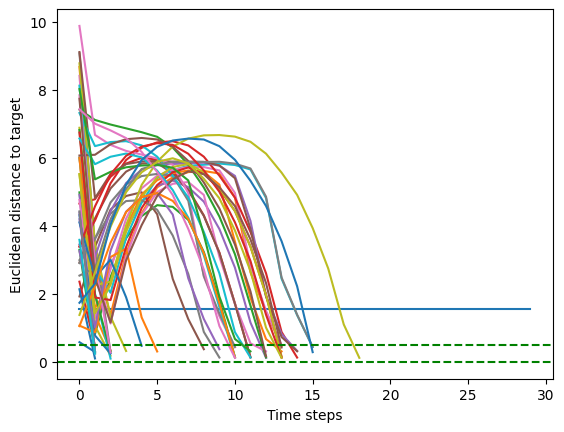

In [6]:
plt.plot(ref)
for i in range(50):
    plt.plot(euclids[i])
plt.axhline(y=0.5, color='g', linestyle='--')
plt.axhline(y=0, color='g', linestyle='--')
plt.plot()
plt.xlabel('Time steps')
plt.ylabel('Euclidean distance to target')
plt.show()

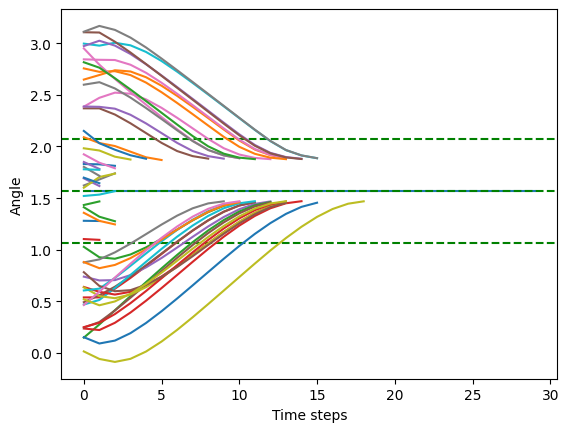

In [7]:
plt.plot(ref)
plt.axhline(y=1.07, color='g', linestyle='--')
plt.axhline(y=1.57, color='g', linestyle='--')
plt.axhline(y=2.07, color='g', linestyle='--')
for i in range(50):
    plt.plot(dims0[i])
plt.plot()
plt.xlabel('Time steps')
plt.ylabel('Angle')
plt.show()

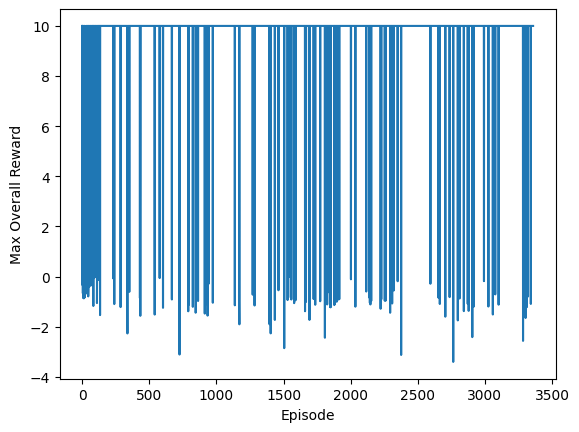

In [9]:
plt.plot(reward_history)
plt.xlabel('Episode')
plt.ylabel('Max Overall Reward')
plt.show()